# DO NOT EDIT THIS CODE ANY MORE. THIS IS WHAT WAS USED FOR THE DISSERTATION OF JONATHAN FELIX FOR SUBMISSION TO KECK GRADUATE INSTITUTE for PhD of Applied Life Sciences in 2026.

In [1]:
pip install biopython

Note: you may need to restart the kernel to use updated packages.


In [2]:
#Extract RBM site AAs from haplotype FASTA

In [3]:
from pathlib import Path

from Bio import SeqIO
from Bio.Seq import Seq
import pandas as pd

# Input and output directories
IN_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/dedup/Singles/Singles")
OUT_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables")

# Make sure output directory exists
OUT_DIR.mkdir(parents=True, exist_ok=True)

print("Input dir exists:", IN_DIR.exists())
print("Output dir:", OUT_DIR)


Input dir exists: True
Output dir: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables


In [4]:
from Bio.Seq import Seq

# Primers from your yeast/RBD amplicon notebook
FWD = "GTACCGTCTGTTCCGTAAAAGCAA"    # forward primer (top strand)
REV = "CCTCGAGCGTTGATTTCTTCGGCC"    # reverse primer (top strand)


def revcomp(s: str) -> str:
    return str(Seq(s).reverse_complement())


def orient_to_top(seq_nt: str) -> str:
    """
    Orient a haplotype to the top strand using FWD/REV primers.

    Logic:
      - If we see FWD or rc(REV) in the sequence, treat as already top.
      - If we see REV or rc(FWD), treat as bottom and reverse-complement.
      - Otherwise, leave as-is (can tighten later if needed).
    """
    s = seq_nt.upper()
    rc_s = revcomp(s)

    # Already top: contains FWD or reverse-complement of REV
    if FWD in s or revcomp(REV) in s:
        return s

    # Bottom: contains REV (top-strand) or reverse-complement of FWD
    if REV in s or revcomp(FWD) in s:
        return rc_s

    # Fallback: leave as-is
    return s


In [5]:
# 0-based nucleotide indices for codon starts, on this amplicon
codon_starts = {
    477: 73,
    478: 76,
    484: 94,
    493: 121,
    496: 130,
    498: 136,
    501: 145,
    505: 157,
}

def call_site_aa(seq: str, nt_start: int):
    """Return AA at codon starting at nt_start (0-based), or None if incomplete/ambiguous."""
    if nt_start + 3 > len(seq):
        return None
    codon = seq[nt_start:nt_start+3]
    # Require standard bases only
    if any(b not in "ACGTacgt" for b in codon):
        return None
    return str(Seq(codon).translate(table=1))


In [6]:
def revcomp(s: str) -> str:
    return str(Seq(s).reverse_complement())


def orient_to_top(seq_nt: str) -> str:
    """
    Orient a haplotype to the top strand using FWD/REV primers.

    Logic:
      - If we see FWD or rc(REV) in the sequence, treat it as already top.
      - If we see REV or rc(FWD), treat it as bottom and reverse-complement.
      - Otherwise, leave as-is (you can tighten this later if needed).
    """
    s = seq_nt.upper()
    rc_s = revcomp(s)

    # Already top: contains FWD or the reverse-complement of the reverse primer
    if FWD in s or revcomp(REV) in s:
        return s

    # Bottom: contains REV (top-strand sequence) or rc(FWD)
    if REV in s or revcomp(FWD) in s:
        return rc_s

    # Fallback: leave it alone (or choose rc_s if you prefer)
    return s


In [7]:
def add_position_calls(df: pd.DataFrame) -> pd.DataFrame:
    # 1) Orient all haplotypes to the top strand first
    df["sequence_oriented"] = df["sequence"].apply(orient_to_top)

    # 2) Call codon-based AAs using the oriented sequence
    for site, start in codon_starts.items():
        col = f"aa_{site}"
        df[col] = df["sequence_oriented"].apply(
            lambda s, st=start: call_site_aa(s, st)
        )

    aa_cols = [c for c in df.columns if c.startswith("aa_")]
    df["complete_sites"] = df[aa_cols].notna().all(axis=1)
    return df


In [8]:
from pathlib import Path
import pandas as pd

# Input directory: deduplicated TSVs from vsearch
TSV_DIR = IN_DIR   # IN_DIR was already set earlier to the Singles/Singles directory

# Output directory: where position tables go
OUT_DIR.mkdir(parents=True, exist_ok=True)

# Find all vsearch output tables
tsv_files = sorted(TSV_DIR.glob("*.unique.tsv"))
print(f"Found {len(tsv_files)} deduplicated TSV files")

for tsv_path in tsv_files:
    print(f"\nProcessing: {tsv_path.name}")

    # 1) Load deduplicated haplotypes and counts from vsearch
    # Columns: sequence, count
    df = pd.read_csv(tsv_path, sep="\t")

    # 2) Rename 'count' to 'umi_count' for compatibility with downstream code
    df = df.rename(columns={"count": "umi_count"})

    # 3) Add sample name
    sample_name = tsv_path.stem.replace(".unique", "")
    df["sample"] = sample_name

    # 4) Add AA calls and orientation
    df = add_position_calls(df)

    # 5) Keep only complete RBM-haplotypes
    df_complete = df[df["complete_sites"]].copy()

    # 6) Save position table
    out_name = sample_name + "_positions.csv"
    out_path = OUT_DIR / out_name
    df_complete.to_csv(out_path, index=False)

    print(f"  ✓ saved {len(df_complete)} rows to {out_path}")


Found 24 deduplicated TSV files

Processing: Library-1-Neg-1.unique.tsv
  ✓ saved 1514500 rows to /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-1-Neg-1_positions.csv

Processing: Library-1-Neg-2.unique.tsv
  ✓ saved 3526 rows to /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-1-Neg-2_positions.csv

Processing: Library-1-Neg-3.unique.tsv
  ✓ saved 1696681 rows to /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-1-Neg-3_positions.csv

Processing: Library-1-Pos-1.unique.tsv
  ✓ saved 348969 rows to /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-1-Pos-1_positions.csv

Processing: Library-1-Pos-2.unique.tsv
  ✓ saved 39684 rows to /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-1-Pos-2_positions.csv

Processing: Library-1-Pos-3.unique.tsv
  ✓ saved 1113585 rows to /Users/jonathanfelix/Documents/Yeast_Lib_Final_D

In [9]:
# Inspect one output file
test_path = next(OUT_DIR.glob("*_positions.csv"))
df_test = pd.read_csv(test_path)

df_complete = df_test[df_test["complete_sites"]].copy()
print("Complete haplotypes:", len(df_complete))
df_complete.head()


Complete haplotypes: 39684


,sequence,umi_count,sample,sequence_oriented,aa_477,aa_478,aa_484,aa_493,aa_496,aa_498,aa_501,aa_505,complete_sites
0,CCTCGAGCGTTGATTTCTTCGGCCCGCATACGGTTGCGGGCGCGTG...,11817,Library-1-Pos-2,GTACCGTCTGTTCCGTAAAAGCAATTTGAAACCATTTGAAAGAGAC...,S,T,E,Q,G,Q,N,Y,True
1,GTACCGTCTGTTCCGTAAAAGCAATTTGAAACCATTTGAAAGAGAC...,9052,Library-1-Pos-2,GTACCGTCTGTTCCGTAAAAGCAATTTGAAACCATTTGAAAGAGAC...,N,K,E,R,S,R,Y,H,True
2,CCTCGAGCGTTGATTTCTTCGGCCCGCATACGGTTGCGGGCGCGTG...,5678,Library-1-Pos-2,GTACCGTCTGTTCCGTAAAAGCAATTTGAAACCATTTGAAAGAGAC...,S,T,E,R,S,R,Y,H,True
3,CCTCGAGCGTTGATTTCTTCGGCCCGCATACGGTTGCGGGCGCGTG...,5017,Library-1-Pos-2,GTACCGTCTGTTCCGTAAAAGCAATTTGAAACCATTTGAAAGAGAC...,N,T,E,R,S,R,Y,H,True
4,CCTCGAGCGTTGATTTCTTCGGCCCGCATACGGTTGCGGGCGCGTG...,4588,Library-1-Pos-2,GTACCGTCTGTTCCGTAAAAGCAATTTGAAACCATTTGAAAGAGAC...,S,K,E,Q,G,Q,Y,Y,True


In [102]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

POS_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables")
FIG_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots")
FIG_DIR.mkdir(parents=True, exist_ok=True)

sites = [477, 478, 484, 493, 496, 498, 501, 505]

all_rows = []

pos_files = sorted(POS_DIR.glob("*_positions.csv"))
print(f"Found {len(pos_files)} position tables")

for pos_path in pos_files:
    print("Processing:", pos_path.name)
    
    df = pd.read_csv(pos_path)
    
    # Optional: keep only complete rows
    if "complete_sites" in df.columns:
        df = df[df["complete_sites"] == True].copy()
    
    sample_name = pos_path.stem.replace("_positions", "")
    
    for site in sites:
        col = f"aa_{site}"
        if col not in df.columns:
            continue
        
        # Treat missing as '?'
        aa_series = df[col].fillna("?")
        
        # Count occurrences of each AA
        counts = aa_series.value_counts().reset_index()
        counts.columns = ["aa", "umi_count"]   # <-- KEY FIX
        
        counts["sample"] = sample_name
        counts["site"] = site
        
        all_rows.append(counts)

aa_all = pd.concat(all_rows, ignore_index=True)
aa_all.head()
# Which sites are actually present, and how many AA-rows per site?
aa_all.groupby(["sample", "site"])["umi_count"].sum().unstack("site")




Found 24 position tables
Processing: Library-1-Neg-1_positions.csv
Processing: Library-1-Neg-2_positions.csv
Processing: Library-1-Neg-3_positions.csv
Processing: Library-1-Pos-1_positions.csv
Processing: Library-1-Pos-2_positions.csv
Processing: Library-1-Pos-3_positions.csv
Processing: Library-1-Pre-1_positions.csv
Processing: Library-1-Pre-2_positions.csv
Processing: Library-1-Pre-3_positions.csv
Processing: Library-2-Neg-1_positions.csv
Processing: Library-2-Neg-2_positions.csv
Processing: Library-2-Neg-3_positions.csv
Processing: Library-2-Pos-2_positions.csv
Processing: Library-2-Pos-3_positions.csv
Processing: Library-2-Pre-1_positions.csv
Processing: Library-2-Pre-2_positions.csv
Processing: Library-2-Pre-3_positions.csv
Processing: Library-3-Neg-2_positions.csv
Processing: Library-3-Neg-3_positions.csv
Processing: Library-3-Pos-1_positions.csv
Processing: Library-3-Pos-2_positions.csv
Processing: Library-3-Pos-3_positions.csv
Processing: Library-3-Pre-2_positions.csv
Processin

site,477,478,484,493,496,498,501,505
sample,,,,,,,,
Library-1-Neg-1,1514500,1514500,1514500,1514500,1514500,1514500,1514500,1514500
Library-1-Neg-2,3526,3526,3526,3526,3526,3526,3526,3526
Library-1-Neg-3,1696681,1696681,1696681,1696681,1696681,1696681,1696681,1696681
Library-1-Pos-1,348969,348969,348969,348969,348969,348969,348969,348969
Library-1-Pos-2,39684,39684,39684,39684,39684,39684,39684,39684
Library-1-Pos-3,1113585,1113585,1113585,1113585,1113585,1113585,1113585,1113585
Library-1-Pre-1,278513,278513,278513,278513,278513,278513,278513,278513
Library-1-Pre-2,20777,20777,20777,20777,20777,20777,20777,20777
Library-1-Pre-3,2129186,2129186,2129186,2129186,2129186,2129186,2129186,2129186


In [103]:
aa_all["total_site_sample"] = (
    aa_all.groupby(["sample", "site"])["umi_count"].transform("sum")
)

aa_all["frequency"] = aa_all["umi_count"] / aa_all["total_site_sample"]

aa_all.head()


,aa,umi_count,sample,site,total_site_sample,frequency
0,N,612436,Library-1-Neg-1,477,1514500,0.404382
1,S,588050,Library-1-Neg-1,477,1514500,0.388280
2,P,72710,Library-1-Neg-1,477,1514500,0.048009
3,I,31939,Library-1-Neg-1,477,1514500,0.021089
4,H,31192,Library-1-Neg-1,477,1514500,0.020596


In [104]:
import numpy as np
import matplotlib.pyplot as plt

# 20 canonical amino acids in a fixed order
AA_ORDER = list("ACDEFGHIKLMNPQRSTVWY")

# Get 20 distinct colors from a colormap
aa_colors = plt.cm.tab20(np.linspace(0, 1, len(AA_ORDER)))

# Map AA -> color
AA_COLOR_MAP = {aa: color for aa, color in zip(AA_ORDER, aa_colors)}

# Color for anything not in AA_ORDER (e.g., "OTHER")
OTHER_COLOR = "lightgray"


In [105]:
def plot_sample_site_composition(aa_all: pd.DataFrame, sample_name: str, fig_dir: Path):
    """
    For a given sample, plot stacked bars:
      x-axis: RBM sites (477, 478, ...)
      stacked colors: amino acids (up to 20 distinct colors)
      y-axis: frequency of each AA at that site in this sample
    """
    sub = aa_all[aa_all["sample"] == sample_name].copy()
    if sub.empty:
        print(f"No data for sample {sample_name}, skipping.")
        return
    
    # Drop '?' (uncalled/other) or keep it if you like; here we drop
    sub = sub[sub["aa"] != "?"].copy()
    
    # Pivot: sites as rows, AAs as columns
    plot_df = sub.pivot(index="site", columns="aa", values="frequency").fillna(0)
    
    # Sort sites numerically
    plot_df = plot_df.sort_index()
    
    # Optionally group very rare AAs into 'OTHER'
    threshold = 0.02
    common_aas = plot_df.columns[(plot_df > threshold).any()]
    rare_aas = plot_df.columns.difference(common_aas)
    
    if len(rare_aas) > 0:
        plot_df["OTHER"] = plot_df[rare_aas].sum(axis=1)
        plot_df = plot_df[common_aas.tolist() + (["OTHER"] if "OTHER" in plot_df.columns else [])]
    
    # Stacked bar plot
    plt.figure(figsize=(8, 5))
    x = plot_df.index.astype(str)
    bottom = np.zeros(len(plot_df), dtype=float)
    
    for aa in plot_df.columns:
        values = plot_df[aa].values
        # Choose color: 20-AA map for standard residues, gray for OTHER
        color = AA_COLOR_MAP.get(aa, OTHER_COLOR)
        plt.bar(x, values, bottom=bottom, label=aa, color=color)
        bottom = bottom + values
    
    plt.xlabel("RBM position")
    plt.ylabel("Frequency")
    plt.title(f"Amino acid composition by site – {sample_name}")
    plt.legend(title="AA", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    
    out_path = fig_dir / f"{sample_name}_AA_by_site.png"
    plt.savefig(out_path, dpi=300)
    plt.show()
    
    print(f"Saved figure for {sample_name} to: {out_path}")


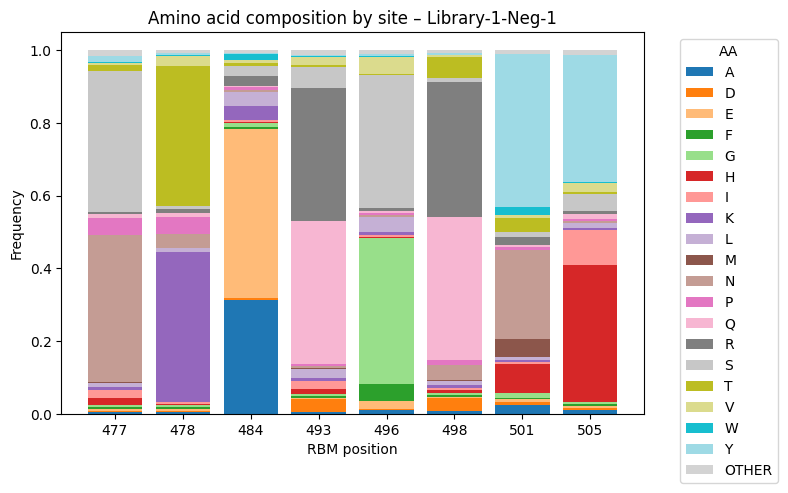

Saved figure for Library-1-Neg-1 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Neg-1_AA_by_site.png


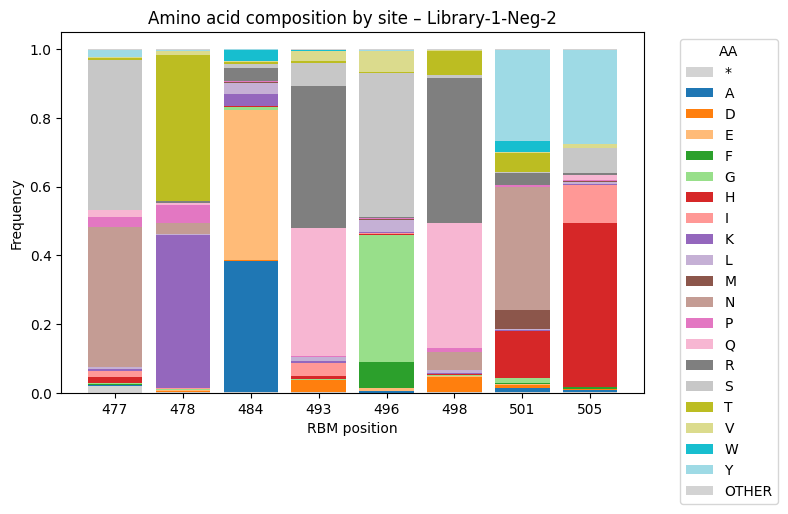

Saved figure for Library-1-Neg-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Neg-2_AA_by_site.png


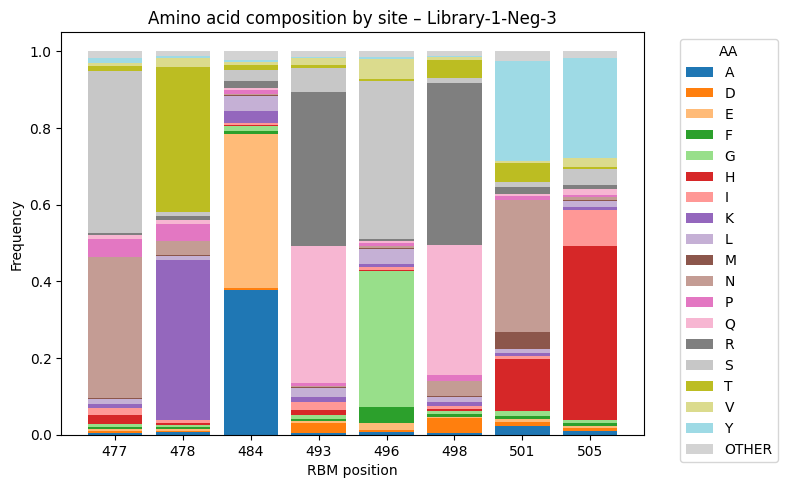

Saved figure for Library-1-Neg-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Neg-3_AA_by_site.png


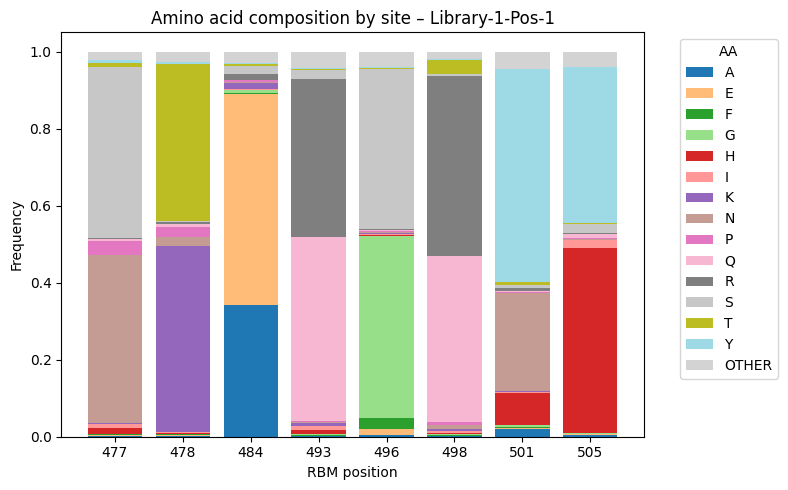

Saved figure for Library-1-Pos-1 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pos-1_AA_by_site.png


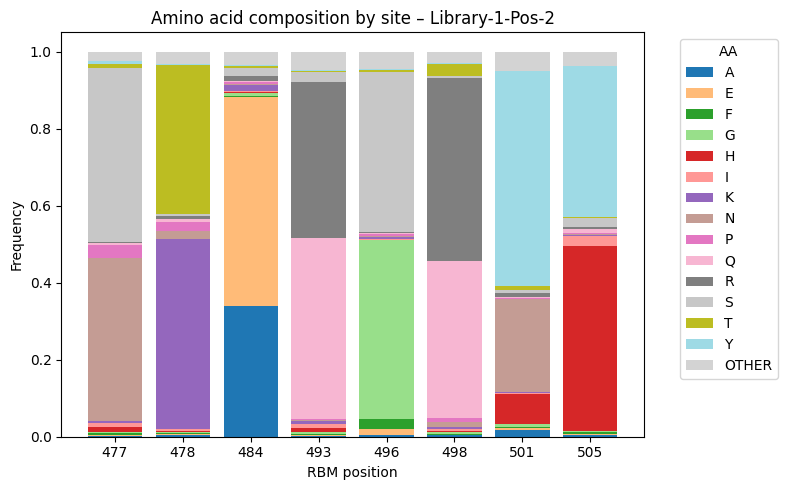

Saved figure for Library-1-Pos-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pos-2_AA_by_site.png


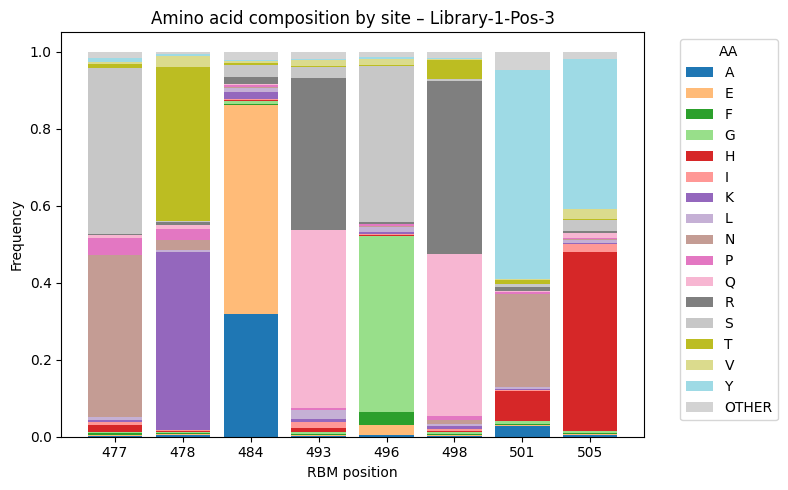

Saved figure for Library-1-Pos-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pos-3_AA_by_site.png


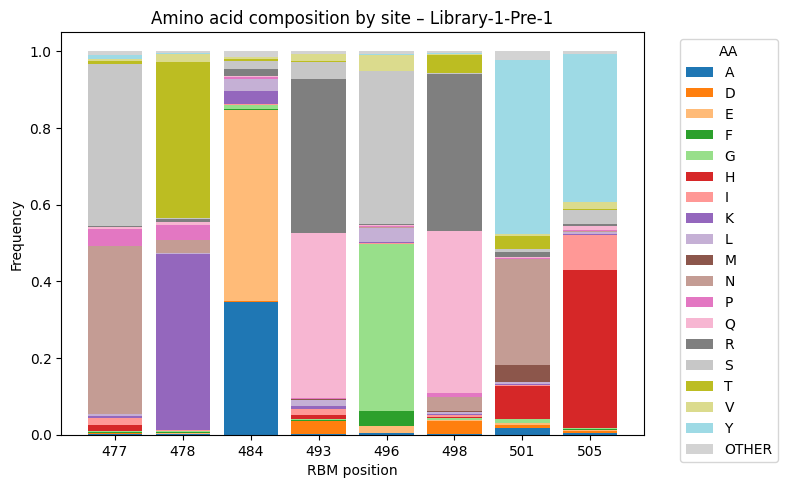

Saved figure for Library-1-Pre-1 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pre-1_AA_by_site.png


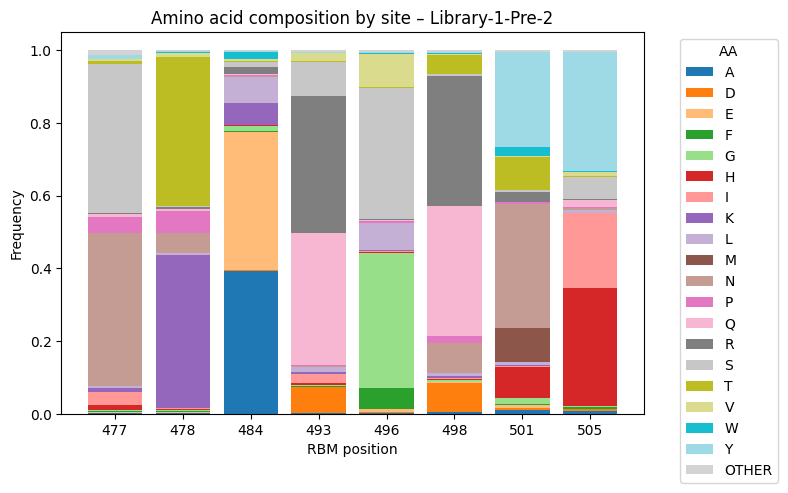

Saved figure for Library-1-Pre-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pre-2_AA_by_site.png


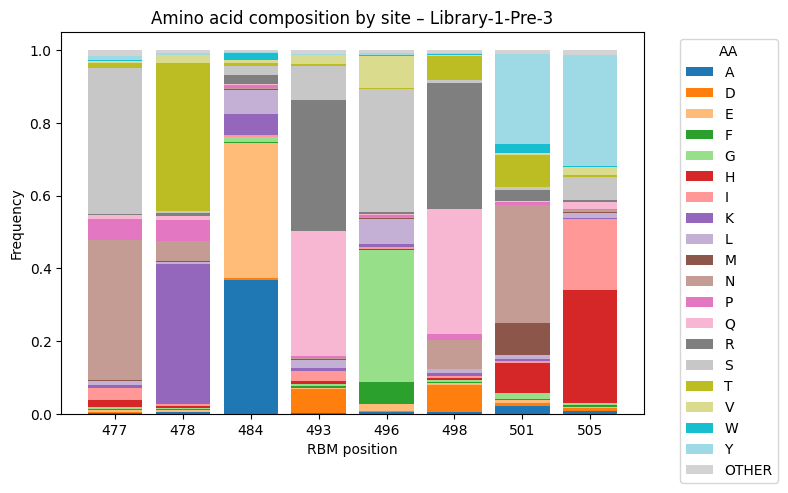

Saved figure for Library-1-Pre-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pre-3_AA_by_site.png


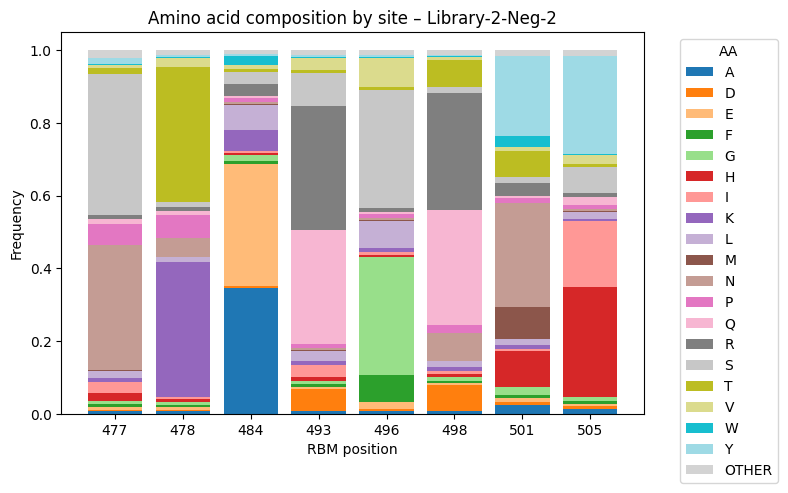

Saved figure for Library-2-Neg-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Neg-2_AA_by_site.png


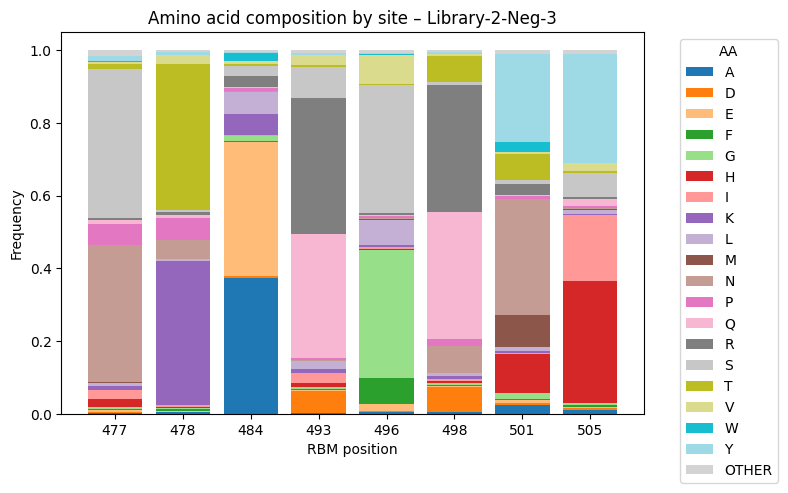

Saved figure for Library-2-Neg-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Neg-3_AA_by_site.png


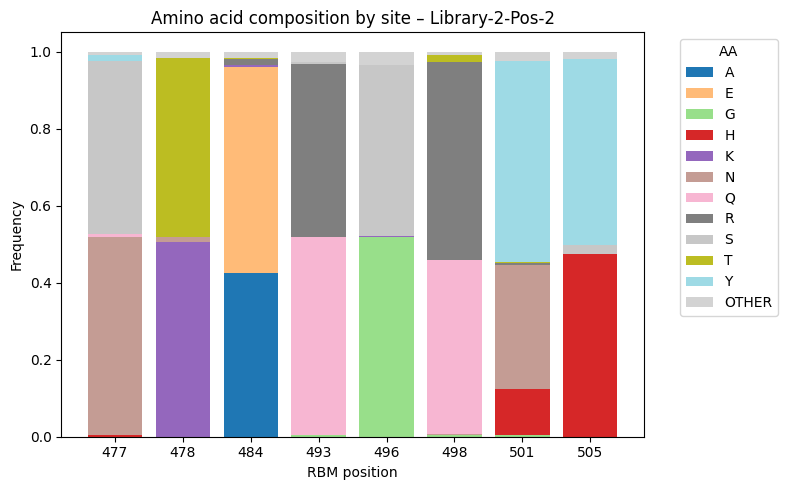

Saved figure for Library-2-Pos-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Pos-2_AA_by_site.png


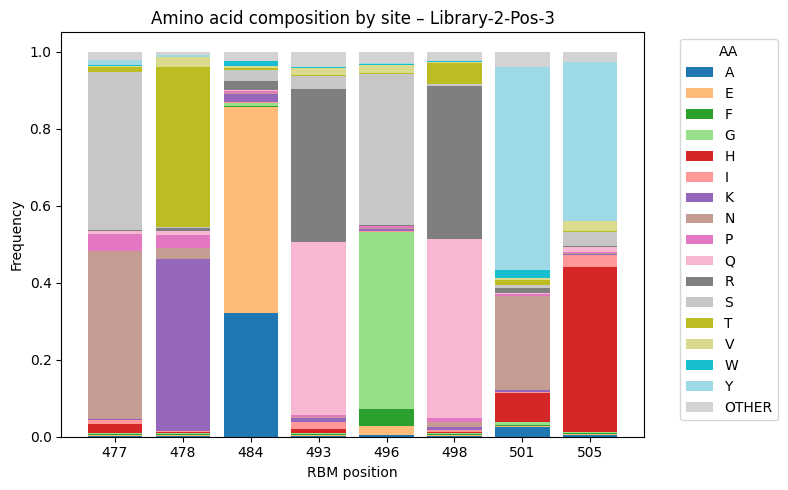

Saved figure for Library-2-Pos-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Pos-3_AA_by_site.png


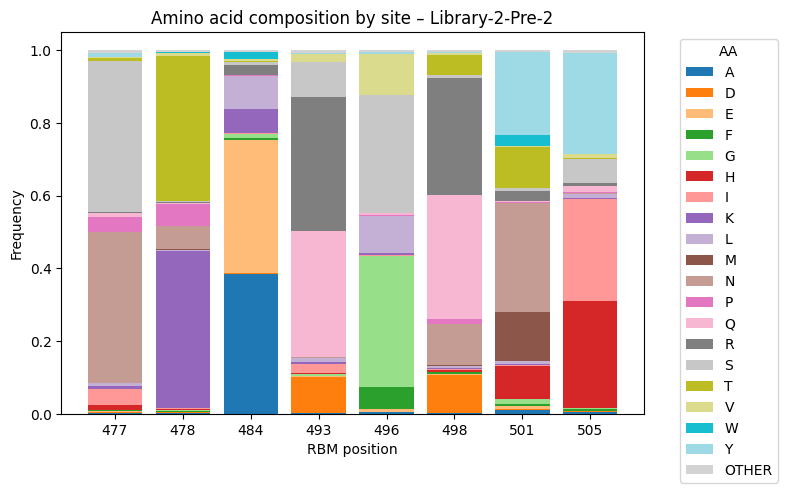

Saved figure for Library-2-Pre-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Pre-2_AA_by_site.png


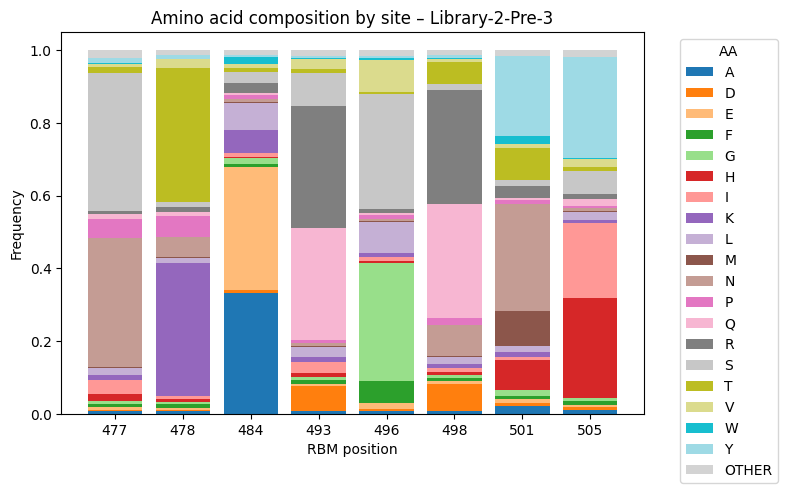

Saved figure for Library-2-Pre-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Pre-3_AA_by_site.png


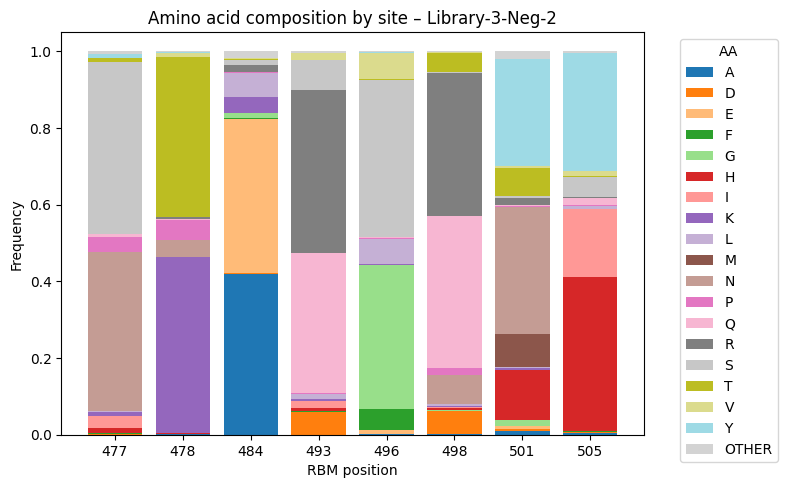

Saved figure for Library-3-Neg-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Neg-2_AA_by_site.png


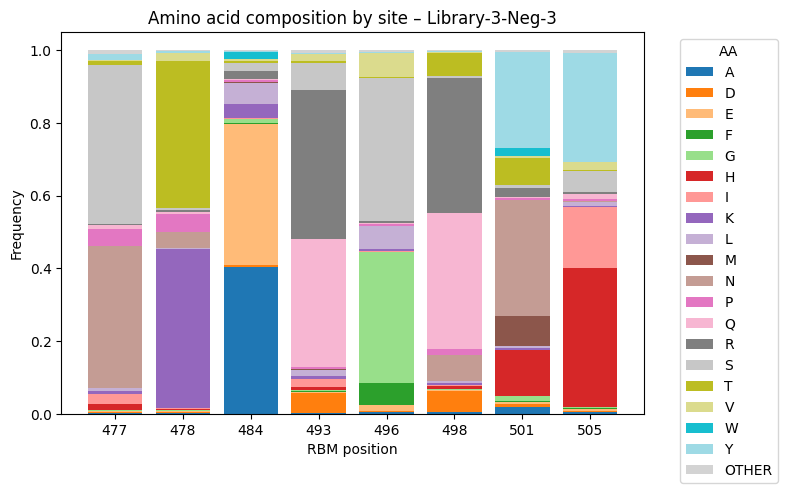

Saved figure for Library-3-Neg-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Neg-3_AA_by_site.png


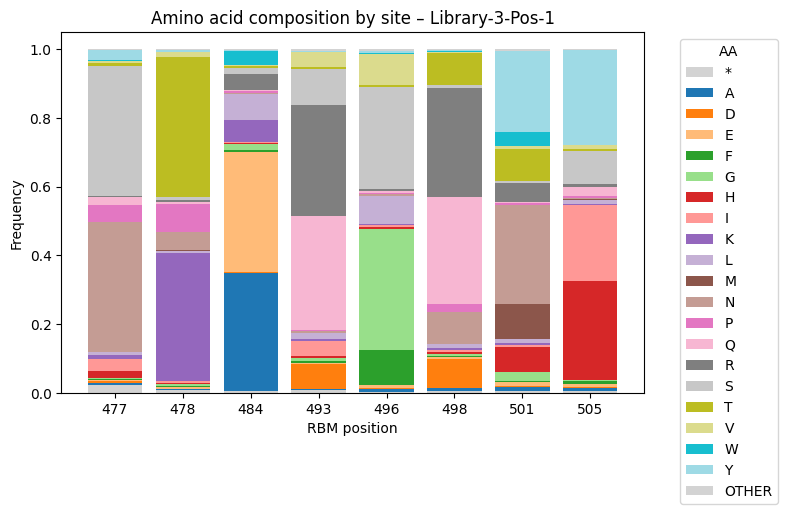

Saved figure for Library-3-Pos-1 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pos-1_AA_by_site.png


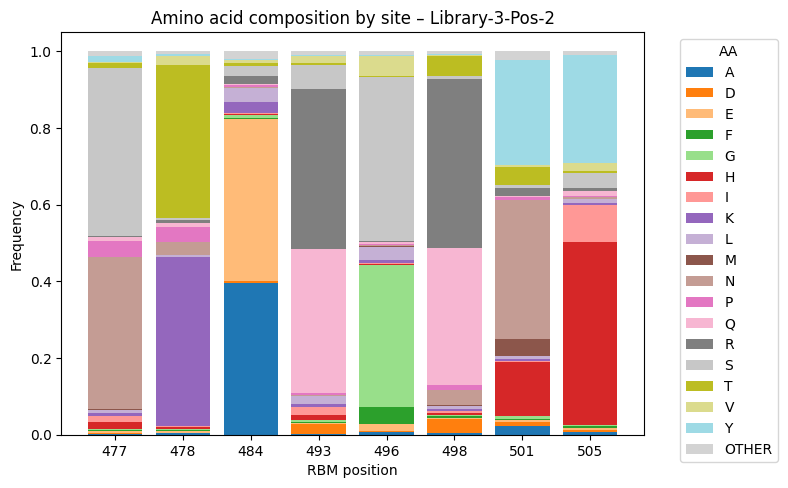

Saved figure for Library-3-Pos-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pos-2_AA_by_site.png


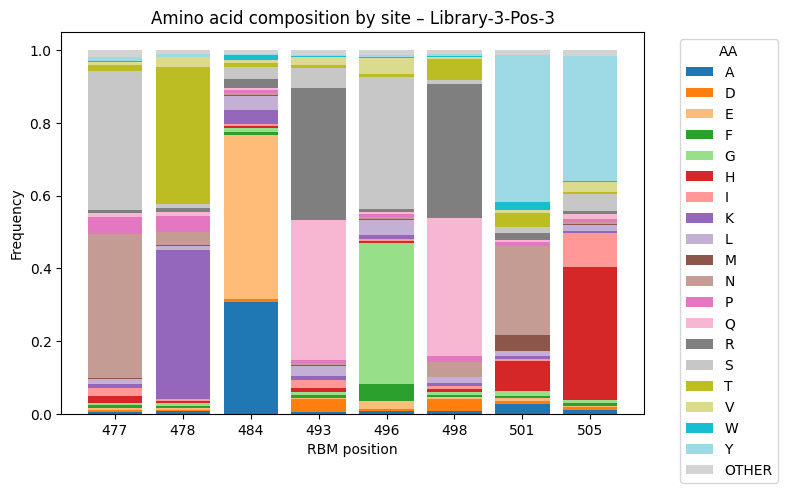

Saved figure for Library-3-Pos-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pos-3_AA_by_site.png


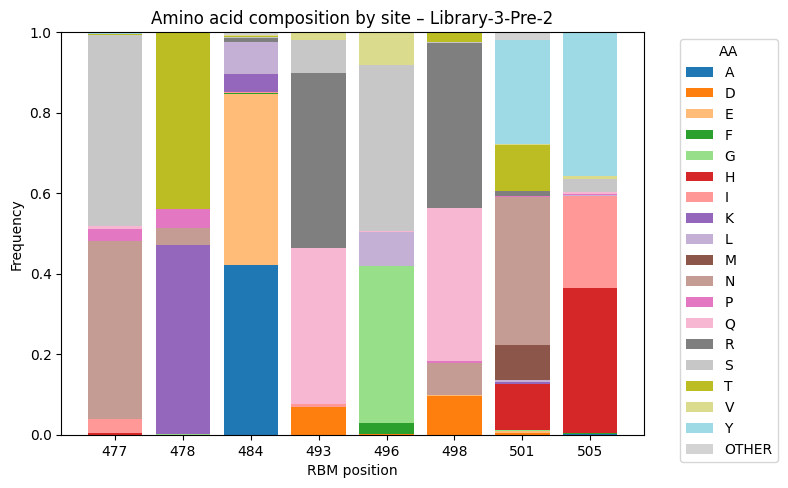

Saved figure for Library-3-Pre-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pre-2_AA_by_site.png


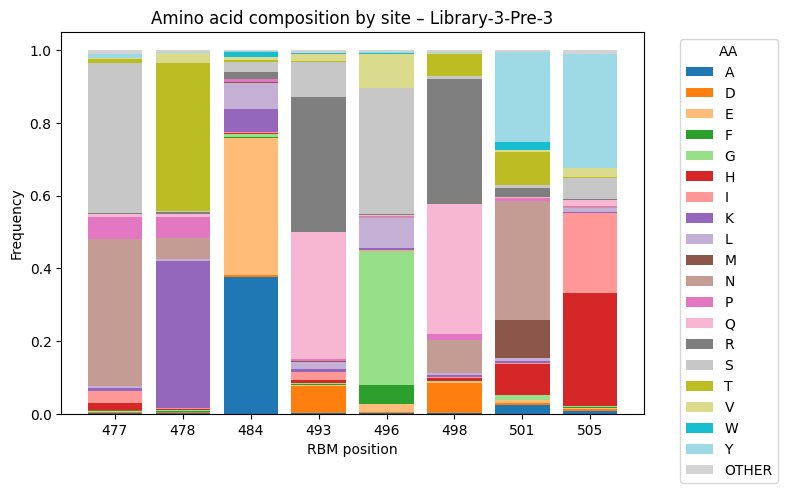

Saved figure for Library-3-Pre-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pre-3_AA_by_site.png


In [106]:
for sample_name in sorted(aa_all["sample"].unique()):
    plot_sample_site_composition(aa_all, sample_name, FIG_DIR)


In [113]:
# Wuhan AA at each site
wuhan_aa = {
    477: "S",
    478: "T",
    484: "E",
    493: "Q",
    496: "G",
    498: "Q",
    501: "N",
    505: "Y",
}

# Omicron AA at each site (BA.1-like)
omicron_aa = {
    477: "N",
    478: "K",
    484: "A",
    493: "R",
    496: "S",
    498: "R",
    501: "Y",
    505: "H",
}

sites = [477, 478, 484, 493, 496, 498, 501, 505]

# Allowed design AAs per position = Wuhan OR Omicron
allowed_aa = {
    pos: {wuhan_aa[pos], omicron_aa[pos]}
    for pos in sites
}


In [114]:
def call_sites_for_frame(seq: str, offset: int):
    """
    For a given sequence and frame offset (-1, 0, +1), 
    return dict: pos -> AA (or None if cannot call).
    """
    aa_dict = {}
    L = len(seq)
    for pos, base_start in codon_starts.items():
        nt_start = base_start + offset
        if nt_start < 0 or nt_start + 3 > L:
            aa_dict[pos] = None
        else:
            aa_dict[pos] = call_site_aa(seq, nt_start)
    return aa_dict


def score_frame(aa_dict: dict):
    """
    Count how many sites have AAs consistent with library design (Wuhan or Omicron).
    Returns (good, total_callable).
    """
    good = 0
    total = 0
    for pos, aa in aa_dict.items():
        if aa is None:
            continue
        total += 1
        if aa in allowed_aa[pos]:
            good += 1
    return good, total


def best_frame_for_seq(seq: str):
    """
    Try offsets -1, 0, +1; pick the frame with the highest 'good' score.
    Tie-breaker: prefer offset 0.
    Returns (best_offset, best_good, best_total, best_aa_dict).
    """
    best_offset = None
    best_good = -1
    best_total = 0
    best_aa_dict = None
    
    for offset in (-1, 0, 1):
        aa_dict = call_sites_for_frame(seq, offset)
        good, total = score_frame(aa_dict)
        
        if (good > best_good) or (good == best_good and best_offset is not None and offset == 0):
            best_good = good
            best_total = total
            best_offset = offset
            best_aa_dict = aa_dict
    
    return best_offset, best_good, best_total, best_aa_dict


In [115]:
def apply_best_frame_to_df(df: pd.DataFrame) -> pd.DataFrame:
    """
    For each row:
      - find best frame (offset -1/0/+1)
      - overwrite aa_XXX with AAs from that frame
      - record frame 'good' score and offset
    """
    def _annotate(seq):
        offset, good, total, aa_dict = best_frame_for_seq(seq)
        data = {
            "frame_offset": offset,
            "frame_good": good,
            "frame_total": total,
        }
        # add AA calls
        for pos in sites:
            data[f"aa_{pos}"] = aa_dict.get(pos)
        return pd.Series(data)
    
    frame_df = df["sequence_oriented"].apply(_annotate)
    # this will overwrite existing aa_XXX if they exist; if you want to keep originals, rename first
    for col in frame_df.columns:
        df[col] = frame_df[col]
    return df


In [116]:
def add_orientation(df: pd.DataFrame) -> pd.DataFrame:
    """
    Add a 'sequence_oriented' column with all haplotypes on the top strand.
    Assumes df has a 'sequence' column from the FASTA.
    """
    df["sequence_oriented"] = df["sequence"].apply(orient_to_top)
    return df


In [117]:
# Make sure df has been loaded already, e.g.:
# df = pd.read_csv(POS_DIR / "Library-1-Neg-1_positions.csv")

# 1) Ensure orientation exists (usually already there, but safe)
if "sequence_oriented" not in df.columns:
    df = add_orientation(df)

# 2) Apply frame search (-1, 0, +1) to create frame_good, frame_offset, etc.
df = apply_best_frame_to_df(df)

# 3) Now we can safely define and use is_on_design_row

def is_on_design_row(row):
    # require at least 6 of 8 positions to be design-consistent, for example
    if row["frame_good"] < 6:
        return False
    for pos in sites:
        aa = row.get(f"aa_{pos}")
        if not isinstance(aa, str):
            return False
        if aa not in allowed_aa[pos]:
            return False
    return True

df["on_design"] = df.apply(is_on_design_row, axis=1)


NameError: name 'codon_starts' is not defined

In [118]:
df_on = df[df["on_design"]].copy()
print("Total UMIs:", len(df), "On-design:", len(df_on))


KeyError: 'on_design'

In [119]:
df["frame_offset"].value_counts()
df["frame_good"].value_counts()


KeyError: 'frame_offset'

In [120]:
def is_on_design_row(row):
    # e.g. require frame_good >= 7 instead of 6
    if row["frame_good"] < 8:
        return False
    for pos in sites:
        aa = row.get(f"aa_{pos}")
        if not isinstance(aa, str):
            return False
        if aa not in allowed_aa[pos]:
            return False
    return True


In [121]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

POS_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables")
FIG_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots")
FIG_DIR.mkdir(parents=True, exist_ok=True)

sites = [477, 478, 484, 493, 496, 498, 501, 505]

# 20 AA color map
AA_ORDER = list("ACDEFGHIKLMNPQRSTVWY")
aa_colors = plt.cm.tab20(np.linspace(0, 1, len(AA_ORDER)))
AA_COLOR_MAP = {aa: color for aa, color in zip(AA_ORDER, aa_colors)}
OTHER_COLOR = "lightgray"

def add_orientation(df: pd.DataFrame) -> pd.DataFrame:
    df["sequence_oriented"] = df["sequence"].apply(orient_to_top)
    return df

def apply_best_frame_to_df(df: pd.DataFrame) -> pd.DataFrame:
    """
    For each row:
      - find best frame (offset -1/0/+1)
      - record frame_offset, frame_good, frame_total
      - write AA calls for each site into aa_XXX columns
    """
    def _annotate(seq):
        offset, good, total, aa_dict = best_frame_for_seq(seq)
        data = {
            "frame_offset": offset,
            "frame_good": good,
            "frame_total": total,
        }
        for pos in sites:
            data[f"aa_{pos}"] = aa_dict.get(pos)
        return pd.Series(data)

    # Apply to each oriented sequence
    result = df["sequence_oriented"].apply(_annotate)

    # If pandas gave us a Series of dicts/Series instead of a DataFrame, fix it
    if isinstance(result, pd.Series):
        result = result.apply(pd.Series)

    frame_df = result

    for col in frame_df.columns:
        df[col] = frame_df[col]

    return df


all_rows = []

pos_files = sorted(POS_DIR.glob("*_positions.csv"))
print(f"Found {len(pos_files)} position tables")

for pos_path in pos_files:
    print("Processing:", pos_path.name)
    
    try:
        df = pd.read_csv(pos_path)

        if "sequence" not in df.columns:
            raise ValueError(f"'sequence' column not found in {pos_path.name}")
        
        sample_name = pos_path.stem.replace("_positions", "")
        df["sample"] = sample_name

        # Ensure orientation
        if "sequence_oriented" not in df.columns:
            df = add_orientation(df)

        # Frame search
        df = apply_best_frame_to_df(df)

        # Strict design filtering (or keep frame_good == 8, your choice)
        df["on_design"] = df.apply(is_on_design_row, axis=1)
        df = df[df["on_design"]].copy()

        print(f"  total rows after on_design filter: {len(df)}")

        for site in sites:
            col = f"aa_{site}"
            if col not in df.columns:
                continue
            
            aa_series = df[col].fillna("?")
            counts = aa_series.value_counts().reset_index()
            counts.columns = ["aa", "umi_count"]
            counts["sample"] = sample_name
            counts["site"] = site

            all_rows.append(counts)

    except Exception as e:
        print(f"  !! Error processing {pos_path.name}: {e}")
        # skip this file and continue to next
        continue

aa_all = pd.concat(all_rows, ignore_index=True)
aa_all["total_site_sample"] = (
    aa_all.groupby(["sample", "site"])["umi_count"].transform("sum")
)
aa_all["frequency"] = aa_all["umi_count"] / aa_all["total_site_sample"]


# Within-sample/site frequencies
aa_all["total_site_sample"] = (
    aa_all.groupby(["sample", "site"])["umi_count"].transform("sum")
)
aa_all["frequency"] = aa_all["umi_count"] / aa_all["total_site_sample"]

aa_all.head()


Found 24 position tables
Processing: Library-1-Neg-1_positions.csv
  !! Error processing Library-1-Neg-1_positions.csv: name 'codon_starts' is not defined
Processing: Library-1-Neg-2_positions.csv
  !! Error processing Library-1-Neg-2_positions.csv: name 'codon_starts' is not defined
Processing: Library-1-Neg-3_positions.csv
  !! Error processing Library-1-Neg-3_positions.csv: name 'codon_starts' is not defined
Processing: Library-1-Pos-1_positions.csv
  !! Error processing Library-1-Pos-1_positions.csv: name 'codon_starts' is not defined
Processing: Library-1-Pos-2_positions.csv
  !! Error processing Library-1-Pos-2_positions.csv: name 'codon_starts' is not defined
Processing: Library-1-Pos-3_positions.csv
  !! Error processing Library-1-Pos-3_positions.csv: name 'codon_starts' is not defined
Processing: Library-1-Pre-1_positions.csv
  !! Error processing Library-1-Pre-1_positions.csv: name 'codon_starts' is not defined
Processing: Library-1-Pre-2_positions.csv
  !! Error processing L

KeyboardInterrupt: 

In [122]:
list(POS_DIR.glob("*_positions.csv"))


[PosixPath('/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-1-Pos-2_positions.csv'),
 PosixPath('/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-2-Pre-1_positions.csv'),
 PosixPath('/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-1-Neg-1_positions.csv'),
 PosixPath('/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-2-Neg-1_positions.csv'),
 PosixPath('/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-3-Pos-2_positions.csv'),
 PosixPath('/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-1-Pre-1_positions.csv'),
 PosixPath('/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-2-Pos-2_positions.csv'),
 PosixPath('/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables/Library-2-Neg-2_positions.csv'),
 PosixPath('/Users/jonathanfelix

In [123]:
# 20 canonical amino acids
AA_ORDER = list("ACDEFGHIKLMNPQRSTVWY")

aa_colors = plt.cm.tab20(np.linspace(0, 1, len(AA_ORDER)))
AA_COLOR_MAP = {aa: color for aa, color in zip(AA_ORDER, aa_colors)}

OTHER_COLOR = "lightgray"  # for "OTHER" bucket if we group rare AAs


In [124]:
def plot_sample_site_composition(aa_all: pd.DataFrame, sample_name: str, fig_dir: Path):
    sub = aa_all[aa_all["sample"] == sample_name].copy()
    if sub.empty:
        print(f"No data for sample {sample_name}, skipping.")
        return
    
    # Drop '?' if you don't want uncalled AAs in the plot
    sub = sub[sub["aa"] != "?"].copy()
    
    plot_df = sub.pivot(index="site", columns="aa", values="frequency").fillna(0)
    plot_df = plot_df.sort_index()
    
    threshold = 0.02
    common_aas = plot_df.columns[(plot_df > threshold).any()]
    rare_aas = plot_df.columns.difference(common_aas)
    
    if len(rare_aas) > 0:
        plot_df["OTHER"] = plot_df[rare_aas].sum(axis=1)
        plot_df = plot_df[common_aas.tolist() + (["OTHER"] if "OTHER" in plot_df.columns else [])]
    
    x = plot_df.index.astype(str)
    bottom = np.zeros(len(plot_df), dtype=float)
    
    plt.figure(figsize=(8, 5))
    
    for aa in plot_df.columns:
        values = plot_df[aa].values
        color = AA_COLOR_MAP.get(aa, OTHER_COLOR)
        plt.bar(x, values, bottom=bottom, label=aa, color=color)
        bottom = bottom + values
    
    plt.xlabel("RBM position")
    plt.ylabel("Frequency")
    plt.title(f"Amino acid composition by site – {sample_name}\n(frame_good == 8 only, recomputed)")
    plt.legend(title="AA", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    
    out_path = fig_dir / f"{sample_name}_AA_by_site_cleaned.png"
    plt.savefig(out_path, dpi=300)
    plt.show()
    
    print(f"Saved figure for {sample_name} to: {out_path}")


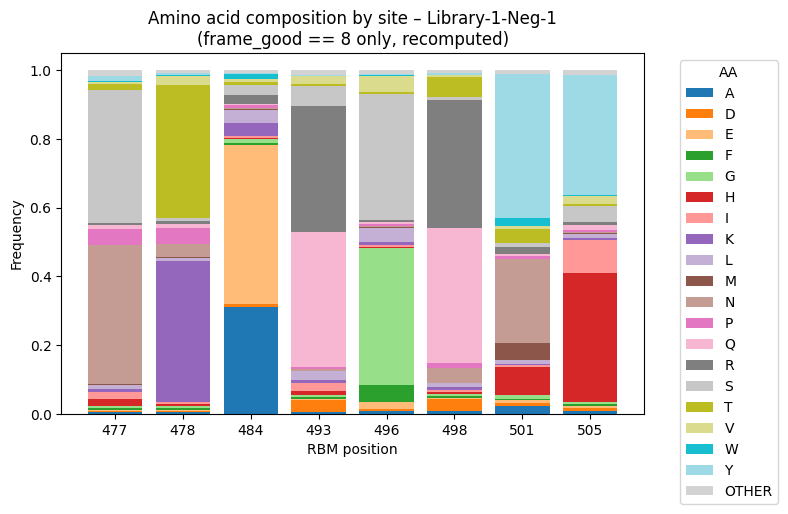

Saved figure for Library-1-Neg-1 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Neg-1_AA_by_site_cleaned.png


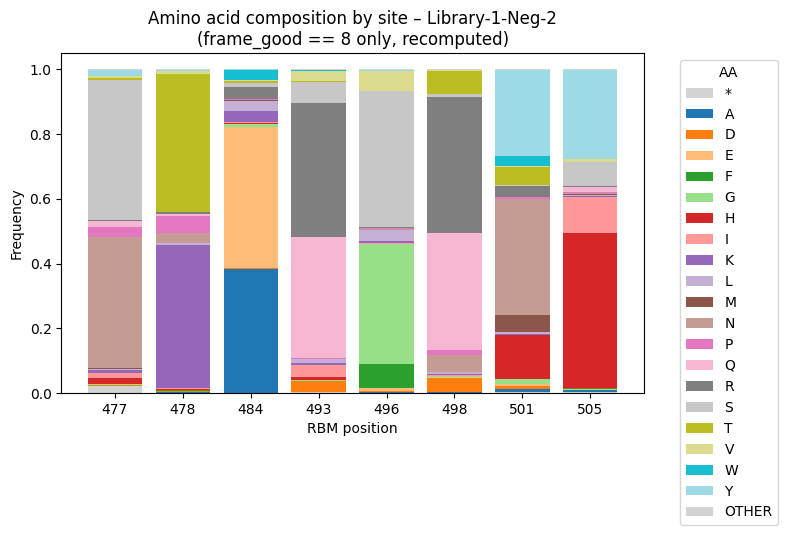

Saved figure for Library-1-Neg-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Neg-2_AA_by_site_cleaned.png


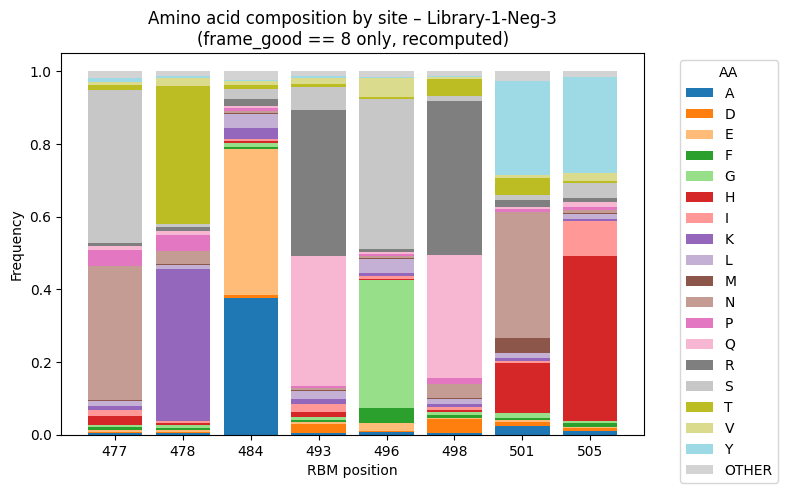

Saved figure for Library-1-Neg-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Neg-3_AA_by_site_cleaned.png


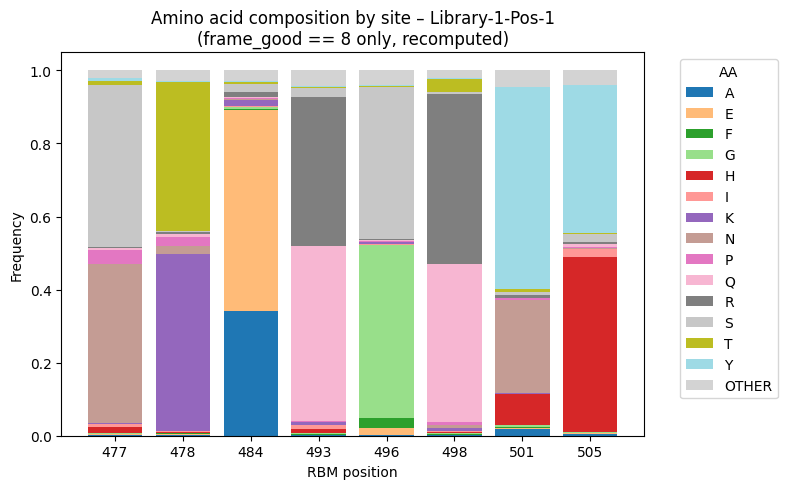

Saved figure for Library-1-Pos-1 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pos-1_AA_by_site_cleaned.png


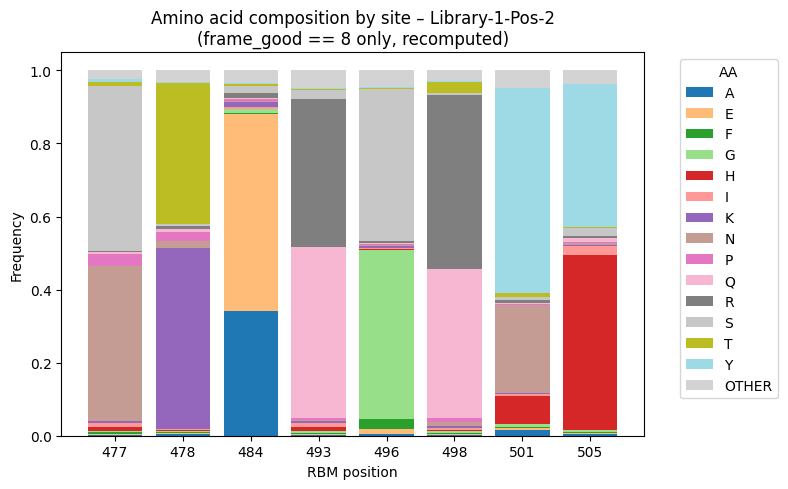

Saved figure for Library-1-Pos-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pos-2_AA_by_site_cleaned.png


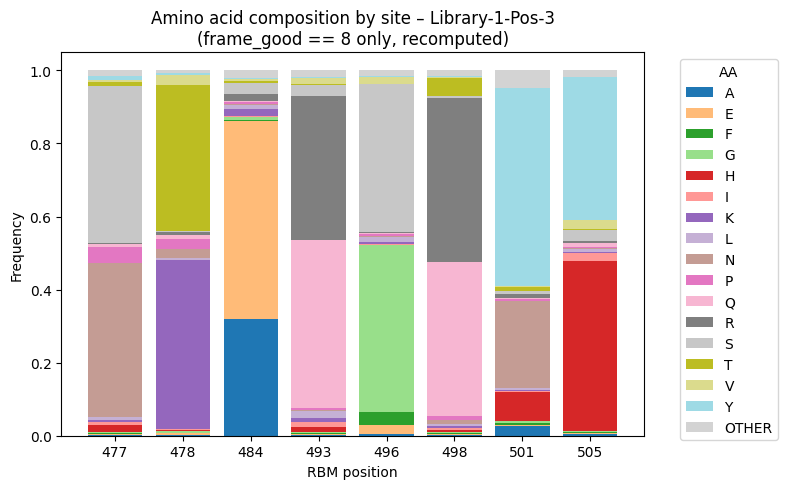

Saved figure for Library-1-Pos-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pos-3_AA_by_site_cleaned.png


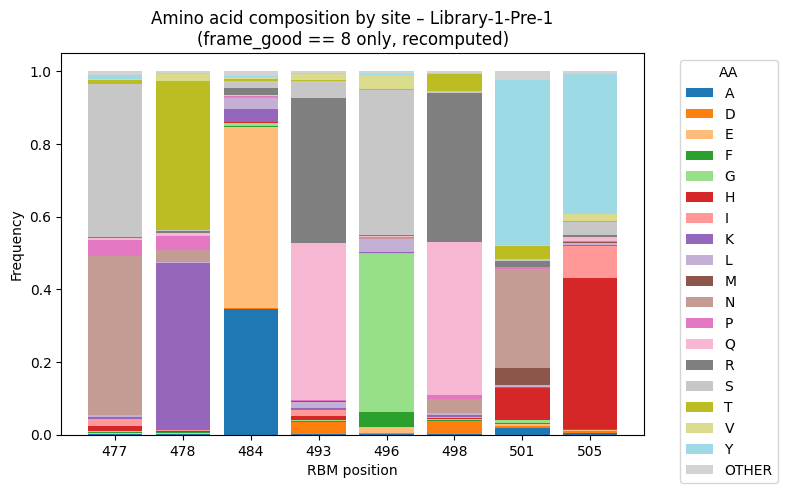

Saved figure for Library-1-Pre-1 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pre-1_AA_by_site_cleaned.png


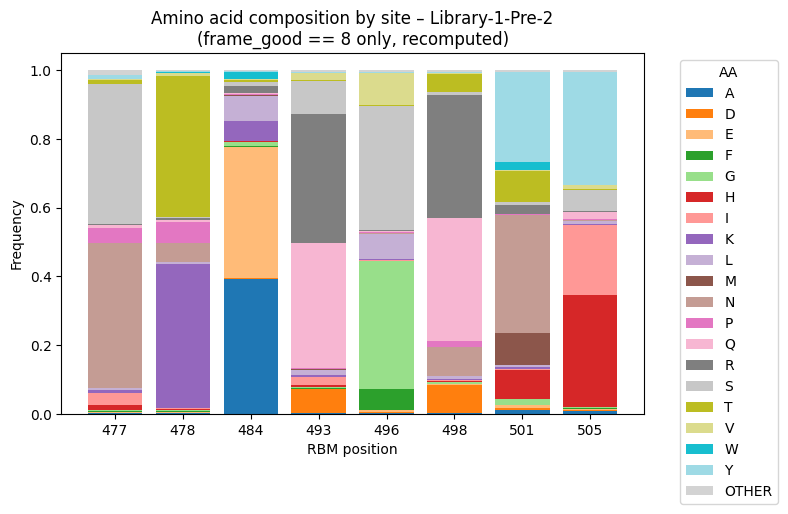

Saved figure for Library-1-Pre-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pre-2_AA_by_site_cleaned.png


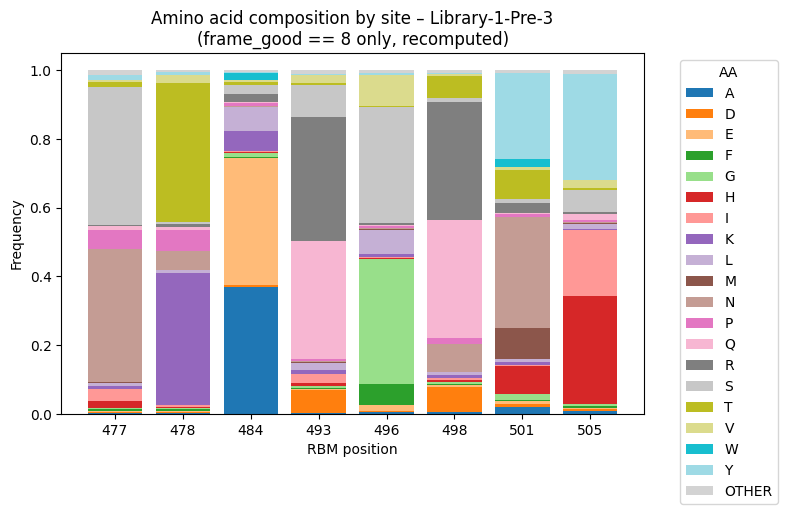

Saved figure for Library-1-Pre-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-1-Pre-3_AA_by_site_cleaned.png


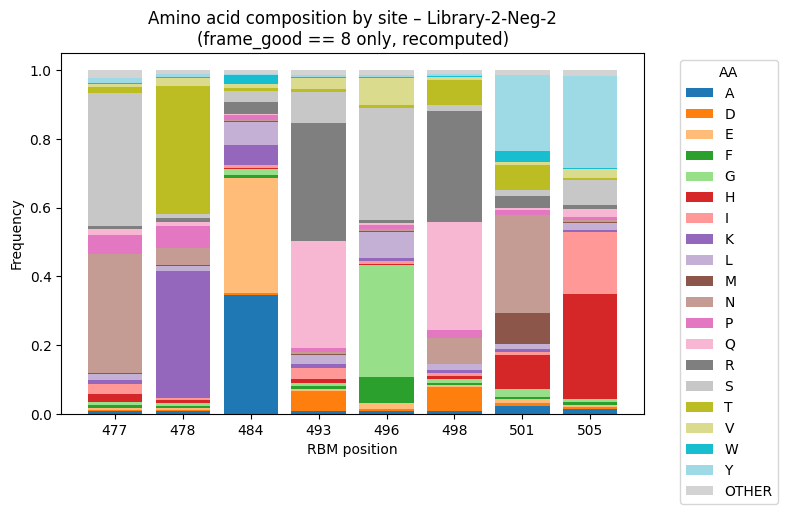

Saved figure for Library-2-Neg-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Neg-2_AA_by_site_cleaned.png


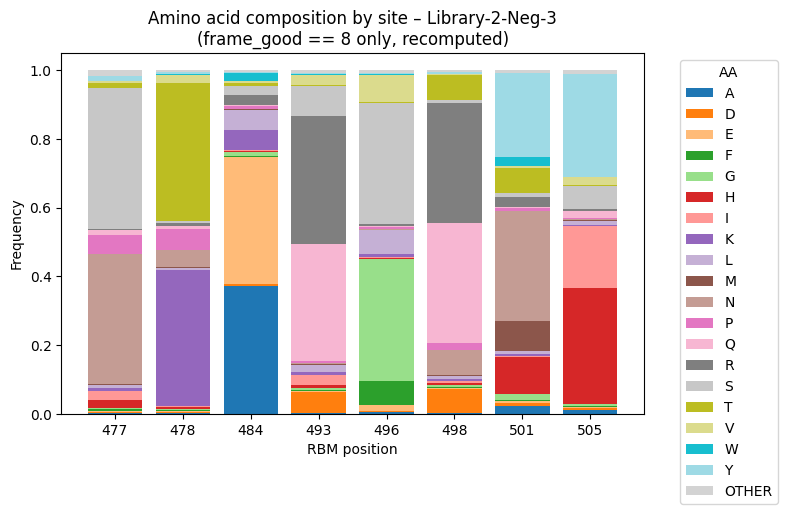

Saved figure for Library-2-Neg-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Neg-3_AA_by_site_cleaned.png


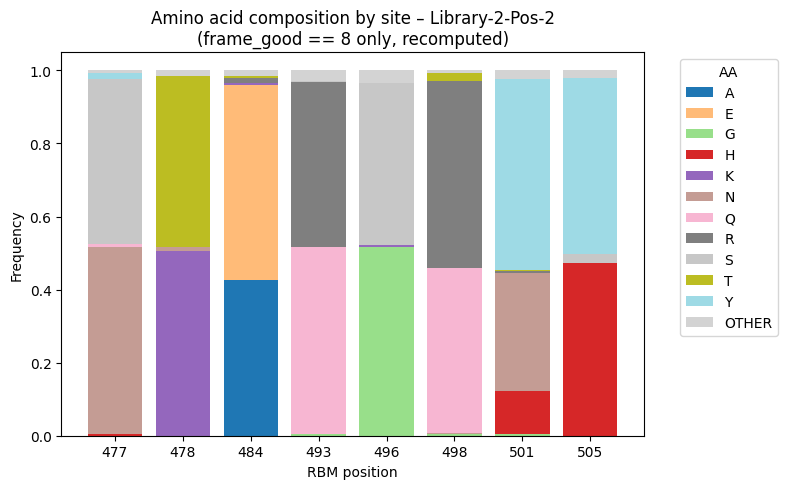

Saved figure for Library-2-Pos-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Pos-2_AA_by_site_cleaned.png


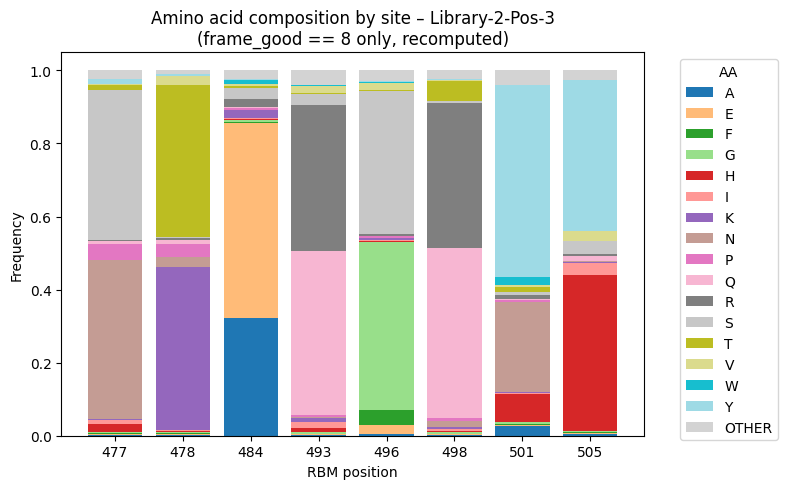

Saved figure for Library-2-Pos-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Pos-3_AA_by_site_cleaned.png


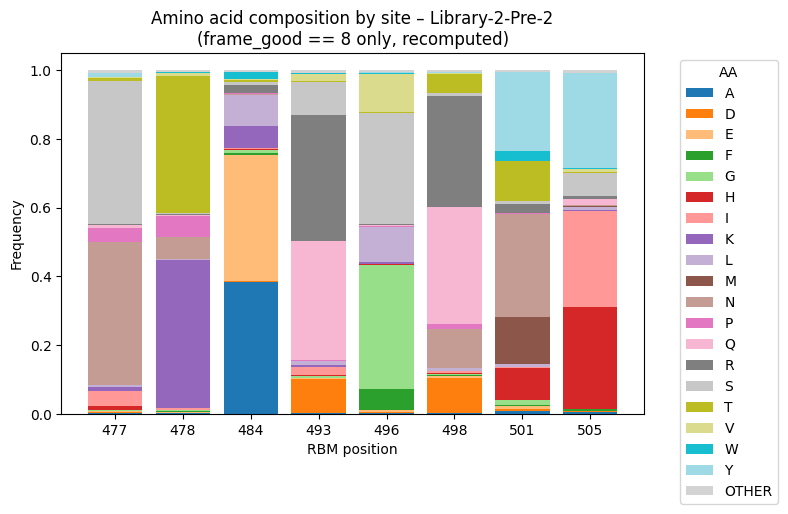

Saved figure for Library-2-Pre-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Pre-2_AA_by_site_cleaned.png


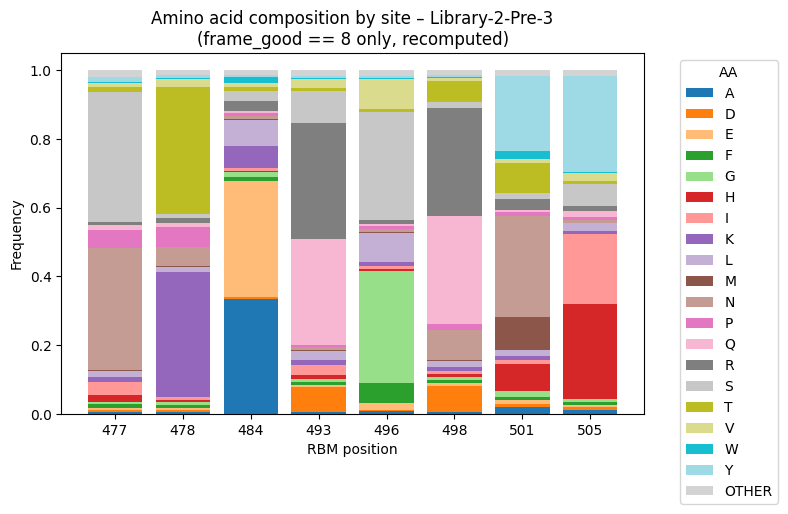

Saved figure for Library-2-Pre-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-2-Pre-3_AA_by_site_cleaned.png


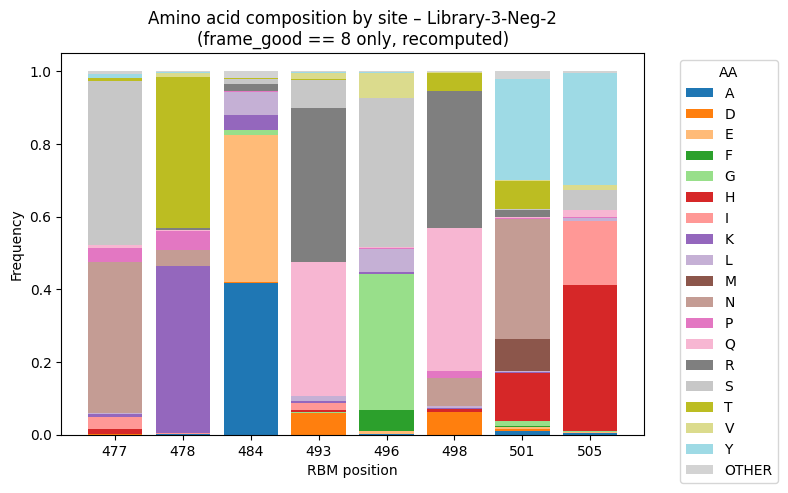

Saved figure for Library-3-Neg-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Neg-2_AA_by_site_cleaned.png


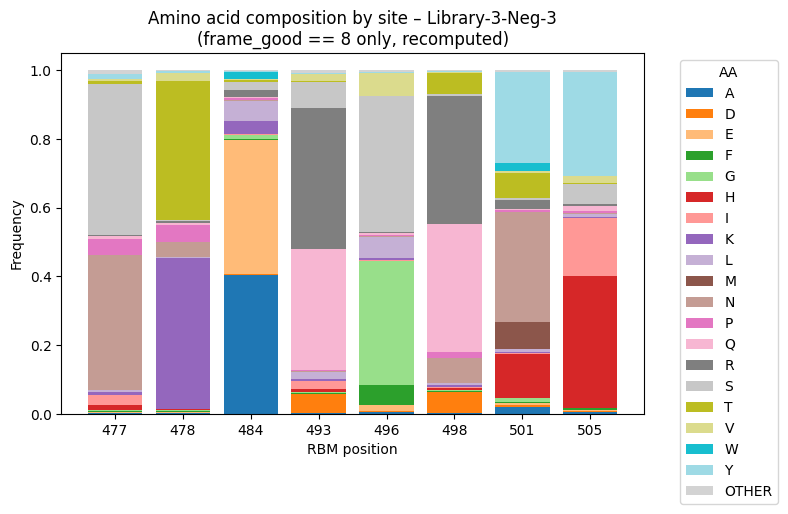

Saved figure for Library-3-Neg-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Neg-3_AA_by_site_cleaned.png


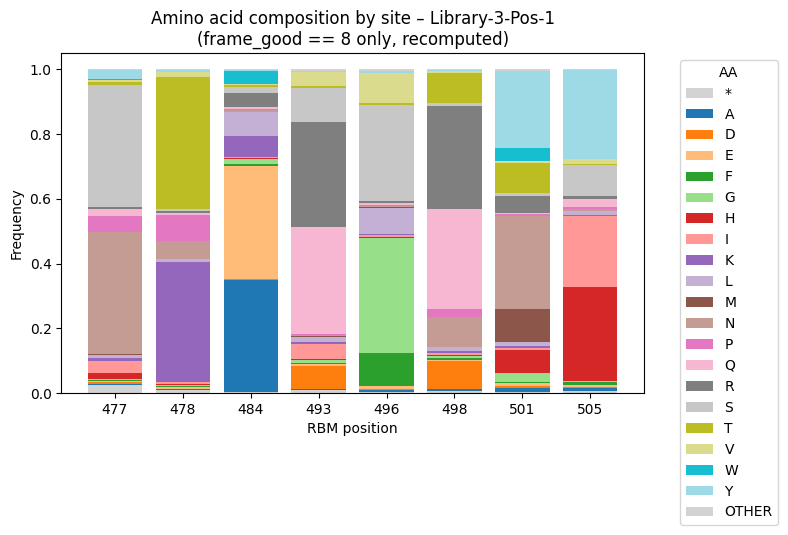

Saved figure for Library-3-Pos-1 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pos-1_AA_by_site_cleaned.png


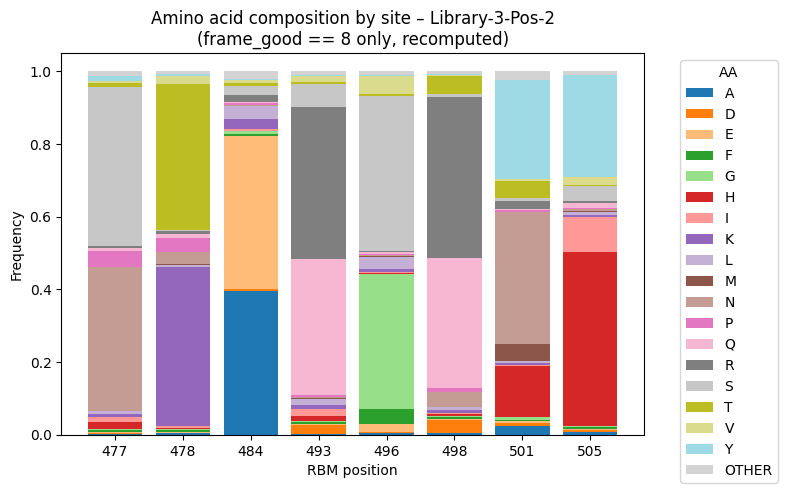

Saved figure for Library-3-Pos-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pos-2_AA_by_site_cleaned.png


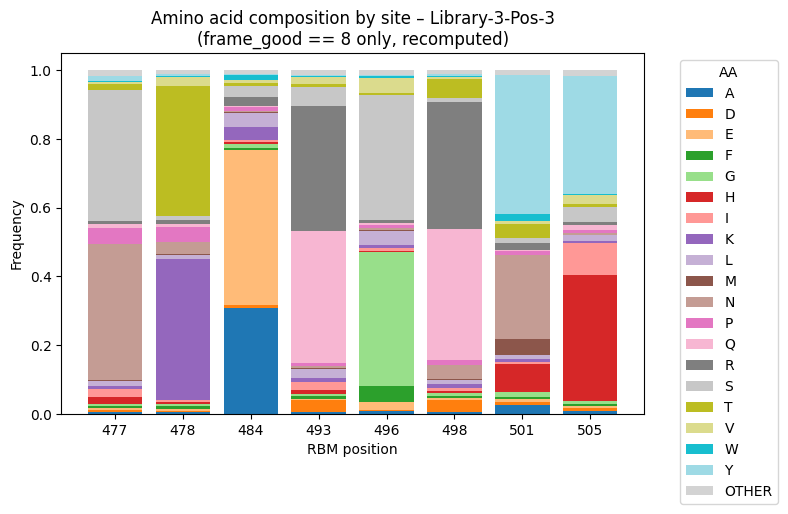

Saved figure for Library-3-Pos-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pos-3_AA_by_site_cleaned.png


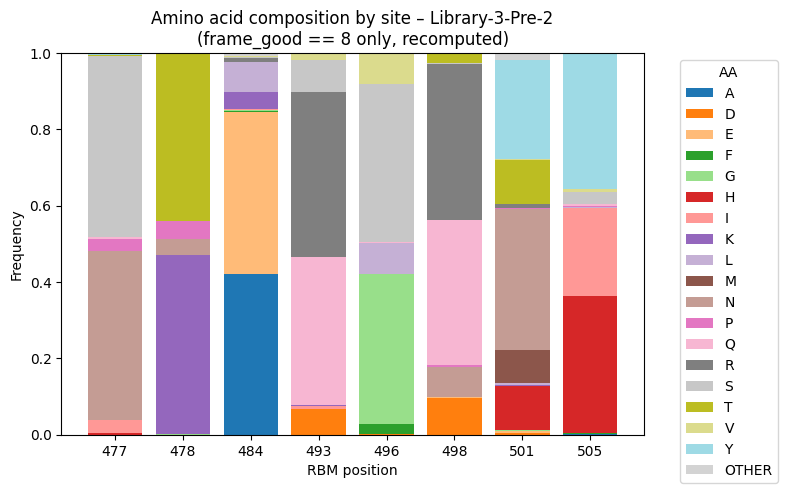

Saved figure for Library-3-Pre-2 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pre-2_AA_by_site_cleaned.png


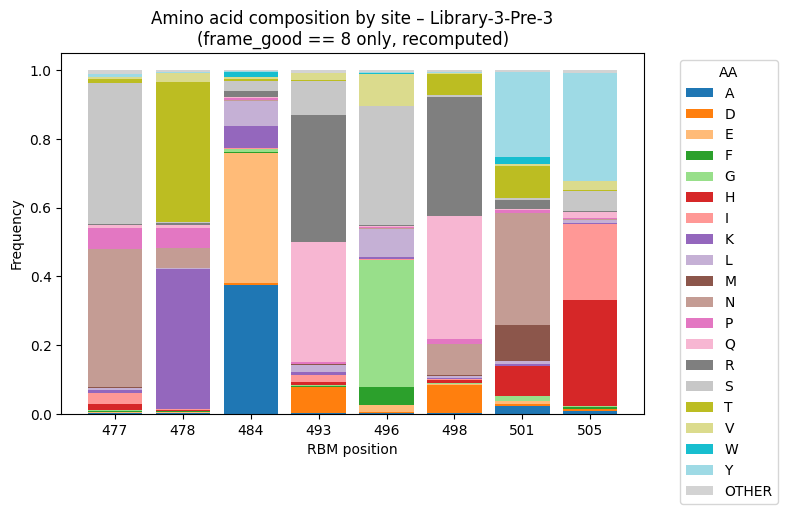

Saved figure for Library-3-Pre-3 to: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Raw_AA_Stacked_Bar_Plots/Library-3-Pre-3_AA_by_site_cleaned.png


In [125]:
for sample_name in sorted(aa_all["sample"].unique()):
    plot_sample_site_composition(aa_all, sample_name, FIG_DIR)


In [126]:
import re

def parse_sample_name(name: str):
    """
    Parse sample names like:
      'Library-1-Pre-2.merged_merged_haplotypes'
      'Lib-2-Pos-3'
    into (library_id, condition, replicate).

    Returns (lib_id:int or None, condition:str or None, rep:int or None).
    """
    # Strip any suffix after the first dot
    base = name.split(".")[0]

    # Accept 'Lib-1-Pre-2' or 'Library-1-Pre-2', case-insensitive on condition
    m = re.match(r"(?:Lib|Library)-(\d+)-(Pre|Pos|Neg)-(\d+)", base, flags=re.IGNORECASE)
    if not m:
        return None, None, None

    lib_id = int(m.group(1))
    cond = m.group(2).capitalize()  # Normalize to 'Pre', 'Pos', 'Neg'
    rep = int(m.group(3))
    return lib_id, cond, rep

# Build metadata from aa_all.sample
meta_rows = []
for s in sorted(aa_all["sample"].unique()):
    lib_id, cond, rep = parse_sample_name(s)
    meta_rows.append({
        "sample": s,
        "library_id": lib_id,
        "condition": cond,
        "replicate": rep,
    })

sample_meta = pd.DataFrame(meta_rows)
sample_meta


,sample,library_id,condition,replicate
0,Library-1-Neg-1,1,Neg,1
1,Library-1-Neg-2,1,Neg,2
2,Library-1-Neg-3,1,Neg,3
3,Library-1-Pos-1,1,Pos,1
4,Library-1-Pos-2,1,Pos,2
5,Library-1-Pos-3,1,Pos,3
6,Library-1-Pre-1,1,Pre,1
7,Library-1-Pre-2,1,Pre,2
8,Library-1-Pre-3,1,Pre,3
9,Library-2-Neg-2,2,Neg,2


In [127]:
aa_all = aa_all.merge(sample_meta, on="sample", how="left")


In [128]:
# Sum umi_counts across technical replicates within library+condition
lib_cond_counts = (
    aa_all
    .groupby(["library_id", "condition", "site", "aa"], as_index=False)["umi_count"]
    .sum()
)

# Total UMIs per (library, condition, site)
lib_cond_counts["total_site_lib_cond"] = (
    lib_cond_counts
    .groupby(["library_id", "condition", "site"])["umi_count"]
    .transform("sum")
)

# Frequency per AA at each site within each (library, condition)
lib_cond_counts["frequency"] = (
    lib_cond_counts["umi_count"] / lib_cond_counts["total_site_lib_cond"]
)

lib_cond_counts.head()


,library_id,condition,site,aa,umi_count,total_site_lib_cond,frequency
0,1,Neg,477,*,39843,3214707,0.012394
1,1,Neg,477,A,16234,3214707,0.005050
2,1,Neg,477,C,12349,3214707,0.003841
3,1,Neg,477,D,11593,3214707,0.003606
4,1,Neg,477,E,15275,3214707,0.004752


In [129]:
pip install scipy


[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: /Users/jonathanfelix/.venv/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [130]:
from scipy.stats import fisher_exact
import numpy as np


In [131]:
def get_aa_counts(lib_cond_counts, library_id, site, aa, condition):
    """
    Return (count_aa, count_not_aa, total) for a given
    library, condition, site, AA.
    """
    sub = lib_cond_counts[
        (lib_cond_counts["library_id"] == library_id) &
        (lib_cond_counts["condition"] == condition) &
        (lib_cond_counts["site"] == site)
    ]

    if sub.empty:
        return 0, 0, 0

    # Counts for this AA (could be 0 if absent)
    aa_row = sub[sub["aa"] == aa]
    count_aa = int(aa_row["umi_count"].iloc[0]) if not aa_row.empty else 0

    # Total at this site for this library+condition
    total = int(sub["total_site_lib_cond"].iloc[0])

    count_not_aa = total - count_aa
    return count_aa, count_not_aa, total


In [132]:
def fisher_for_pair(lib_cond_counts, library_id, site, aa,
                    cond_a="Pre", cond_b="Pos", pseudocount=0.5):
    """
    Run Fisher's exact test comparing frequency of AA between cond_a and cond_b
    for one library, one site, one AA.

    Returns dict with counts, frequencies, log2FC, p-value, or None if insufficient data.
    """
    a_aa, a_not, a_total = get_aa_counts(lib_cond_counts, library_id, site, aa, cond_a)
    b_aa, b_not, b_total = get_aa_counts(lib_cond_counts, library_id, site, aa, cond_b)

    # If either condition has zero total, skip
    if a_total == 0 or b_total == 0:
        return None

    # 2x2 contingency table:
    #   [[a_aa, a_not],
    #    [b_aa, b_not]]
    table = np.array([[a_aa, a_not],
                      [b_aa, b_not]])

    # Fisher's exact test (two-sided)
    oddsratio, p_value = fisher_exact(table, alternative="two-sided")

    # Frequencies with simple pseudocount to avoid log2(0)
    p_a = (a_aa + pseudocount) / (a_total + 2 * pseudocount)
    p_b = (b_aa + pseudocount) / (b_total + 2 * pseudocount)
    log2fc = np.log2(p_b / p_a)  # "b vs a"

    return {
        "library_id": library_id,
        "site": site,
        "aa": aa,
        "cond_a": cond_a,
        "cond_b": cond_b,
        "a_aa": a_aa,
        "a_not": a_not,
        "a_total": a_total,
        "b_aa": b_aa,
        "b_not": b_not,
        "b_total": b_total,
        "freq_a": p_a,
        "freq_b": p_b,
        "log2fc_b_over_a": log2fc,
        "oddsratio": oddsratio,
        "p_value": p_value,
    }


In [133]:
results = []

libraries = sorted(lib_cond_counts["library_id"].dropna().unique())
sites = sorted(lib_cond_counts["site"].unique())

for lib in libraries:
    for site in sites:
        # All AAs actually observed at this site in this library across conditions
        aas_here = lib_cond_counts[
            (lib_cond_counts["library_id"] == lib) &
            (lib_cond_counts["site"] == site)
        ]["aa"].unique()

        for aa in aas_here:
            # Skip '?' if you don't care about uncalled/misc
            if aa == "?":
                continue

            # PRE vs POS
            r_pos = fisher_for_pair(lib_cond_counts, lib, site, aa, "Pre", "Pos")
            if r_pos is not None:
                r_pos["comparison"] = "Pos_vs_Pre"
                results.append(r_pos)

            # PRE vs NEG
            r_neg = fisher_for_pair(lib_cond_counts, lib, site, aa, "Pre", "Neg")
            if r_neg is not None:
                r_neg["comparison"] = "Neg_vs_Pre"
                results.append(r_neg)

            # POS vs NEG
            r_pn = fisher_for_pair(lib_cond_counts, lib, site, aa, "Pos", "Neg")
            if r_pn is not None:
                r_pn["comparison"] = "Pos_vs_Neg"
                results.append(r_pn)

fisher_df = pd.DataFrame(results)
fisher_df.head()


,library_id,site,aa,cond_a,cond_b,a_aa,a_not,a_total,b_aa,b_not,b_total,freq_a,freq_b,log2fc_b_over_a,oddsratio,p_value,comparison
0,1,477,*,Pre,Pos,28957,2399519,2428476,13312,1488926,1502238,0.011924,0.008862,-0.428218,1.349768,1.255120e-184,Pos_vs_Pre
1,1,477,*,Pre,Neg,28957,2399519,2428476,39843,3174864,3214707,0.011924,0.012394,0.055771,0.961618,4.659628e-07,Neg_vs_Pre
2,1,477,*,Pos,Neg,13312,1488926,1502238,39843,3174864,3214707,0.008862,0.012394,0.483990,0.712432,3.403353e-262,Pos_vs_Neg
3,1,477,A,Pre,Pos,7633,2420843,2428476,3483,1498755,1502238,0.003143,0.002319,-0.438870,1.356769,6.926192e-52,Pos_vs_Pre
4,1,477,A,Pre,Neg,7633,2420843,2428476,16234,3198473,3214707,0.003143,0.005050,0.684010,0.621221,1.375598e-269,Neg_vs_Pre


In [135]:
pip install statsmodels


[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: /Users/jonathanfelix/.venv/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [136]:
from statsmodels.stats.multitest import multipletests

# One correction over all tests, or per-comparison if you prefer
reject, qvals, _, _ = multipletests(fisher_df["p_value"], method="fdr_bh")
fisher_df["q_value"] = qvals
fisher_df["significant_fdr_0.05"] = reject


In [137]:
# Summary: strongest AA effect per site per library per comparison
summary_rows = []

for lib in sorted(fisher_df["library_id"].unique()):
    sub_lib = fisher_df[fisher_df["library_id"] == lib]

    for comp in ["Pos_vs_Pre", "Neg_vs_Pre", "Pos_vs_Neg"]:
        sub_comp = sub_lib[sub_lib["comparison"] == comp]
        if sub_comp.empty:
            continue

        for site in sorted(sub_comp["site"].unique()):
            sub_site = sub_comp[sub_comp["site"] == site]

            # Identify strongest effect (by absolute log2FC)
            strongest = sub_site.iloc[sub_site["log2fc_b_over_a"].abs().argmax()]

            summary_rows.append({
                "library_id": lib,
                "comparison": comp,
                "site": site,
                "aa": strongest["aa"],
                "log2fc": strongest["log2fc_b_over_a"],
                "p_value": strongest["p_value"],
                "q_value": strongest.get("q_value", None),
                "a_total": strongest["a_total"],
                "b_total": strongest["b_total"],
            })

summary_df = pd.DataFrame(summary_rows)
summary_df


,library_id,comparison,site,aa,log2fc,p_value,q_value,a_total,b_total
0,1,Pos_vs_Pre,477,I,-1.837559,0.000000e+00,0.000000e+00,2428476,1502238
1,1,Pos_vs_Pre,478,P,-1.094605,0.000000e+00,0.000000e+00,2428476,1502238
2,1,Pos_vs_Pre,484,L,-2.578994,0.000000e+00,0.000000e+00,2428476,1502238
3,1,Pos_vs_Pre,493,D,-2.824301,0.000000e+00,0.000000e+00,2428476,1502238
4,1,Pos_vs_Pre,496,L,-2.368240,0.000000e+00,0.000000e+00,2428476,1502238
...,...,...,...,...,...,...,...,...,...
67,3,Pos_vs_Neg,493,W,-1.774766,3.394000e-99,4.910744e-99,1322129,475317
68,3,Pos_vs_Neg,496,*,-1.913450,1.222514e-275,2.675023e-275,1322129,475317
69,3,Pos_vs_Neg,498,C,-1.671604,3.266677e-158,5.625531e-158,1322129,475317
70,3,Pos_vs_Neg,501,F,-1.788609,2.888593e-299,6.657855e-299,1322129,475317


In [138]:
pip install seaborn


[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: /Users/jonathanfelix/.venv/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [139]:
from pathlib import Path

SUMMARY_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures")
SUMMARY_DIR.mkdir(parents=True, exist_ok=True)


In [140]:
def make_log2fc_heatmap(df, library_id, comparison="Pos_vs_Pre", savepath=None):
    sub = df[(df["library_id"] == library_id) & (df["comparison"] == comparison)].copy()
    if sub.empty:
        print(f"[skip] No rows for {comparison} in Library {library_id}")
        return

    heat = sub.pivot(index="aa", columns="site", values="log2fc_b_over_a")
    heat = heat.dropna(how="all", axis=0).dropna(how="all", axis=1)
    if heat.size == 0:
        print(f"[skip] Empty log2FC heatmap for {comparison} in Library {library_id}")
        return

    plt.figure(figsize=(10, 6))
    sns.heatmap(
        heat,
        cmap="coolwarm", center=0,
        annot=False,
        cbar_kws={"label": "log2FC (b over a)"}
    )
    plt.title(f"Library {library_id} — {comparison} — log2FC")
    plt.ylabel("Amino Acid")
    plt.xlabel("Site")
    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, dpi=300)
        print(f"[saved] {savepath}")

    plt.close()


In [141]:
def make_pvalue_heatmap(df, library_id, comparison="Pos_vs_Pre", savepath=None):
    sub = df[(df["library_id"] == library_id) & (df["comparison"] == comparison)].copy()
    if sub.empty:
        print(f"[skip] No rows for {comparison} in Library {library_id}")
        return

    if "q_value" not in sub.columns:
        print(f"[skip] q_value missing in Fisher DF — cannot plot p-value heatmap")
        return

    sub["neglog10_q"] = -np.log10(sub["q_value"].replace(0, 1e-300))

    heat = sub.pivot(index="aa", columns="site", values="neglog10_q")
    heat = heat.dropna(how="all", axis=0).dropna(how="all", axis=1)
    if heat.size == 0:
        print(f"[skip] Empty significance heatmap for {comparison} in Library {library_id}")
        return

    plt.figure(figsize=(10, 6))
    sns.heatmap(
        heat,
        cmap="viridis",
        annot=False,
        cbar_kws={"label": "-log10(q-value)"}
    )
    plt.title(f"Library {library_id} — {comparison} — significance")
    plt.ylabel("Amino Acid")
    plt.xlabel("Site")
    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, dpi=300)
        print(f"[saved] {savepath}")

    plt.close()


In [142]:
comparisons = ["Pos_vs_Pre", "Neg_vs_Pre", "Pos_vs_Neg"]

for lib in sorted(fisher_df["library_id"].unique()):
    for comp in comparisons:

        # 1. log2FC heatmap
        f1 = SUMMARY_DIR / f"Lib{lib}_{comp}_log2FC.png"
        make_log2fc_heatmap(fisher_df, lib, comparison=comp, savepath=f1)

        # 2. -log10(q-value) heatmap
        f2 = SUMMARY_DIR / f"Lib{lib}_{comp}_neglog10q.png"
        make_pvalue_heatmap(fisher_df, lib, comparison=comp, savepath=f2)


[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib1_Pos_vs_Pre_log2FC.png
[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib1_Pos_vs_Pre_neglog10q.png
[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib1_Neg_vs_Pre_log2FC.png
[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib1_Neg_vs_Pre_neglog10q.png
[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib1_Pos_vs_Neg_log2FC.png
[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib1_Pos_vs_Neg_neglog10q.png
[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib2_Pos_vs_Pre_log2FC.png
[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib2_Pos_vs_Pre_neglog10q.png
[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib2_Neg_vs_Pre_

In [151]:
from pathlib import Path
import pandas as pd
import numpy as np
import re

# Directory with cleaned position tables
POS_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables")

print("Using position tables in:", POS_DIR)

def parse_sample_name(name: str):
    """
    Parse sample names like:
      'Library-1-Pre-2.merged_merged_haplotypes'
    into (library_id, condition, replicate).
    """
    base = name.split(".")[0]
    m = re.match(r"(?:Lib|Library)-(\d+)-(Pre|Pos|Neg)-(\d+)", base, flags=re.IGNORECASE)
    if not m:
        return None, None, None
    lib_id = int(m.group(1))
    cond = m.group(2).capitalize()
    rep = int(m.group(3))
    return lib_id, cond, rep

wo_rows = []

pos_files = sorted(POS_DIR.glob("*_positions.csv"))
print(f"Found {len(pos_files)} position tables")

for pos_path in pos_files:
    sample_name = pos_path.stem.replace("_positions", "")
    lib_id, cond, rep = parse_sample_name(sample_name)
    if lib_id is None:
        print("[skip] Could not parse", sample_name)
        continue

    print(f"Processing {sample_name}...")

    df = pd.read_csv(pos_path)

    # Keep only rows with all sites successfully called, if column exists
    if "complete_sites" in df.columns:
        df = df.loc[df["complete_sites"].eq(True)].copy()

    if df.empty:
        print("[skip] No complete rows for", sample_name)
        continue

    # Filter to on-design amino acids (Wuhan or Omicron at each site)
    mask_design = pd.Series(True, index=df.index)
    for pos in sites:
        col = f"aa_{pos}"
        mask_design &= df[col].isin(allowed_aa[pos])

    df = df.loc[mask_design].copy()

    if df.empty:
        print("[skip] No on-design rows for", sample_name)
        continue

    # Fast W/O genotype construction without df.apply(axis=1)
    wo_parts = []
    for pos in sites:
        col = f"aa_{pos}"
        part = np.where(
            df[col].eq(wuhan_aa[pos]),
            "W",
            np.where(df[col].eq(omicron_aa[pos]), "O", "?")
        )
        wo_parts.append(part)

    wo_matrix = np.vstack(wo_parts).T.astype(str)
    df["wo"] = pd.Series(map("".join, wo_matrix), index=df.index)

    # Drop any with '?' (shouldn't happen after allowed_aa filter, but just in case)
    df = df.loc[~df["wo"].str.contains(r"\?", regex=True)].copy()

    if df.empty:
        print("[skip] All WO genotypes invalid for", sample_name)
        continue

    # Use 'size' as count if present, otherwise fall back to 'umi_count' or 1
    if "size" in df.columns:
        count_col = "size"
    elif "umi_count" in df.columns:
        count_col = "umi_count"
    else:
        df["tmp_count"] = 1
        count_col = "tmp_count"

    # Aggregate counts by W/O genotype
    agg = (
        df.groupby("wo", as_index=False)[count_col]
          .sum()
          .rename(columns={count_col: "umi_count"})
    )

    agg["library_id"] = lib_id
    agg["condition"] = cond
    agg["replicate"] = rep
    agg["sample"] = sample_name

    wo_rows.append(agg)

if not wo_rows:
    raise ValueError("No W/O genotype tables were produced. Check filters and input files.")

wo_counts = pd.concat(wo_rows, ignore_index=True)

print("W/O genotype table shape:", wo_counts.shape)
display(wo_counts.head())

Using position tables in: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables
Found 24 position tables
Processing Library-1-Neg-1...
Processing Library-1-Neg-2...
Processing Library-1-Neg-3...
Processing Library-1-Pos-1...
Processing Library-1-Pos-2...
Processing Library-1-Pos-3...
Processing Library-1-Pre-1...
Processing Library-1-Pre-2...
Processing Library-1-Pre-3...
Processing Library-2-Neg-1...
[skip] No complete rows for Library-2-Neg-1
Processing Library-2-Neg-2...
Processing Library-2-Neg-3...
Processing Library-2-Pos-2...
Processing Library-2-Pos-3...
Processing Library-2-Pre-1...
[skip] No complete rows for Library-2-Pre-1
Processing Library-2-Pre-2...
Processing Library-2-Pre-3...
Processing Library-3-Neg-2...
Processing Library-3-Neg-3...
Processing Library-3-Pos-1...
Processing Library-3-Pos-2...
Processing Library-3-Pos-3...
Processing Library-3-Pre-2...
Processing Library-3-Pre-3...
W/O genotype table shape: (5451, 6)


,wo,umi_count,library_id,condition,replicate,sample
0,OOOOOOOO,194324,1,Neg,1,Library-1-Neg-1
1,OOOOOOOW,48760,1,Neg,1,Library-1-Neg-1
2,OOOOOOWO,48170,1,Neg,1,Library-1-Neg-1
3,OOOOOOWW,45465,1,Neg,1,Library-1-Neg-1
4,OOOOOWOO,21254,1,Neg,1,Library-1-Neg-1


In [152]:
chk_dir = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/checkpoints")
chk_dir.mkdir(parents=True, exist_ok=True)

wo_counts.to_csv(chk_dir / "wo_counts.csv", index=False)
wo_counts.to_pickle(chk_dir / "wo_counts.pkl")

In [153]:
# Pool technical replicates within each library/condition
wo_lib_cond = (
    wo_counts
    .groupby(["library_id", "condition", "wo"], as_index=False)["umi_count"]
    .sum()
)

# Total UMIs per library+condition (denominator for frequencies)
wo_lib_cond["total_cond"] = (
    wo_lib_cond.groupby(["library_id", "condition"])["umi_count"]
               .transform("sum")
)

wo_lib_cond["freq"] = wo_lib_cond["umi_count"] / wo_lib_cond["total_cond"]

wo_lib_cond.head()


,library_id,condition,wo,umi_count,total_cond,freq
0,1,Neg,OOOOOOOO,267700,45002366,0.005949
1,1,Neg,OOOOOOOW,60615,45002366,0.001347
2,1,Neg,OOOOOOWO,156880,45002366,0.003486
3,1,Neg,OOOOOOWW,144912,45002366,0.003220
4,1,Neg,OOOOOWOO,30689,45002366,0.000682


In [337]:
from pathlib import Path

OUT_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures")
OUT_DIR.mkdir(parents=True, exist_ok=True)

out_csv = OUT_DIR / "WO_genotype_counts_per_library_condition.csv"
out_pkl = OUT_DIR / "WO_genotype_counts_per_library_condition.pkl"

wo_lib_cond.to_csv(out_csv, index=False)
wo_lib_cond.to_pickle(out_pkl)

print("Saved CSV:", out_csv)
print("Saved PKL:", out_pkl)
print("Shape:", wo_lib_cond.shape)
display(wo_lib_cond.head())

# total counts per library/condition
check_totals = (
    wo_lib_cond.groupby(["library_id", "condition"])["umi_count"]
    .sum()
    .unstack()
)

display(check_totals)

Saved CSV: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/WO_genotype_counts_per_library_condition.csv
Saved PKL: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/WO_genotype_counts_per_library_condition.pkl
Shape: (2304, 6)


,library_id,condition,wo,umi_count,total_cond,freq
0,1,Neg,OOOOOOOO,267700,45002366,0.005949
1,1,Neg,OOOOOOOW,60615,45002366,0.001347
2,1,Neg,OOOOOOWO,156880,45002366,0.003486
3,1,Neg,OOOOOOWW,144912,45002366,0.003220
4,1,Neg,OOOOOWOO,30689,45002366,0.000682


condition,Neg,Pos,Pre
library_id,,,
1,45002366,26690098,31133073
2,26845007,53008735,15390714
3,3668159,15458642,29012677


In [336]:
# Wide format: one row per (library, WO genotype), columns = conditions (freq)
freq_wide = wo_lib_cond.pivot_table(
    index=["library_id", "wo"],
    columns="condition",
    values="freq",
    fill_value=0.0
)

# Ensure we have all three columns present
for cond in ["Pre", "Pos", "Neg"]:
    if cond not in freq_wide.columns:
        freq_wide[cond] = 0.0

# Add a small pseudocount in frequency space
pc = 1e-6
f_pre = freq_wide["Pre"] + pc
f_pos = freq_wide["Pos"] + pc
f_neg = freq_wide["Neg"] + pc

freq_wide["log2fc_pos_pre"] = np.log2(f_pos / f_pre)
freq_wide["log2fc_neg_pre"] = np.log2(f_neg / f_pre)
freq_wide["ddelta"] = freq_wide["log2fc_pos_pre"] - freq_wide["log2fc_neg_pre"]

wo_landscape = freq_wide.reset_index()
wo_landscape.head()


condition,library_id,wo,Neg,Pos,Pre,log2fc_pos_pre,log2fc_neg_pre,ddelta
0,1,OOOOOOOO,0.005949,0.008597,0.003254,1.401357,0.870073,0.531285
1,1,OOOOOOOW,0.001347,0.001362,0.001796,-0.398696,-0.414820,0.016124
2,1,OOOOOOWO,0.003486,0.001391,0.002819,-1.018301,0.306112,-1.324413
3,1,OOOOOOWW,0.003220,0.000169,0.004767,-4.807749,-0.565828,-4.241921
4,1,OOOOOWOO,0.000682,0.000340,0.000464,-0.450684,0.553312,-1.003995


In [385]:
out_path = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/WO_landscape_per_library.csv")
wo_landscape.to_csv(out_path, index=False)
print("Saved W/O landscape to", out_path)


Saved W/O landscape to /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/WO_landscape_per_library.csv


In [386]:
#THIS CELL IS FOR DOING ALL OF THE VOLCANO PLOT STATISTICS FOR W/O LANDSCAPES

from scipy.stats import fisher_exact
from statsmodels.stats.multitest import multipletests
import numpy as np
import pandas as pd

# Build wide count table from pooled genotype counts
count_wide = wo_lib_cond.pivot_table(
    index=["library_id", "wo"],
    columns="condition",
    values="umi_count",
    fill_value=0
).reset_index()

# Make sure all expected condition columns exist
for cond in ["Pre", "Pos", "Neg"]:
    if cond not in count_wide.columns:
        count_wide[cond] = 0

# Total counts per library and condition
totals = (
    wo_lib_cond.groupby(["library_id", "condition"])["umi_count"]
    .sum()
    .unstack(fill_value=0)
)

for cond in ["Pre", "Pos", "Neg"]:
    if cond not in totals.columns:
        totals[cond] = 0

results = []

for _, row in count_wide.iterrows():
    lib = row["library_id"]
    wo = row["wo"]

    pre = int(row["Pre"])
    pos = int(row["Pos"])
    neg = int(row["Neg"])

    total_pre = int(totals.loc[lib, "Pre"])
    total_pos = int(totals.loc[lib, "Pos"])
    total_neg = int(totals.loc[lib, "Neg"])

    # Pos vs Pre
    a, b = pos, pre
    c, d = total_pos - a, total_pre - b
    p_pos_pre = fisher_exact([[a, b], [c, d]])[1] if (a + b + c + d) > 0 else np.nan

    # Neg vs Pre
    a, b = neg, pre
    c, d = total_neg - a, total_pre - b
    p_neg_pre = fisher_exact([[a, b], [c, d]])[1] if (a + b + c + d) > 0 else np.nan

    # Pos vs Neg
    a, b = pos, neg
    c, d = total_pos - a, total_neg - b
    p_pos_neg = fisher_exact([[a, b], [c, d]])[1] if (a + b + c + d) > 0 else np.nan

    results.append({
        "library_id": lib,
        "wo": wo,
        "count_pre": pre,
        "count_pos": pos,
        "count_neg": neg,
        "p_pos_pre": p_pos_pre,
        "p_neg_pre": p_neg_pre,
        "p_pos_neg": p_pos_neg
    })

wo_pvals = pd.DataFrame(results)

# FDR correction for each comparison
for pcol, qcol in [
    ("p_pos_pre", "q_pos_pre"),
    ("p_neg_pre", "q_neg_pre"),
    ("p_pos_neg", "q_pos_neg"),
]:
    mask = wo_pvals[pcol].notna()
    wo_pvals[qcol] = np.nan
    if mask.sum() > 0:
        wo_pvals.loc[mask, qcol] = multipletests(
            wo_pvals.loc[mask, pcol],
            method="fdr_bh"
        )[1]

wo_pvals.head()

,library_id,wo,count_pre,count_pos,count_neg,p_pos_pre,p_neg_pre,p_pos_neg,q_pos_pre,q_neg_pre,q_pos_neg
0,1,OOOOOOOO,101311,229466,267700,0.000000e+00,0.0,0.000000,0.000000e+00,0.0,0.000000
1,1,OOOOOOOW,55914,36354,60615,0.000000e+00,0.0,0.091961,0.000000e+00,0.0,0.092685
2,1,OOOOOOWO,87776,37137,156880,0.000000e+00,0.0,0.000000,0.000000e+00,0.0,0.000000
3,1,OOOOOOWW,148411,4517,144912,0.000000e+00,0.0,0.000000,0.000000e+00,0.0,0.000000
4,1,OOOOOWOO,14458,9062,30689,2.755182e-123,0.0,0.000000,3.230504e-123,0.0,0.000000


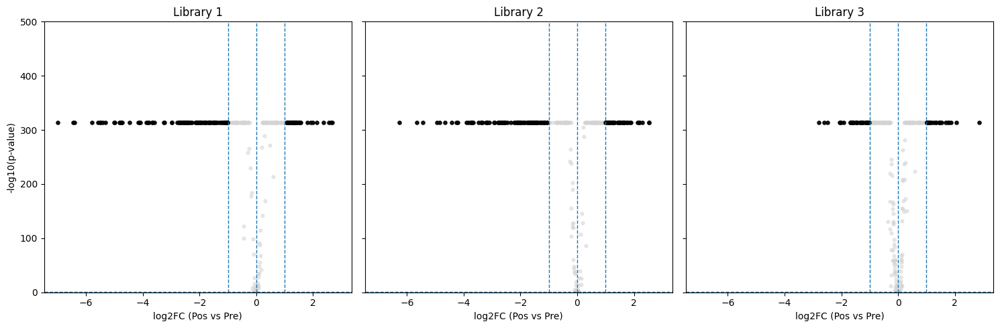

In [387]:
import matplotlib.pyplot as plt
import numpy as np

# Copy dataframe
df = wo_landscape_plot.copy()

# --- Handle p = 0 safely ---
min_nonzero_p = df.loc[df["p_pos_pre"] > 0, "p_pos_pre"].min()
if np.isnan(min_nonzero_p):
    min_nonzero_p = 1e-300

df["p_pos_pre_safe"] = df["p_pos_pre"].replace(0, min_nonzero_p)
df["neglog10_p"] = -np.log10(df["p_pos_pre_safe"])

# --- Thresholds ---
LOG2FC_THRESH = 1.0
Q_THRESH = 0.05

libs = sorted(df["library_id"].unique())

# --- Create 3-panel figure ---
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)

for i, lib in enumerate(libs):
    ax = axes[i]
    d = df[df["library_id"] == lib]

    sig = d["q_pos_pre"] < Q_THRESH
    strong = sig & (d["log2fc_pos_pre"].abs() >= LOG2FC_THRESH)

    # Background points
    ax.scatter(
        d["log2fc_pos_pre"],
        d["neglog10_p"],
        color="lightgray",
        s=12,
        alpha=0.5
    )

    # Highlight strong variants
    ax.scatter(
        d.loc[strong, "log2fc_pos_pre"],
        d.loc[strong, "neglog10_p"],
        color="black",
        s=14,
        alpha=0.9
    )

    # Reference lines
    ax.axvline(0, linestyle="--", linewidth=1)
    ax.axvline(LOG2FC_THRESH, linestyle="--", linewidth=1)
    ax.axvline(-LOG2FC_THRESH, linestyle="--", linewidth=1)
    ax.axhline(-np.log10(0.05), linestyle="--", linewidth=1)

    # Force y-axis to 500 (Animesh request)
    ax.set_ylim(0, 500)

    ax.set_title(f"Library {lib}")

# Axis labels
axes[0].set_ylabel("-log10(p-value)")
for ax in axes:
    ax.set_xlabel("log2FC (Pos vs Pre)")

plt.tight_layout()
plt.show()

Counts by library and category:


category,Not significant,Significant small-effect,Significant positive-specific,Significant negative-biased,Total
library_id,,,,,
1,3,147,25,81,256
2,2,115,55,84,256
3,2,154,53,47,256


Proportions by library and category:


category,Not significant,Significant small-effect,Significant positive-specific,Significant negative-biased,Total
library_id,,,,,
1,0.011719,0.574219,0.097656,0.316406,1.0
2,0.007812,0.449219,0.214844,0.328125,1.0
3,0.007812,0.601562,0.207031,0.183594,1.0


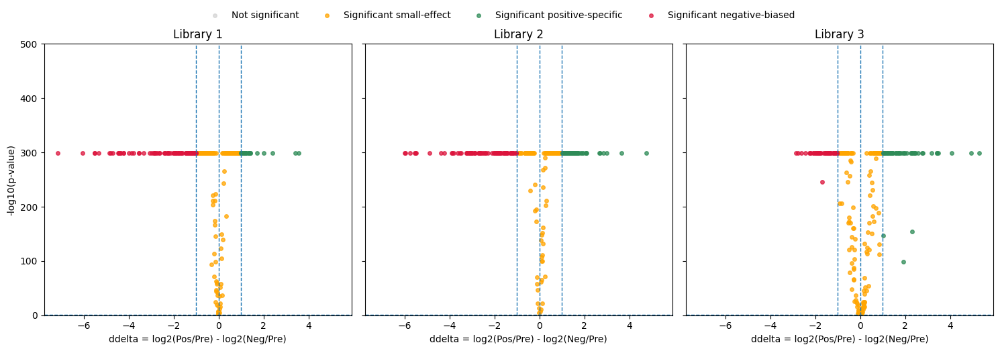

In [388]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Build plotting dataframe
df = wo_landscape.merge(
    wo_pvals[["library_id", "wo", "p_pos_neg", "q_pos_neg"]],
    on=["library_id", "wo"],
    how="left"
).copy()

# Safety for p = 0 underflow
min_nonzero_p = df.loc[df["p_pos_neg"] > 0, "p_pos_neg"].min()
if np.isnan(min_nonzero_p):
    min_nonzero_p = 1e-300

df["p_pos_neg_safe"] = df["p_pos_neg"].replace(0, min_nonzero_p)
df["neglog10_p_pos_neg"] = -np.log10(df["p_pos_neg_safe"])

# Thresholds
DDELTA_THRESH = 1.0
Q_THRESH = 0.05
YMAX = 500

# Categorize points
def categorize_variant(row):
    sig = pd.notna(row["q_pos_neg"]) and (row["q_pos_neg"] < Q_THRESH)
    d = row["ddelta"]

    if not sig:
        return "Not significant"
    elif d >= DDELTA_THRESH:
        return "Significant positive-specific"
    elif d <= -DDELTA_THRESH:
        return "Significant negative-biased"
    else:
        return "Significant small-effect"

df["category"] = df.apply(categorize_variant, axis=1)

# Category order for summaries
cat_order = [
    "Not significant",
    "Significant small-effect",
    "Significant positive-specific",
    "Significant negative-biased",
]

# Make summary counts table
category_counts = (
    df.groupby(["library_id", "category"])
      .size()
      .unstack(fill_value=0)
      .reindex(columns=cat_order, fill_value=0)
)

category_counts["Total"] = category_counts.sum(axis=1)

# Add proportions too
category_props = category_counts.div(category_counts["Total"], axis=0)

print("Counts by library and category:")
display(category_counts)

print("Proportions by library and category:")
display(category_props)

# Plot
color_map = {
    "Not significant": "lightgray",
    "Significant small-effect": "orange",
    "Significant positive-specific": "seagreen",
    "Significant negative-biased": "crimson",
}

libs = sorted(df["library_id"].dropna().unique())
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)

for i, lib in enumerate(libs):
    ax = axes[i]
    d = df[df["library_id"] == lib].copy()

    # plot categories separately for coloring
    for cat in cat_order:
        sub = d[d["category"] == cat]
        if sub.empty:
            continue

        ax.scatter(
            sub["ddelta"],
            sub["neglog10_p_pos_neg"],
            color=color_map[cat],
            s=16,
            alpha=0.75,
            label=cat
        )

    # threshold lines
    ax.axvline(0, linestyle="--", linewidth=1)
    ax.axvline(DDELTA_THRESH, linestyle="--", linewidth=1)
    ax.axvline(-DDELTA_THRESH, linestyle="--", linewidth=1)
    ax.axhline(-np.log10(0.05), linestyle="--", linewidth=1)

    ax.set_ylim(0, YMAX)
    ax.set_title(f"Library {lib}")

axes[0].set_ylabel("-log10(p-value)")
for ax in axes:
    ax.set_xlabel("ddelta = log2(Pos/Pre) - log2(Neg/Pre)")

# Single legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=4, frameon=False, bbox_to_anchor=(0.5, 1.05))

plt.tight_layout()
plt.show()

In [389]:
from pathlib import Path

OUT_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures")
OUT_DIR.mkdir(parents=True, exist_ok=True)

out_csv = OUT_DIR / "WO_landscape_ddelta_posneg_volcano_source.csv"
out_pkl = OUT_DIR / "WO_landscape_ddelta_posneg_volcano_source.pkl"

# Export the exact plotting dataframe
df.to_csv(out_csv, index=False)
df.to_pickle(out_pkl)

print("Saved CSV:", out_csv)
print("Saved PKL:", out_pkl)
print("Shape:", df.shape)
print("Columns:")
print(df.columns.tolist())

Saved CSV: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/WO_landscape_ddelta_posneg_volcano_source.csv
Saved PKL: /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/WO_landscape_ddelta_posneg_volcano_source.pkl
Shape: (768, 16)
Columns:
['library_id', 'wo', 'Neg', 'Pos', 'Pre', 'log2fc_pos_pre', 'log2fc_neg_pre', 'delta_pos', 'delta_neg', 'mut_count', 'ddelta', 'p_pos_neg', 'q_pos_neg', 'p_pos_neg_safe', 'neglog10_p_pos_neg', 'category']


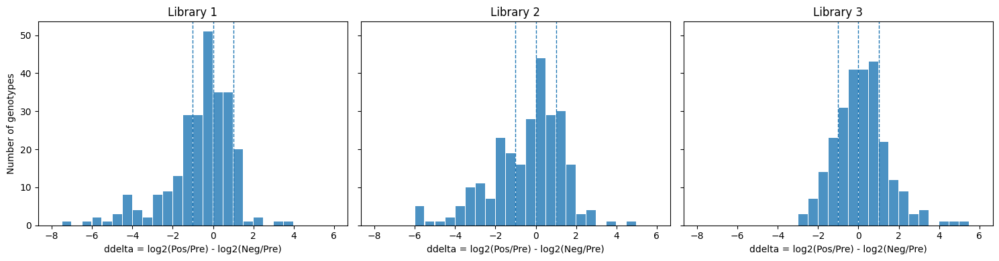

In [390]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Use the same dataframe that fed the volcano plots
plot_df = df.copy()

# Define common bin edges across all libraries
bin_width = 0.5
xmin = np.floor(plot_df["ddelta"].min())
xmax = np.ceil(plot_df["ddelta"].max())
bins = np.arange(xmin, xmax + bin_width, bin_width)

libs = sorted(plot_df["library_id"].dropna().unique())

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharex=True, sharey=True)

for i, lib in enumerate(libs):
    ax = axes[i]
    d = plot_df[plot_df["library_id"] == lib].copy()

    counts, edges = np.histogram(d["ddelta"], bins=bins)
    centers = (edges[:-1] + edges[1:]) / 2

    ax.bar(
        centers,
        counts,
        width=bin_width * 0.9,
        align="center",
        alpha=0.8
    )

    ax.axvline(0, linestyle="--", linewidth=1)
    ax.axvline(1, linestyle="--", linewidth=1)
    ax.axvline(-1, linestyle="--", linewidth=1)

    ax.set_title(f"Library {lib}")
    ax.set_xlabel("ddelta = log2(Pos/Pre) - log2(Neg/Pre)")

axes[0].set_ylabel("Number of genotypes")

plt.tight_layout()
plt.show()

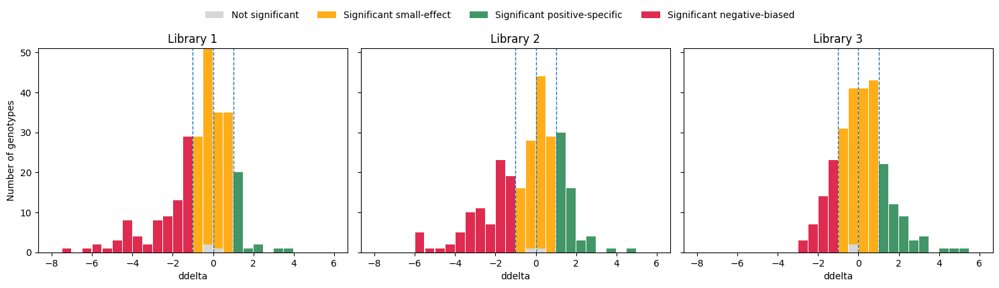

In [391]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

plot_df = df.copy()

# Common bins
bin_width = 0.5
xmin = np.floor(plot_df["ddelta"].min())
xmax = np.ceil(plot_df["ddelta"].max())
bins = np.arange(xmin, xmax + bin_width, bin_width)
centers = (bins[:-1] + bins[1:]) / 2

libs = sorted(plot_df["library_id"].dropna().unique())

cat_order = [
    "Not significant",
    "Significant small-effect",
    "Significant positive-specific",
    "Significant negative-biased",
]

color_map = {
    "Not significant": "lightgray",
    "Significant small-effect": "orange",
    "Significant positive-specific": "seagreen",
    "Significant negative-biased": "crimson",
}

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharex=True, sharey=True)

for i, lib in enumerate(libs):
    ax = axes[i]
    d = plot_df[plot_df["library_id"] == lib].copy()

    bottom = np.zeros(len(centers))

    for cat in cat_order:
        sub = d[d["category"] == cat]
        counts, _ = np.histogram(sub["ddelta"], bins=bins)

        ax.bar(
            centers,
            counts,
            bottom=bottom,
            width=bin_width * 0.9,
            align="center",
            color=color_map[cat],
            alpha=0.9,
            label=cat if i == 0 else None
        )

        bottom += counts

    ax.axvline(0, linestyle="--", linewidth=1)
    ax.axvline(1, linestyle="--", linewidth=1)
    ax.axvline(-1, linestyle="--", linewidth=1)

    ax.set_title(f"Library {lib}")
    ax.set_xlabel("ddelta")

axes[0].set_ylabel("Number of genotypes")

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=4, frameon=False, bbox_to_anchor=(0.5, 1.08))

plt.tight_layout()
plt.show()

In [392]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Where to save figures
SUMMARY_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures")
SUMMARY_DIR.mkdir(parents=True, exist_ok=True)

# 1) Add a mutational distance column: number of O's in the WO string
wo_landscape = wo_landscape.copy()
wo_landscape["mut_count"] = wo_landscape["wo"].str.count("O")

# Quick sanity check
wo_landscape[["library_id", "wo", "mut_count", "ddelta"]].head()


,library_id,wo,mut_count,ddelta
0,1,OOOOOOOO,8,0.531285
1,1,OOOOOOOW,7,0.016124
2,1,OOOOOOWO,7,-1.324413
3,1,OOOOOOWW,6,-4.241921
4,1,OOOOOWOO,7,-1.003995


In [393]:
def plot_mutcount_scatter(wo_land_df, library_id, value_col="ddelta", save=True):
    """
    Scatter of mutational distance (number of Omicron sites) vs enrichment metric (value_col)
    for a single library. Also overlays mean ± SEM per mut_count.
    """

    sub = wo_land_df[wo_land_df["library_id"] == library_id].copy()
    if sub.empty:
        print(f"[skip] No WO landscape for library {library_id}")
        return

    # Basic scatter with jitter on x to avoid overlap
    plt.figure(figsize=(7, 5))
    x = sub["mut_count"].values
    y = sub[value_col].values
    jitter = (np.random.rand(len(x)) - 0.5) * 0.2  # small horizontal jitter
    plt.scatter(x + jitter, y, alpha=0.4, s=20)

    # Overlay mean ± SEM per mut_count
    summary = (
        sub.groupby("mut_count")[value_col]
           .agg(["mean", "count", "std"])
           .reset_index()
    )
    summary["sem"] = summary["std"] / np.sqrt(summary["count"].clip(lower=1))

    plt.errorbar(summary["mut_count"], summary["mean"],
                 yerr=summary["sem"],
                 fmt="-o", color="red", capsize=3, label="mean ± SEM")

    plt.axhline(0, color="grey", linestyle="--", linewidth=1)

    plt.xlabel("Number of Omicron-like sites (mutational distance from Wuhan)")
    plt.ylabel(value_col)
    plt.title(f"Library {library_id} — {value_col} vs mutational distance")
    plt.xticks(range(0, 9))  # 0..8 possible
    plt.legend()
    plt.tight_layout()

    if save:
        out = SUMMARY_DIR / f"Lib{library_id}_mutcount_vs_{value_col}.png"
        plt.savefig(out, dpi=300)
        print(f"[saved] {out}")

    plt.show()


[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib1_mutcount_vs_ddelta.png


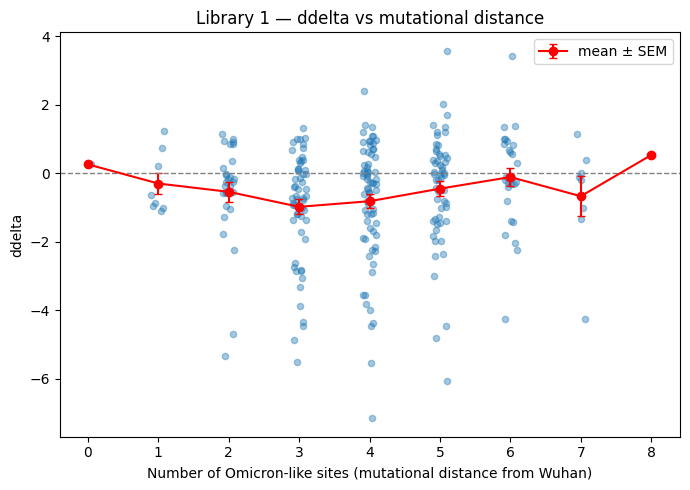

[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib2_mutcount_vs_ddelta.png


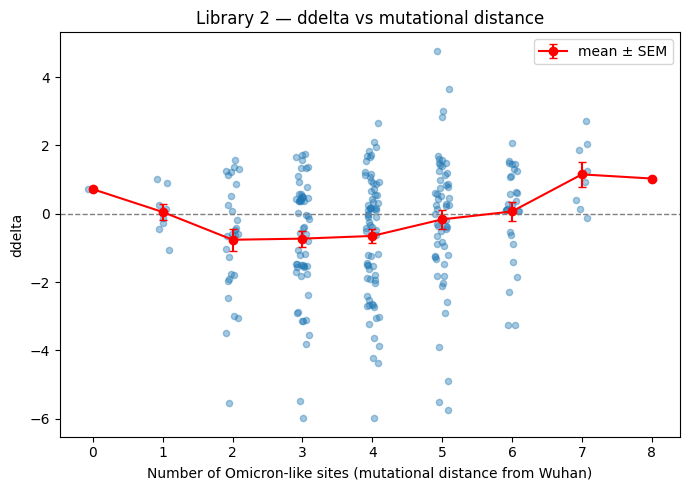

[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/Lib3_mutcount_vs_ddelta.png


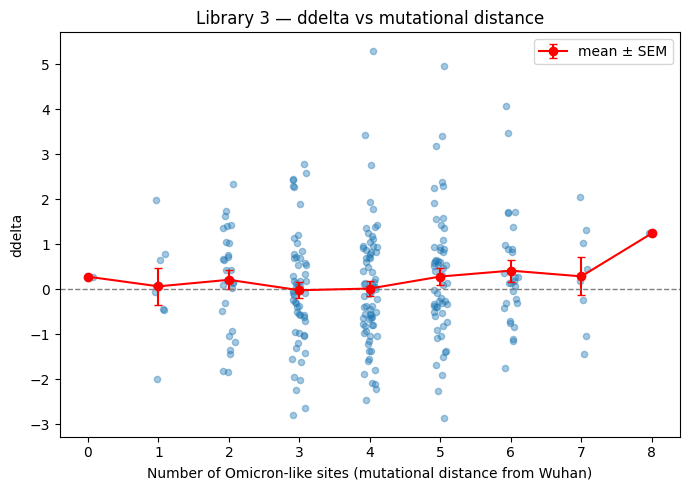

In [394]:
for lib in sorted(wo_landscape["library_id"].unique()):
    plot_mutcount_scatter(wo_landscape, library_id=lib, value_col="ddelta")


[saved] /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Summary_Figures/AllLibs_mutcount_vs_ddelta.png


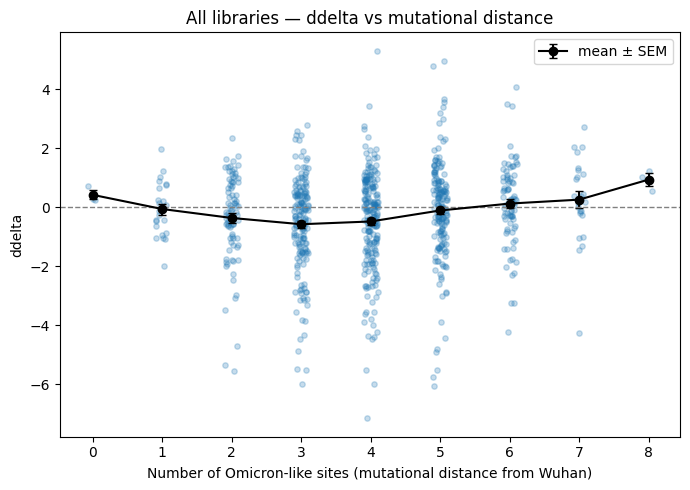

In [395]:
def plot_mutcount_scatter_pooled(wo_land_df, value_col="ddelta", save=True):
    sub = wo_land_df.copy()
    if sub.empty:
        print("[skip] WO landscape is empty")
        return

    plt.figure(figsize=(7, 5))
    x = sub["mut_count"].values
    y = sub[value_col].values
    jitter = (np.random.rand(len(x)) - 0.5) * 0.2
    plt.scatter(x + jitter, y, alpha=0.25, s=15)

    summary = (
        sub.groupby("mut_count")[value_col]
           .agg(["mean", "count", "std"])
           .reset_index()
    )
    summary["sem"] = summary["std"] / np.sqrt(summary["count"].clip(lower=1))

    plt.errorbar(summary["mut_count"], summary["mean"],
                 yerr=summary["sem"],
                 fmt="-o", color="black", capsize=3, label="mean ± SEM")

    plt.axhline(0, color="grey", linestyle="--", linewidth=1)

    plt.xlabel("Number of Omicron-like sites (mutational distance from Wuhan)")
    plt.ylabel(value_col)
    plt.title(f"All libraries — {value_col} vs mutational distance")
    plt.xticks(range(0, 9))
    plt.legend()
    plt.tight_layout()

    if save:
        out = SUMMARY_DIR / f"AllLibs_mutcount_vs_{value_col}.png"
        plt.savefig(out, dpi=300)
        print(f"[saved] {out}")

    plt.show()

plot_mutcount_scatter_pooled(wo_landscape, value_col="ddelta")


<Axes: title={'center': 'ddelta'}, xlabel='library_id'>

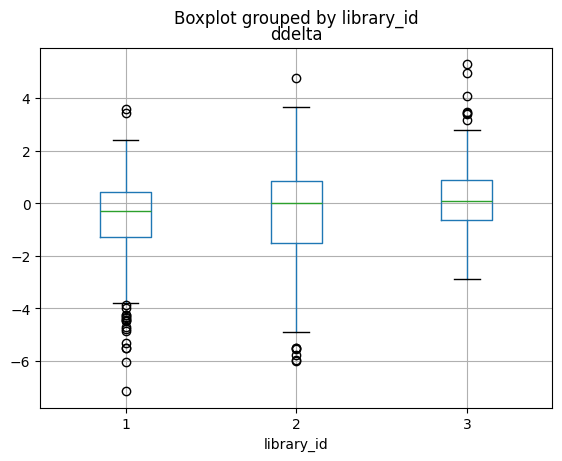

In [396]:
wo_landscape.boxplot(column="ddelta", by="library_id")



In [397]:
import json

with open("Untitled3.ipynb") as f:
    nb = json.load(f)

sum(len(cell["source"]) for cell in nb["cells"] if cell["cell_type"]=="code")


30

In [398]:
#ANALYSIS FROM THE TOP

In [399]:
# Build wide matrix: rows = samples, columns = site-AA combinations
freq_matrix = aa_all.pivot_table(
    index="sample",
    columns=["site", "aa"],
    values="frequency",
    fill_value=0
)


In [400]:
import pandas as pd
from pathlib import Path

POS_DIR = Path("/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Position_Tables")

sample_counts = {}

for pos_path in POS_DIR.glob("*_positions.csv"):
    sample_name = pos_path.stem.replace("_positions", "")
    with open(pos_path, "r") as f:
        n_records = sum(1 for _ in f) - 1  # subtract header
    sample_counts[sample_name] = n_records

count_df = pd.DataFrame.from_dict(sample_counts, orient="index", columns=["n_records"])
count_df = count_df.sort_index()
display(count_df)

,n_records
Library-1-Neg-1,1514500
Library-1-Neg-2,3526
Library-1-Neg-3,1696681
Library-1-Pos-1,348969
Library-1-Pos-2,39684
Library-1-Pos-3,1113585
Library-1-Pre-1,278513
Library-1-Pre-2,20777
Library-1-Pre-3,2129186
Library-2-Neg-1,0


In [401]:
aa_all.head()

,aa,umi_count,sample,site,total_site_sample,frequency,library_id,condition,replicate
0,N,612436,Library-1-Neg-1,477,1514500,0.404382,1,Neg,1
1,S,588050,Library-1-Neg-1,477,1514500,0.388280,1,Neg,1
2,P,72710,Library-1-Neg-1,477,1514500,0.048009,1,Neg,1
3,I,31939,Library-1-Neg-1,477,1514500,0.021089,1,Neg,1
4,H,31192,Library-1-Neg-1,477,1514500,0.020596,1,Neg,1


In [402]:
wo_landscape["delta_pos"] = wo_landscape["Pos"] - wo_landscape["Pre"]
wo_landscape["delta_neg"] = wo_landscape["Neg"] - wo_landscape["Pre"]
wo_landscape.head()

,library_id,wo,Neg,Pos,Pre,log2fc_pos_pre,log2fc_neg_pre,delta_pos,delta_neg,mut_count,ddelta
0,1,OOOOOOOO,0.005949,0.008597,0.003254,1.401357,0.870073,0.005343,0.002694,8,0.531285
1,1,OOOOOOOW,0.001347,0.001362,0.001796,-0.398696,-0.414820,-0.000434,-0.000449,7,0.016124
2,1,OOOOOOWO,0.003486,0.001391,0.002819,-1.018301,0.306112,-0.001428,0.000667,7,-1.324413
3,1,OOOOOOWW,0.003220,0.000169,0.004767,-4.807749,-0.565828,-0.004598,-0.001547,6,-4.241921
4,1,OOOOOWOO,0.000682,0.000340,0.000464,-0.450684,0.553312,-0.000125,0.000218,7,-1.003995


<Axes: >

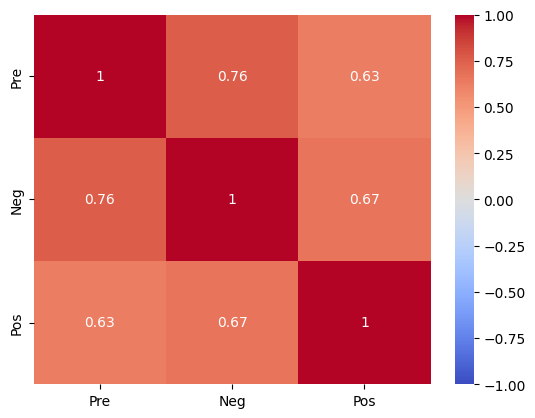

In [403]:
# pivot long-form cleaned tables if you have them
# but assuming wo_landscape already has distinct columns

sample_cols = ["Pre", "Neg", "Pos"]  # or Pre1, Pre2,... once expanded later

corr = wo_landscape[sample_cols].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)


Samples: ['Library-1-Neg-1', 'Library-1-Neg-2', 'Library-1-Neg-3', 'Library-1-Pos-1', 'Library-1-Pos-2', 'Library-1-Pos-3', 'Library-1-Pre-1', 'Library-1-Pre-2', 'Library-1-Pre-3', 'Library-2-Neg-2', 'Library-2-Neg-3', 'Library-2-Pos-2', 'Library-2-Pos-3', 'Library-2-Pre-2', 'Library-2-Pre-3', 'Library-3-Neg-2', 'Library-3-Neg-3', 'Library-3-Pos-1', 'Library-3-Pos-2', 'Library-3-Pos-3', 'Library-3-Pre-2', 'Library-3-Pre-3']
Ordering: ['Library-1-Pre-1', 'Library-1-Pre-2', 'Library-1-Pre-3', 'Library-2-Pre-2', 'Library-2-Pre-3', 'Library-3-Pre-2', 'Library-3-Pre-3', 'Library-1-Neg-1', 'Library-1-Neg-2', 'Library-1-Neg-3', 'Library-2-Neg-2', 'Library-2-Neg-3', 'Library-3-Neg-2', 'Library-3-Neg-3', 'Library-1-Pos-1', 'Library-1-Pos-2', 'Library-1-Pos-3', 'Library-2-Pos-2', 'Library-2-Pos-3', 'Library-3-Pos-1', 'Library-3-Pos-2', 'Library-3-Pos-3']


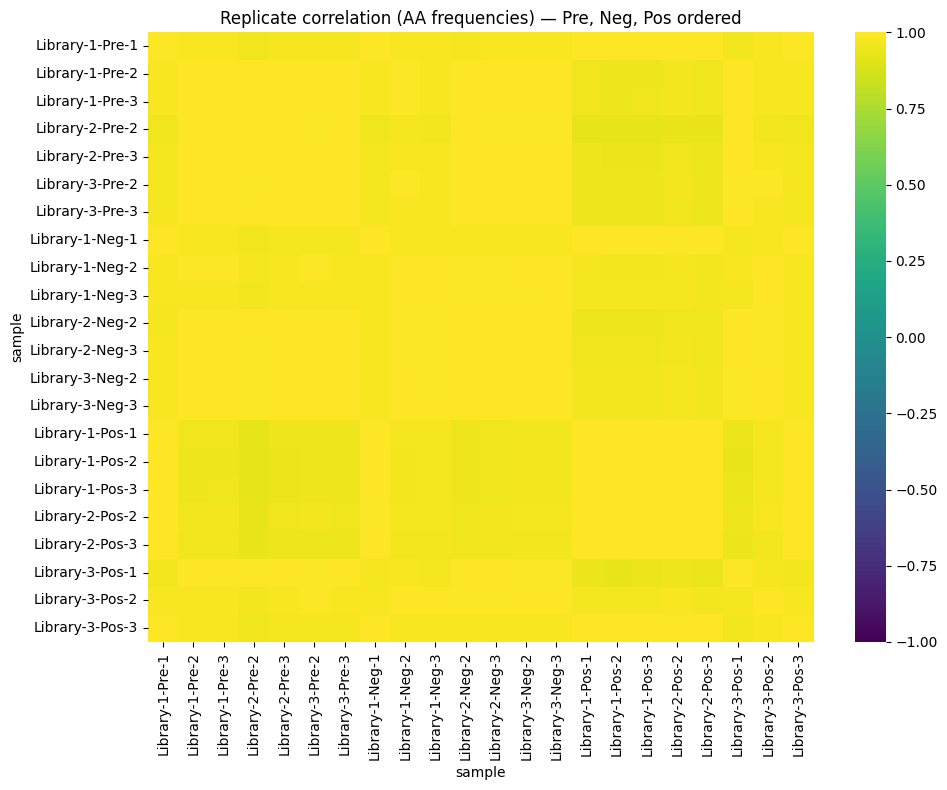

In [519]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Get the sample names from the index, not the columns
samples = freq_matrix.index.tolist()
print("Samples:", samples)

# Helper to impose Library / replicate ordering within each condition
def sort_key(name: str):
    # assumes names like "Library-1-Pre-2"
    parts = name.split("-")
    lib = int(parts[1])
    cond = parts[2]
    rep = int(parts[3])
    return (lib, rep)

pre_samples = sorted([s for s in samples if "-Pre-" in s], key=sort_key)
neg_samples = sorted([s for s in samples if "-Neg-" in s], key=sort_key)
pos_samples = sorted([s for s in samples if "-Pos-" in s], key=sort_key)

ordered_samples = pre_samples + neg_samples + pos_samples
print("Ordering:", ordered_samples)

# 2) Compute and reorder correlation matrix
corr = freq_matrix.T.corr()
corr_reordered = corr.loc[ordered_samples, ordered_samples]

# 3) Plot
plt.figure(figsize=(10, 8))
sns.heatmap(corr_reordered, annot=False, cmap="viridis",
            vmin=-1, vmax=1)
plt.title("Replicate correlation (AA frequencies) — Pre, Neg, Pos ordered")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [521]:
corr

sample,Library-1-Neg-1,Library-1-Neg-2,Library-1-Neg-3,Library-1-Pos-1,Library-1-Pos-2,Library-1-Pos-3,Library-1-Pre-1,Library-1-Pre-2,Library-1-Pre-3,Library-2-Neg-2,...,Library-2-Pos-3,Library-2-Pre-2,Library-2-Pre-3,Library-3-Neg-2,Library-3-Neg-3,Library-3-Pos-1,Library-3-Pos-2,Library-3-Pos-3,Library-3-Pre-2,Library-3-Pre-3
sample,,,,,,,,,,,,,,,,,,,,,
Library-1-Neg-1,1.000000,0.981639,0.980695,0.994009,0.992570,0.994042,0.999593,0.978035,0.979292,0.977110,...,0.995779,0.959914,0.973671,0.982279,0.982419,0.969008,0.981624,0.999889,0.974662,0.975590
Library-1-Neg-2,0.981639,1.000000,0.997632,0.969054,0.967504,0.967726,0.982178,0.985991,0.986669,0.988962,...,0.967121,0.970809,0.982364,0.993792,0.994266,0.978412,0.998099,0.982479,0.985661,0.982800
Library-1-Neg-3,0.980695,0.997632,1.000000,0.971394,0.970434,0.969731,0.982019,0.982158,0.983160,0.985288,...,0.967440,0.964559,0.978429,0.991991,0.992697,0.969476,0.999860,0.982199,0.984237,0.979296
Library-1-Pos-1,0.994009,0.969054,0.971394,1.000000,0.999618,0.999790,0.995355,0.953848,0.955133,0.952582,...,0.998058,0.928039,0.946322,0.963302,0.963429,0.939628,0.972229,0.994125,0.952418,0.949334
Library-1-Pos-2,0.992570,0.967504,0.970434,0.999618,1.000000,0.999285,0.994083,0.951729,0.952775,0.950639,...,0.996375,0.926424,0.944214,0.961791,0.961862,0.937236,0.971086,0.992773,0.950890,0.947008
Library-1-Pos-3,0.994042,0.967726,0.969731,0.999790,0.999285,1.000000,0.994931,0.952168,0.953955,0.951554,...,0.998414,0.926413,0.945152,0.961575,0.961936,0.939033,0.970542,0.994055,0.949998,0.948103
Library-1-Pre-1,0.999593,0.982178,0.982019,0.995355,0.994083,0.994931,1.000000,0.977298,0.978012,0.975556,...,0.996158,0.958028,0.971887,0.982379,0.982280,0.966156,0.983026,0.999650,0.975048,0.974224
Library-1-Pre-2,0.978035,0.985991,0.982158,0.953848,0.951729,0.952168,0.977298,1.000000,0.999333,0.997844,...,0.956721,0.994421,0.998633,0.996133,0.995823,0.994949,0.983153,0.978428,0.997477,0.999072
Library-1-Pre-3,0.979292,0.986669,0.983160,0.955133,0.952775,0.953955,0.978012,0.999333,1.000000,0.998802,...,0.958406,0.993352,0.999090,0.995825,0.996155,0.995534,0.983998,0.979672,0.996364,0.999400


In [405]:
import pandas as pd
import numpy as np

# 1) Correlation matrix between samples (already what you used)
corr = freq_matrix.T.corr()

# 2) Build a metadata table keyed by sample
meta_cols = ["sample", "library_id", "condition", "replicate"]
meta = (
    aa_all[meta_cols]
    .drop_duplicates()
    .set_index("sample")
)

# Optional: add a simple depth metric per sample
depth = (
    aa_all.groupby("sample")["total_site_sample"]
    .first()  # same per site, so take one
)
meta["depth"] = depth

# 3) For each sample, compute mean correlation with its own group (same lib + condition)
records = []

for sample in corr.index:
    lib = meta.loc[sample, "library_id"]
    cond = meta.loc[sample, "condition"]
    
    # samples in same library + condition, excluding self
    same_group = meta[
        (meta["library_id"] == lib) &
        (meta["condition"] == cond)
    ].index.tolist()
    same_group = [s for s in same_group if s != sample]
    
    # if there are no other replicates, skip
    if not same_group:
        mean_within = np.nan
        min_within = np.nan
    else:
        vals = corr.loc[sample, same_group]
        mean_within = vals.mean()
        min_within = vals.min()
    
    # for context: mean correlation to all *other* samples
    others = [s for s in corr.index if s != sample]
    mean_overall = corr.loc[sample, others].mean()
    
    records.append({
        "sample": sample,
        "library_id": lib,
        "condition": cond,
        "replicate": meta.loc[sample, "replicate"],
        "depth": meta.loc[sample, "depth"],
        "mean_within_group_corr": mean_within,
        "min_within_group_corr": min_within,
        "mean_corr_to_all_others": mean_overall,
    })

qc_summary = pd.DataFrame.from_records(records)
qc_summary.sort_values(["library_id", "condition", "replicate"], inplace=True)
qc_summary


,sample,library_id,condition,replicate,depth,mean_within_group_corr,min_within_group_corr,mean_corr_to_all_others
0,Library-1-Neg-1,1,Neg,1,1514500,0.981167,0.980695,0.983050
1,Library-1-Neg-2,1,Neg,2,3526,0.989636,0.981639,0.982311
2,Library-1-Neg-3,1,Neg,3,1696681,0.989164,0.980695,0.980793
3,Library-1-Pos-1,1,Pos,1,348969,0.999704,0.999618,0.969072
4,Library-1-Pos-2,1,Pos,2,39684,0.999451,0.999285,0.967504
5,Library-1-Pos-3,1,Pos,3,1113585,0.999537,0.999285,0.968028
6,Library-1-Pre-1,1,Pre,1,278513,0.977655,0.977298,0.982928
7,Library-1-Pre-2,1,Pre,2,20777,0.988315,0.977298,0.982583
8,Library-1-Pre-3,1,Pre,3,2129186,0.988672,0.978012,0.983177
9,Library-2-Neg-2,2,Neg,2,822540,0.999548,0.999548,0.982355


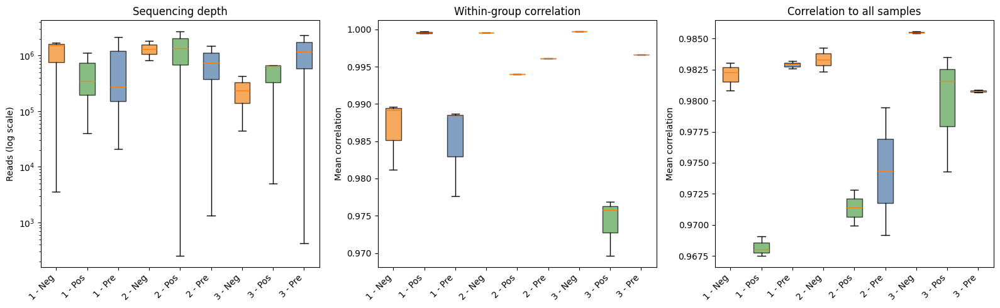

In [522]:
import matplotlib.pyplot as plt
import numpy as np

# ----------------------------------
# Prepare grouping labels
# ----------------------------------
qc = qc_summary.copy()

qc["group"] = qc["library_id"].astype(str) + " - " + qc["condition"]

# Order groups nicely
group_order = sorted(qc["group"].unique(), key=lambda x: (int(x.split(" - ")[0]), x.split(" - ")[1]))

# Map colors by condition
color_map = {
    "Pre": "#4C78A8",   # blue
    "Neg": "#F58518",   # orange
    "Pos": "#54A24B"    # green
}

group_colors = [color_map[g.split(" - ")[1]] for g in group_order]

# ----------------------------------
# Helper to extract data by group
# ----------------------------------
def get_grouped_values(column):
    return [qc.loc[qc["group"] == g, column].values for g in group_order]

# ----------------------------------
# Create figure
# ----------------------------------
fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharex=True)

# ----------------------------------
# Panel A: Depth (log scale)
# ----------------------------------
data_depth = get_grouped_values("depth")

bp = axes[0].boxplot(data_depth, patch_artist=True)

for patch, color in zip(bp["boxes"], group_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

axes[0].set_yscale("log")
axes[0].set_title("Sequencing depth")
axes[0].set_ylabel("Reads (log scale)")

# ----------------------------------
# Panel B: Within-group correlation
# ----------------------------------
data_within = get_grouped_values("mean_within_group_corr")

bp = axes[1].boxplot(data_within, patch_artist=True)

for patch, color in zip(bp["boxes"], group_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

axes[1].set_title("Within-group correlation")
axes[1].set_ylabel("Mean correlation")

# ----------------------------------
# Panel C: Correlation to all others
# ----------------------------------
data_all = get_grouped_values("mean_corr_to_all_others")

bp = axes[2].boxplot(data_all, patch_artist=True)

for patch, color in zip(bp["boxes"], group_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

axes[2].set_title("Correlation to all samples")
axes[2].set_ylabel("Mean correlation")

# ----------------------------------
# X labels
# ----------------------------------
for ax in axes:
    ax.set_xticks(range(1, len(group_order) + 1))
    ax.set_xticklabels(group_order, rotation=45, ha="right")

# ----------------------------------
# Layout
# ----------------------------------
plt.tight_layout()
plt.show()

Samples in aa_all (before): ['Library-1-Neg-1', 'Library-1-Neg-2', 'Library-1-Neg-3', 'Library-1-Pos-1', 'Library-1-Pos-2', 'Library-1-Pos-3', 'Library-1-Pre-1', 'Library-1-Pre-2', 'Library-1-Pre-3', 'Library-2-Neg-2', 'Library-2-Neg-3', 'Library-2-Pos-2', 'Library-2-Pos-3', 'Library-2-Pre-2', 'Library-2-Pre-3', 'Library-3-Neg-2', 'Library-3-Neg-3', 'Library-3-Pos-1', 'Library-3-Pos-2', 'Library-3-Pos-3', 'Library-3-Pre-2', 'Library-3-Pre-3']
Samples in aa_all_clean (after): ['Library-1-Neg-2', 'Library-1-Neg-3', 'Library-1-Pos-1', 'Library-1-Pos-2', 'Library-1-Pos-3', 'Library-1-Pre-2', 'Library-1-Pre-3', 'Library-2-Neg-2', 'Library-2-Neg-3', 'Library-2-Pos-2', 'Library-2-Pos-3', 'Library-2-Pre-2', 'Library-2-Pre-3', 'Library-3-Neg-2', 'Library-3-Neg-3', 'Library-3-Pos-1', 'Library-3-Pos-2', 'Library-3-Pos-3', 'Library-3-Pre-2', 'Library-3-Pre-3']


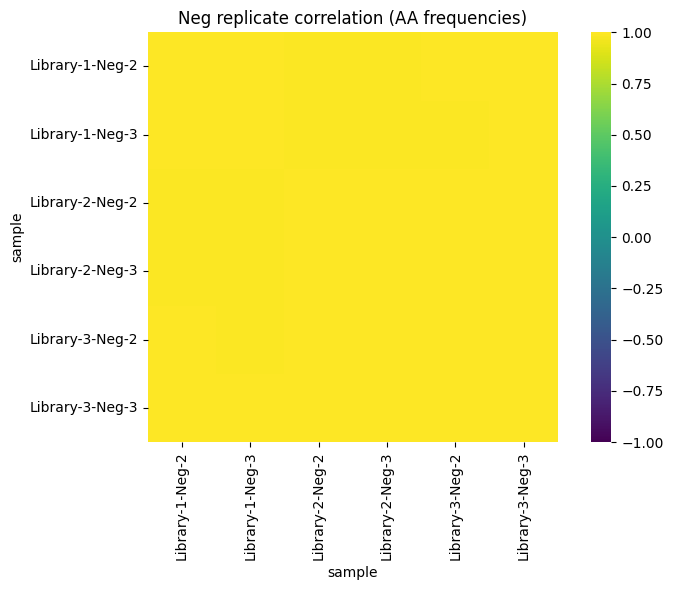

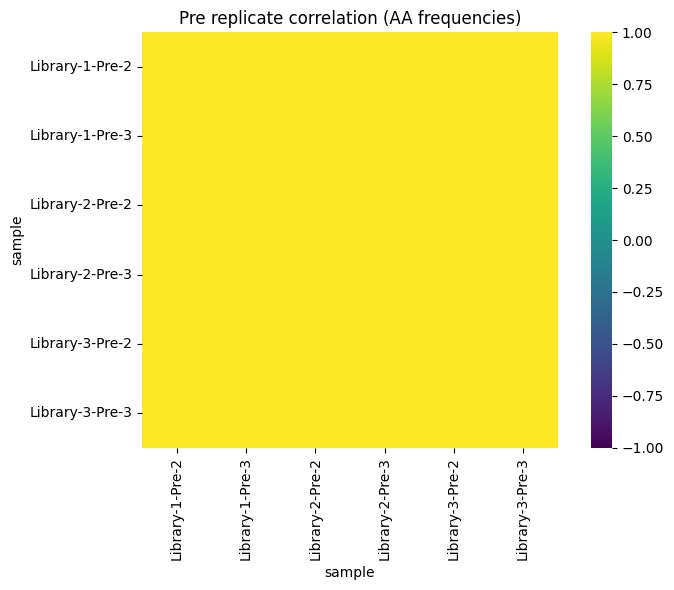

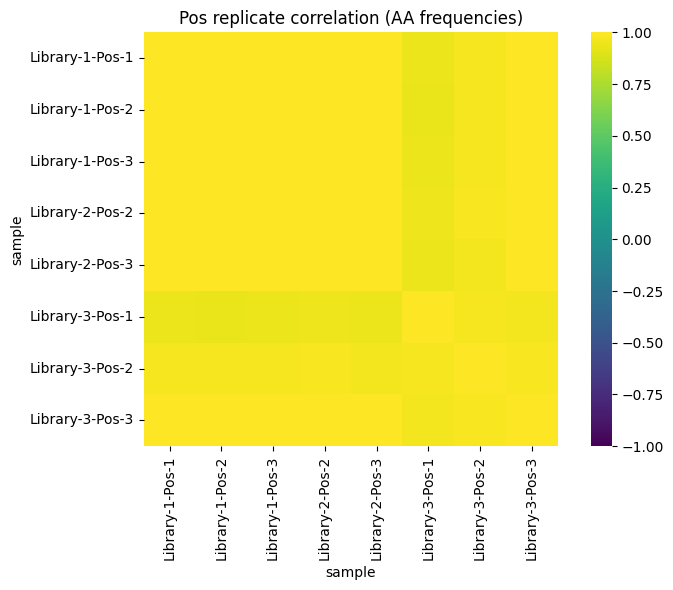

In [406]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Drop the mislabeled samples
bad_samples = ["Library-1-Neg-1", "Library-1-Pre-1"]

aa_all_clean = aa_all[~aa_all["sample"].isin(bad_samples)].copy()
print("Samples in aa_all (before):", sorted(aa_all["sample"].unique()))
print("Samples in aa_all_clean (after):", sorted(aa_all_clean["sample"].unique()))

# 2) Helper to plot replicate correlations for one condition
def plot_replicate_correlation(aa_df, condition, fig_size=(8, 6)):
    """
    condition: "Neg", "Pre", or "Pos"
    aa_df: dataframe like aa_all / aa_all_clean
    """
    # Pick samples for this condition (e.g. "-Neg-", "-Pre-", "-Pos-")
    samples = [
        s for s in aa_df["sample"].unique()
        if f"-{condition}-" in s
    ]
    if len(samples) == 0:
        print(f"[skip] no samples for condition {condition}")
        return
    
    sub = aa_df[aa_df["sample"].isin(samples)]

    # rows = samples, columns = site-AA frequencies
    freq_matrix = sub.pivot_table(
        index="sample",
        columns=["site", "aa"],
        values="frequency",
        fill_value=0
    )

    # Sort samples by library and replicate number for nice block structure
    def sort_key(name):
        # e.g. "Library-2-Neg-3" -> lib=2, rep=3
        parts = name.split("-")
        lib = int(parts[1])
        rep = int(parts[-1])
        return (lib, rep)

    sorted_samples = sorted(freq_matrix.index, key=sort_key)
    freq_matrix = freq_matrix.loc[sorted_samples]

    # Correlation matrix
    corr = freq_matrix.T.corr()

    # Plot
    plt.figure(figsize=fig_size)
    sns.heatmap(
        corr,
        cmap="viridis",
        vmin=-1, vmax=1,
        square=True,
        xticklabels=True,
        yticklabels=True
    )
    plt.title(f"{condition} replicate correlation (AA frequencies)")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# 3) Re-plot correlations using the cleaned data
plot_replicate_correlation(aa_all_clean, "Neg")
plot_replicate_correlation(aa_all_clean, "Pre")
plot_replicate_correlation(aa_all_clean, "Pos")


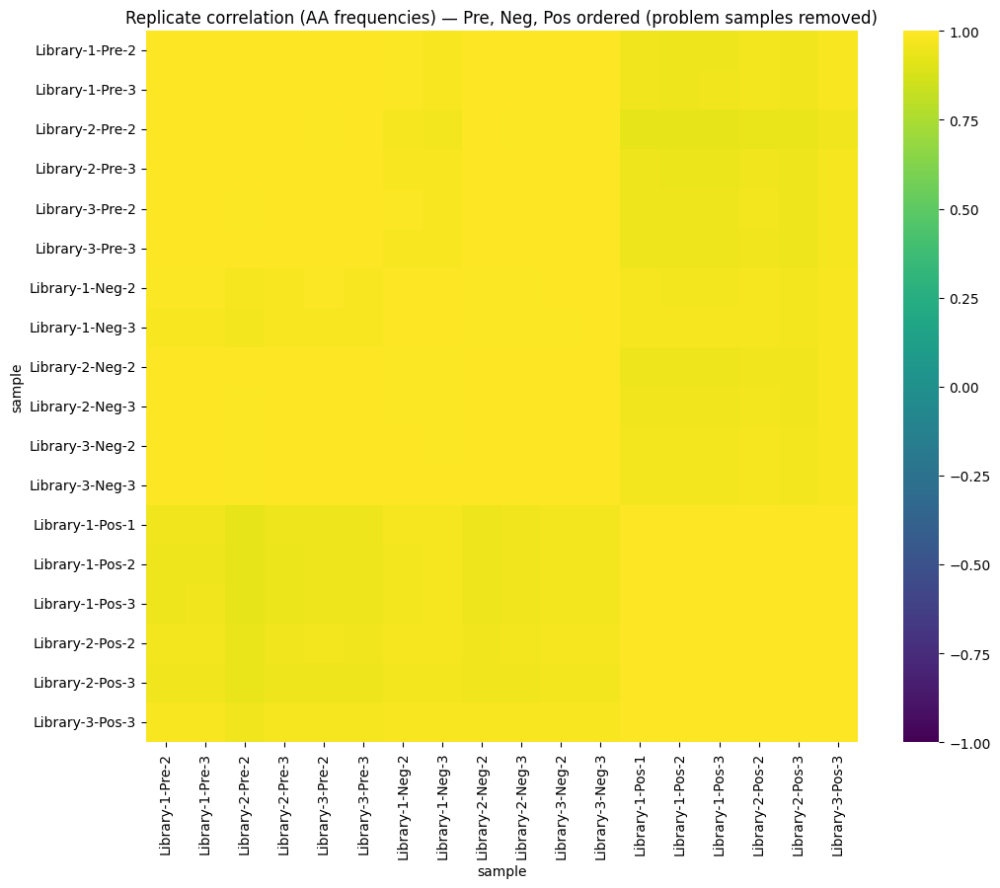

In [407]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# We assume aa_all_clean already exists and has columns:
# ["sample", "site", "aa", "frequency"]

# ----------------------------------------------------------------------
# 0) Remove the inconsistent Library-1 and Library-3 samples
# ----------------------------------------------------------------------

drop_samples = {
    "Library-1-Neg-1",
    "Library-1-Pre-1",
    "Library-3-Pos-1",
    "Library-3-Pos-2"
}

aa_all_clean_filtered = aa_all_clean[~aa_all_clean["sample"].isin(drop_samples)].copy()

# ----------------------------------------------------------------------
# 1) Build frequency matrix: rows = samples, columns = (site, aa)
# ----------------------------------------------------------------------

freq_matrix_all = aa_all_clean_filtered.pivot_table(
    index="sample",
    columns=["site", "aa"],
    values="frequency",
    fill_value=0
)

# ----------------------------------------------------------------------
# 2) Define desired sample ordering: Pre → Neg → Pos, then Lib#, then Rep#
# ----------------------------------------------------------------------

condition_order = {"Pre": 0, "Neg": 1, "Pos": 2}

def sort_key(name: str):
    # e.g. "Library-2-Pre-3" -> lib=2, cond="Pre", rep=3
    parts = name.split("-")
    lib = int(parts[1])
    cond = parts[2]
    rep = int(parts[3])
    return (condition_order[cond], lib, rep)

sorted_samples = sorted(freq_matrix_all.index, key=sort_key)
freq_matrix_all = freq_matrix_all.loc[sorted_samples]

# ----------------------------------------------------------------------
# 3) Sample–sample correlation
# ----------------------------------------------------------------------

corr_all = freq_matrix_all.T.corr()

# ----------------------------------------------------------------------
# 4) Plot ordered heatmap
# ----------------------------------------------------------------------

plt.figure(figsize=(11, 9))
sns.heatmap(
    corr_all,
    cmap="viridis",
    vmin=-1, vmax=1,
    square=True,
    xticklabels=True,
    yticklabels=True
)
plt.title("Replicate correlation (AA frequencies) — Pre, Neg, Pos ordered (problem samples removed)")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [408]:
pip install scikit-learn


[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: /Users/jonathanfelix/.venv/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


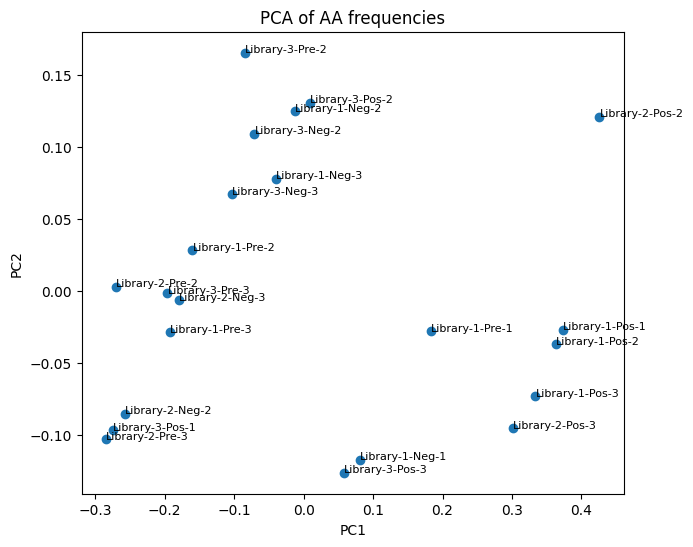

In [409]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
coords = pca.fit_transform(freq_matrix.values)

plt.figure(figsize=(7, 6))
plt.scatter(coords[:,0], coords[:,1])

for i, name in enumerate(freq_matrix.index):
    plt.text(coords[i,0], coords[i,1], name, fontsize=8)

plt.title("PCA of AA frequencies")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


In [410]:
wo_landscape.head()

,library_id,wo,Neg,Pos,Pre,log2fc_pos_pre,log2fc_neg_pre,delta_pos,delta_neg,mut_count,ddelta
0,1,OOOOOOOO,0.005949,0.008597,0.003254,1.401357,0.870073,0.005343,0.002694,8,0.531285
1,1,OOOOOOOW,0.001347,0.001362,0.001796,-0.398696,-0.414820,-0.000434,-0.000449,7,0.016124
2,1,OOOOOOWO,0.003486,0.001391,0.002819,-1.018301,0.306112,-0.001428,0.000667,7,-1.324413
3,1,OOOOOOWW,0.003220,0.000169,0.004767,-4.807749,-0.565828,-0.004598,-0.001547,6,-4.241921
4,1,OOOOOWOO,0.000682,0.000340,0.000464,-0.450684,0.553312,-0.000125,0.000218,7,-1.003995


In [340]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

for lib in sorted(wo_landscape["library_id"].unique()):
    sub = wo_landscape[wo_landscape["library_id"] == lib]
    means = sub.groupby("mut_count")["ddelta"].mean()
    plt.plot(means.index, means.values, marker="o", label=f"Library {lib}", alpha=0.7)

plt.axhline(0, color="grey", linestyle="--", linewidth=1)
plt.legend()
plt.title("ddelta vs Omicron-distance per library")
plt.xlabel("Number of Omicron-like sites")
plt.ylabel("ddelta")
plt.xticks(range(0, 9))
plt.tight_layout()
plt.show()


KeyError: 'mut_count'

<Figure size 800x600 with 0 Axes>

In [341]:
import numpy as np

pooled = (
    wo_landscape
    .groupby(["library_id", "mut_count"])["ddelta"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(8,5))

for lib in sorted(pooled["library_id"].unique()):
    sub = pooled[pooled["library_id"] == lib]
    plt.plot(sub["mut_count"], sub["ddelta"], marker="o", label=f"Lib {lib}")

plt.axhline(0, color="gray", linestyle="--")
plt.xlabel("mutational distance")
plt.ylabel("mean ddelta")
plt.title("Mean ddelta per library")
plt.legend()
plt.show()


KeyError: 'mut_count'

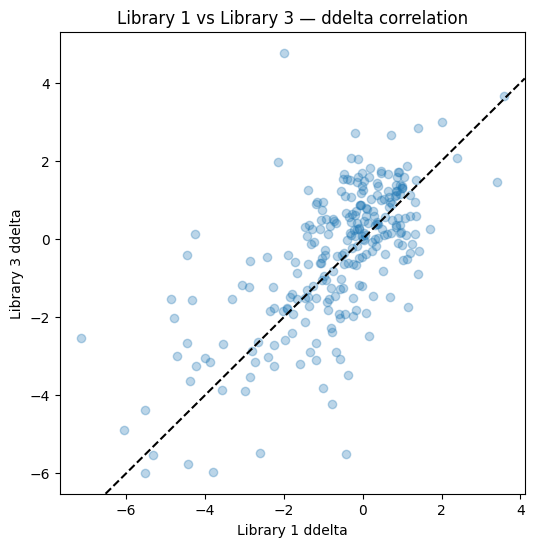

In [379]:
import matplotlib.pyplot as plt

lib1 = wo_landscape[wo_landscape["library_id"] == 1].set_index("wo")
lib2 = wo_landscape[wo_landscape["library_id"] == 2].set_index("wo")

merged = (
    lib1["ddelta"]
    .rename("L1")
    .to_frame()
    .join(lib2["ddelta"].rename("L3"), how="inner")
)

plt.figure(figsize=(6,6))
plt.scatter(merged["L1"], merged["L3"], alpha=0.3)
plt.xlabel("Library 1 ddelta")
plt.ylabel("Library 3 ddelta")
plt.title("Library 1 vs Library 3 — ddelta correlation")
plt.axline((0,0),(1,1), color="black", linestyle="--")
plt.show()


In [343]:
freq_matrix_all.head()

site                  477                                                    \
aa                      *         A         C         D         E         F   
sample                                                                        
Library-1-Pre-2  0.011647  0.002166  0.001540  0.001300  0.002070  0.002743   
Library-1-Pre-3  0.012296  0.003377  0.002523  0.002855  0.003543  0.004529   
Library-2-Pre-2  0.006056  0.002271  0.000757  0.002271  0.003028  0.001514   
Library-2-Pre-3  0.015358  0.006784  0.005003  0.004695  0.007056  0.009441   
Library-3-Pre-2  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

site                                                     ...       505  \
aa                      G         H         I         K  ...         M   
sample                                                   ...             
Library-1-Pre-2  0.002599  0.014054  0.035424  0.009289  ...  0.001059   
Library-1-Pre-3  0.003765  0.020048  0.033105  0.009010  ...  0.001695   
Library-2-Pre-2  0.001514  0.013626  0.043149  0.009841  ...  0.001514   
Library-2-Pre-3  0.007440  0.019351  0.037407  0.014707  ...  0.002754   
Library-3-Pre-2  0.000000  0.004695  0.035211  0.000000  ...  0.000000   

site                                                                         \
aa                      N         P         Q         R         S         T   
sample                                                                        
Library-1-Pre-2  0.003417  0.003032  0.018482  0.003995  0.060596  0.003802   
Library-1-Pre-3  0.004492  0.004755  0.017513  0.006802  0.063683  0.005141   
Library-2-Pre-2  0.002271  0.002271  0.017411  0.006813  0.068130  0.002271   
Library-2-Pre-3  0.007784  0.008080  0.018880  0.012378  0.064674  0.008904   
Library-3-Pre-2  0.000000  0.002347  0.004695  0.000000  0.032864  0.000000   

site                                           
aa                      V         W         Y  
sample                                         
Library-1-Pre-2  0.011262  0.000722  0.327477  
Library-1-Pre-3  0.022208  0.001286  0.307436  
Library-2-Pre-2  0.009841  0.000757  0.277063  
Library-2-Pre-3  0.023710  0.002424  0.278640  
Library-3-Pre-2  0.007042  0.000000  0.356808  

[5 rows x 168 columns]

In [344]:
aa_all_clean_filtered.head

<bound method NDFrame.head of      aa  umi_count           sample  site  total_site_sample  frequency  \
168   S       1532  Library-1-Neg-2   477               3526   0.434487   
169   N       1435  Library-1-Neg-2   477               3526   0.406977   
170   P        102  Library-1-Neg-2   477               3526   0.028928   
171   *         75  Library-1-Neg-2   477               3526   0.021271   
172   Y         70  Library-1-Neg-2   477               3526   0.019853   
...  ..        ...              ...   ...                ...        ...   
3477  N       5729  Library-3-Pre-3   505            2335210   0.002453   
3478  E       3858  Library-3-Pre-3   505            2335210   0.001652   
3479  K       3719  Library-3-Pre-3   505            2335210   0.001593   
3480  M       1777  Library-3-Pre-3   505            2335210   0.000761   
3481  W       1765  Library-3-Pre-3   505            2335210   0.000756   

      library_id condition  replicate  
168            1       Neg   

In [345]:
# Compute total counts per sample
sample_totals = wo_counts.groupby("sample")["umi_count"].sum()

# Add frequency column
wo_counts["frequency"] = wo_counts.apply(
    lambda row: row["umi_count"] / sample_totals[row["sample"]],
    axis=1
)

geno_freq_matrix = wo_counts.pivot_table(
    index="sample",
    columns="wo",
    values="frequency",
    fill_value=0
)


geno_corr = geno_freq_matrix.T.corr()
geno_corr

# Use the same meta table from earlier, but based on wo_counts
meta_wo = wo_counts[["sample", "library_id", "condition", "replicate"]].drop_duplicates().set_index("sample")

records = []
for sample in geno_corr.index:
    lib = meta_wo.loc[sample, "library_id"]
    cond = meta_wo.loc[sample, "condition"]
    
    # samples in same group
    same_group = meta_wo[
        (meta_wo["library_id"] == lib) &
        (meta_wo["condition"] == cond)
    ].index.tolist()
    same_group = [s for s in same_group if s != sample]
    
    if not same_group:
        mean_within = np.nan
        min_within = np.nan
    else:
        vals = geno_corr.loc[sample, same_group]
        mean_within = vals.mean()
        min_within = vals.min()
    
    records.append({
        "sample": sample,
        "library_id": lib,
        "condition": cond,
        "replicate": meta_wo.loc[sample, "replicate"],
        "mean_within_group_corr": mean_within,
        "min_within_group_corr": min_within,
        "mean_corr_to_all_others": geno_corr.loc[sample, :].mean()
    })

geno_qc_summary = pd.DataFrame(records)
geno_qc_summary.sort_values(["library_id", "condition", "replicate"])


,sample,library_id,condition,replicate,mean_within_group_corr,min_within_group_corr,mean_corr_to_all_others
0,Library-1-Neg-1,1,Neg,1,0.451664,0.449842,0.696378
1,Library-1-Neg-2,1,Neg,2,0.718996,0.453486,0.538100
2,Library-1-Neg-3,1,Neg,3,0.717174,0.449842,0.531839
3,Library-1-Pos-1,1,Pos,1,0.998504,0.997177,0.614312
4,Library-1-Pos-2,1,Pos,2,0.996730,0.996284,0.603025
5,Library-1-Pos-3,1,Pos,3,0.998058,0.996284,0.614008
6,Library-1-Pre-1,1,Pre,1,0.615740,0.614573,0.695300
7,Library-1-Pre-2,1,Pre,2,0.803866,0.614573,0.684137
8,Library-1-Pre-3,1,Pre,3,0.805033,0.616908,0.689399
9,Library-2-Neg-2,2,Neg,2,0.999035,0.999035,0.634549


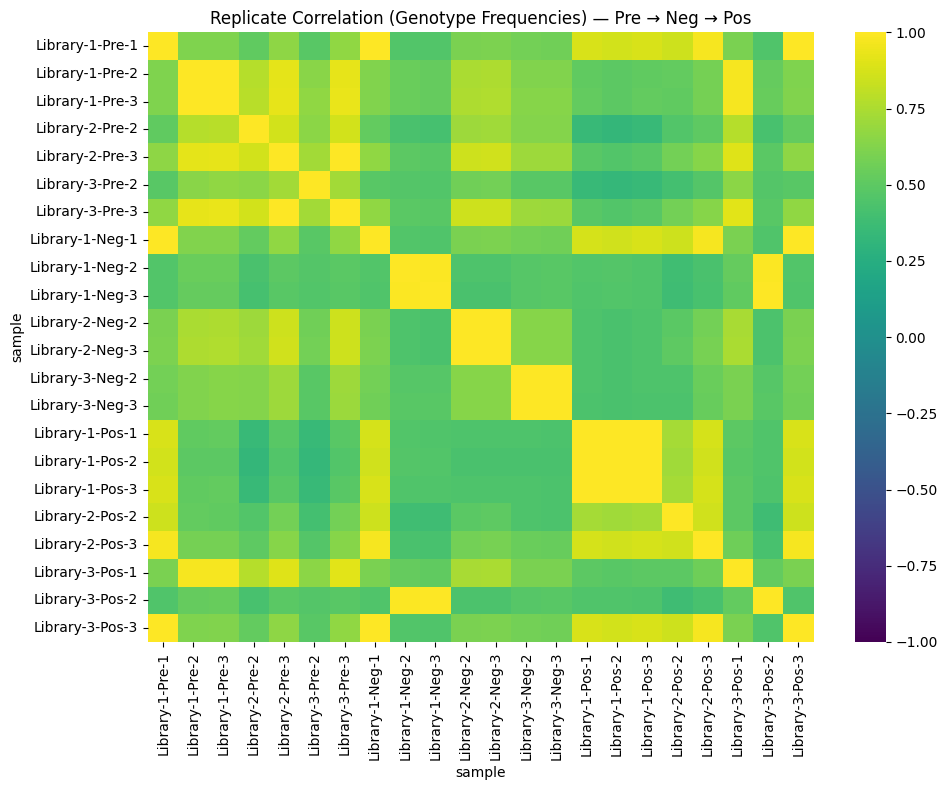

In [346]:
import seaborn as sns
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1) Sample ordering: Pre → Neg → Pos, sorted by library/rep
# ---------------------------------------------------------

samples = geno_freq_matrix.index.tolist()

def sort_key(name: str):
    # expected sample name: "Library-3-Pos-2"
    parts = name.split("-")
    lib = int(parts[1])
    cond = parts[2]
    rep = int(parts[3])
    return (lib, rep)

pre_samples = sorted([s for s in samples if "-Pre-" in s], key=sort_key)
neg_samples = sorted([s for s in samples if "-Neg-" in s], key=sort_key)
pos_samples = sorted([s for s in samples if "-Pos-" in s], key=sort_key)

ordered_samples = pre_samples + neg_samples + pos_samples
ordered_samples

# ---------------------------------------------------------
# 2) Reorder correlation matrix according to the sample order
# ---------------------------------------------------------

geno_corr_reordered = geno_corr.loc[ordered_samples, ordered_samples]

# ---------------------------------------------------------
# 3) Plot heatmap
# ---------------------------------------------------------

plt.figure(figsize=(10, 8))
sns.heatmap(
    geno_corr_reordered,
    annot=False,
    cmap="viridis",
    vmin=-1,
    vmax=1
)
plt.title("Replicate Correlation (Genotype Frequencies) — Pre → Neg → Pos")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



In [347]:
wo_counts.head()

,wo,umi_count,library_id,condition,replicate,sample,frequency
0,OOOOOOOO,194324,1,Neg,1,Library-1-Neg-1,0.008346
1,OOOOOOOW,48760,1,Neg,1,Library-1-Neg-1,0.002094
2,OOOOOOWO,48170,1,Neg,1,Library-1-Neg-1,0.002069
3,OOOOOOWW,45465,1,Neg,1,Library-1-Neg-1,0.001953
4,OOOOOWOO,21254,1,Neg,1,Library-1-Neg-1,0.000913


In [348]:
wo_counts.groupby("sample")["frequency"].sum()


sample
Library-1-Neg-1    1.0
Library-1-Neg-2    1.0
Library-1-Neg-3    1.0
Library-1-Pos-1    1.0
Library-1-Pos-2    1.0
Library-1-Pos-3    1.0
Library-1-Pre-1    1.0
Library-1-Pre-2    1.0
Library-1-Pre-3    1.0
Library-2-Neg-2    1.0
Library-2-Neg-3    1.0
Library-2-Pos-2    1.0
Library-2-Pos-3    1.0
Library-2-Pre-2    1.0
Library-2-Pre-3    1.0
Library-3-Neg-2    1.0
Library-3-Neg-3    1.0
Library-3-Pos-1    1.0
Library-3-Pos-2    1.0
Library-3-Pos-3    1.0
Library-3-Pre-2    1.0
Library-3-Pre-3    1.0
Name: frequency, dtype: float64

In [349]:
#Collapse replicates within each library/condition
#Best practice: collapse at the count level, then renormalize per library/condition

import pandas as pd
import numpy as np

# Start from wo_counts

# Step 1: sum counts across replicates within each library/condition/wo
lib_cond_agg = (
    wo_counts
    .groupby(["library_id", "condition", "wo"], as_index=False)
    .agg({"umi_count": "sum"})
)

# Step 2: compute total counts per library/condition
lib_cond_agg["total_umi_lib_cond"] = (
    lib_cond_agg
    .groupby(["library_id", "condition"])["umi_count"]
    .transform("sum")
)

# Step 3: normalize within each library/condition to get frequencies
lib_cond_agg["freq_lib_cond"] = (
    lib_cond_agg["umi_count"] / lib_cond_agg["total_umi_lib_cond"]
)


In [350]:
lib_cond_agg.head()

,library_id,condition,wo,umi_count,total_umi_lib_cond,freq_lib_cond
0,1,Neg,OOOOOOOO,267700,45002366,0.005949
1,1,Neg,OOOOOOOW,60615,45002366,0.001347
2,1,Neg,OOOOOOWO,156880,45002366,0.003486
3,1,Neg,OOOOOOWW,144912,45002366,0.003220
4,1,Neg,OOOOOWOO,30689,45002366,0.000682


In [351]:
#2. Reshape into Pre/Neg/Pos columns per genotype

lib_cond_wide = (
    lib_cond_agg
    .pivot_table(
        index=["library_id", "wo"],
        columns="condition",
        values="freq_lib_cond",
        fill_value=0
    )
    .reset_index()
)

# Make sure columns are named nicely
# After pivot, columns look like: ['library_id','wo','Neg','Pos','Pre'] (depending on order)
lib_cond_wide.columns.name = None  # drop the pivot column name


In [352]:
lib_cond_wide.head()

,library_id,wo,Neg,Pos,Pre
0,1,OOOOOOOO,0.005949,0.008597,0.003254
1,1,OOOOOOOW,0.001347,0.001362,0.001796
2,1,OOOOOOWO,0.003486,0.001391,0.002819
3,1,OOOOOOWW,0.003220,0.000169,0.004767
4,1,OOOOOWOO,0.000682,0.000340,0.000464


In [353]:
#Verify presence of 256 variants per sample set
len(lib_cond_wide)/3

256.0

In [354]:
#Compute enrichment metrics 
#Choose a small pseudocount
pseudocount = 1e-6

df = lib_cond_wide.copy()

# Ensure expected columns are present; if not, you can add with zeros
for col in ["Pre", "Neg", "Pos"]:
    if col not in df.columns:
        df[col] = 0.0

# Log2 fold-changes with pseudocount
df["log2fc_pos_pre"] = np.log2((df["Pos"] + pseudocount) / (df["Pre"] + pseudocount))
df["log2fc_neg_pre"] = np.log2((df["Neg"] + pseudocount) / (df["Pre"] + pseudocount))

# Simple deltas (linear difference in normalized freq)
df["delta_pos"] = df["Pos"] - df["Pre"]
df["delta_neg"] = df["Neg"] - df["Pre"]

# Number of Omicron-matching positions in the WO string
df["mut_count"] = df["wo"].str.count("O")  # assuming W = Wuhan, O = Omicron

# A combined enrichment metric (same idea as your old ddelta)
df["ddelta"] = df["log2fc_pos_pre"] - df["log2fc_neg_pre"]


In [355]:
df.head()

,library_id,wo,Neg,Pos,Pre,log2fc_pos_pre,log2fc_neg_pre,delta_pos,delta_neg,mut_count,ddelta
0,1,OOOOOOOO,0.005949,0.008597,0.003254,1.401357,0.870073,0.005343,0.002694,8,0.531285
1,1,OOOOOOOW,0.001347,0.001362,0.001796,-0.398696,-0.414820,-0.000434,-0.000449,7,0.016124
2,1,OOOOOOWO,0.003486,0.001391,0.002819,-1.018301,0.306112,-0.001428,0.000667,7,-1.324413
3,1,OOOOOOWW,0.003220,0.000169,0.004767,-4.807749,-0.565828,-0.004598,-0.001547,6,-4.241921
4,1,OOOOOWOO,0.000682,0.000340,0.000464,-0.450684,0.553312,-0.000125,0.000218,7,-1.003995


In [356]:
#1. Collapse replicates to library–condition level and renormalize
import pandas as pd
import numpy as np

# 1) Aggregate counts across replicates within each library / condition / genotype
lib_cond_agg = (
    wo_counts
    .groupby(["library_id", "condition", "wo"], as_index=False)
    .agg({"umi_count": "sum"})
)

# 2) Compute total counts per library / condition
lib_cond_agg["total_umi_lib_cond"] = (
    lib_cond_agg
    .groupby(["library_id", "condition"])["umi_count"]
    .transform("sum")
)

# 3) Normalize within each library / condition to get pooled frequencies
lib_cond_agg["freq_lib_cond"] = (
    lib_cond_agg["umi_count"] / lib_cond_agg["total_umi_lib_cond"]
)

lib_cond_agg.head()


,library_id,condition,wo,umi_count,total_umi_lib_cond,freq_lib_cond
0,1,Neg,OOOOOOOO,267700,45002366,0.005949
1,1,Neg,OOOOOOOW,60615,45002366,0.001347
2,1,Neg,OOOOOOWO,156880,45002366,0.003486
3,1,Neg,OOOOOOWW,144912,45002366,0.003220
4,1,Neg,OOOOOWOO,30689,45002366,0.000682


In [357]:
len(lib_cond_agg)

2304

In [358]:
# 4) Pivot so each row is (library_id, wo) and columns are Pre, Neg, Pos frequencies
lib_cond_wide = (
    lib_cond_agg
    .pivot_table(
        index=["library_id", "wo"],
        columns="condition",
        values="freq_lib_cond",
        fill_value=0.0
    )
    .reset_index()
)

# Clean up the column index name if pivot added one
lib_cond_wide.columns.name = None

lib_cond_wide.head()


,library_id,wo,Neg,Pos,Pre
0,1,OOOOOOOO,0.005949,0.008597,0.003254
1,1,OOOOOOOW,0.001347,0.001362,0.001796
2,1,OOOOOOWO,0.003486,0.001391,0.002819
3,1,OOOOOOWW,0.003220,0.000169,0.004767
4,1,OOOOOWOO,0.000682,0.000340,0.000464


In [359]:
len(lib_cond_wide)

768

In [484]:
# 5) Ensure the expected condition columns exist (in case some are missing)
for col in ["Pre", "Neg", "Pos"]:
    if col not in lib_cond_wide.columns:
        lib_cond_wide[col] = 0.0

# 6) Define a pseudocount for log fold-change calculations
pseudocount = 1e-6

df = lib_cond_wide.copy()

# Log2 fold changes: Pos vs Pre, Neg vs Pre
df["log2fc_pos_pre"] = np.log2((df["Pos"] + pseudocount) / (df["Pre"] + pseudocount))
df["log2fc_neg_pre"] = np.log2((df["Neg"] + pseudocount) / (df["Pre"] + pseudocount))

# Linear differences in normalized frequency
df["delta_pos"] = df["Pos"] - df["Pre"]
df["delta_neg"] = df["Neg"] - df["Pre"]

# Mutational distance: number of Omicron-matching positions in the WO string
# (assuming W = Wuhan residue, O = Omicron residue)
df["mut_count"] = df["wo"].str.count("O")

# Combined enrichment contrast (similar to your previous ddelta)
df["ddelta"] = df["log2fc_pos_pre"] - df["log2fc_neg_pre"]

# This is the main variant-level analysis table
wo_landscape = df

wo_landscape.head()


,library_id,wo,Neg,Pos,Pre,log2fc_pos_pre,log2fc_neg_pre,delta_pos,delta_neg,mut_count,ddelta
0,1,OOOOOOOO,0.005949,0.008597,0.003254,1.401357,0.870073,0.005343,0.002694,8,0.531285
1,1,OOOOOOOW,0.001347,0.001362,0.001796,-0.398696,-0.414820,-0.000434,-0.000449,7,0.016124
2,1,OOOOOOWO,0.003486,0.001391,0.002819,-1.018301,0.306112,-0.001428,0.000667,7,-1.324413
3,1,OOOOOOWW,0.003220,0.000169,0.004767,-4.807749,-0.565828,-0.004598,-0.001547,6,-4.241921
4,1,OOOOOWOO,0.000682,0.000340,0.000464,-0.450684,0.553312,-0.000125,0.000218,7,-1.003995


In [361]:
len(wo_landscape)

768

In [487]:
from scipy.stats import mannwhitneyu

# Subset data by library
lib1 = wo_landscape[wo_landscape["library_id"] == 1]["log2fc_pos_pre"]
lib2 = wo_landscape[wo_landscape["library_id"] == 2]["log2fc_pos_pre"]
lib3 = wo_landscape[wo_landscape["library_id"] == 3]["log2fc_pos_pre"]

# Pairwise tests
stat_1v2, p_1v2 = mannwhitneyu(lib1, lib2, alternative='two-sided')
stat_1v3, p_1v3 = mannwhitneyu(lib1, lib3, alternative='two-sided')
stat_2v3, p_2v3 = mannwhitneyu(lib2, lib3, alternative='two-sided')

# Print nicely
print(f"Library 1 vs 2: U = {stat_1v2}, p = {p_1v2:.2e}")
print(f"Library 1 vs 3: U = {stat_1v3}, p = {p_1v3:.2e}")
print(f"Library 2 vs 3: U = {stat_2v3}, p = {p_2v3:.2e}")

Library 1 vs 2: U = 30379.0, p = 1.54e-01
Library 1 vs 3: U = 27869.0, p = 3.43e-03
Library 2 vs 3: U = 30659.0, p = 2.08e-01


In [485]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# ---------------------------------------------------------
# 1) Determine global x-axis limits across all values
# ---------------------------------------------------------

all_vals = enrich_long["log2fc"].replace([np.inf, -np.inf], np.nan).dropna()
xmin = np.floor(all_vals.min())
xmax = np.ceil(all_vals.max())

print("Global x-range:", xmin, xmax)

# Optional: pad slightly so tails aren’t clipped
pad = 0.5
xmin -= pad
xmax += pad

# ---------------------------------------------------------
# 2) Plot distributions with same x-limits for all panels
# ---------------------------------------------------------

use_kde = False  # True = smooth curves, False = histograms

fig, axes = plt.subplots(1, n_lib, figsize=(5 * n_lib, 4), sharey=True)

if n_lib == 1:
    axes = [axes]

for ax, lib in zip(axes, libraries):

    df_lib = enrich_long[enrich_long["library_id"] == lib]

    if use_kde:
        sns.kdeplot(
            data=df_lib,
            x="log2fc",
            hue="contrast",
            common_norm=False,
            ax=ax,
            fill=True,
            alpha=0.4
        )
    else:
        sns.histplot(
            data=df_lib,
            x="log2fc",
            hue="contrast",
            element="step",
            stat="density",
            common_norm=False,
            bins=40,
            alpha=0.4,
            ax=ax
        )

    ax.set_xlim(xmin, xmax)  # <<< NORMALIZED X-AXIS
    ax.axvline(0, color="black", linestyle="--", linewidth=1)

    ax.set_title(f"Library {lib}")
    ax.set_xlabel("log₂ fold-change")
    if ax is axes[0]:
        ax.set_ylabel("Density")
    else:
        ax.set_ylabel("")

plt.tight_layout()
plt.show()


NameError: name 'enrich_long' is not defined

In [363]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------------------------------------
# 1) Clean data: drop inf / NaN in enrichment columns
# ---------------------------------------------------------
df = wo_landscape.copy()

for col in ["log2fc_pos_pre", "log2fc_neg_pre"]:
    df[col] = df[col].replace([np.inf, -np.inf], np.nan)

df = df.dropna(subset=["log2fc_pos_pre", "log2fc_neg_pre", "mut_count"])

# ---------------------------------------------------------
# 2) Aggregate by library and mutational load
# ---------------------------------------------------------
grouped = (
    df.groupby(["library_id", "mut_count"])
      .agg(
          mean_pos=("log2fc_pos_pre", "mean"),
          sd_pos=("log2fc_pos_pre", "std"),
          mean_neg=("log2fc_neg_pre", "mean"),
          sd_neg=("log2fc_neg_pre", "std"),
          n=("wo", "count")
      )
      .reset_index()
)

grouped.head()


,library_id,mut_count,mean_pos,sd_pos,mean_neg,sd_neg,n
0,1,0,0.253572,NaN,-0.005690,NaN,1
1,1,1,-0.391114,1.379329,-0.092257,0.711266,8
2,1,2,-0.759975,1.530385,-0.218827,0.622052,28
3,1,3,-1.312145,1.856823,-0.333162,0.663760,56
4,1,4,-1.096031,2.012844,-0.281362,0.744626,70


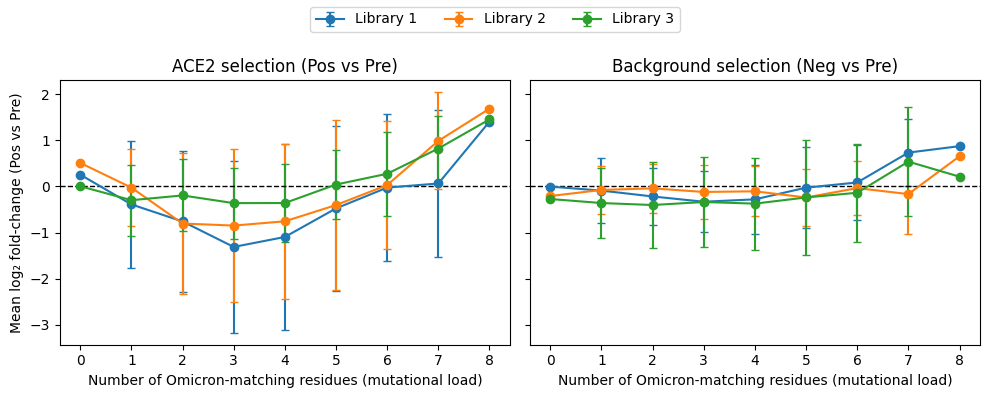

In [488]:
# ---------------------------------------------------------
# 3) Plot mean enrichment vs mutational load (Pos and Neg)
# ---------------------------------------------------------
libraries = sorted(grouped["library_id"].unique())
colors = sns.color_palette("tab10", n_colors=len(libraries))

fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

# ---- Pos vs Pre panel ----
ax = axes[0]
for lib, color in zip(libraries, colors):
    sub = grouped[grouped["library_id"] == lib]
    ax.errorbar(
        sub["mut_count"],
        sub["mean_pos"],
        yerr=sub["sd_pos"],
        fmt="-o",
        label=f"Library {lib}",
        color=color,
        capsize=3
    )

ax.axhline(0, color="black", linestyle="--", linewidth=1)
ax.set_xlabel("Number of Omicron-matching residues (mutational load)")
ax.set_ylabel("Mean log₂ fold-change (Pos vs Pre)")
ax.set_title("ACE2 selection (Pos vs Pre)")

# ---- Neg vs Pre panel ----
ax = axes[1]
for lib, color in zip(libraries, colors):
    sub = grouped[grouped["library_id"] == lib]
    ax.errorbar(
        sub["mut_count"],
        sub["mean_neg"],
        yerr=sub["sd_neg"],
        fmt="-o",
        label=f"Library {lib}",
        color=color,
        capsize=3
    )

ax.axhline(0, color="black", linestyle="--", linewidth=1)
ax.set_xlabel("Number of Omicron-matching residues (mutational load)")
ax.set_title("Background selection (Neg vs Pre)")

# ---- shared legend ----
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=len(libraries))
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.show()


In [491]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr, mannwhitneyu

# ---------------------------------------------------------
# 0) Clean data
# ---------------------------------------------------------
df = wo_landscape.copy()

for col in ["log2fc_pos_pre", "log2fc_neg_pre", "ddelta"]:
    df[col] = df[col].replace([np.inf, -np.inf], np.nan)

df = df.dropna(subset=["log2fc_pos_pre", "log2fc_neg_pre", "ddelta", "mut_count", "library_id"])

# ---------------------------------------------------------
# 1) Aggregate by library and mutational load
# ---------------------------------------------------------
grouped = (
    df.groupby(["library_id", "mut_count"])
      .agg(
          mean_pos=("log2fc_pos_pre", "mean"),
          sd_pos=("log2fc_pos_pre", "std"),
          mean_neg=("log2fc_neg_pre", "mean"),
          sd_neg=("log2fc_neg_pre", "std"),
          mean_ddelta=("ddelta", "mean"),
          sd_ddelta=("ddelta", "std"),
          n=("wo", "count")
      )
      .reset_index()
)

print("\n" + "="*80)
print("GROUPED SUMMARY BY LIBRARY AND MUTATIONAL LOAD")
print("="*80)
print(grouped)

# ---------------------------------------------------------
# 2) Pearson correlations across libraries for Pos, Neg, and ΔΔ trends
# ---------------------------------------------------------
def run_pairwise_pearson(grouped_df, value_col, label):
    pivot = grouped_df.pivot(index="mut_count", columns="library_id", values=value_col)
    pairs = [(1, 2), (1, 3), (2, 3)]

    print("\n" + "="*80)
    print(f"PEARSON CORRELATIONS: {label}")
    print("="*80)

    for a, b in pairs:
        x = pivot[a]
        y = pivot[b]
        valid = x.notna() & y.notna()
        r, p = pearsonr(x[valid], y[valid])
        print(f"{label}: Library {a} vs {b} -> r = {r:.4f}, p = {p:.4e}")

run_pairwise_pearson(grouped, "mean_pos", "Pos vs Pre mean trend")
run_pairwise_pearson(grouped, "mean_neg", "Neg vs Pre mean trend")
run_pairwise_pearson(grouped, "mean_ddelta", "ΔΔ mean trend")

# ---------------------------------------------------------
# 3) Mann–Whitney U tests: load 8 vs all other loads
#    for Pos, Neg, and ΔΔ within each library
# ---------------------------------------------------------
def run_load8_vs_others(df_in, value_col, label):
    print("\n" + "="*80)
    print(f"MANN–WHITNEY U TESTS: LOAD 8 VS ALL OTHER LOADS ({label})")
    print("="*80)

    for lib in sorted(df_in["library_id"].unique()):
        sub = df_in[df_in["library_id"] == lib]

        load8 = sub[sub["mut_count"] == 8][value_col].dropna()
        others = sub[sub["mut_count"] != 8][value_col].dropna()

        if len(load8) == 0 or len(others) == 0:
            print(f"Library {lib}: insufficient data")
            continue

        stat, p = mannwhitneyu(load8, others, alternative="two-sided")

        print(
            f"{label}: Library {lib} -> "
            f"n(load8) = {len(load8)}, n(others) = {len(others)}, "
            f"U = {stat:.4f}, p = {p:.4e}, "
            f"median(load8) = {np.median(load8):.4f}, median(others) = {np.median(others):.4f}"
        )

run_load8_vs_others(df, "log2fc_pos_pre", "Pos vs Pre")
run_load8_vs_others(df, "log2fc_neg_pre", "Neg vs Pre")
run_load8_vs_others(df, "ddelta", "ΔΔ (Pos - Neg)")

# ---------------------------------------------------------
# 4) Optional: pairwise Mann–Whitney U tests between libraries
#    within each mutational-load bin for Pos, Neg, and ΔΔ
# ---------------------------------------------------------
def run_pairwise_library_tests_by_load(df_in, value_col, label):
    pairs = [(1, 2), (1, 3), (2, 3)]
    loads = sorted(df_in["mut_count"].dropna().unique())

    print("\n" + "="*80)
    print(f"PAIRWISE LIBRARY COMPARISONS WITHIN EACH MUTATIONAL LOAD: {label}")
    print("="*80)

    for load in loads:
        print(f"\nMutational load = {int(load)}")
        for a, b in pairs:
            x = df_in[(df_in["library_id"] == a) & (df_in["mut_count"] == load)][value_col].dropna()
            y = df_in[(df_in["library_id"] == b) & (df_in["mut_count"] == load)][value_col].dropna()

            if len(x) == 0 or len(y) == 0:
                print(f"  Library {a} vs {b}: insufficient data")
                continue

            stat, p = mannwhitneyu(x, y, alternative="two-sided")
            print(
                f"  Library {a} vs {b} -> "
                f"n1 = {len(x)}, n2 = {len(y)}, "
                f"U = {stat:.4f}, p = {p:.4e}, "
                f"median1 = {np.median(x):.4f}, median2 = {np.median(y):.4f}"
            )

run_pairwise_library_tests_by_load(df, "log2fc_pos_pre", "Pos vs Pre")
run_pairwise_library_tests_by_load(df, "log2fc_neg_pre", "Neg vs Pre")
run_pairwise_library_tests_by_load(df, "ddelta", "ΔΔ (Pos - Neg)")


GROUPED SUMMARY BY LIBRARY AND MUTATIONAL LOAD
    library_id  mut_count  mean_pos    sd_pos  mean_neg    sd_neg  \
0            1          0  0.253572       NaN -0.005690       NaN   
1            1          1 -0.391114  1.379329 -0.092257  0.711266   
2            1          2 -0.759975  1.530385 -0.218827  0.622052   
3            1          3 -1.312145  1.856823 -0.333162  0.663760   
4            1          4 -1.096031  2.012844 -0.281362  0.744626   
5            1          5 -0.477661  1.786910 -0.028474  0.875275   
6            1          6 -0.026452  1.594720  0.083640  0.816904   
7            1          7  0.061617  1.593240  0.730691  0.721113   
8            1          8  1.401357       NaN  0.870073       NaN   
9            2          0  0.507641       NaN -0.210163       NaN   
10           2          1 -0.027455  0.827994 -0.077835  0.521068   
11           2          2 -0.804774  1.526033 -0.043574  0.532279   
12           2          3 -0.849610  1.663293 -0.121445

/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/1001655616.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.90, 1])  # leave room on right for the colorbar


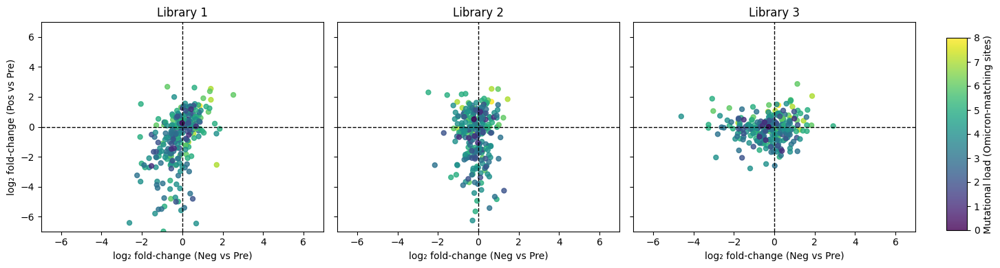

In [365]:
import matplotlib.pyplot as plt
import numpy as np

# ----------------------------------------
# Create a 1×3 layout
# ----------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharex=True, sharey=True)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])   # colorbar outside the right

# ----------------------------------------
# Global axis limits (same for all libraries)
# ----------------------------------------
all_vals = np.concatenate([
    wo_landscape["log2fc_neg_pre"].values,
    wo_landscape["log2fc_pos_pre"].values
])
vmin = np.nanmin(all_vals)
vmax = np.nanmax(all_vals)
lim = max(abs(vmin), abs(vmax))
xlim = ylim = (-lim, lim)

# ----------------------------------------
# Plot each library
# ----------------------------------------
libraries = [1, 2, 3]
sc = None

for ax, lib in zip(axes, libraries):

    df = wo_landscape[wo_landscape["library_id"] == lib]

    sc = ax.scatter(
        df["log2fc_neg_pre"],
        df["log2fc_pos_pre"],
        c=df["mut_count"],
        cmap="viridis",
        s=25,
        alpha=0.8
    )

    ax.axhline(0, color='black', linestyle='--', linewidth=1)
    ax.axvline(0, color='black', linestyle='--', linewidth=1)

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    ax.set_title(f"Library {lib}")
    ax.set_xlabel("log₂ fold-change (Neg vs Pre)")
    if lib == 1:
        ax.set_ylabel("log₂ fold-change (Pos vs Pre)")

# ----------------------------------------
# Colorbar added outside the plot
# ----------------------------------------
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label("Mutational load (Omicron-matching sites)")

plt.tight_layout(rect=[0, 0, 0.90, 1])  # leave room on right for the colorbar
plt.show()


In [366]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Start from your variant-level table
land = wo_landscape.copy()

# Clean infinities and drop missing enrichments
for col in ["log2fc_pos_pre", "log2fc_neg_pre"]:
    if col in land.columns:
        land[col] = land[col].replace([np.inf, -np.inf], np.nan)

land = land.dropna(subset=["log2fc_pos_pre"])

# Ensure mut_count exists (number of Omicron-matching sites)
# Assumes 'O' = Omicron, 'W' = Wuhan in the "wo" string
if "mut_count" not in land.columns:
    land["mut_count"] = land["wo"].str.count("O")

land["mut_count"] = land["mut_count"].astype(int)

# --- Bitstring order: treat W=0, O=1 and convert to integer ---

def wo_to_int(wo):
    bits = ["1" if c == "O" else "0" for c in wo]
    return int("".join(bits), 2)

land["wo_order"] = land["wo"].map(wo_to_int)

# --- Assign x,y positions for every genotype (wo) across all libraries ---
# y = mutational load (0..8), x = index within that layer (sorted by wo_order)

pos = {}   # mapping: wo -> (x, y)

for m in range(0, 9):  # mutational loads 0..8
    subset = land[land["mut_count"] == m].sort_values("wo_order")
    xs = np.arange(len(subset))
    y = m
    for wo_val, x_coord in zip(subset["wo"], xs):
        pos[wo_val] = (x_coord, y)


In [367]:
def get_edges_for_present_genotypes(df_lib):
    """
    Return list of (wo_a, wo_b) edges for genotypes present
    in this library that differ by exactly one site.
    """
    present_wos = set(df_lib["wo"])
    edges = []

    for wo in present_wos:
        chars = list(wo)
        for i in range(len(chars)):
            flipped = chars.copy()
            flipped[i] = "O" if chars[i] == "W" else "W"
            nbr = "".join(flipped)
            if nbr in present_wos and wo < nbr:  # avoid double counting
                edges.append((wo, nbr))
    return edges


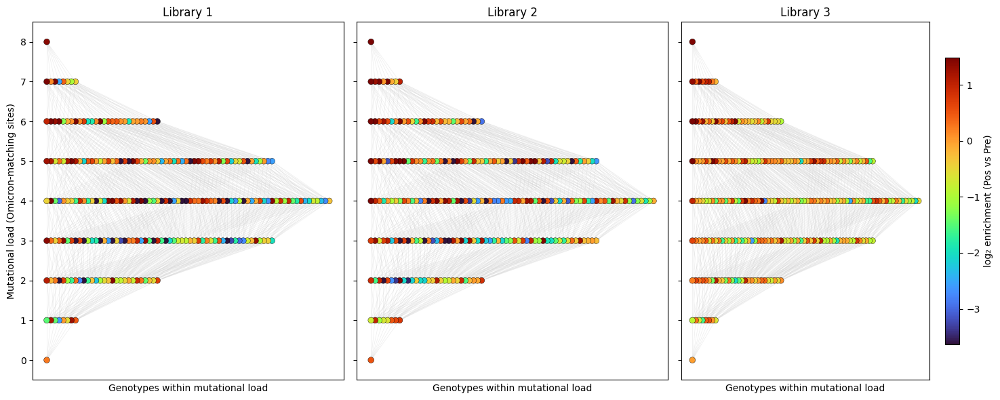

In [368]:
libraries = sorted(land["library_id"].unique())

fig, axes = plt.subplots(
    1, len(libraries),
    figsize=(5 * len(libraries), 6),
    sharey=True
)

# If only one library, make axes iterable
if len(libraries) == 1:
    axes = [axes]

# Use common color scale across libraries (robust to outliers)
vmin = land["log2fc_pos_pre"].quantile(0.05)
vmax = land["log2fc_pos_pre"].quantile(0.95)

last_scatter = None

for ax, lib in zip(axes, libraries):
    df_lib = land[land["library_id"] == lib]

    # Draw edges first (light background)
    edges = get_edges_for_present_genotypes(df_lib)
    for wo_a, wo_b in edges:
        x1, y1 = pos[wo_a]
        x2, y2 = pos[wo_b]
        ax.plot(
            [x1, x2], [y1, y2],
            color="lightgray",
            linewidth=0.5,
            alpha=0.4,
            zorder=1
        )

    # Node positions and colors
    xs = df_lib["wo"].map(lambda w: pos[w][0]).values
    ys = df_lib["wo"].map(lambda w: pos[w][1]).values
    cvals = df_lib["log2fc_pos_pre"].values

    last_scatter = ax.scatter(
        xs, ys,
        c=cvals,
        cmap="turbo",      # or "cividis" if you want colorblind-safe
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolors="black",
        linewidths=0.3,
        zorder=2
    )

    ax.set_title(f"Library {lib}")
    ax.set_xlabel("Genotypes within mutational load")
    ax.set_xticks([])

    ax.set_ylim(-0.5, 8.5)
    ax.set_yticks(range(0, 9))
    ax.set_yticklabels(range(0, 9))

    if ax is axes[0]:
        ax.set_ylabel("Mutational load (Omicron-matching sites)")

# Shared colorbar
# Shared colorbar on the right side only
cbar = fig.colorbar(
    last_scatter,
    ax=axes[-1],           # attach to the last subplot only
    location='right',
    shrink=0.8,
    pad=0.05               # small gap between plot and colorbar
)
cbar.set_label("log₂ enrichment (Pos vs Pre)")

plt.tight_layout()
plt.show()


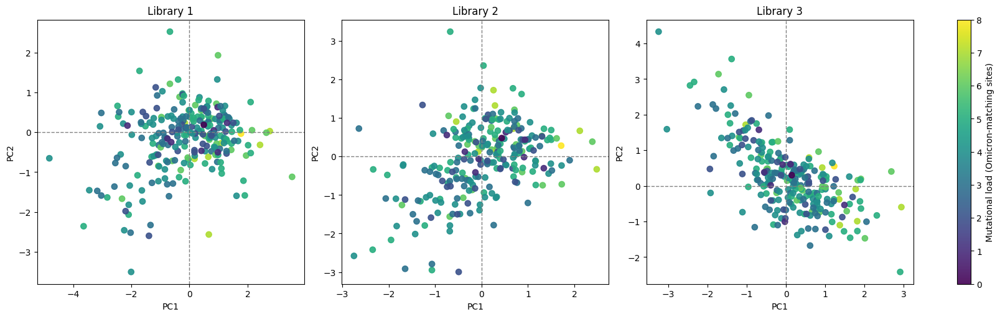

In [369]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Use the table that *does* have the log2FC columns
df = wo_landscape.copy()

# If mut_count isn't there for some reason, recompute it from the WO string
if "mut_count" not in df.columns:
    df["mut_count"] = df["wo"].str.count("O")

# Clean infinities / NaNs in the enrichment columns
for col in ["log2fc_pos_pre", "log2fc_neg_pre"]:
    df[col] = df[col].replace([np.inf, -np.inf], np.nan)

df = df.dropna(subset=["log2fc_pos_pre", "log2fc_neg_pre"])

# Features for PCA = Pos vs Pre and Neg vs Pre enrichments
X = df[["log2fc_pos_pre", "log2fc_neg_pre"]].values

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA
pca = PCA(n_components=2)
pca_coords = pca.fit_transform(X_scaled)

df["PC1"] = pca_coords[:, 0]
df["PC2"] = pca_coords[:, 1]

# --- Plot PCA per library_id ---
libraries = sorted(df["library_id"].unique())

fig, axes = plt.subplots(1, len(libraries), figsize=(16, 5), constrained_layout=True)
if len(libraries) == 1:
    axes = [axes]

for ax, lib in zip(axes, libraries):
    sub = df[df["library_id"] == lib]

    sc = ax.scatter(
        sub["PC1"],
        sub["PC2"],
        c=sub["mut_count"],
        cmap="viridis",
        s=45,
        alpha=0.9,
    )

    ax.axhline(0, color="gray", lw=1, ls="--")
    ax.axvline(0, color="gray", lw=1, ls="--")
    ax.set_title(f"Library {lib}")
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")

cbar = fig.colorbar(sc, ax=axes, location="right")
cbar.set_label("Mutational load (Omicron-matching sites)")

plt.show()


In [370]:
from scipy.stats import pearsonr

pca_df = df.copy()  # keep it explicit

r_pc2, p_pc2 = pearsonr(pca_df["PC2"], pca_df["mut_count"])
r_pc2, p_pc2


(np.float64(0.04976884123920515), np.float64(0.1682520838336677))

In [371]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

pca_df = wo_landscape.copy()

# ensure mut_count exists
if "mut_count" not in pca_df.columns:
    pca_df["mut_count"] = pca_df["wo"].str.count("O")

# clean infinities / NaNs
for col in ["log2fc_pos_pre", "log2fc_neg_pre"]:
    pca_df[col] = pca_df[col].replace([np.inf, -np.inf], np.nan)

pca_df = pca_df.dropna(subset=["log2fc_pos_pre", "log2fc_neg_pre"])

# PCA on the combined dataset (all libraries)
X = pca_df[["log2fc_pos_pre", "log2fc_neg_pre"]].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
pcs = pca.fit_transform(X_scaled)

pca_df["PC1"] = pcs[:, 0]
pca_df["PC2"] = pcs[:, 1]

pca_df.head()


,library_id,wo,Neg,Pos,Pre,log2fc_pos_pre,log2fc_neg_pre,delta_pos,delta_neg,mut_count,ddelta,PC1,PC2
0,1,OOOOOOOO,0.005949,0.008597,0.003254,1.401357,0.870073,0.005343,0.002694,8,0.531285,1.772491,-0.035111
1,1,OOOOOOOW,0.001347,0.001362,0.001796,-0.398696,-0.414820,-0.000434,-0.000449,7,0.016124,-0.158252,0.235859
2,1,OOOOOOWO,0.003486,0.001391,0.002819,-1.018301,0.306112,-0.001428,0.000667,7,-1.324413,0.173762,-0.667473
3,1,OOOOOOWW,0.003220,0.000169,0.004767,-4.807749,-0.565828,-0.004598,-0.001547,6,-4.241921,-2.320356,-1.667486
4,1,OOOOOWOO,0.000682,0.000340,0.000464,-0.450684,0.553312,-0.000125,0.000218,7,-1.003995,0.647246,-0.617574


In [372]:
import sys
!{sys.executable} -m pip install openpyxl



[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: /Users/jonathanfelix/.venv/bin/python -m pip install --upgrade pip


In [273]:
import os
os.getcwd()


'/Users/jonathanfelix'

In [274]:
import sys
import pandas as pd

# 1. Make sure openpyxl is installed in *this* Jupyter environment
!{sys.executable} -m pip install -q openpyxl

# 2. Paths to your Excel files
model_path = "/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Landscape_Figures/linear_reg_human.xlsx"
exp_path   = "/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Landscape_Figures/human_with_experimental_landscape_jons_data.xlsx"

# 3. Load as Excel
model_df = pd.read_excel(model_path, engine="openpyxl")
exp_df   = pd.read_excel(exp_path,   engine="openpyxl")

# 4. Quick sanity check
print("Model shape:", model_df.shape)
print("Model columns:", model_df.columns.tolist())
print()
print("Experimental shape:", exp_df.shape)
print("Experimental columns:", exp_df.columns.tolist())

display(model_df.head())
display(exp_df.head())



[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: /Users/jonathanfelix/.venv/bin/python -m pip install --upgrade pip
Model shape: (256, 37)
Model columns: ['Variant_new', 'binary', 'Amino Acids at Mutated Positions', 'Text File Name', 'File Content', 'File Link', 'sequence', 'Variant_old', 'Variant', 'Protein-protein complex', 'ΔG (kcal mol-1)', 'Kd (M) at ℃', 'ICs charged-charged', 'ICs charged-polar', 'ICs charged-apolar', 'ICs polar-polar', 'ICs polar-apolar', 'ICs apolar-apolar', 'NIS charged', 'NIS apolar', 'Adjusted', 'mut_pos_1', 'mut_pos_2', 'mut_pos_3', 'mut_pos_4', 'mut_pos_5', 'mut_pos_6', 'mut_pos_7', 'mut_pos_8', 'mutation_count', 'DeltaG_docking', 'DeltaDeltaG', 'DeltaG_ref_Wuhan_docking', 'ΔΔG_pred', 'ΔG_pred_docking', 'ΔG_pred_experimental', 'DeltaG_ref_Wuhan_experimental']

Experimental shape: (256, 28)
Experimental columns: ['Variant_new', 'binary', 'Amino Acids at Mutated Positions', 'Text File Name', 'File Content', 'File Link', 's

,Variant_new,binary,Amino Acids at Mutated Positions,Text File Name,File Content,File Link,sequence,Variant_old,Variant,Protein-protein complex,...,mut_pos_7,mut_pos_8,mutation_count,DeltaG_docking,DeltaDeltaG,DeltaG_ref_Wuhan_docking,ΔΔG_pred,ΔG_pred_docking,ΔG_pred_experimental,DeltaG_ref_Wuhan_experimental
0,1,0,477_S_478_T_484_E_493_Q_496_G_498_Q_501_N_505_Y,variant_1.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_1.txt,STEQGQNY,1,1,variant_1_docked,...,0,0,0,-12.3,0.0,-12.3,-0.155212,-12.455212,-11.475212,-11.32
1,2,10000000,477_N_478_T_484_E_493_Q_496_G_498_Q_501_N_505_Y,variant_129.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_129.txt,NTEQGQNY,129,129,variant_129_docked,...,0,0,1,-12.2,0.1,-12.3,-0.323659,-12.623659,-11.643659,-11.32
2,3,1000000,477_S_478_K_484_E_493_Q_496_G_498_Q_501_N_505_Y,variant_65.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_65.txt,SKEQGQNY,65,65,variant_65_docked,...,0,0,1,-12.9,-0.6,-12.3,-0.404068,-12.704068,-11.724068,-11.32
3,4,100000,477_S_478_T_484_A_493_Q_496_G_498_Q_501_N_505_Y,variant_33.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_33.txt,STAQGQNY,33,33,variant_33_docked,...,0,0,1,-12.5,-0.2,-12.3,-0.125669,-12.425669,-11.445669,-11.32
4,5,10000,477_S_478_T_484_E_493_R_496_G_498_Q_501_N_505_Y,variant_17.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_17.txt,STERGQNY,17,17,variant_17_docked,...,0,0,1,-13.2,-0.9,-12.3,-1.360826,-13.660826,-12.680826,-11.32


,Variant_new,binary,Amino Acids at Mutated Positions,Text File Name,File Content,File Link,sequence,Variant_old,mut_pos_1,mut_pos_2,...,wo,mut_count,mean_log2fc_pos_pre,mean_log2fc_neg_pre,n_libs,delta_log2fc_pos_minus_neg,log2fc_neg_pre_lib1,log2fc_neg_pre_lib2,log2fc_pos_pre_lib1,log2fc_pos_pre_lib2
0,1,0,477_S_478_T_484_E_493_Q_496_G_498_Q_501_N_505_Y,variant_1.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_1.txt,STEQGQNY,1,0,0,...,WWWWWWWW,0,0.380606,-0.107926,2,0.488533,-0.005690,-0.210163,0.253572,0.507641
1,2,10000000,477_N_478_T_484_E_493_Q_496_G_498_Q_501_N_505_Y,variant_129.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_129.txt,NTEQGQNY,129,1,0,...,OWWWWWWW,1,0.621211,0.013266,2,0.607945,0.274060,-0.247528,0.475417,0.767004
2,3,1000000,477_S_478_K_484_E_493_Q_496_G_498_Q_501_N_505_Y,variant_65.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_65.txt,SKEQGQNY,65,0,1,...,WOWWWWWW,1,0.946646,0.394294,2,0.552352,0.013597,0.774991,1.252536,0.640756
3,4,100000,477_S_478_T_484_A_493_Q_496_G_498_Q_501_N_505_Y,variant_33.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_33.txt,STAQGQNY,33,0,0,...,WWOWWWWW,1,-0.025049,0.343043,2,-0.368092,0.327075,0.359010,-0.541598,0.491500
4,5,10000,477_S_478_T_484_E_493_R_496_G_498_Q_501_N_505_Y,variant_17.txt,MFVFLVLLPLVSSQCVNLTTRTQLPPAYTNSFTRGVYYPDKVFRSS...,variant_17.txt,STERGQNY,17,0,0,...,WWWOWWWW,1,-0.293093,0.247875,2,-0.540968,0.679012,-0.183262,0.033419,-0.619604


In [275]:
# Check binary keys in both datasets
model_bins = set(model_df['binary'])
exp_bins   = set(exp_df['binary'])

print("Model unique binaries:", len(model_bins))
print("Experimental unique binaries:", len(exp_bins))

missing_in_model = exp_bins - model_bins
missing_in_exp   = model_bins - exp_bins

print("Missing in model:", missing_in_model)
print("Missing in experiment:", missing_in_exp)


Model unique binaries: 256
Experimental unique binaries: 256
Missing in model: set()
Missing in experiment: set()


In [276]:
# Columns we want from model
model_cols_to_use = ['binary', 'mutation_count', 'ΔΔG_pred', 'ΔG_pred_docking','ΔG_pred_experimental'] 

# Columns we want from experiment
exp_cols_to_use = ['binary', 'delta_log2fc_pos_minus_neg']

model_sub = model_df[model_cols_to_use].copy()
exp_sub   = exp_df[exp_cols_to_use].copy()

merged = pd.merge(model_sub, exp_sub, on='binary', how='inner')
print("Merged shape:", merged.shape)
display(merged.head())


Merged shape: (256, 6)


,binary,mutation_count,ΔΔG_pred,ΔG_pred_docking,ΔG_pred_experimental,delta_log2fc_pos_minus_neg
0,0,0,-0.155212,-12.455212,-11.475212,0.488533
1,10000000,1,-0.323659,-12.623659,-11.643659,0.607945
2,1000000,1,-0.404068,-12.704068,-11.724068,0.552352
3,100000,1,-0.125669,-12.425669,-11.445669,-0.368092
4,10000,1,-1.360826,-13.660826,-12.680826,-0.540968


In [277]:
targets = ['mutation_count', 'ΔΔG_pred', 'ΔG_pred_docking','ΔG_pred_experimental']
exp_col = 'delta_log2fc_pos_minus_neg'

for t in targets:
    corr(t, exp_col, merged)


TypeError: 'DataFrame' object is not callable

In [278]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

def plot_scatter_with_fit(df, x_col, y_col):
    # Clean data
    x = df[x_col].astype(float)
    y = df[y_col].astype(float)
    mask = x.notna() & y.notna() & np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]

    # Correlation
    r, p = stats.pearsonr(x, y)

    # Linear fit
    m, b = np.polyfit(x, y, 1)
    x_line = np.linspace(x.min(), x.max(), 100)
    y_line = m * x_line + b

    # Plot
    plt.figure(figsize=(5, 5))
    plt.scatter(x, y, alpha=0.7)
    plt.plot(x_line, y_line, linewidth=2)

    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(f"{x_col} vs {y_col}\nPearson r = {r:.3f}, p = {p:.1e}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


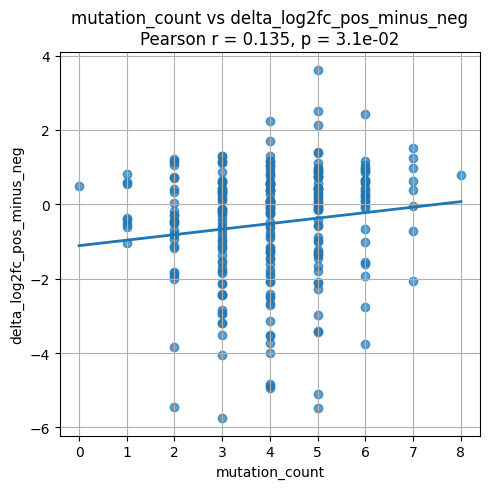

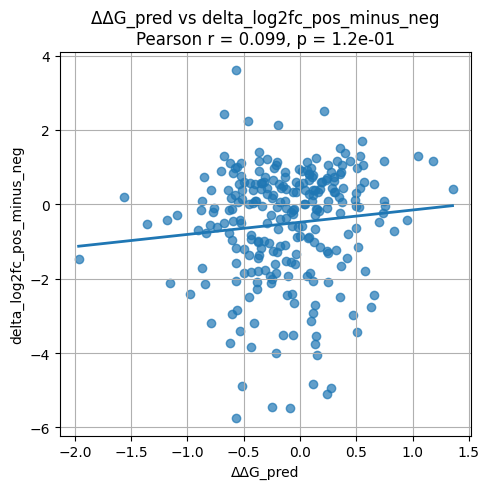

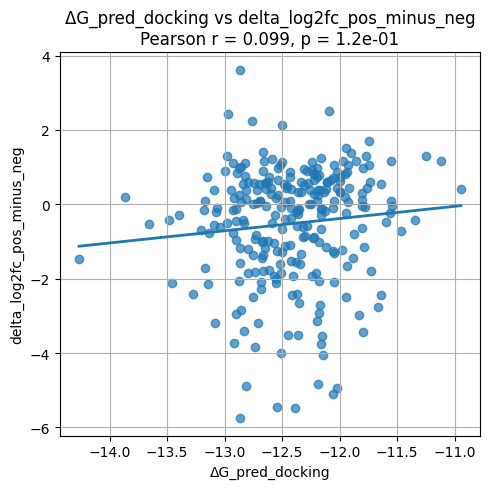

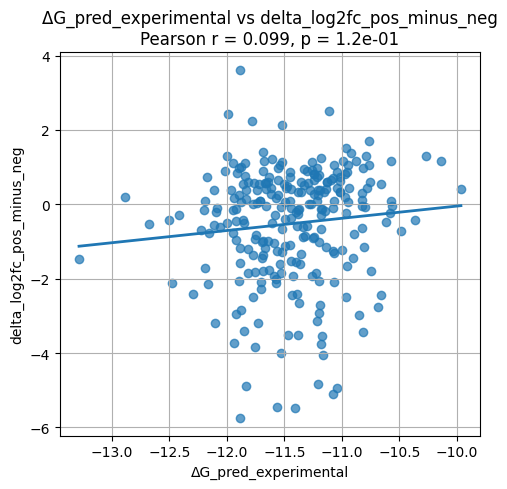

In [279]:
exp_col = "delta_log2fc_pos_minus_neg"

for model_col in ["mutation_count", 'ΔΔG_pred', 'ΔG_pred_docking','ΔG_pred_experimental']:
    plot_scatter_with_fit(merged, model_col, exp_col)


In [280]:
from scipy import stats
import numpy as np

exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "ΔΔG_pred"   # or 'ΔΔG', 'Predicted_ΔG'

df = merged.copy()

x = df[model_col].astype(float)
y = df[exp_col].astype(float)

mask = x.notna() & y.notna() & np.isfinite(x) & np.isfinite(y)
x = x[mask]
y = y[mask]
df = df.loc[mask].copy()

slope, intercept, r, p, stderr = stats.linregress(x, y)
print(f"{model_col} → {exp_col}: slope={slope:.3f}, intercept={intercept:.3f}, r={r:.3f}")

df["predicted_exp_from_model"] = intercept + slope * df[model_col].astype(float)
df["residual"] = df[exp_col] - df["predicted_exp_from_model"]

top_underpredicted = df.sort_values("residual", ascending=False).head(15)
top_overpredicted  = df.sort_values("residual", ascending=True).head(15)

# Pick identifier/value columns that actually exist
id_candidates = ["binary", "sequence", "Amino Acids at Mutated Positions", "binary_8", "wo"]
cols_to_show = [c for c in (id_candidates + ["mutation_count", model_col, exp_col, "residual"])
                if c in df.columns]

print("\nTop 15 variants where model underestimates enrichment (exp >> model):")
display(top_underpredicted[cols_to_show])

print("\nTop 15 variants where model overestimates enrichment (exp << model):")
display(top_overpredicted[cols_to_show])


ΔΔG_pred → delta_log2fc_pos_minus_neg: slope=0.328, intercept=-0.481, r=0.099

Top 15 variants where model underestimates enrichment (exp >> model):


,binary,mutation_count,ΔΔG_pred,delta_log2fc_pos_minus_neg,residual
197,10001111,5,-0.566318,3.617693,4.284343
243,1110111,6,-0.671618,2.434041,3.135277
212,1001111,5,0.211880,2.506626,2.917681
161,10111,4,-0.460586,2.239190,2.871113
216,110111,5,-0.197497,2.123256,2.668769
176,11010110,5,-0.367295,1.420158,2.021440
84,11010,3,-0.679254,1.312977,2.016721
144,1001110,4,0.551562,1.690059,1.989546
252,11011111,7,0.357399,1.503983,1.867242
9,11000000,2,-0.289519,1.222317,1.798054



Top 15 variants where model overestimates enrichment (exp << model):


,binary,mutation_count,ΔΔG_pred,delta_log2fc_pos_minus_neg,residual
85,11001,3,-0.567097,-5.750682,-5.083775
200,1111001,5,-0.090450,-5.472128,-4.961775
33,1001,2,-0.247869,-5.437080,-4.875023
198,1111100,5,0.243968,-5.097526,-4.697011
120,10011001,4,0.274336,-4.948416,-4.557875
150,111001,4,0.111678,-4.840056,-4.396091
140,1011001,4,-0.516712,-4.890336,-4.239979
79,101001,3,0.151934,-4.053040,-3.622297
118,10011100,4,-0.209003,-4.004076,-3.454784
219,11111100,6,0.134231,-3.743227,-3.306670


In [281]:
from scipy import stats
import numpy as np

exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "Predicted_ΔΔG"   # change to 'ΔΔG' or 'Predicted_ΔG' if you want
df = merged.copy()


In [282]:
df = merged.copy()

exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "ΔΔG_pred"   # or 'ΔΔG' / 'Predicted_ΔG'

# Compute ranks
df["rank_model"] = df[model_col].rank(ascending=True,  method="average")
df["rank_exp"]   = df[exp_col].rank(ascending=True,    method="average")
df["rank_diff"]  = df["rank_exp"] - df["rank_model"]   # +: experiment ranks it higher than model

# Biggest disagreements
biggest_up   = df.sort_values("rank_diff", ascending=False).head(15)
biggest_down = df.sort_values("rank_diff", ascending=True).head(15)

cols_to_show = ["binary", "mutation_count", model_col, exp_col,
                "rank_model", "rank_exp", "rank_diff"]

print("\nVariants experiment really likes but model ranks poorly (big positive rank_diff):")
display(biggest_up[cols_to_show])

print("\nVariants model really likes but experiment ranks poorly (big negative rank_diff):")
display(biggest_down[cols_to_show])



Variants experiment really likes but model ranks poorly (big positive rank_diff):


,binary,mutation_count,ΔΔG_pred,delta_log2fc_pos_minus_neg,rank_model,rank_exp,rank_diff
243,1110111,6,-0.671618,2.434041,24.0,254.0,230.0
84,11010,3,-0.679254,1.312977,22.0,247.0,225.0
197,10001111,5,-0.566318,3.617693,42.0,256.0,214.0
50,10010010,3,-0.623420,1.108931,28.0,234.0,206.0
208,1011110,5,-0.698626,0.887545,21.0,220.0,199.0
218,11111,5,-0.853301,0.742357,12.0,209.0,197.0
161,10111,4,-0.460586,2.239190,58.0,253.0,195.0
211,1010111,5,-0.574880,0.979373,37.0,227.0,190.0
141,1010110,4,-0.561440,1.000081,43.0,229.0,186.0
213,111110,5,-0.525384,1.120853,50.0,235.0,185.0



Variants model really likes but experiment ranks poorly (big negative rank_diff):


,binary,mutation_count,ΔΔG_pred,delta_log2fc_pos_minus_neg,rank_model,rank_exp,rank_diff
169,11101001,5,0.507279,-3.446588,235.0,16.0,-219.0
221,11111001,6,0.634493,-2.751382,244.0,25.0,-219.0
45,10100100,3,0.655797,-2.434046,245.0,31.0,-214.0
185,10111001,5,0.468284,-2.972415,229.0,21.0,-208.0
120,10011001,4,0.274336,-4.948416,206.0,5.0,-201.0
198,1111100,5,0.243968,-5.097526,201.0,4.0,-197.0
175,11011001,5,0.573972,-1.788935,243.0,50.0,-193.0
131,1110001,4,0.359358,-2.489108,219.0,29.0,-190.0
79,101001,3,0.151934,-4.053040,189.0,8.0,-181.0
128,1111000,4,0.144368,-3.553961,187.0,13.0,-174.0


In [283]:
df = merged.copy()

exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "ΔΔG_pred"   # or 'ΔΔG' / 'Predicted_ΔG'

# Quartiles
exp_q1, exp_q3     = df[exp_col].quantile([0.25, 0.75])
model_q1, model_q3 = df[model_col].quantile([0.25, 0.75])

def bucket_model(v):
    if v <= model_q1: return "model_low"
    if v >= model_q3: return "model_high"
    return "model_mid"

def bucket_exp(v):
    if v <= exp_q1: return "exp_low"
    if v >= exp_q3: return "exp_high"
    return "exp_mid"

df["model_bucket"] = df[model_col].apply(bucket_model)
df["exp_bucket"]   = df[exp_col].apply(bucket_exp)

df["agreement_class"] = df["model_bucket"] + "__" + df["exp_bucket"]

print("Counts per agreement class:")
display(df["agreement_class"].value_counts())

# Discordant sets
high_model_low_exp = df[(df["model_bucket"]=="model_high") & (df["exp_bucket"]=="exp_low")]
low_model_high_exp = df[(df["model_bucket"]=="model_low")  & (df["exp_bucket"]=="exp_high")]

cols_to_show = ["binary", "mutation_count", model_col, exp_col,
                "model_bucket", "exp_bucket", "agreement_class"]

print("\nModel_high / Exp_low (model thinks good, experiment says bad):")
display(high_model_low_exp[cols_to_show])

print("\nModel_low / Exp_high (model thinks bad, experiment says good):")
display(low_model_high_exp[cols_to_show])


Counts per agreement class:


agreement_class
model_mid__exp_mid      67
model_mid__exp_low      34
model_low__exp_mid      32
model_high__exp_mid     29
model_mid__exp_high     27
model_high__exp_high    24
model_low__exp_low      19
model_low__exp_high     13
model_high__exp_low     11
Name: count, dtype: int64


Model_high / Exp_low (model thinks good, experiment says bad):


,binary,mutation_count,ΔΔG_pred,delta_log2fc_pos_minus_neg,model_bucket,exp_bucket,agreement_class
45,10100100,3,0.655797,-2.434046,model_high,exp_low,model_high__exp_low
95,11100100,4,0.247481,-2.100589,model_high,exp_low,model_high__exp_low
120,10011001,4,0.274336,-4.948416,model_high,exp_low,model_high__exp_low
131,1110001,4,0.359358,-2.489108,model_high,exp_low,model_high__exp_low
169,11101001,5,0.507279,-3.446588,model_high,exp_low,model_high__exp_low
175,11011001,5,0.573972,-1.788935,model_high,exp_low,model_high__exp_low
185,10111001,5,0.468284,-2.972415,model_high,exp_low,model_high__exp_low
187,10110101,5,0.413549,-1.433915,model_high,exp_low,model_high__exp_low
190,10101101,5,0.367943,-1.658261,model_high,exp_low,model_high__exp_low
198,1111100,5,0.243968,-5.097526,model_high,exp_low,model_high__exp_low



Model_low / Exp_high (model thinks bad, experiment says good):


,binary,mutation_count,ΔΔG_pred,delta_log2fc_pos_minus_neg,model_bucket,exp_bucket,agreement_class
50,10010010,3,-0.623420,1.108931,model_low,exp_high,model_low__exp_high
84,11010,3,-0.679254,1.312977,model_low,exp_high,model_low__exp_high
141,1010110,4,-0.561440,1.000081,model_low,exp_high,model_low__exp_high
161,10111,4,-0.460586,2.239190,model_low,exp_high,model_low__exp_high
174,11011010,5,-0.523378,0.755454,model_low,exp_high,model_low__exp_high
196,10010111,5,-0.591446,0.829548,model_low,exp_high,model_low__exp_high
197,10001111,5,-0.566318,3.617693,model_low,exp_high,model_low__exp_high
208,1011110,5,-0.698626,0.887545,model_low,exp_high,model_low__exp_high
211,1010111,5,-0.574880,0.979373,model_low,exp_high,model_low__exp_high
213,111110,5,-0.525384,1.120853,model_low,exp_high,model_low__exp_high


In [284]:
rows = []
exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "ΔΔG_pred"   # or 'ΔΔG' / 'Predicted_ΔG'

for k, sub in merged.groupby("mutation_count"):
    x = sub[model_col].astype(float)
    y = sub[exp_col].astype(float)
    mask = x.notna() & y.notna() & np.isfinite(x) & np.isfinite(y)

    if mask.sum() < 5:
        continue

    xs = x[mask]
    ys = y[mask]

    # Pearson
    pearson_r, pearson_p = stats.pearsonr(xs, ys)

    # Spearman
    spearman_r, spearman_p = stats.spearmanr(xs, ys)

    rows.append({
        "mutation_count": k,
        "n": int(mask.sum()),
        "pearson_r": pearson_r,
        "pearson_p": pearson_p,
        "spearman_r": spearman_r,
        "spearman_p": spearman_p
    })

mc_corr = pd.DataFrame(rows).sort_values("mutation_count")
display(mc_corr)


,mutation_count,n,pearson_r,pearson_p,spearman_r,spearman_p
0,1,8,0.438543,0.277075,0.500000,0.207031
1,2,28,0.279625,0.149554,0.389710,0.040366
2,3,56,0.183337,0.176209,0.229460,0.088910
3,4,70,0.112475,0.353909,0.111084,0.359930
4,5,56,-0.150703,0.267575,-0.217020,0.108140
5,6,28,-0.109080,0.580581,-0.010947,0.955911
6,7,8,-0.167746,0.691327,-0.119048,0.778886


In [285]:
from scipy import stats
import numpy as np
import pandas as pd

# Choose the experimental and model columns
exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "ΔΔG_pred"   # change to 'ΔΔG' or 'Predicted_ΔG' if desired

df = merged.copy()

# Extract model (x) and experimental (y) data
x = df[model_col].astype(float)
y = df[exp_col].astype(float)

# Mask valid entries
mask = x.notna() & y.notna() & np.isfinite(x) & np.isfinite(y)
x = x[mask]
y = y[mask]
df = df.loc[mask].copy()

# Linear regression model: y ~ a + b*x
slope, intercept, r, p, stderr = stats.linregress(x, y)
print(f"{model_col} → {exp_col}")
print(f"  slope={slope:.3f}, intercept={intercept:.3f}, r={r:.3f}, p={p:.2e}")

# Predicted experimental values (model’s expectation)
df["predicted_from_model"] = intercept + slope * df[model_col].astype(float)

# Residuals: positive = experiment > model, negative = experiment < model
df["residual"] = df[exp_col] - df["predicted_from_model"]

# Variants where experiment >> model
under_pred = df.sort_values("residual", ascending=False).head(15)

# Variants where experiment << model
over_pred  = df.sort_values("residual", ascending=True).head(15)

# Columns to display (only things guaranteed to exist)
cols_to_show = ["binary", "mutation_count", model_col, exp_col, "predicted_from_model", "residual"]

print("\nTop 15 variants where the model UNDERestimates experimental enrichment (exp >> model):")
display(under_pred[cols_to_show])

print("\nTop 15 variants where the model OVERestimates experimental enrichment (exp << model):")
display(over_pred[cols_to_show])


ΔΔG_pred → delta_log2fc_pos_minus_neg
  slope=0.328, intercept=-0.481, r=0.099, p=1.15e-01

Top 15 variants where the model UNDERestimates experimental enrichment (exp >> model):


,binary,mutation_count,ΔΔG_pred,delta_log2fc_pos_minus_neg,predicted_from_model,residual
197,10001111,5,-0.566318,3.617693,-0.666650,4.284343
243,1110111,6,-0.671618,2.434041,-0.701236,3.135277
212,1001111,5,0.211880,2.506626,-0.411054,2.917681
161,10111,4,-0.460586,2.239190,-0.631923,2.871113
216,110111,5,-0.197497,2.123256,-0.545513,2.668769
176,11010110,5,-0.367295,1.420158,-0.601282,2.021440
84,11010,3,-0.679254,1.312977,-0.703744,2.016721
144,1001110,4,0.551562,1.690059,-0.299487,1.989546
252,11011111,7,0.357399,1.503983,-0.363259,1.867242
9,11000000,2,-0.289519,1.222317,-0.575737,1.798054



Top 15 variants where the model OVERestimates experimental enrichment (exp << model):


,binary,mutation_count,ΔΔG_pred,delta_log2fc_pos_minus_neg,predicted_from_model,residual
85,11001,3,-0.567097,-5.750682,-0.666906,-5.083775
200,1111001,5,-0.090450,-5.472128,-0.510353,-4.961775
33,1001,2,-0.247869,-5.437080,-0.562057,-4.875023
198,1111100,5,0.243968,-5.097526,-0.400515,-4.697011
120,10011001,4,0.274336,-4.948416,-0.390541,-4.557875
150,111001,4,0.111678,-4.840056,-0.443965,-4.396091
140,1011001,4,-0.516712,-4.890336,-0.650357,-4.239979
79,101001,3,0.151934,-4.053040,-0.430743,-3.622297
118,10011100,4,-0.209003,-4.004076,-0.549292,-3.454784
219,11111100,6,0.134231,-3.743227,-0.436558,-3.306670


In [286]:
import numpy as np
import pandas as pd
from scipy import stats

# ---- choose columns ----
exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "ΔΔG_pred"   # change here if you want to use ΔΔG or Predicted_ΔG

# Start from merged so we have one row per variant with model + experiment
df = merged.copy()

# Clean x (model) and y (experiment)
x = df[model_col].astype(float)
y = df[exp_col].astype(float)

mask = x.notna() & y.notna() & np.isfinite(x) & np.isfinite(y)
df = df.loc[mask].copy()
x = x[mask]
y = y[mask]

# Linear regression: experiment ~ a + b * model
slope, intercept, r, p, stderr = stats.linregress(x, y)
print(f"{model_col} → {exp_col}")
print(f"  slope={slope:.3f}, intercept={intercept:.3f}, r={r:.3f}, p={p:.2e}")

# Predicted experiment from model, and residuals
df["predicted_from_model"] = intercept + slope * df[model_col].astype(float)
df["residual"] = df[exp_col] - df["predicted_from_model"]

# We'll give the residual column a nice name for Chris's code
residual_colname = f"residual_{model_col}"
residuals = df[["binary", "residual"]].rename(columns={"residual": residual_colname})

# Merge residuals back into the original experimental dataframe
exp_with_resid = exp_df.merge(residuals, on="binary", how="left")

# Save to Excel in the same folder as your other landscape files
out_path = "/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Landscape_Figures/human_with_residual_landscape_jons_data.xlsx"
exp_with_resid.to_excel(out_path, index=False)

print(f"\nWrote residual-annotated file to:\n  {out_path}")
print(f"New residual column: {residual_colname}")


ΔΔG_pred → delta_log2fc_pos_minus_neg
  slope=0.328, intercept=-0.481, r=0.099, p=1.15e-01

Wrote residual-annotated file to:
  /Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Landscape_Figures/human_with_residual_landscape_jons_data.xlsx
New residual column: residual_ΔΔG_pred


In [287]:
df = merged.copy()

exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "ΔΔG_pred"   # change if using ΔΔG or Predicted_ΔG

# Make quartiles (4 bins)
df["exp_quartile"] = pd.qcut(df[exp_col], q=4, labels=["Q1_lowest", "Q2", "Q3", "Q4_highest"])

df["exp_quartile"].value_counts()


exp_quartile
Q1_lowest     64
Q2            64
Q3            64
Q4_highest    64
Name: count, dtype: int64

In [288]:
summary = df.groupby("exp_quartile")[model_col].agg(["median", "mean", "std"])
summary


/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/3063637098.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby("exp_quartile")[model_col].agg(["median", "mean", "std"])


,median,mean,std
exp_quartile,,,
Q1_lowest,-0.209242,-0.197767,0.458418
Q2,-0.177178,-0.192483,0.484468
Q3,-0.091354,-0.067553,0.471082
Q4_highest,0.060300,-0.009384,0.439966


<Figure size 800x600 with 0 Axes>

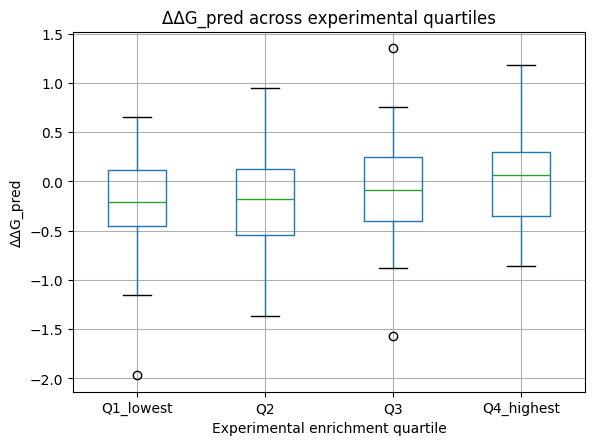

In [289]:
plt.figure(figsize=(8,6))
df.boxplot(column=model_col, by="exp_quartile")
plt.title(f"{model_col} across experimental quartiles")
plt.suptitle("")   # remove default pandas title
plt.xlabel("Experimental enrichment quartile")
plt.ylabel(model_col)
plt.grid(True)
plt.show()


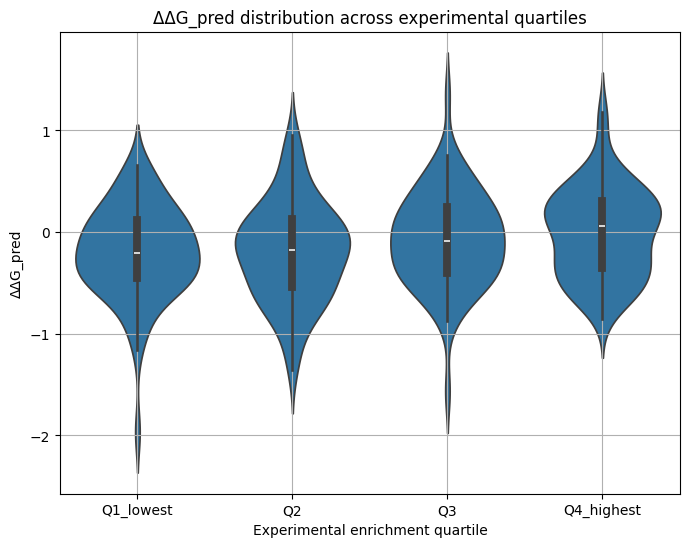

In [290]:
import seaborn as sns
plt.figure(figsize=(8,6))
sns.violinplot(data=df, x="exp_quartile", y=model_col)
plt.title(f"{model_col} distribution across experimental quartiles")
plt.xlabel("Experimental enrichment quartile")
plt.ylabel(model_col)
plt.grid(True)
plt.show()


In [291]:
medians = summary["median"]
print("Quartile median ordering:")
print(medians)

# Check if monotonic increasing or decreasing
is_increasing = all(medians[i] <= medians[i+1] for i in range(3))
is_decreasing = all(medians[i] >= medians[i+1] for i in range(3))

print("\nMonotonic increasing:", is_increasing)
print("Monotonic decreasing:", is_decreasing)


Quartile median ordering:
exp_quartile
Q1_lowest    -0.209242
Q2           -0.177178
Q3           -0.091354
Q4_highest    0.060300
Name: median, dtype: float64

Monotonic increasing: True
Monotonic decreasing: False


/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/1636200644.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  is_increasing = all(medians[i] <= medians[i+1] for i in range(3))
/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/1636200644.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  is_decreasing = all(medians[i] >= medians[i+1] for i in range(3))


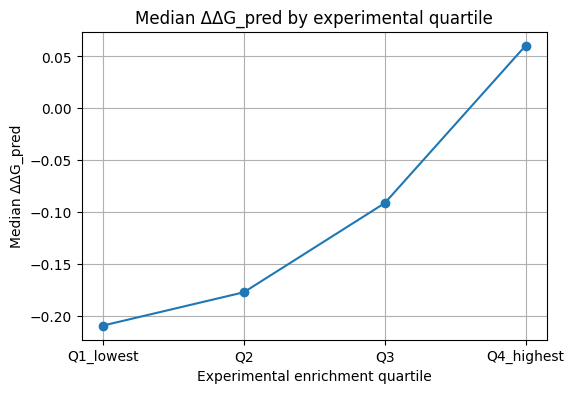

In [292]:
plt.figure(figsize=(6,4))
plt.plot(["Q1_lowest","Q2","Q3","Q4_highest"], medians.values, marker="o")
plt.title(f"Median {model_col} by experimental quartile")
plt.xlabel("Experimental enrichment quartile")
plt.ylabel(f"Median {model_col}")
plt.grid(True)
plt.show()


In [293]:
from scipy.stats import fisher_exact
import numpy as np
import pandas as pd

df = merged.copy()

# ----- Choose model + experimental metric -----
model_col = "ΔΔG_pred"                 # replace if using ΔΔG
exp_col   = "delta_log2fc_pos_minus_neg"    # experimental enrichment

# ----- Define top 10% thresholds -----
n = len(df)
topk = max(1, int(0.10 * n))

# SMALLER ΔΔG = better binder (more stabilizing)
pred_thresh = df[model_col].nsmallest(topk).max()

# LARGER log2FC = better binder
exp_thresh = df[exp_col].nlargest(topk).min()

# ----- Binary classification -----
df["pred_top10"] = df[model_col] <= pred_thresh
df["exp_top10"]  = df[exp_col]   >= exp_thresh

# ----- Build 2×2 table -----
# Rows: predicted top10 vs not
# Columns: experimental top10 vs not

a = np.sum((df["pred_top10"] == True)  & (df["exp_top10"] == True))   # predicted top & experimental top
b = np.sum((df["pred_top10"] == True)  & (df["exp_top10"] == False))  # predicted top & experimental bottom
c = np.sum((df["pred_top10"] == False) & (df["exp_top10"] == True))   # predicted bottom & experimental top
d = np.sum((df["pred_top10"] == False) & (df["exp_top10"] == False))  # predicted bottom & experimental bottom

table = np.array([[a, b],
                  [c, d]])

print("2×2 contingency table:")
print(pd.DataFrame(table,
        index=["Pred top10", "Pred bottom90"],
        columns=["Exp top10", "Exp bottom90"]))

# ----- Fisher exact test -----
oddsratio, p = fisher_exact(table, alternative="greater")  # "greater" tests enrichment

print(f"\nFisher exact p-value: {p:.4e}")
print(f"Odds ratio: {oddsratio:.3f}")


2×2 contingency table:
               Exp top10  Exp bottom90
Pred top10             2            23
Pred bottom90         23           208

Fisher exact p-value: 7.3124e-01
Odds ratio: 0.786


In [294]:
from scipy import stats
import numpy as np

df = merged.copy()

exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "ΔΔG_pred"   # (or ΔΔG, etc.)

# Extract values
x = df[model_col].astype(float)
y = df[exp_col].astype(float)

mask = x.notna() & y.notna() & np.isfinite(x) & np.isfinite(y)
df = df.loc[mask].copy()

# Linear regression (model → experiment)
slope, intercept, r, p, stderr = stats.linregress(df[model_col], df[exp_col])

df["pred_from_model"] = intercept + slope * df[model_col]
df["residual"] = df[exp_col] - df["pred_from_model"]

print(f"Residuals computed. Model slope={slope:.3f}, r={r:.3f}")


Residuals computed. Model slope=0.328, r=0.099


In [295]:
df["abs_residual"] = df["residual"].abs()

worst = df.sort_values("abs_residual", ascending=False).head(20)

cols = [
    "binary", "mutation_count", model_col, exp_col,
    "pred_from_model", "residual", "abs_residual"
]

display(worst[cols])


,binary,mutation_count,ΔΔG_pred,delta_log2fc_pos_minus_neg,pred_from_model,residual,abs_residual
85,11001,3,-0.567097,-5.750682,-0.666906,-5.083775,5.083775
200,1111001,5,-0.090450,-5.472128,-0.510353,-4.961775,4.961775
33,1001,2,-0.247869,-5.437080,-0.562057,-4.875023,4.875023
198,1111100,5,0.243968,-5.097526,-0.400515,-4.697011,4.697011
120,10011001,4,0.274336,-4.948416,-0.390541,-4.557875,4.557875
150,111001,4,0.111678,-4.840056,-0.443965,-4.396091,4.396091
197,10001111,5,-0.566318,3.617693,-0.666650,4.284343,4.284343
140,1011001,4,-0.516712,-4.890336,-0.650357,-4.239979,4.239979
79,101001,3,0.151934,-4.053040,-0.430743,-3.622297,3.622297
118,10011100,4,-0.209003,-4.004076,-0.549292,-3.454784,3.454784


In [296]:
df.groupby("mutation_count")["abs_residual"].median().sort_index()


mutation_count
0    1.020157
1    0.428376
2    0.680673
3    0.978079
4    1.048120
5    1.050031
6    1.082892
7    1.227412
8    1.222790
Name: abs_residual, dtype: float64

In [297]:
from scipy import stats
import numpy as np
import pandas as pd

# Make sure we start from merged
m = merged.copy()

exp_col   = "delta_log2fc_pos_minus_neg"
model_col = "ΔΔG_pred"   # change here if you want ΔΔG or Predicted_ΔG

# Clean model/exp data
x = m[model_col].astype(float)
y = m[exp_col].astype(float)

mask = x.notna() & y.notna() & np.isfinite(x) & np.isfinite(y)
m = m.loc[mask].copy()

# Linear regression: experiment ~ a + b * model
slope, intercept, r, p, stderr = stats.linregress(m[model_col], m[exp_col])
print(f"{model_col} → {exp_col}: slope={slope:.3f}, r={r:.3f}, p={p:.2e}")

m["pred_from_model"] = intercept + slope * m[model_col]
m["residual"]        = m[exp_col] - m["pred_from_model"]
m["abs_residual"]    = m["residual"].abs()

# Overwrite merged with this enriched version
merged = m

print("\nColumns now in merged:")
print(merged.columns.tolist())


ΔΔG_pred → delta_log2fc_pos_minus_neg: slope=0.328, r=0.099, p=1.15e-01

Columns now in merged:
['binary', 'mutation_count', 'ΔΔG_pred', 'ΔG_pred_docking', 'ΔG_pred_experimental', 'delta_log2fc_pos_minus_neg', 'pred_from_model', 'residual', 'abs_residual']


In [298]:
# Only keep the columns we need from merged
resid_df = merged[["binary", "residual", "abs_residual"]].copy()

# exp_df has mut_pos_1..8, etc. We join on binary.
df_pos = exp_df.merge(resid_df, on="binary", how="inner")

print("df_pos columns:")
print(df_pos.columns.tolist())
print("df_pos shape:", df_pos.shape)


df_pos columns:
['Variant_new', 'binary', 'Amino Acids at Mutated Positions', 'Text File Name', 'File Content', 'File Link', 'sequence', 'Variant_old', 'mut_pos_1', 'mut_pos_2', 'mut_pos_3', 'mut_pos_4', 'mut_pos_5', 'mut_pos_6', 'mut_pos_7', 'mut_pos_8', 'mutation_count', 'binary_8', 'wo', 'mut_count', 'mean_log2fc_pos_pre', 'mean_log2fc_neg_pre', 'n_libs', 'delta_log2fc_pos_minus_neg', 'log2fc_neg_pre_lib1', 'log2fc_neg_pre_lib2', 'log2fc_pos_pre_lib1', 'log2fc_pos_pre_lib2', 'residual', 'abs_residual']
df_pos shape: (256, 30)


In [299]:
pos_cols = ["mut_pos_1","mut_pos_2","mut_pos_3","mut_pos_4",
            "mut_pos_5","mut_pos_6","mut_pos_7","mut_pos_8"] 

position_effects = {}

for pos in pos_cols:
    if pos not in df_pos.columns:
        print(f"Skipping {pos} (not in df_pos)")
        continue

    mutated = df_pos[df_pos[pos] == 1]
    wt      = df_pos[df_pos[pos] == 0]

    if len(mutated) < 3 or len(wt) < 3:
        continue

    position_effects[pos] = {
        "n_mut": len(mutated),
        "n_wt": len(wt),
        "median_abs_resid_mut": mutated["abs_residual"].median(),
        "median_abs_resid_wt":  wt["abs_residual"].median(),
        "difference": mutated["abs_residual"].median() - wt["abs_residual"].median()
    }

pos_df = pd.DataFrame(position_effects).T.sort_values("difference", ascending=False)
display(pos_df)


,n_mut,n_wt,median_abs_resid_mut,median_abs_resid_wt,difference
mut_pos_4,128.0,128.0,1.170989,0.823729,0.347259
mut_pos_5,128.0,128.0,1.200202,0.886491,0.313711
mut_pos_8,128.0,128.0,1.098733,0.917671,0.181062
mut_pos_6,128.0,128.0,1.073257,0.931183,0.142075
mut_pos_7,128.0,128.0,1.033500,1.003547,0.029953
mut_pos_2,128.0,128.0,1.030637,1.012683,0.017954
mut_pos_1,128.0,128.0,0.970395,1.076329,-0.105933
mut_pos_3,128.0,128.0,0.858516,1.123339,-0.264824


In [300]:
import itertools

pair_effects = []
for p1, p2 in itertools.combinations(pos_cols, 2):
    if p1 not in df_pos.columns or p2 not in df_pos.columns:
        continue

    mut2 = df_pos[(df_pos[p1] == 1) & (df_pos[p2] == 1)]
    if len(mut2) < 3:
        continue

    pair_effects.append({
        "pair": f"{p1}-{p2}",
        "n": len(mut2),
        "median_abs_residual": mut2["abs_residual"].median()
    })

pair_df = pd.DataFrame(pair_effects).sort_values("median_abs_residual", ascending=False)
display(pair_df.head(15))


,pair,n,median_abs_residual
18,mut_pos_4-mut_pos_5,64,1.431505
24,mut_pos_5-mut_pos_8,64,1.246805
21,mut_pos_4-mut_pos_8,64,1.230148
25,mut_pos_6-mut_pos_7,64,1.194180
9,mut_pos_2-mut_pos_5,64,1.193032
22,mut_pos_5-mut_pos_6,64,1.187914
19,mut_pos_4-mut_pos_6,64,1.170989
27,mut_pos_7-mut_pos_8,64,1.145587
26,mut_pos_6-mut_pos_8,64,1.109041
8,mut_pos_2-mut_pos_4,64,1.102424


In [301]:
import numpy as np
import pandas as pd

# Positions we’re using
pos_cols = ["mut_pos_1","mut_pos_2","mut_pos_3","mut_pos_4",
            "mut_pos_5","mut_pos_6","mut_pos_7","mut_pos_8"]

# Initialize matrix with NaNs
pair_mat = pd.DataFrame(index=pos_cols, columns=pos_cols, dtype=float)

for i, p1 in enumerate(pos_cols):
    for j, p2 in enumerate(pos_cols):
        if i == j:
            # Leave diagonal as NaN or 0 (single mutants; not what we’re summarizing here)
            pair_mat.loc[p1, p2] = np.nan
            continue

        # Variants where BOTH positions are mutated (double, triple, etc. that include this pair)
        mask = (df_pos[p1] == 1) & (df_pos[p2] == 1)
        if mask.sum() < 3:
            pair_mat.loc[p1, p2] = np.nan
        else:
            pair_mat.loc[p1, p2] = df_pos.loc[mask, "abs_residual"].median()


pair_mat


,mut_pos_1,mut_pos_2,mut_pos_3,mut_pos_4,mut_pos_5,mut_pos_6,mut_pos_7,mut_pos_8
mut_pos_1,NaN,1.005258,0.779026,1.071756,1.071756,1.011219,1.048482,0.996892
mut_pos_2,1.005258,NaN,0.831448,1.102424,1.193032,1.036323,1.076949,1.082529
mut_pos_3,0.779026,0.831448,NaN,1.023194,1.074451,1.072895,0.742065,1.036323
mut_pos_4,1.071756,1.102424,1.023194,NaN,1.431505,1.170989,1.096224,1.230148
mut_pos_5,1.071756,1.193032,1.074451,1.431505,NaN,1.187914,1.048301,1.246805
mut_pos_6,1.011219,1.036323,1.072895,1.170989,1.187914,NaN,1.194180,1.109041
mut_pos_7,1.048482,1.076949,0.742065,1.096224,1.048301,1.194180,NaN,1.145587
mut_pos_8,0.996892,1.082529,1.036323,1.230148,1.246805,1.109041,1.145587,NaN


In [302]:
label_map = {
    "mut_pos_1": "477",
    "mut_pos_2": "478",
    "mut_pos_3": "484",
    "mut_pos_4": "493",
    "mut_pos_5": "496",
    "mut_pos_6": "498",
    "mut_pos_7": "501",
    "mut_pos_8": "505",
}

pair_mat_labeled = pair_mat.rename(index=label_map, columns=label_map)


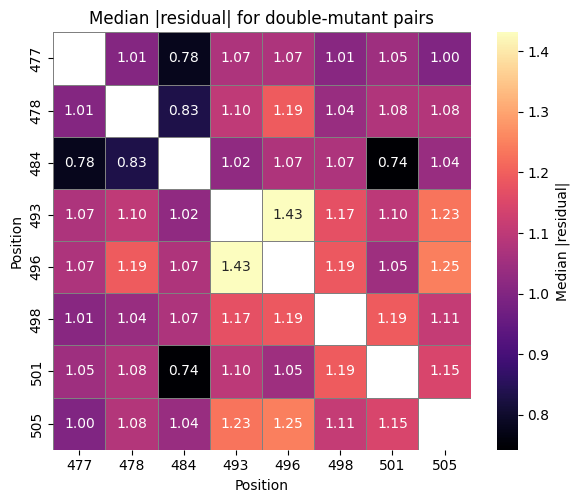

In [303]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6,5))

# Choose which matrix to plot: pair_mat or pair_mat_labeled
mat_to_plot = pair_mat_labeled  # or pair_mat

sns.heatmap(
    mat_to_plot,
    annot=True,              # turn off (False) if too busy
    fmt=".2f",
    cmap="magma",            # pick anything you like
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar_kws={"label": "Median |residual|"}
)

plt.title("Median |residual| for double-mutant pairs")
plt.xlabel("Position")
plt.ylabel("Position")
plt.tight_layout()
plt.show()


In [304]:
plt.figure(figsize=(10,6))
sns.violinplot(
    data=df_plot,
    x="mutation_count",
    y="abs_residual",
    palette="viridis",
    cut=0
)
plt.xlabel("Number of mutated positions")
plt.ylabel("Absolute residual |exp − predicted|")
plt.title("Distribution of model error across mutation depths")
plt.tight_layout()
plt.show()


NameError: name 'df_plot' is not defined

<Figure size 1000x600 with 0 Axes>

/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/2690211433.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=single_df, x="Position", y="Median_abs_residual", palette="viridis")


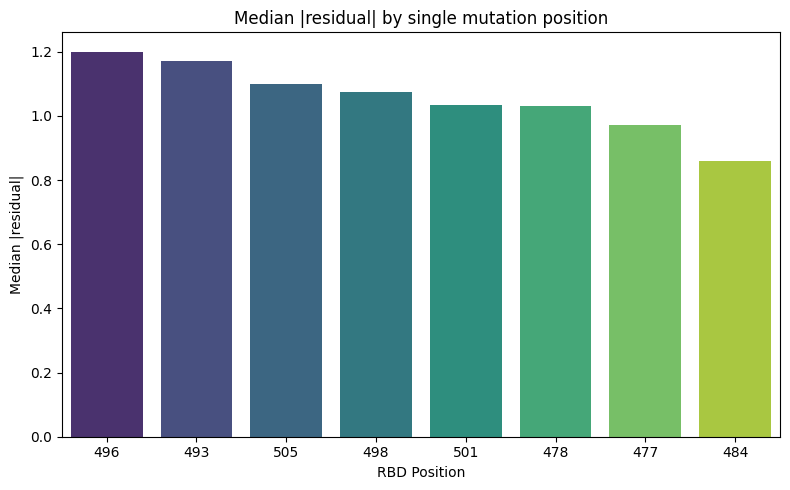

,Position,Median_abs_residual
4,496,1.200202
3,493,1.170989
7,505,1.098733
5,498,1.073257
6,501,1.033500
1,478,1.030637
0,477,0.970395
2,484,0.858516


In [305]:
import matplotlib.pyplot as plt
import seaborn as sns

# Using df_pos which contains mut_pos_1..8 and abs_residual
pos_cols = ["mut_pos_1","mut_pos_2","mut_pos_3","mut_pos_4",
            "mut_pos_5","mut_pos_6","mut_pos_7","mut_pos_8"]

label_map = {
    "mut_pos_1": "477",
    "mut_pos_2": "478",
    "mut_pos_3": "484",
    "mut_pos_4": "493",
    "mut_pos_5": "496",
    "mut_pos_6": "498",
    "mut_pos_7": "501",
    "mut_pos_8": "505"
}

single_pos_stats = []

for pos in pos_cols:
    mutated = df_pos[df_pos[pos] == 1]
    if len(mutated) < 3:
        continue
    single_pos_stats.append({
        "Position": label_map[pos],
        "Median_abs_residual": mutated["abs_residual"].median()
    })

single_df = pd.DataFrame(single_pos_stats).sort_values("Median_abs_residual", ascending=False)

plt.figure(figsize=(8,5))
sns.barplot(data=single_df, x="Position", y="Median_abs_residual", palette="viridis")
plt.title("Median |residual| by single mutation position")
plt.ylabel("Median |residual|")
plt.xlabel("RBD Position")
plt.tight_layout()
plt.show()

single_df


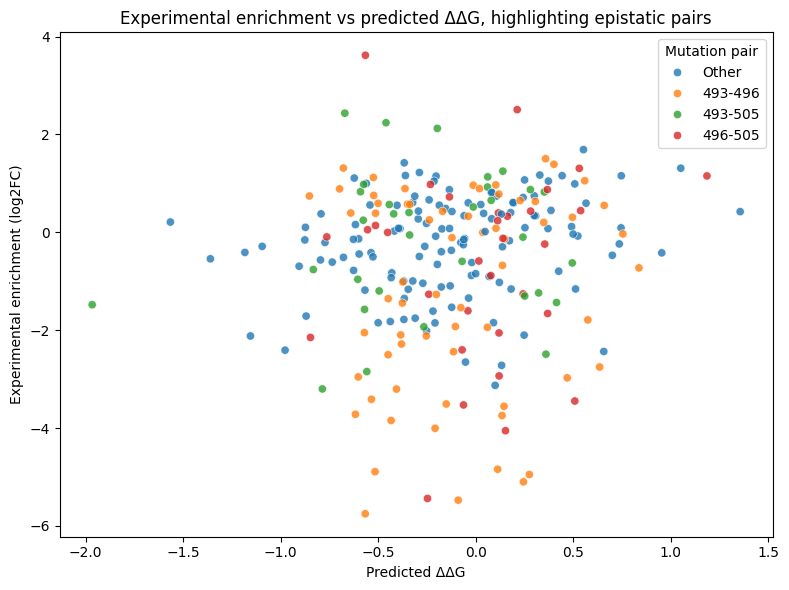

In [306]:
import matplotlib.pyplot as plt
import seaborn as sns

# Positions
pos_cols = ["mut_pos_1","mut_pos_2","mut_pos_3","mut_pos_4",
            "mut_pos_5","mut_pos_6","mut_pos_7","mut_pos_8"]

# 1) Build df_scatter with BOTH model + experiment + positions
base_cols = ["binary", "ΔΔG_pred", "delta_log2fc_pos_minus_neg"]
df_scatter = merged[base_cols].merge(
    exp_df[["binary"] + pos_cols],
    on="binary",
    how="left"
)

# 2) Define the hotspot pairs we want to highlight
pairs_to_plot = [
    ("mut_pos_4", "mut_pos_5", "493-496"),
    ("mut_pos_5", "mut_pos_8", "496-505"),
    ("mut_pos_4", "mut_pos_8", "493-505"),
]

def label_epistasis(row):
    for p1, p2, name in pairs_to_plot:
        if row.get(p1, 0) == 1 and row.get(p2, 0) == 1:
            return name
    return "Other"

df_scatter["pair_label"] = df_scatter.apply(label_epistasis, axis=1)

# 3) Scatterplot
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df_scatter,
    x="ΔΔG_pred",
    y="delta_log2fc_pos_minus_neg",
    hue="pair_label",
    palette="tab10",
    alpha=0.8
)

plt.title("Experimental enrichment vs predicted ΔΔG, highlighting epistatic pairs")
plt.xlabel("Predicted ΔΔG")
plt.ylabel("Experimental enrichment (log2FC)")
plt.legend(title="Mutation pair")
plt.tight_layout()
plt.show()


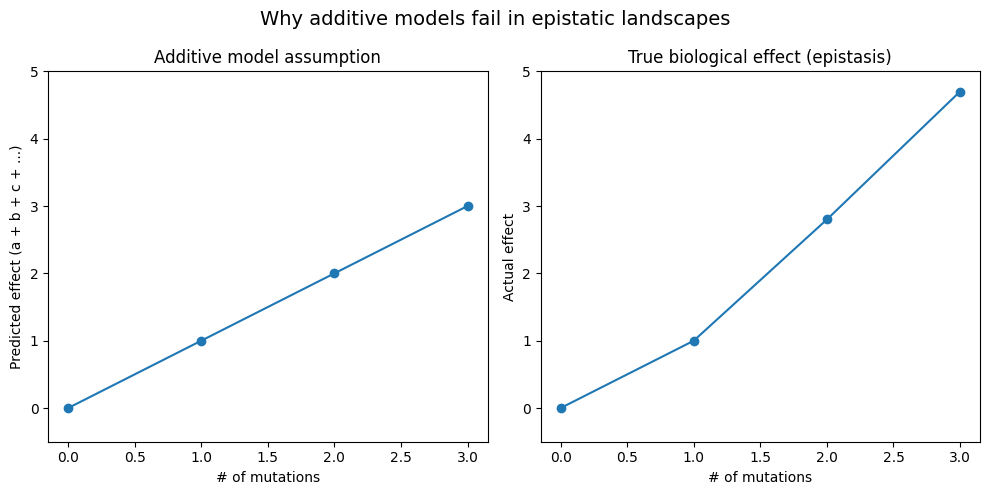

In [307]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10,5))

# --- Left panel: additive model ---
x = np.array([0,1,2,3])
y_add = np.array([0,1,2,3])  # linear additive assumption

plt.subplot(1,2,1)
plt.plot(x, y_add, marker='o')
plt.title("Additive model assumption")
plt.xlabel("# of mutations")
plt.ylabel("Predicted effect (a + b + c + ...)")
plt.ylim(-0.5, 5)

# --- Right panel: real biological landscape ---
y_real = np.array([0,1,2.8,4.7])  # non-linear, epistatic growth of effect

plt.subplot(1,2,2)
plt.plot(x, y_real, marker='o')
plt.title("True biological effect (epistasis)")
plt.xlabel("# of mutations")
plt.ylabel("Actual effect")
plt.ylim(-0.5, 5)

plt.suptitle("Why additive models fail in epistatic landscapes", fontsize=14)
plt.tight_layout()
plt.show()


In [308]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

# Work from experimental dataframe
df_ep = exp_df.copy()

exp_col = "delta_log2fc_pos_minus_neg"

pos_cols = ["mut_pos_1","mut_pos_2","mut_pos_3","mut_pos_4",
            "mut_pos_5","mut_pos_6","mut_pos_7","mut_pos_8"]

label_map = {
    "mut_pos_1": "477",
    "mut_pos_2": "478",
    "mut_pos_3": "484",
    "mut_pos_4": "493",
    "mut_pos_5": "496",
    "mut_pos_6": "498",
    "mut_pos_7": "501",
    "mut_pos_8": "505",
}


In [309]:
# Try to use binary_8 if it exists; else fall back to binary == 0 & mutation_count == 0
if "binary_8" in df_ep.columns:
    wt_mask = df_ep["binary_8"].astype(str).str.zfill(8) == "00000000"
else:
    wt_mask = (df_ep["binary"] == 0) & (df_ep["mutation_count"] == 0)

F0 = df_ep.loc[wt_mask, exp_col].median()

print("WT fitness F0:", F0)


WT fitness F0: 0.4885329060209803


In [310]:
Fi = {}
single_mask = (df_ep["mutation_count"] == 1)

for pos in pos_cols:
    m = df_ep[single_mask & (df_ep[pos] == 1)]
    if len(m) == 0:
        Fi[pos] = np.nan
    else:
        Fi[pos] = m[exp_col].median()

print("Single-mutant fitness per position:")
for pos in pos_cols:
    print(label_map[pos], "->", Fi[pos])


Single-mutant fitness per position:
477 -> 0.607944842389796
478 -> 0.5523518293685853
484 -> -0.3680919017455504
493 -> -0.5409677781047022
496 -> -0.4157005990034879
498 -> -1.039957790243266
501 -> 0.8188912661808945
505 -> -0.6083782256833912


In [311]:
# Dataframe to hold per-pair stats
pair_eps_stats = []

# Matrix for heatmap: median |epsilon| per pair
sites = [label_map[p] for p in pos_cols]
eps_mat = pd.DataFrame(index=sites, columns=sites, dtype=float)

double_mask_all = (df_ep["mutation_count"] == 2)

for p1, p2 in itertools.combinations(pos_cols, 2):
    # exact double mutants at positions p1 and p2
    mask = double_mask_all & (df_ep[p1] == 1) & (df_ep[p2] == 1)
    d = df_ep.loc[mask]

    if len(d) == 0:
        continue

    F_i = Fi[p1]
    F_j = Fi[p2]

    # If we don't have good single-mutant fitness, skip
    if np.isnan(F_i) or np.isnan(F_j) or np.isnan(F0):
        continue

    # Expected additive fitness for this double:
    expected = F_i + F_j - F0

    # Epistasis epsilon = F_ij - expected
    eps_vals = d[exp_col] - expected

    med_abs_eps = eps_vals.abs().median()

    pair_name = f"{label_map[p1]}-{label_map[p2]}"
    pair_eps_stats.append({
        "pair": pair_name,
        "n_double": len(d),
        "median_abs_epsilon": med_abs_eps
    })

    # Fill symmetric matrix
    i_lab = label_map[p1]
    j_lab = label_map[p2]
    eps_mat.loc[i_lab, j_lab] = med_abs_eps
    eps_mat.loc[j_lab, i_lab] = med_abs_eps

# Optional: inspect per-pair table
pair_eps_df = pd.DataFrame(pair_eps_stats).sort_values("median_abs_epsilon", ascending=False)
display(pair_eps_df)


,pair,n_double,median_abs_epsilon
24,496-505,1,3.924469
13,484-493,1,2.546088
18,493-496,1,2.398387
23,496-501,1,1.242458
26,498-505,1,1.210975
25,498-501,1,1.113154
27,501-505,1,0.990117
16,484-501,1,0.756118
4,477-498,1,0.625594
0,477-478,1,0.550553


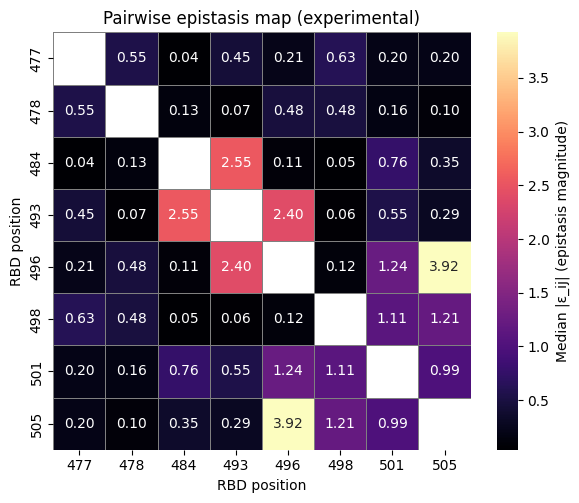

In [312]:
plt.figure(figsize=(6,5))

sns.heatmap(
    eps_mat.astype(float),
    annot=True, fmt=".2f",
    cmap="magma",
    linewidths=0.5, linecolor="gray",
    square=True,
    cbar_kws={"label": "Median |ε_ij| (epistasis magnitude)"}
)

plt.title("Pairwise epistasis map (experimental)")
plt.xlabel("RBD position")
plt.ylabel("RBD position")
plt.tight_layout()
plt.show()


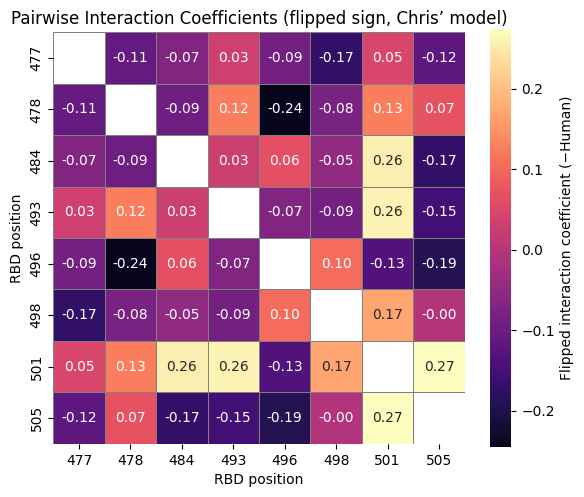

,477,478,484,493,496,498,501,505
477,NaN,-0.108292,-0.069693,0.032769,-0.088324,-0.172910,0.047990,-0.118571
478,-0.108292,NaN,-0.094441,0.124842,-0.244855,-0.082758,0.125591,0.070614
484,-0.069693,-0.094441,NaN,0.028845,0.063490,-0.047359,0.255503,-0.172921
493,0.032769,0.124842,0.028845,NaN,-0.068779,-0.086922,0.257883,-0.154990
496,-0.088324,-0.244855,0.063490,-0.068779,NaN,0.104469,-0.134578,-0.192283
498,-0.172910,-0.082758,-0.047359,-0.086922,0.104469,NaN,0.169727,-0.004253
501,0.047990,0.125591,0.255503,0.257883,-0.134578,0.169727,NaN,0.273829
505,-0.118571,0.070614,-0.172921,-0.154990,-0.192283,-0.004253,0.273829,NaN


In [41]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# -----------------------------------------
# 1. Raw interaction data (Chris' model)
# -----------------------------------------

data = {
    "Feature": [
        "int_1_2","int_1_3","int_1_4","int_1_5","int_1_6","int_1_7","int_1_8",
        "int_2_3","int_2_4","int_2_5","int_2_6","int_2_7","int_2_8",
        "int_3_4","int_3_5","int_3_6","int_3_7","int_3_8",
        "int_4_5","int_4_6","int_4_7","int_4_8",
        "int_5_6","int_5_7","int_5_8",
        "int_6_7","int_6_8",
        "int_7_8"
    ],
    "Human": [
        0.108291575, 0.069692679, -0.032768838, 0.088323787, 0.172910169, -0.047989794, 0.118571232,
        0.094441477, -0.124842319, 0.244854948, 0.082758484, -0.12559143, -0.070613765,
        -0.028844813, -0.063490025, 0.047358843, -0.255502884, 0.172920729,
        0.068778573, 0.086921758, -0.25788346, 0.154990009,
        -0.104469045, 0.134577549, 0.19228307,
        -0.169726518, 0.004252681,
        -0.27382902
    ]
}

df = pd.DataFrame(data)

# -----------------------------------------
# 2. Map indices to RBD sites
# -----------------------------------------

index_to_site = {
    1: "477",
    2: "478",
    3: "484",
    4: "493",
    5: "496",
    6: "498",
    7: "501",
    8: "505"
}

sites = [index_to_site[i] for i in range(1, 9)]

# -----------------------------------------
# 3. Build 8×8 matrix of interaction values
# -----------------------------------------

mat = pd.DataFrame(np.zeros((8, 8)), index=sites, columns=sites, dtype=float)

for _, row in df.iterrows():
    feature = row["Feature"]
    value = row["Human"]

    # Parse "int_i_j"
    _, i, j = feature.split("_")
    i = int(i)
    j = int(j)

    si = index_to_site[i]
    sj = index_to_site[j]

    mat.loc[si, sj] = value
    mat.loc[sj, si] = value

# Set diagonal to NaN for cleanliness
np.fill_diagonal(mat.values, np.nan)

# -----------------------------------------
# 4. Flip sign (optional)
# -----------------------------------------

mat_flipped = -mat.copy()

# -----------------------------------------
# 5. Plot heatmap
# -----------------------------------------

plt.figure(figsize=(6,5))
sns.heatmap(
    mat_flipped,
    annot=True,
    fmt=".2f",
    cmap="magma",   # you can change to "coolwarm_r" to flip colors instead
    center=0,
    linewidths=0.5,
    linecolor="gray",
    square=True,
    cbar_kws={"label": "Flipped interaction coefficient (−Human)"}
)

plt.title("Pairwise Interaction Coefficients (flipped sign, Chris’ model)")
plt.xlabel("RBD position")
plt.ylabel("RBD position")
plt.tight_layout()
plt.show()

mat_flipped


WT baseline F0 (median ΔΔG_pred): -0.155212096711517

Single-mutant medians (ΔΔG_pred):
477 -> -0.3236589277272469
478 -> -0.404068496087581
484 -> -0.1256686884071669
493 -> -1.360826153251026
496 -> -0.5374587119590959
498 -> -0.2715722786278337
501 -> 0.07814115663034948
505 -> -0.7362194968323572

Top pairs by median |ε_ij| (ΔΔG_pred epistasis magnitude):
   pair  n_double  median_abs_epsilon
493-505         1            1.675335
493-501         1            1.433927
493-496         1            1.308675
493-498         1            1.224313
484-493         1            1.127281
477-493         1            1.111585
496-505         1            0.870597
477-484         1            0.801275
496-501         1            0.746285
501-505         1            0.745161
477-498         1            0.576369
478-484         1            0.546456
478-501         1            0.542520
484-505         1            0.529393
478-493         1            0.425753


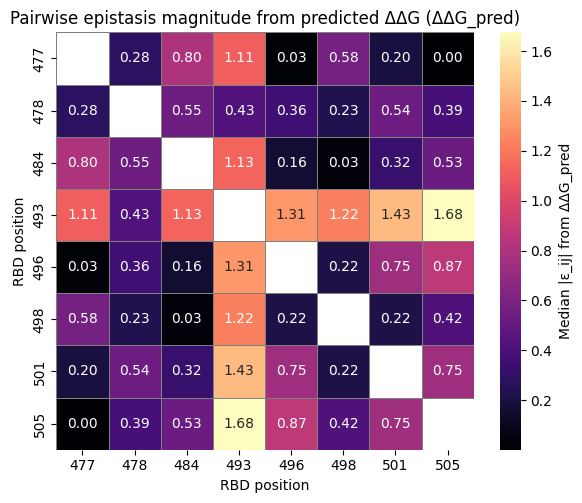

In [42]:
import pandas as pd
import numpy as np
import itertools
import seaborn as sns
import matplotlib.pyplot as plt

# ---------------------------------------------------
# 1. Load Chris's model/regression output
# ---------------------------------------------------
model_path = "/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Landscape_Figures/linear_reg_human.xlsx"
model_df = pd.read_excel(model_path)

# Column to treat as "fitness" for epistasis
energy_col = "ΔΔG_pred"

if energy_col not in model_df.columns:
    raise KeyError(f"Expected column '{energy_col}' not found. Columns include:\n{list(model_df.columns)}")

# ---------------------------------------------------
# 2. Define position columns and labels
# ---------------------------------------------------
pos_cols = ["mut_pos_1","mut_pos_2","mut_pos_3","mut_pos_4",
            "mut_pos_5","mut_pos_6","mut_pos_7","mut_pos_8"]

missing_pos = [c for c in pos_cols if c not in model_df.columns]
if missing_pos:
    raise KeyError(f"Missing expected mutation indicator columns: {missing_pos}")

label_map = {
    "mut_pos_1": "477",
    "mut_pos_2": "478",
    "mut_pos_3": "484",
    "mut_pos_4": "493",
    "mut_pos_5": "496",
    "mut_pos_6": "498",
    "mut_pos_7": "501",
    "mut_pos_8": "505",
}
sites = [label_map[p] for p in pos_cols]

# ---------------------------------------------------
# 3. Identify WT (all zeros) robustly and compute F0
# ---------------------------------------------------
# Prefer mutation_count == 0 if present
if "mutation_count" in model_df.columns:
    wt_mask = (model_df["mutation_count"] == 0)
else:
    # Fall back to "binary" if present, otherwise require all mut_pos_* == 0
    if "binary" in model_df.columns:
        b = model_df["binary"]
        # Accept 0, "0", "00000000" as WT
        wt_mask = (b == 0) | (b.astype(str).str.strip() == "0") | (b.astype(str).str.strip().str.zfill(8) == "00000000")
    else:
        wt_mask = (model_df[pos_cols].sum(axis=1) == 0)

F0_vals = model_df.loc[wt_mask, energy_col].dropna()
if F0_vals.empty:
    raise ValueError("Could not identify WT rows to compute F0 (no non-NaN WT values found).")

F0 = F0_vals.median()
print("WT baseline F0 (median ΔΔG_pred):", F0)

# ---------------------------------------------------
# 4. Compute single-mutant fitness Fi for each position
#    (exactly one mutation at that position, others WT)
# ---------------------------------------------------
if "mutation_count" in model_df.columns:
    single_mask = (model_df["mutation_count"] == 1)
else:
    single_mask = (model_df[pos_cols].sum(axis=1) == 1)

Fi = {}
for pos in pos_cols:
    m = model_df.loc[single_mask & (model_df[pos] == 1), energy_col].dropna()
    Fi[pos] = np.nan if m.empty else m.median()

print("\nSingle-mutant medians (ΔΔG_pred):")
for pos in pos_cols:
    print(f"{label_map[pos]} -> {Fi[pos]}")

# ---------------------------------------------------
# 5. Compute pairwise epistasis ε_ij for double mutants
#    ε_ij = F_ij - F_i - F_j + F0
#    aggregate median |ε_ij| per pair
# ---------------------------------------------------
if "mutation_count" in model_df.columns:
    double_mask_all = (model_df["mutation_count"] == 2)
else:
    double_mask_all = (model_df[pos_cols].sum(axis=1) == 2)

pair_eps_stats = []
eps_mat = pd.DataFrame(index=sites, columns=sites, dtype=float)

for p1, p2 in itertools.combinations(pos_cols, 2):
    d = model_df.loc[double_mask_all & (model_df[p1] == 1) & (model_df[p2] == 1), [energy_col]].dropna()

    if d.empty:
        continue

    F_i = Fi[p1]
    F_j = Fi[p2]
    if np.isnan(F_i) or np.isnan(F_j) or np.isnan(F0):
        continue

    expected = F_i + F_j - F0
    eps_vals = d[energy_col] - expected

    med_abs_eps = eps_vals.abs().median()

    pair_name = f"{label_map[p1]}-{label_map[p2]}"
    pair_eps_stats.append({
        "pair": pair_name,
        "n_double": int(len(d)),
        "median_abs_epsilon": float(med_abs_eps)
    })

    i_lab = label_map[p1]
    j_lab = label_map[p2]
    eps_mat.loc[i_lab, j_lab] = med_abs_eps
    eps_mat.loc[j_lab, i_lab] = med_abs_eps

pair_eps_df = pd.DataFrame(pair_eps_stats).sort_values("median_abs_epsilon", ascending=False)

print("\nTop pairs by median |ε_ij| (ΔΔG_pred epistasis magnitude):")
print(pair_eps_df.head(15).to_string(index=False))

# ---------------------------------------------------
# 6. Plot heatmap of epistasis magnitude from ΔΔG_pred
# ---------------------------------------------------
plt.figure(figsize=(6, 5))

# If you want fixed scaling (for easy comparison across figures), set vmin/vmax.
# Otherwise, comment them out.
sns.heatmap(
    eps_mat.astype(float),
    annot=True,
    fmt=".2f",
    cmap="magma",
    linewidths=0.5,
    linecolor="gray",
    square=True,
    # vmin=0.0,
    # vmax=4.0,
    cbar_kws={"label": "Median |ε_ij| from ΔΔG_pred"}
)

plt.title("Pairwise epistasis magnitude from predicted ΔΔG (ΔΔG_pred)")
plt.xlabel("RBD position")
plt.ylabel("RBD position")
plt.tight_layout()
plt.show()


In [43]:
import itertools
import numpy as np
import pandas as pd

pair_eps_stats = []

sites = [label_map[p] for p in pos_cols]

eps_abs_mat = pd.DataFrame(index=sites, columns=sites, dtype=float)
eps_signed_mat = pd.DataFrame(index=sites, columns=sites, dtype=float)
eps_frac_pos_mat = pd.DataFrame(index=sites, columns=sites, dtype=float)

double_mask_all = (df_ep["mutation_count"] == 2)

for p1, p2 in itertools.combinations(pos_cols, 2):

    # exact double mutants
    mask = double_mask_all & (df_ep[p1] == 1) & (df_ep[p2] == 1)
    d = df_ep.loc[mask]

    if len(d) == 0:
        continue

    F_i = Fi[p1]
    F_j = Fi[p2]

    if np.isnan(F_i) or np.isnan(F_j) or np.isnan(F0):
        continue

    expected = F_i + F_j - F0
    eps_vals = d[exp_col] - expected

    med_abs_eps = eps_vals.abs().median()
    med_eps = eps_vals.median()
    frac_pos = (eps_vals > 0).mean()

    pair_eps_stats.append({
        "pair": f"{label_map[p1]}-{label_map[p2]}",
        "n_double": len(d),
        "median_epsilon": med_eps,
        "median_abs_epsilon": med_abs_eps,
        "fraction_positive": frac_pos
    })

    i_lab = label_map[p1]
    j_lab = label_map[p2]

    eps_abs_mat.loc[i_lab, j_lab] = med_abs_eps
    eps_abs_mat.loc[j_lab, i_lab] = med_abs_eps

    eps_signed_mat.loc[i_lab, j_lab] = med_eps
    eps_signed_mat.loc[j_lab, i_lab] = med_eps

    eps_frac_pos_mat.loc[i_lab, j_lab] = frac_pos
    eps_frac_pos_mat.loc[j_lab, i_lab] = frac_pos

pair_eps_df = pd.DataFrame(pair_eps_stats).sort_values(
    "median_abs_epsilon", ascending=False
)

display(pair_eps_df)


,pair,n_double,median_epsilon,median_abs_epsilon,fraction_positive
24,496-505,1,-4.318614,4.318614,0.0
13,484-493,1,2.479778,2.479778,1.0
18,493-496,1,-2.100515,2.100515,0.0
0,477-478,1,1.794832,1.794832,1.0
15,484-498,1,-1.608761,1.608761,0.0
2,477-493,1,1.555335,1.555335,1.0
20,493-501,1,1.464931,1.464931,1.0
23,496-501,1,1.461221,1.461221,1.0
11,478-501,1,1.217567,1.217567,1.0
27,501-505,1,1.214963,1.214963,1.0


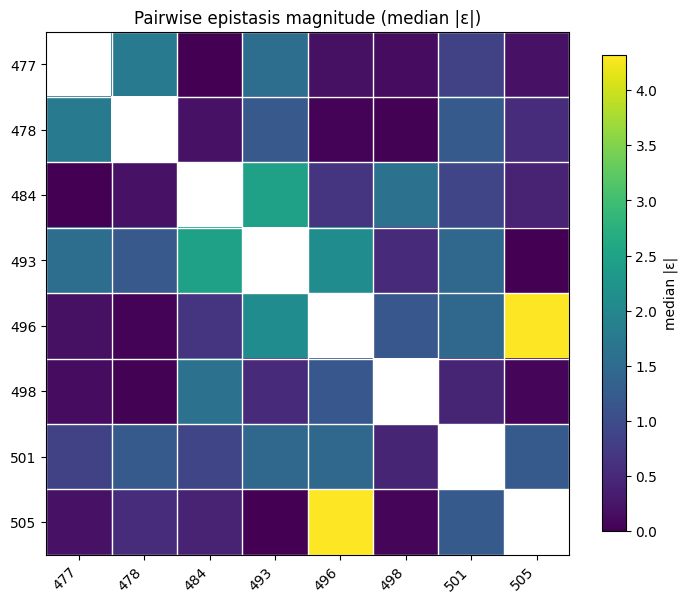

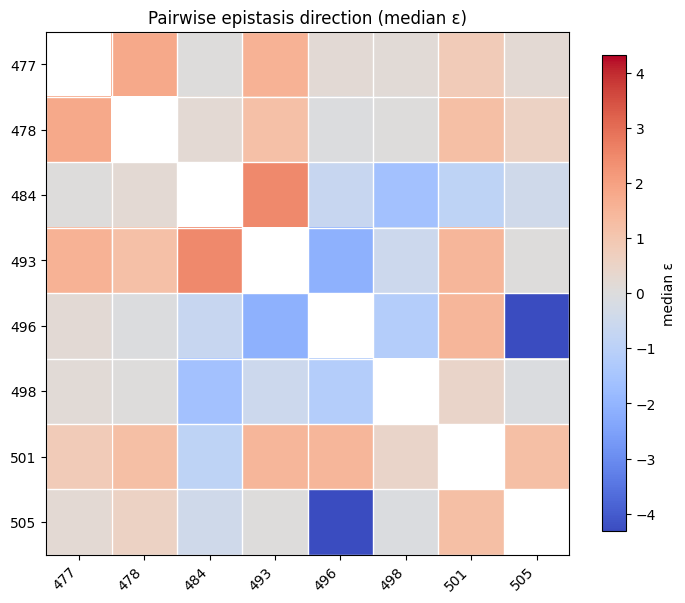

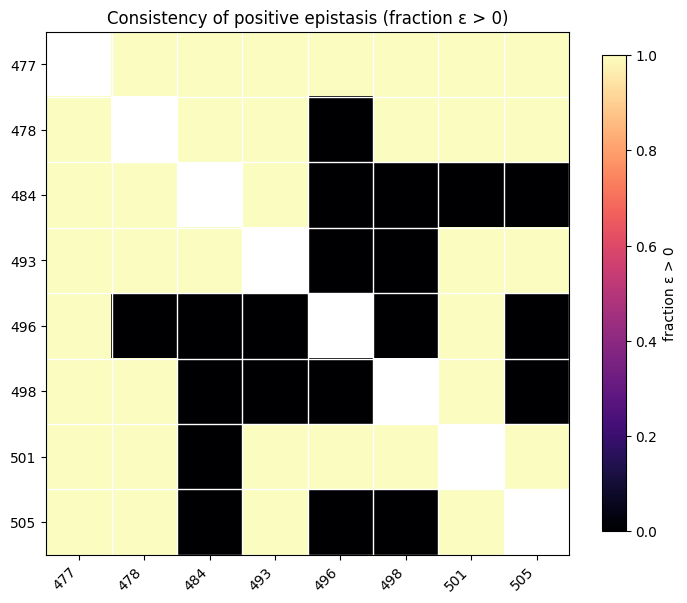

In [44]:
import numpy as np
import matplotlib.pyplot as plt

def _prep_mat(mat, diag=np.nan):
    """Copy + set diagonal to NaN so it renders blank."""
    m = mat.copy().astype(float)
    np.fill_diagonal(m.values, diag)
    return m

def plot_heatmap(mat, title, vmin=None, vmax=None, cmap=None, cbar_label="", annotate=False, fmt=".2f"):
    m = _prep_mat(mat)
    labels = list(m.index)

    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(m.values, vmin=vmin, vmax=vmax, cmap=cmap, aspect="equal")

    ax.set_title(title)
    ax.set_xticks(range(len(labels)))
    ax.set_yticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels)

    # grid lines
    ax.set_xticks(np.arange(-.5, len(labels), 1), minor=True)
    ax.set_yticks(np.arange(-.5, len(labels), 1), minor=True)
    ax.grid(which="minor", color="white", linewidth=1.0)
    ax.tick_params(which="minor", bottom=False, left=False)

    cbar = fig.colorbar(im, ax=ax, shrink=0.85)
    if cbar_label:
        cbar.set_label(cbar_label)

    if annotate:
        for i in range(len(labels)):
            for j in range(len(labels)):
                val = m.values[i, j]
                if np.isfinite(val):
                    ax.text(j, i, format(val, fmt), ha="center", va="center", fontsize=8)

    plt.tight_layout()
    plt.show()


# 1) Magnitude: median |epsilon|
plot_heatmap(
    eps_abs_mat,
    title="Pairwise epistasis magnitude (median |ε|)",
    vmin=0,
    vmax=np.nanmax(eps_abs_mat.values),
    cmap="viridis",
    cbar_label="median |ε|"
)

# 2) Direction: median epsilon (signed)
# Symmetric diverging scale around 0 makes interpretation easy.
signed_max = np.nanmax(np.abs(eps_signed_mat.values))
plot_heatmap(
    eps_signed_mat,
    title="Pairwise epistasis direction (median ε)",
    vmin=-signed_max,
    vmax=signed_max,
    cmap="coolwarm",
    cbar_label="median ε"
)

# 3) Consistency of direction: fraction of ε > 0
plot_heatmap(
    eps_frac_pos_mat,
    title="Consistency of positive epistasis (fraction ε > 0)",
    vmin=0.0,
    vmax=1.0,
    cmap="magma",
    cbar_label="fraction ε > 0"
)


,pair,n_backgrounds,median_epsilon,median_abs_epsilon,fraction_positive
23,496-501,64,1.141585,1.749877,0.656250
26,498-505,64,1.511955,1.747468,0.781250
27,501-505,64,0.442812,1.621686,0.578125
1,477-484,64,-0.816608,1.600681,0.375000
20,493-501,64,0.660671,1.577600,0.625000
5,477-501,64,-0.521578,1.514277,0.406250
16,484-501,64,-0.183985,1.501352,0.468750
22,496-498,64,0.659510,1.488006,0.625000
3,477-496,64,0.349610,1.486637,0.531250
13,484-493,64,1.011203,1.476596,0.656250


,pair,n_backgrounds,median_epsilon,median_abs_epsilon,fraction_positive
23,496-501,64,1.718910,1.736052,0.828125
26,498-505,64,1.575175,1.592348,0.812500
25,498-501,64,0.407158,1.545216,0.609375
5,477-501,64,-0.992196,1.304973,0.281250
22,496-498,64,0.859369,1.253690,0.609375
20,493-501,64,1.129008,1.220724,0.843750
11,478-501,64,-0.394387,1.194445,0.406250
27,501-505,64,0.612344,1.155767,0.625000
17,484-505,64,0.180492,1.063169,0.546875
9,478-496,64,-0.218834,1.046263,0.421875


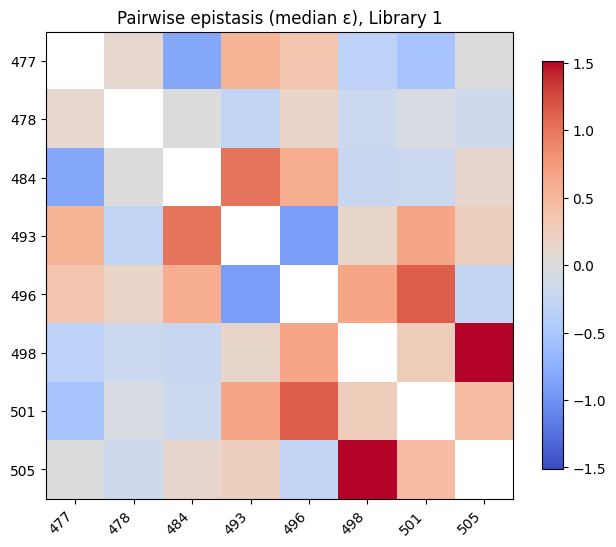

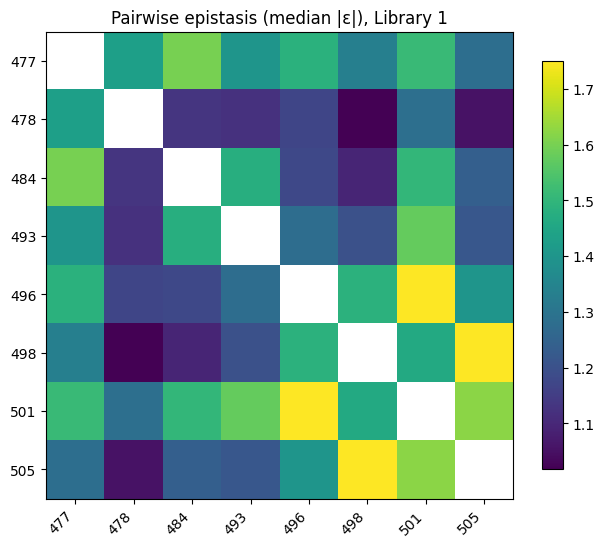

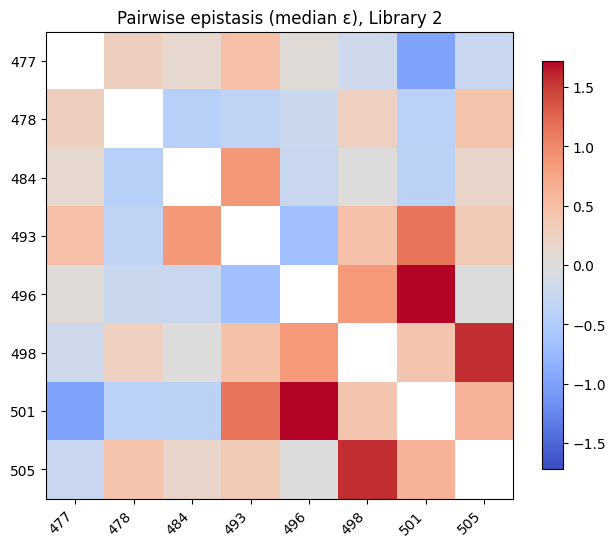

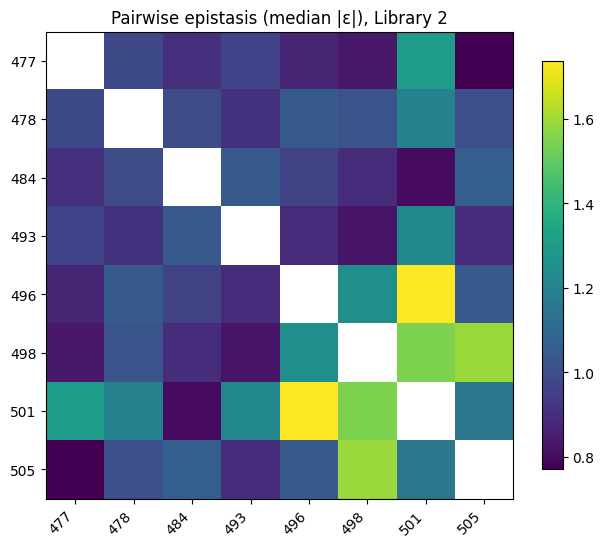

,pair,n_backgrounds_lib1,median_epsilon_lib1,median_abs_epsilon_lib1,fraction_positive_lib1,n_backgrounds_lib2,median_epsilon_lib2,median_abs_epsilon_lib2,fraction_positive_lib2,abs_eps_diff
6,484-501,64,-0.183985,1.501352,0.468750,64,-0.382100,0.798250,0.421875,0.703102
3,477-484,64,-0.816608,1.600681,0.375000,64,0.121832,0.905521,0.515625,0.695160
8,477-496,64,0.349610,1.486637,0.531250,64,0.051967,0.870290,0.546875,0.616347
16,477-505,64,-0.017415,1.282193,0.500000,64,-0.246407,0.771565,0.453125,0.510628
14,477-498,64,-0.325924,1.333022,0.421875,64,-0.177762,0.836302,0.421875,0.496721
2,501-505,64,0.442812,1.621686,0.578125,64,0.612344,1.155767,0.625000,0.465919
11,477-478,64,0.116780,1.432260,0.562500,64,0.258686,0.983046,0.593750,0.449214
9,484-493,64,1.011203,1.476596,0.656250,64,0.867534,1.040940,0.734375,0.435656
13,477-493,64,0.525392,1.399003,0.546875,64,0.477161,0.965752,0.609375,0.433251
17,493-496,64,-0.911966,1.278616,0.296875,64,-0.645916,0.885547,0.328125,0.393069


In [45]:
import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt

# ----------------------------
# 0) Input dataframe
# ----------------------------
df = exp_df.copy()

# ----------------------------
# 1) Identify mutation indicator columns and map them to residue labels
# ----------------------------
pos_cols = [c for c in df.columns if c.startswith("mut_pos_")]
if len(pos_cols) != 8:
    raise ValueError(f"Expected 8 mut_pos_* columns, found {len(pos_cols)}: {pos_cols}")

# Ensure consistent ordering: mut_pos_1 ... mut_pos_8
pos_cols = sorted(pos_cols, key=lambda x: int(x.split("_")[-1]))

# Your 8 sites (in the same order as mut_pos_1..8 in your dataset)
site_labels = [477, 478, 484, 493, 496, 498, 501, 505]
label_map = {pos_cols[i]: site_labels[i] for i in range(8)}

# ----------------------------
# 2) Build per-genotype fitness columns per library
#    Fitness that matches your landscape: F_spec = log2FC(pos/pre) - log2FC(neg/pre)
# ----------------------------
required_cols = [
    "log2fc_pos_pre_lib1", "log2fc_neg_pre_lib1",
    "log2fc_pos_pre_lib2", "log2fc_neg_pre_lib2",
]
missing = [c for c in required_cols if c not in df.columns]
if missing:
    raise KeyError(f"Missing required columns: {missing}")

for lib in [1, 2]:
    df[f"F_spec_lib{lib}"] = df[f"log2fc_pos_pre_lib{lib}"].astype(float) - df[f"log2fc_neg_pre_lib{lib}"].astype(float)

# Also compute pooled, if you want (not used below)
if "mean_log2fc_pos_pre" in df.columns and "mean_log2fc_neg_pre" in df.columns:
    df["F_spec_mean"] = df["mean_log2fc_pos_pre"].astype(float) - df["mean_log2fc_neg_pre"].astype(float)

# ----------------------------
# 3) Make a genotype key from mut_pos bits (more robust than relying on 'binary' column)
# ----------------------------
# Force bits to int 0/1
for c in pos_cols:
    df[c] = df[c].astype(int)

# genotype tuple key: (b1,b2,...,b8)
df["geno_key"] = list(map(tuple, df[pos_cols].values))

# WT key = all zeros
WT = tuple([0]*8)

# ----------------------------
# 4) Helper: compute pairwise epsilons across all backgrounds for one fitness column
# ----------------------------
def compute_pairwise_eps(df, fitness_col):
    """
    Returns:
      pair_table: DataFrame with per-pair stats
      eps_signed: 8x8 DataFrame of median epsilon
      eps_abs:    8x8 DataFrame of median |epsilon|
      eps_fracpos:8x8 DataFrame of fraction epsilon > 0
      eps_n:      8x8 DataFrame of number of backgrounds contributing
    """
    # Map genotype -> fitness
    f_map = dict(zip(df["geno_key"], df[fitness_col].astype(float)))

    # WT fitness
    F0 = f_map.get(WT, np.nan)

    sites = site_labels
    eps_signed = pd.DataFrame(np.nan, index=sites, columns=sites)
    eps_abs    = pd.DataFrame(np.nan, index=sites, columns=sites)
    eps_frac   = pd.DataFrame(np.nan, index=sites, columns=sites)
    eps_n      = pd.DataFrame(0,     index=sites, columns=sites)

    rows = []

    # Indices 0..7 correspond to sites 477..505
    idxs = list(range(8))

    # Iterate all pairs (i, j)
    for i, j in itertools.combinations(idxs, 2):
        eps_vals = []

        # Background positions = all k != i,j
        bg_idxs = [k for k in idxs if k not in (i, j)]

        # Loop over all 2^6 backgrounds
        for bg_bits in itertools.product([0, 1], repeat=len(bg_idxs)):
            base = [0]*8
            for k, bit in zip(bg_idxs, bg_bits):
                base[k] = bit

            # Construct the 4 genotypes in this background
            g00 = tuple(base)  # i=0, j=0
            g10 = list(base); g10[i] = 1; g10[j] = 0; g10 = tuple(g10)
            g01 = list(base); g01[i] = 0; g01[j] = 1; g01 = tuple(g01)
            g11 = list(base); g11[i] = 1; g11[j] = 1; g11 = tuple(g11)

            F00 = f_map.get(g00, np.nan)
            F10 = f_map.get(g10, np.nan)
            F01 = f_map.get(g01, np.nan)
            F11 = f_map.get(g11, np.nan)

            # Skip if any missing or non-finite
            vals = np.array([F00, F10, F01, F11], dtype=float)
            if not np.all(np.isfinite(vals)):
                continue

            eps = F11 - F10 - F01 + F00
            eps_vals.append(eps)

        eps_vals = np.array(eps_vals, dtype=float)

        si = sites[i]
        sj = sites[j]

        if eps_vals.size == 0:
            # no data for this pair
            continue

        med_eps = float(np.median(eps_vals))
        med_abs = float(np.median(np.abs(eps_vals)))
        fracpos = float(np.mean(eps_vals > 0))
        n = int(eps_vals.size)

        eps_signed.loc[si, sj] = med_eps
        eps_signed.loc[sj, si] = med_eps

        eps_abs.loc[si, sj] = med_abs
        eps_abs.loc[sj, si] = med_abs

        eps_frac.loc[si, sj] = fracpos
        eps_frac.loc[sj, si] = fracpos

        eps_n.loc[si, sj] = n
        eps_n.loc[sj, si] = n

        rows.append({
            "pair": f"{si}-{sj}",
            "n_backgrounds": n,
            "median_epsilon": med_eps,
            "median_abs_epsilon": med_abs,
            "fraction_positive": fracpos
        })

    pair_table = pd.DataFrame(rows).sort_values("median_abs_epsilon", ascending=False)

    return pair_table, eps_signed, eps_abs, eps_frac, eps_n


# ----------------------------
# 5) Run epistasis for each library separately
# ----------------------------
pair_lib1, eps_signed1, eps_abs1, eps_frac1, eps_n1 = compute_pairwise_eps(df, "F_spec_lib1")
pair_lib2, eps_signed2, eps_abs2, eps_frac2, eps_n2 = compute_pairwise_eps(df, "F_spec_lib2")

display(pair_lib1.head(10))
display(pair_lib2.head(10))

# ----------------------------
# 6) Simple plotting helpers (matplotlib only)
# ----------------------------
def plot_heatmap(mat, title, vmin=None, vmax=None, cmap="coolwarm"):
    fig, ax = plt.subplots(figsize=(6.5, 5.5))
    im = ax.imshow(mat.values.astype(float), vmin=vmin, vmax=vmax, cmap=cmap)
    ax.set_title(title)
    ax.set_xticks(range(len(mat.columns)))
    ax.set_yticks(range(len(mat.index)))
    ax.set_xticklabels(mat.columns, rotation=45, ha="right")
    ax.set_yticklabels(mat.index)
    cbar = fig.colorbar(im, ax=ax, shrink=0.85)
    plt.tight_layout()
    plt.show()

# Choose symmetric bounds for signed heatmaps (so 0 is centered)
def symmetric_bounds(mat):
    vals = mat.values[np.isfinite(mat.values)]
    if vals.size == 0:
        return None, None
    m = float(np.max(np.abs(vals)))
    return -m, m

# ----------------------------
# 7) Plot: signed + magnitude maps for each library
# ----------------------------
vmin, vmax = symmetric_bounds(eps_signed1)
plot_heatmap(eps_signed1, "Pairwise epistasis (median ε), Library 1", vmin=vmin, vmax=vmax, cmap="coolwarm")
plot_heatmap(eps_abs1,    "Pairwise epistasis (median |ε|), Library 1", cmap="viridis")

vmin, vmax = symmetric_bounds(eps_signed2)
plot_heatmap(eps_signed2, "Pairwise epistasis (median ε), Library 2", vmin=vmin, vmax=vmax, cmap="coolwarm")
plot_heatmap(eps_abs2,    "Pairwise epistasis (median |ε|), Library 2", cmap="viridis")

# ----------------------------
# 8) Optional: compare libraries at the pair level (sanity check)
# ----------------------------
merged_pairs = pair_lib1.merge(pair_lib2, on="pair", suffixes=("_lib1", "_lib2"))
merged_pairs["abs_eps_diff"] = np.abs(merged_pairs["median_abs_epsilon_lib1"] - merged_pairs["median_abs_epsilon_lib2"])
merged_pairs = merged_pairs.sort_values("abs_eps_diff", ascending=False)
display(merged_pairs)


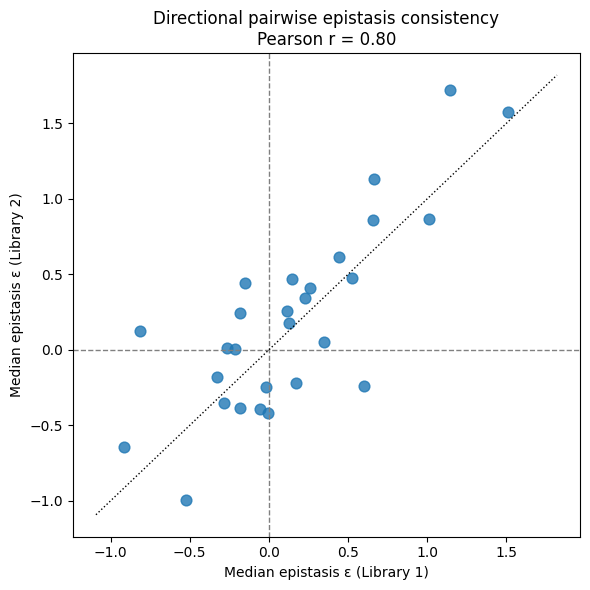

In [46]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr

# Use the merged_pairs dataframe
df = merged_pairs.copy()

x = df["median_epsilon_lib1"]
y = df["median_epsilon_lib2"]

# Correlation (descriptive, not inferential)
r, p = pearsonr(x, y)

plt.figure(figsize=(6, 6))
plt.scatter(x, y, s=60, alpha=0.8)

# Zero lines to show sign agreement
plt.axhline(0, color="gray", linestyle="--", linewidth=1)
plt.axvline(0, color="gray", linestyle="--", linewidth=1)

# Diagonal reference
lims = [
    min(x.min(), y.min()) - 0.1,
    max(x.max(), y.max()) + 0.1
]
plt.plot(lims, lims, color="black", linestyle=":", linewidth=1)

plt.xlabel("Median epistasis ε (Library 1)")
plt.ylabel("Median epistasis ε (Library 2)")
plt.title(
    f"Directional pairwise epistasis consistency\n"
    f"Pearson r = {r:.2f}"
)

plt.tight_layout()
plt.show()


In [492]:
import numpy as np
import pandas as pd
import itertools

# ----------------------------
# 0) Load Chris model table (already loaded as model_df in your notebook)
#    If not loaded, uncomment and set path.
# ----------------------------
# model_path = "/Users/jonathanfelix/Documents/Yeast_Lib_Final_Deduplicated/Landscape_Figures/linear_reg_human.xlsx"
# model_df = pd.read_excel(model_path)

df = model_df.copy()

# ----------------------------
# 1) Identify the 8 mutation indicator columns (mut_pos_1..mut_pos_8)
# ----------------------------
pos_cols = [c for c in df.columns if c.startswith("mut_pos_")]
if len(pos_cols) != 8:
    raise ValueError(f"Expected 8 mut_pos_* columns, found {len(pos_cols)}: {pos_cols}")

pos_cols = sorted(pos_cols, key=lambda x: int(x.split("_")[-1]))

site_labels = [477, 478, 484, 493, 496, 498, 501, 505]
label_map = {pos_cols[i]: site_labels[i] for i in range(8)}
sites = site_labels

# Force bits to int 0/1
for c in pos_cols:
    df[c] = df[c].astype(int)

# ----------------------------
# 2) Build "fitness-like" model column
#    ΔΔG_pred: lower (more negative) = stronger binding
#    Flip sign so higher = stronger binding (matches experimental convention)
# ----------------------------
if "ΔΔG_pred" not in df.columns:
    raise KeyError("Could not find column 'ΔΔG_pred' in model_df.columns")

df["F_model"] = -df["ΔΔG_pred"].astype(float)

# ----------------------------
# 3) Build genotype key from the 8 bits (robust; avoids binary column issues)
# ----------------------------
df["geno_key"] = list(map(tuple, df[pos_cols].values))
WT = tuple([0]*8)

# ----------------------------
# 4) Pairwise epistasis across all backgrounds
#    epsilon = F11 - F10 - F01 + F00  (background-specific)
# ----------------------------
def compute_pairwise_eps_from_map(f_map):
    eps_signed = pd.DataFrame(np.nan, index=sites, columns=sites)
    eps_abs    = pd.DataFrame(np.nan, index=sites, columns=sites)
    eps_frac   = pd.DataFrame(np.nan, index=sites, columns=sites)
    eps_n      = pd.DataFrame(0,     index=sites, columns=sites)

    rows = []
    idxs = list(range(8))

    for i, j in itertools.combinations(idxs, 2):
        bg_idxs = [k for k in idxs if k not in (i, j)]
        eps_vals = []

        for bg_bits in itertools.product([0, 1], repeat=len(bg_idxs)):
            base = [0]*8
            for k, bit in zip(bg_idxs, bg_bits):
                base[k] = bit

            g00 = tuple(base)
            g10 = list(base); g10[i] = 1; g10[j] = 0; g10 = tuple(g10)
            g01 = list(base); g01[i] = 0; g01[j] = 1; g01 = tuple(g01)
            g11 = list(base); g11[i] = 1; g11[j] = 1; g11 = tuple(g11)

            F00 = f_map.get(g00, np.nan)
            F10 = f_map.get(g10, np.nan)
            F01 = f_map.get(g01, np.nan)
            F11 = f_map.get(g11, np.nan)

            vals = np.array([F00, F10, F01, F11], dtype=float)
            if not np.all(np.isfinite(vals)):
                continue

            eps = F11 - F10 - F01 + F00
            eps_vals.append(eps)

        eps_vals = np.array(eps_vals, dtype=float)
        if eps_vals.size == 0:
            continue

        si, sj = sites[i], sites[j]
        med_eps = float(np.median(eps_vals))
        med_abs = float(np.median(np.abs(eps_vals)))
        fracpos = float(np.mean(eps_vals > 0))
        n = int(eps_vals.size)

        for mat, val in [(eps_signed, med_eps), (eps_abs, med_abs), (eps_frac, fracpos)]:
            mat.loc[si, sj] = val
            mat.loc[sj, si] = val

        eps_n.loc[si, sj] = n
        eps_n.loc[sj, si] = n

        rows.append({
            "pair": f"{si}-{sj}",
            "n_backgrounds": n,
            "median_epsilon": med_eps,
            "median_abs_epsilon": med_abs,
            "fraction_positive": fracpos
        })

    pair_table = pd.DataFrame(rows).sort_values("median_abs_epsilon", ascending=False)
    return pair_table, eps_signed, eps_abs, eps_frac, eps_n

# Map genotype -> fitness for model
f_map_model = dict(zip(df["geno_key"], df["F_model"].astype(float)))

pair_model, eps_signed_model, eps_abs_model, eps_frac_model, eps_n_model = compute_pairwise_eps_from_map(f_map_model)

display(pair_model.head(10))


,pair,n_backgrounds,median_epsilon,median_abs_epsilon,fraction_positive
25,498-501,64,0.257129,0.612493,0.640625
7,478-484,64,-0.210780,0.562075,0.437500
4,477-498,64,-0.393525,0.561066,0.265625
20,493-501,64,0.419247,0.551724,0.687500
1,477-484,64,0.067342,0.518570,0.562500
19,493-498,64,0.054872,0.486825,0.531250
16,484-501,64,0.208517,0.485509,0.671875
12,478-505,64,0.170865,0.480559,0.609375
21,493-505,64,-0.398605,0.479774,0.328125
27,501-505,64,0.305120,0.470849,0.640625


,pair,n_backgrounds_lib1,median_epsilon_lib1,mean_epsilon_lib1,median_abs_epsilon_lib1,mean_abs_epsilon_lib1,fraction_positive_lib1,n_backgrounds_lib2,median_epsilon_lib2,mean_epsilon_lib2,...,median_epsilon_lib3,mean_epsilon_lib3,median_abs_epsilon_lib3,mean_abs_epsilon_lib3,fraction_positive_lib3,abs_eps_diff_median_lib1_vs_lib2,abs_eps_diff_median_lib1_vs_lib3,abs_eps_diff_median_lib2_vs_lib3,median_epsilon_exp,median_epsilon_model
0,477-478,64,0.116780,0.292380,1.432260,1.673945,0.562500,64,0.258686,0.231051,...,-0.185693,-0.260946,1.195721,1.597669,0.468750,0.449214,0.236539,0.212675,0.187733,-0.165772
1,477-484,64,-0.816608,-0.537754,1.600681,1.799958,0.375000,64,0.121832,0.028475,...,0.305185,0.347297,1.602112,1.827113,0.578125,0.695160,0.001431,0.696591,-0.347388,0.067342
2,477-493,64,0.525392,0.487628,1.399003,1.838291,0.546875,64,0.477161,0.276932,...,-0.149652,0.030715,1.812255,1.912695,0.500000,0.433251,0.413253,0.846503,0.501277,-0.055318
3,477-496,64,0.349610,0.299587,1.486637,1.772158,0.531250,64,0.051967,0.229807,...,-0.474436,-0.085328,1.575263,1.759816,0.406250,0.616347,0.088626,0.704973,0.200789,-0.084450
4,477-498,64,-0.325924,-0.504122,1.333022,1.760879,0.421875,64,-0.177762,0.065801,...,-0.187678,-0.314574,1.672845,1.776900,0.484375,0.496721,0.339823,0.836543,-0.251843,-0.393525


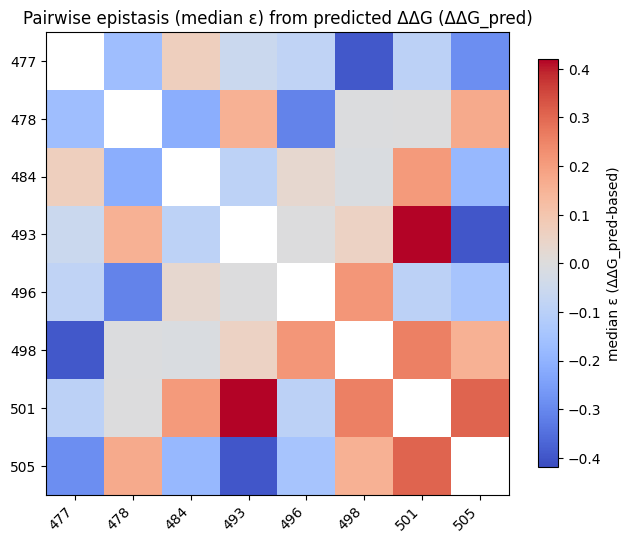

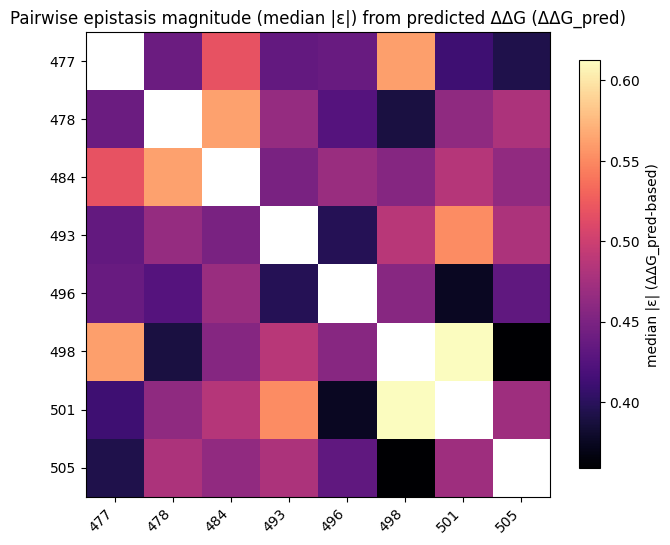

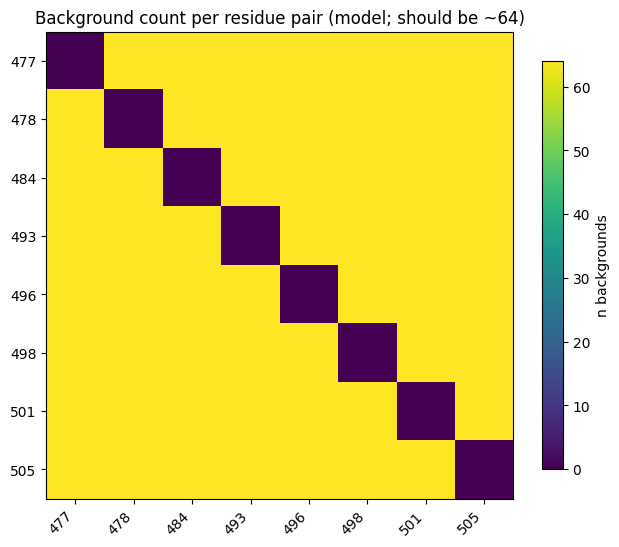

In [493]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Average experimental directional epistasis across libraries
exp_pairs = merged_pairs.copy()
exp_pairs["median_epsilon_exp"] = (
    exp_pairs["median_epsilon_lib1"] + exp_pairs["median_epsilon_lib2"]
) / 2

# pair_model comes from the ΔΔG_pred analysis
model_pairs = pair_model.copy()
model_pairs = model_pairs.rename(columns={
    "median_epsilon": "median_epsilon_model",
    "median_abs_epsilon": "median_abs_epsilon_model"
})

df_corr = exp_pairs.merge(
    model_pairs[["pair", "median_epsilon_model"]],
    on="pair",
    how="inner"
)

display(df_corr.head())


# ----------------------------
# 6) Plot helpers (matplotlib only)
# ----------------------------
def plot_heatmap(mat, title, vmin=None, vmax=None, cmap="coolwarm", cbar_label=None, annotate=False):
    fig, ax = plt.subplots(figsize=(6.5, 5.5))
    data = mat.values.astype(float)
    im = ax.imshow(data, vmin=vmin, vmax=vmax, cmap=cmap)

    ax.set_title(title)
    ax.set_xticks(range(len(mat.columns)))
    ax.set_yticks(range(len(mat.index)))
    ax.set_xticklabels(mat.columns, rotation=45, ha="right")
    ax.set_yticklabels(mat.index)

    if annotate:
        for r in range(data.shape[0]):
            for c in range(data.shape[1]):
                val = data[r, c]
                if np.isfinite(val):
                    ax.text(c, r, f"{val:.2f}", ha="center", va="center", fontsize=8, color="white")

    cbar = fig.colorbar(im, ax=ax, shrink=0.85)
    if cbar_label:
        cbar.set_label(cbar_label)

    plt.tight_layout()
    plt.show()

def symmetric_bounds(mat):
    vals = mat.values[np.isfinite(mat.values)]
    if vals.size == 0:
        return None, None
    m = float(np.max(np.abs(vals)))
    return -m, m

# ----------------------------
# 7) Plot signed + magnitude maps for the model
# ----------------------------
vmin, vmax = symmetric_bounds(eps_signed_model)
plot_heatmap(
    eps_signed_model,
    "Pairwise epistasis (median ε) from predicted ΔΔG (ΔΔG_pred)",
    vmin=vmin, vmax=vmax,
    cmap="coolwarm",
    cbar_label="median ε (ΔΔG_pred-based)"
)

plot_heatmap(
    eps_abs_model,
    "Pairwise epistasis magnitude (median |ε|) from predicted ΔΔG (ΔΔG_pred)",
    cmap="magma",
    cbar_label="median |ε| (ΔΔG_pred-based)"
)

# Optional: inspect how many backgrounds contributed per cell (should be ~64 everywhere if complete)
plot_heatmap(
    eps_n_model.astype(float),
    "Background count per residue pair (model; should be ~64)",
    cmap="viridis",
    cbar_label="n backgrounds",
    vmin=0, vmax=64
)


In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Average experimental directional epistasis across libraries
exp_pairs = merged_pairs.copy()
exp_pairs["median_epsilon_exp"] = (
    exp_pairs["median_epsilon_lib1"] + exp_pairs["median_epsilon_lib2"]
) / 2


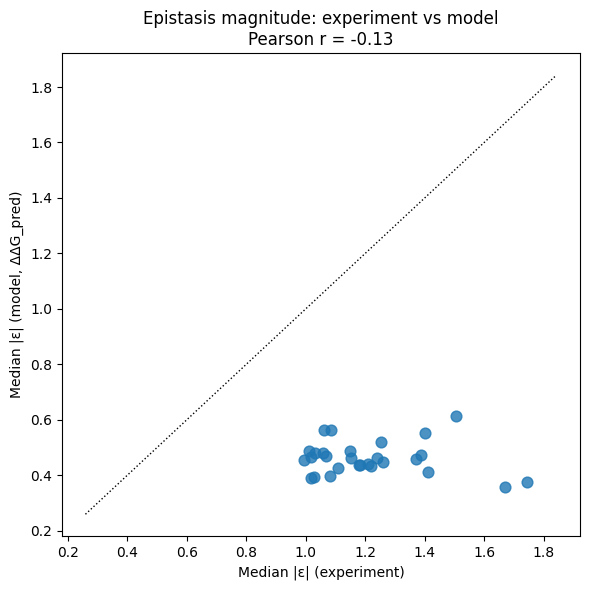

,pair,n_backgrounds_lib1,median_epsilon_lib1,mean_epsilon_lib1,median_abs_epsilon_lib1,mean_abs_epsilon_lib1,fraction_positive_lib1,n_backgrounds_lib2,median_epsilon_lib2,mean_epsilon_lib2,...,mean_epsilon_lib3,median_abs_epsilon_lib3,mean_abs_epsilon_lib3,fraction_positive_lib3,abs_eps_diff_median_lib1_vs_lib2,abs_eps_diff_median_lib1_vs_lib3,abs_eps_diff_median_lib2_vs_lib3,median_epsilon_exp,median_abs_epsilon_exp,median_epsilon_model
0,477-478,64,0.116780,0.292380,1.432260,1.673945,0.562500,64,0.258686,0.231051,...,-0.260946,1.195721,1.597669,0.468750,0.449214,0.236539,0.212675,0.187733,1.207653,-0.165772
1,477-484,64,-0.816608,-0.537754,1.600681,1.799958,0.375000,64,0.121832,0.028475,...,0.347297,1.602112,1.827113,0.578125,0.695160,0.001431,0.696591,-0.347388,1.253101,0.067342
2,477-493,64,0.525392,0.487628,1.399003,1.838291,0.546875,64,0.477161,0.276932,...,0.030715,1.812255,1.912695,0.500000,0.433251,0.413253,0.846503,0.501277,1.182377,-0.055318
3,477-496,64,0.349610,0.299587,1.486637,1.772158,0.531250,64,0.051967,0.229807,...,-0.085328,1.575263,1.759816,0.406250,0.616347,0.088626,0.704973,0.200789,1.178463,-0.084450
4,477-498,64,-0.325924,-0.504122,1.333022,1.760879,0.421875,64,-0.177762,0.065801,...,-0.314574,1.672845,1.776900,0.484375,0.496721,0.339823,0.836543,-0.251843,1.084662,-0.393525


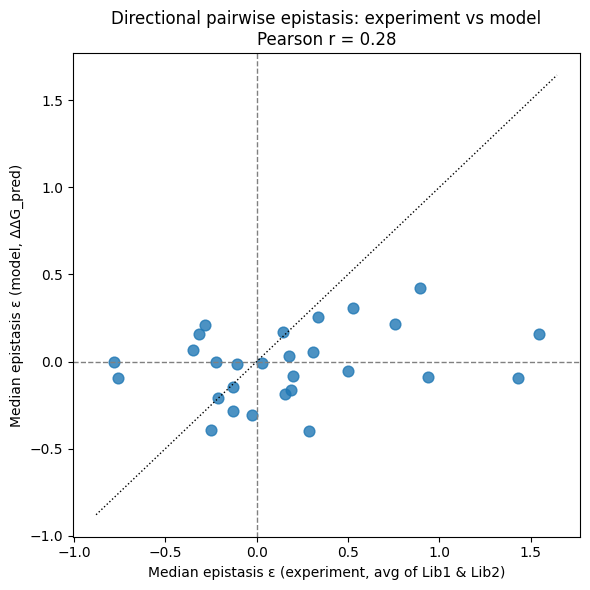

In [495]:
x = df_mag["median_abs_epsilon_exp"]
y = df_mag["median_abs_epsilon_model"]

r, p = pearsonr(x, y)

plt.figure(figsize=(6, 6))
plt.scatter(x, y, s=60, alpha=0.8)

lims = [
    min(x.min(), y.min()) - 0.1,
    max(x.max(), y.max()) + 0.1
]
plt.plot(lims, lims, color="black", linestyle=":", linewidth=1)

plt.xlabel("Median |ε| (experiment)")
plt.ylabel("Median |ε| (model, ΔΔG_pred)")
plt.title(
    f"Epistasis magnitude: experiment vs model\n"
    f"Pearson r = {r:.2f}"
)

plt.tight_layout()
plt.show()

# pair_model comes from the ΔΔG_pred analysis
model_pairs = pair_model.copy()
model_pairs = model_pairs.rename(columns={
    "median_epsilon": "median_epsilon_model",
    "median_abs_epsilon": "median_abs_epsilon_model"
})

df_corr = exp_pairs.merge(
    model_pairs[["pair", "median_epsilon_model"]],
    on="pair",
    how="inner"
)

display(df_corr.head())

x = df_corr["median_epsilon_exp"]
y = df_corr["median_epsilon_model"]

r, p = pearsonr(x, y)

plt.figure(figsize=(6, 6))
plt.scatter(x, y, s=60, alpha=0.8)

# Zero lines
plt.axhline(0, color="gray", linestyle="--", linewidth=1)
plt.axvline(0, color="gray", linestyle="--", linewidth=1)

# Identity line
lims = [
    min(x.min(), y.min()) - 0.1,
    max(x.max(), y.max()) + 0.1
]
plt.plot(lims, lims, color="black", linestyle=":", linewidth=1)

plt.xlabel("Median epistasis ε (experiment, avg of Lib1 & Lib2)")
plt.ylabel("Median epistasis ε (model, ΔΔG_pred)")
plt.title(
    f"Directional pairwise epistasis: experiment vs model\n"
    f"Pearson r = {r:.2f}"
)

plt.tight_layout()
plt.show()


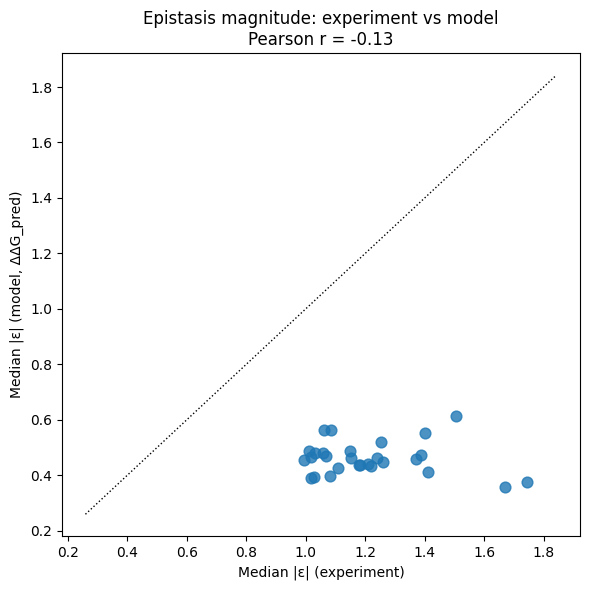

In [494]:
exp_pairs["median_abs_epsilon_exp"] = (
    exp_pairs["median_abs_epsilon_lib1"] + exp_pairs["median_abs_epsilon_lib2"]
) / 2

df_mag = exp_pairs.merge(
    model_pairs[["pair", "median_abs_epsilon_model"]],
    on="pair",
    how="inner"
)

x = df_mag["median_abs_epsilon_exp"]
y = df_mag["median_abs_epsilon_model"]

r, p = pearsonr(x, y)

plt.figure(figsize=(6, 6))
plt.scatter(x, y, s=60, alpha=0.8)

lims = [
    min(x.min(), y.min()) - 0.1,
    max(x.max(), y.max()) + 0.1
]
plt.plot(lims, lims, color="black", linestyle=":", linewidth=1)

plt.xlabel("Median |ε| (experiment)")
plt.ylabel("Median |ε| (model, ΔΔG_pred)")
plt.title(
    f"Epistasis magnitude: experiment vs model\n"
    f"Pearson r = {r:.2f}"
)

plt.tight_layout()
plt.show()


Model pairwise epistasis summary:


,pair,n_backgrounds,median_epsilon,mean_epsilon,median_abs_epsilon,mean_abs_epsilon,fraction_positive
25,498-501,64,0.257129,0.239062,0.612493,0.627018,0.640625
7,478-484,64,-0.210780,-0.079687,0.562075,0.645604,0.437500
4,477-498,64,-0.393525,-0.379687,0.561066,0.645097,0.265625
20,493-501,64,0.419247,0.295312,0.551724,0.641108,0.687500
1,477-484,64,0.067342,0.001562,0.518570,0.574594,0.562500
19,493-498,64,0.054872,-0.001562,0.486825,0.570672,0.531250
16,484-501,64,0.208517,0.326562,0.485509,0.618143,0.671875
12,478-505,64,0.170865,0.079687,0.480559,0.574976,0.609375
21,493-505,64,-0.398605,-0.323437,0.479774,0.611569,0.328125
27,501-505,64,0.305120,0.285937,0.470849,0.584080,0.640625


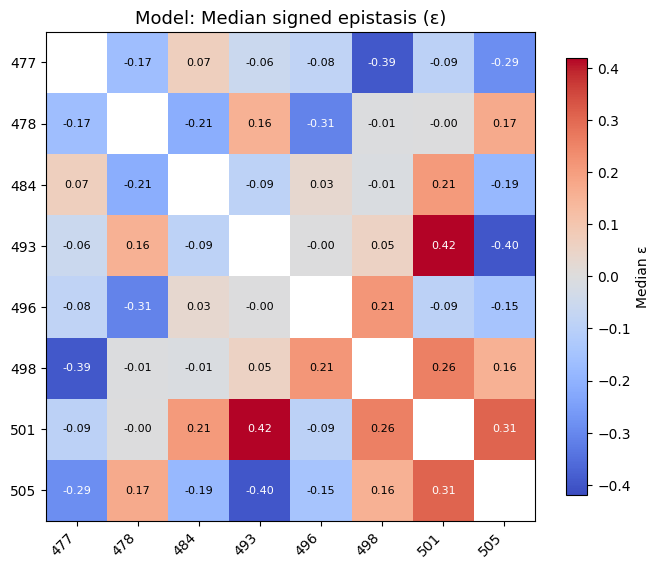

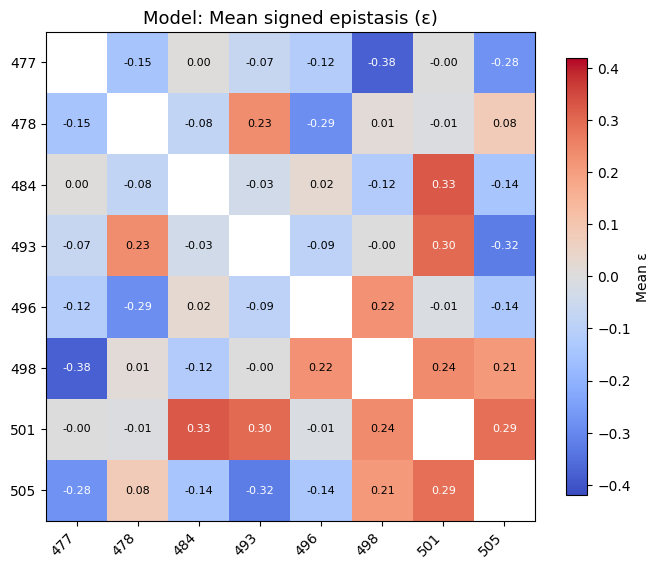

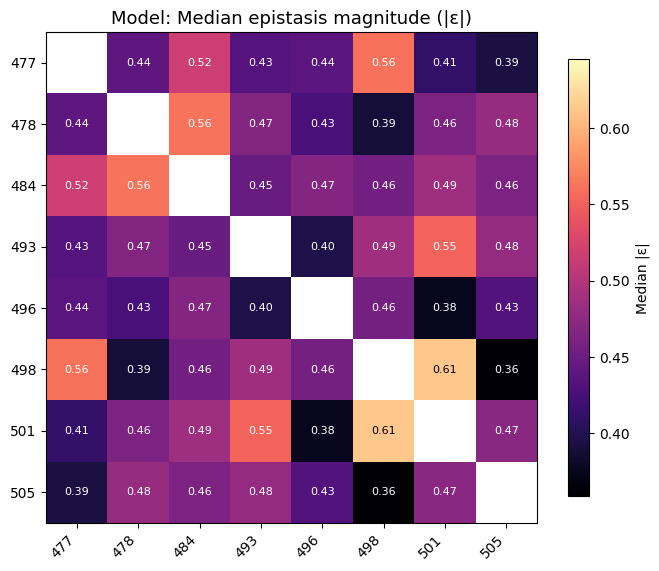

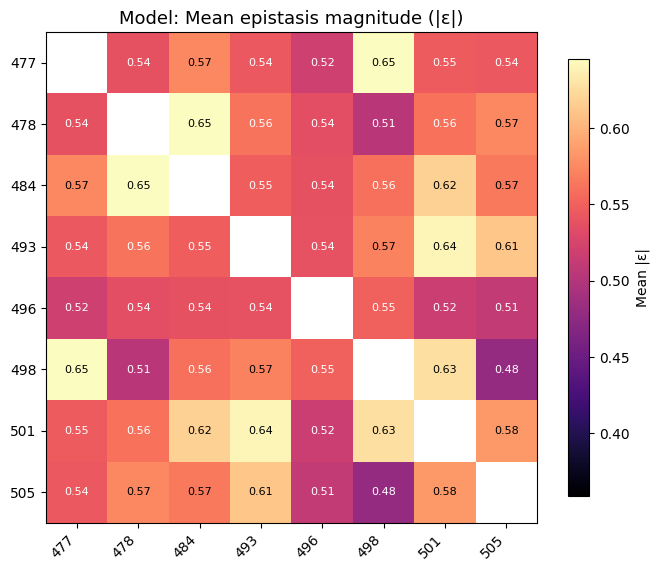

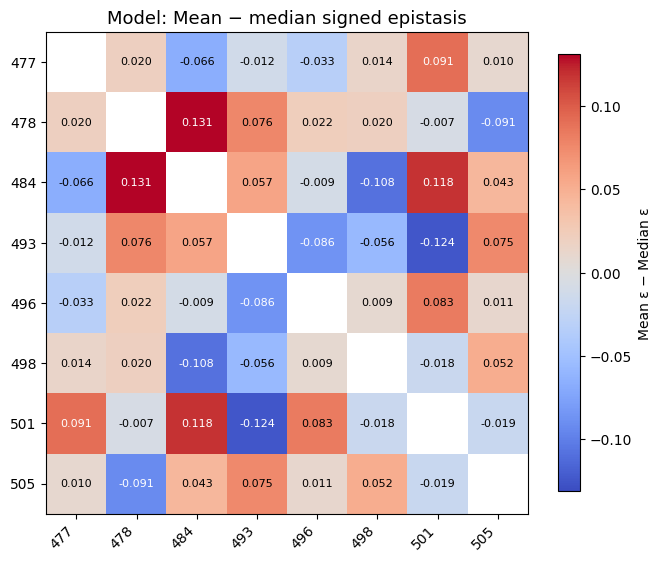

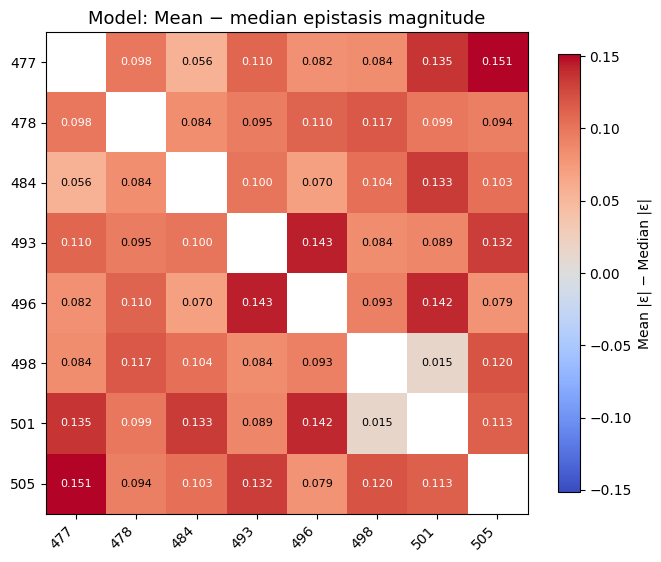

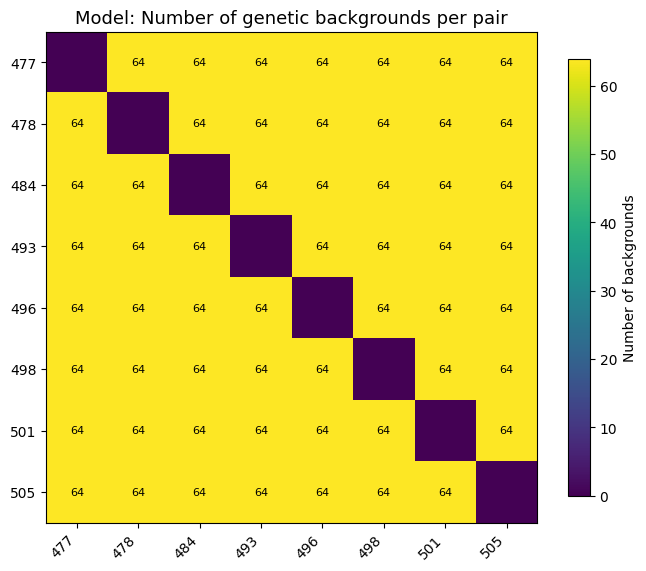

In [503]:
# calculating Chris's Model's Heatmaps

import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ----------------------------
# 0) Input dataframe
# ----------------------------
df = model_df.copy()

# ----------------------------
# 1) Identify mutation indicator columns and map them to residue labels
# ----------------------------
pos_cols = [c for c in df.columns if c.startswith("mut_pos_")]
if len(pos_cols) != 8:
    raise ValueError(f"Expected 8 mut_pos_* columns, found {len(pos_cols)}: {pos_cols}")

pos_cols = sorted(pos_cols, key=lambda x: int(x.split("_")[-1]))
site_labels = [477, 478, 484, 493, 496, 498, 501, 505]
label_map = {pos_cols[i]: site_labels[i] for i in range(8)}

# Force bits to int 0/1
for c in pos_cols:
    df[c] = df[c].astype(int)

# genotype tuple key: (b1,b2,...,b8)
df["geno_key"] = list(map(tuple, df[pos_cols].values))
WT = tuple([0] * 8)

# ----------------------------
# 2) Build model fitness column
#    Lower ΔΔG_pred = stronger binding
#    Flip sign so higher = stronger binding to match experimental convention
# ----------------------------
if "ΔΔG_pred" not in df.columns:
    raise KeyError("Could not find column 'ΔΔG_pred' in model_df")

df["F_model"] = -df["ΔΔG_pred"].astype(float)

# ----------------------------
# 3) Helper: compute pairwise epsilons across all backgrounds
#     and summarize with BOTH median and mean
# ----------------------------
def compute_pairwise_eps_stats(df, fitness_col, sites):
    """
    Returns:
      pair_table: per-pair stats including mean/median for signed and abs eps
      mats: dict of 8x8 matrices:
        - eps_median, eps_mean
        - abs_median, abs_mean
        - n_bg
        - frac_pos
    """
    f_map = dict(zip(df["geno_key"], df[fitness_col].astype(float)))

    mats = {
        "eps_median": pd.DataFrame(np.nan, index=sites, columns=sites),
        "eps_mean":   pd.DataFrame(np.nan, index=sites, columns=sites),
        "abs_median": pd.DataFrame(np.nan, index=sites, columns=sites),
        "abs_mean":   pd.DataFrame(np.nan, index=sites, columns=sites),
        "n_bg":       pd.DataFrame(0, index=sites, columns=sites, dtype=int),
        "frac_pos":   pd.DataFrame(np.nan, index=sites, columns=sites),
    }

    rows = []
    idxs = list(range(8))

    for i, j in itertools.combinations(idxs, 2):
        bg_idxs = [k for k in idxs if k not in (i, j)]
        eps_vals = []

        # Iterate all 2^6 backgrounds
        for bg_bits in itertools.product([0, 1], repeat=len(bg_idxs)):
            base = [0] * 8
            for k, bit in zip(bg_idxs, bg_bits):
                base[k] = bit

            g00 = tuple(base)
            g10 = list(base); g10[i] = 1; g10[j] = 0; g10 = tuple(g10)
            g01 = list(base); g01[i] = 0; g01[j] = 1; g01 = tuple(g01)
            g11 = list(base); g11[i] = 1; g11[j] = 1; g11 = tuple(g11)

            F00 = f_map.get(g00, np.nan)
            F10 = f_map.get(g10, np.nan)
            F01 = f_map.get(g01, np.nan)
            F11 = f_map.get(g11, np.nan)

            vals = np.array([F00, F10, F01, F11], dtype=float)
            if not np.all(np.isfinite(vals)):
                continue

            eps = F11 - F10 - F01 + F00
            eps_vals.append(eps)

        eps_vals = np.asarray(eps_vals, dtype=float)
        if eps_vals.size == 0:
            continue

        si = sites[i]
        sj = sites[j]

        med_eps  = float(np.median(eps_vals))
        mean_eps = float(np.mean(eps_vals))
        med_abs  = float(np.median(np.abs(eps_vals)))
        mean_abs = float(np.mean(np.abs(eps_vals)))
        frac_pos = float(np.mean(eps_vals > 0))
        n        = int(eps_vals.size)

        for key, val in [
            ("eps_median", med_eps),
            ("eps_mean", mean_eps),
            ("abs_median", med_abs),
            ("abs_mean", mean_abs),
            ("frac_pos", frac_pos),
        ]:
            mats[key].loc[si, sj] = val
            mats[key].loc[sj, si] = val

        mats["n_bg"].loc[si, sj] = n
        mats["n_bg"].loc[sj, si] = n

        rows.append({
            "pair": f"{si}-{sj}",
            "n_backgrounds": n,
            "median_epsilon": med_eps,
            "mean_epsilon": mean_eps,
            "median_abs_epsilon": med_abs,
            "mean_abs_epsilon": mean_abs,
            "fraction_positive": frac_pos
        })

    pair_table = pd.DataFrame(rows).sort_values("median_abs_epsilon", ascending=False)
    return pair_table, mats

# ----------------------------
# 4) Plot helpers
# ----------------------------
def symmetric_bounds(mat):
    vals = mat.values[np.isfinite(mat.values)]
    if vals.size == 0:
        return None, None
    m = float(np.max(np.abs(vals)))
    return -m, m

def shared_symmetric_bounds(*mats):
    vals = []
    for mat in mats:
        arr = mat.values.astype(float)
        vals.extend(arr[np.isfinite(arr)].ravel())
    if len(vals) == 0:
        return None, None
    m = float(np.max(np.abs(vals)))
    return -m, m

def shared_positive_bounds(*mats):
    vals = []
    for mat in mats:
        arr = mat.values.astype(float)
        vals.extend(arr[np.isfinite(arr)].ravel())
    if len(vals) == 0:
        return None, None
    return float(np.min(vals)), float(np.max(vals))

def plot_heatmap_annot(
    mat,
    title,
    cmap="coolwarm",
    vmin=None,
    vmax=None,
    cbar_label=None,
    fmt="{:.2f}",
    diag_blank=True,
    figsize=(6.8, 5.8)
):
    fig, ax = plt.subplots(figsize=figsize)
    data = mat.values.astype(float)

    # Draw heatmap
    im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)

    # Axis labels
    ax.set_title(title, fontsize=13)
    ax.set_xticks(range(len(mat.columns)))
    ax.set_yticks(range(len(mat.index)))
    ax.set_xticklabels(mat.columns, rotation=45, ha="right")
    ax.set_yticklabels(mat.index)

    # Determine normalization for adaptive text color
    if vmin is None:
        vmin = np.nanmin(data)
    if vmax is None:
        vmax = np.nanmax(data)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    # Annotate cells
    for r in range(data.shape[0]):
        for c in range(data.shape[1]):
            val = data[r, c]
            if not np.isfinite(val):
                continue
            if diag_blank and r == c:
                continue

            rgba = im.cmap(norm(val))
            r_col, g_col, b_col, _ = rgba
            luminance = 0.299 * r_col + 0.587 * g_col + 0.114 * b_col
            text_color = "black" if luminance > 0.6 else "white"

            ax.text(
                c, r,
                fmt.format(val),
                ha="center",
                va="center",
                fontsize=8,
                color=text_color
            )

    # Colorbar
    cbar = fig.colorbar(im, ax=ax, shrink=0.85)
    if cbar_label:
        cbar.set_label(cbar_label)

    plt.tight_layout()
    plt.show()

# ----------------------------
# 5) Run model epistasis summary
# ----------------------------
sites = site_labels
pair_model, mats_model = compute_pairwise_eps_stats(df, "F_model", sites)

print("Model pairwise epistasis summary:")
display(pair_model)

# ----------------------------
# 6) Precompute difference matrices
# ----------------------------
diff_eps_model = mats_model["eps_mean"] - mats_model["eps_median"]
diff_abs_model = mats_model["abs_mean"] - mats_model["abs_median"]

# ----------------------------
# 7) Shared normalization for model-only figure set
# ----------------------------
signed_vmin, signed_vmax = shared_symmetric_bounds(
    mats_model["eps_median"], mats_model["eps_mean"]
)

mag_vmin, mag_vmax = shared_positive_bounds(
    mats_model["abs_median"], mats_model["abs_mean"]
)

diff_signed_vmin, diff_signed_vmax = shared_symmetric_bounds(diff_eps_model)
diff_mag_vmin, diff_mag_vmax = shared_symmetric_bounds(diff_abs_model)

# ----------------------------
# 8) Plot: Model
# ----------------------------
plot_heatmap_annot(
    mats_model["eps_median"],
    "Model: Median signed epistasis (ε)",
    cmap="coolwarm",
    vmin=signed_vmin, vmax=signed_vmax,
    cbar_label="Median ε",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    mats_model["eps_mean"],
    "Model: Mean signed epistasis (ε)",
    cmap="coolwarm",
    vmin=signed_vmin, vmax=signed_vmax,
    cbar_label="Mean ε",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    mats_model["abs_median"],
    "Model: Median epistasis magnitude (|ε|)",
    cmap="magma",
    vmin=mag_vmin, vmax=mag_vmax,
    cbar_label="Median |ε|",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    mats_model["abs_mean"],
    "Model: Mean epistasis magnitude (|ε|)",
    cmap="magma",
    vmin=mag_vmin, vmax=mag_vmax,
    cbar_label="Mean |ε|",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    diff_eps_model,
    "Model: Mean − median signed epistasis",
    cmap="coolwarm",
    vmin=diff_signed_vmin, vmax=diff_signed_vmax,
    cbar_label="Mean ε − Median ε",
    fmt="{:.3f}"
)

plot_heatmap_annot(
    diff_abs_model,
    "Model: Mean − median epistasis magnitude",
    cmap="coolwarm",
    vmin=diff_mag_vmin, vmax=diff_mag_vmax,
    cbar_label="Mean |ε| − Median |ε|",
    fmt="{:.3f}"
)

plot_heatmap_annot(
    mats_model["n_bg"].astype(float),
    "Model: Number of genetic backgrounds per pair",
    cmap="viridis",
    vmin=0,
    vmax=64,
    cbar_label="Number of backgrounds",
    fmt="{:.0f}"
)

In [504]:
print(pair_name, "n rows:", len(d), "unique eps:", eps_vals.nunique())


501-505 n rows: 5 unique eps: 1


Library 1 pairwise epistasis summary:


,pair,n_backgrounds,median_epsilon,mean_epsilon,median_abs_epsilon,mean_abs_epsilon,fraction_positive
23,496-501,64,1.141585,1.181702,1.749877,2.104788,0.656250
26,498-505,64,1.511955,1.521319,1.747468,1.955484,0.781250
27,501-505,64,0.442812,0.148516,1.621686,1.745404,0.578125
1,477-484,64,-0.816608,-0.537754,1.600681,1.799958,0.375000
20,493-501,64,0.660671,1.088364,1.577600,1.861245,0.625000
5,477-501,64,-0.521578,-0.711128,1.514277,1.855114,0.406250
16,484-501,64,-0.183985,0.030775,1.501352,1.560959,0.468750
22,496-498,64,0.659510,0.604502,1.488006,1.665350,0.625000
3,477-496,64,0.349610,0.299587,1.486637,1.772158,0.531250
13,484-493,64,1.011203,0.822422,1.476596,1.708599,0.656250


Library 2 pairwise epistasis summary:


,pair,n_backgrounds,median_epsilon,mean_epsilon,median_abs_epsilon,mean_abs_epsilon,fraction_positive
23,496-501,64,1.718910,1.538156,1.736052,1.905030,0.828125
26,498-505,64,1.575175,1.853388,1.592348,2.185386,0.812500
25,498-501,64,0.407158,0.141240,1.545216,1.775332,0.609375
5,477-501,64,-0.992196,-0.890646,1.304973,1.471840,0.281250
22,496-498,64,0.859369,0.824575,1.253690,1.549227,0.609375
20,493-501,64,1.129008,1.114327,1.220724,1.468825,0.843750
11,478-501,64,-0.394387,-0.285874,1.194445,1.342808,0.406250
27,501-505,64,0.612344,0.795885,1.155767,1.653775,0.625000
17,484-505,64,0.180492,0.082083,1.063169,1.240632,0.546875
9,478-496,64,-0.218834,-0.008885,1.046263,1.222512,0.421875


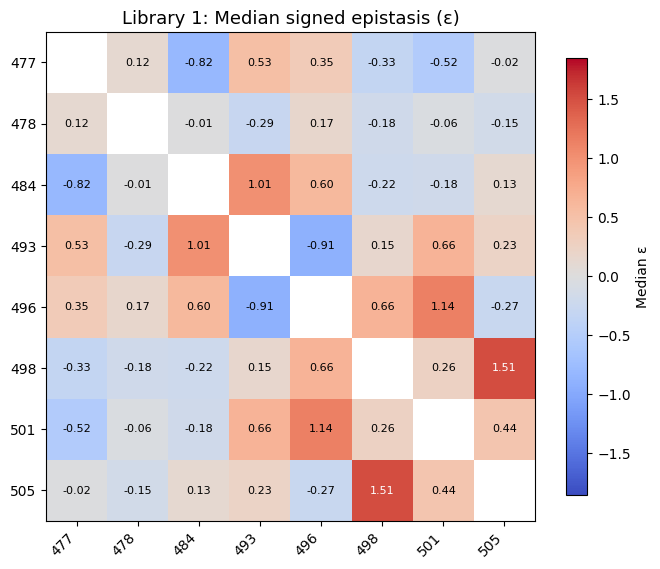

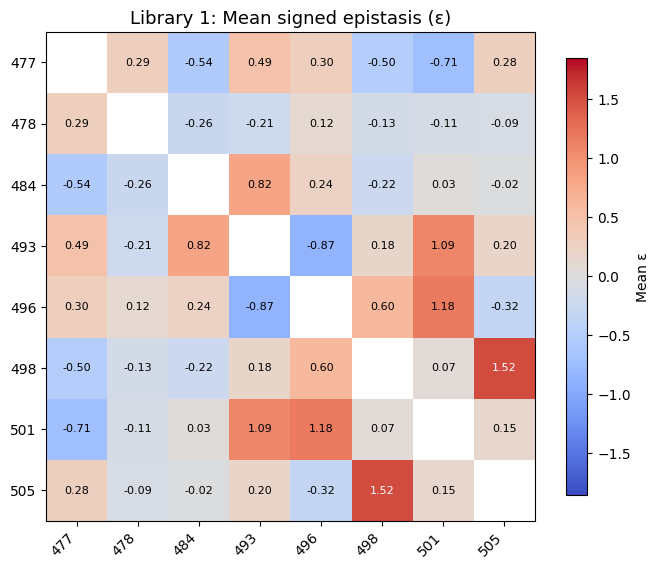

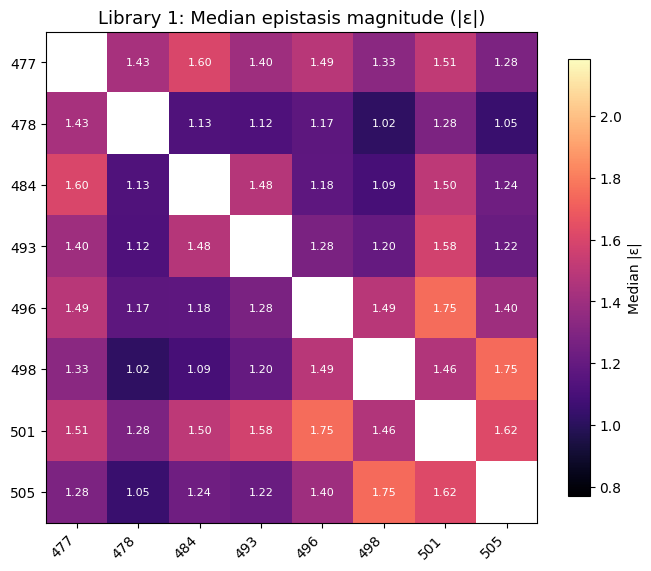

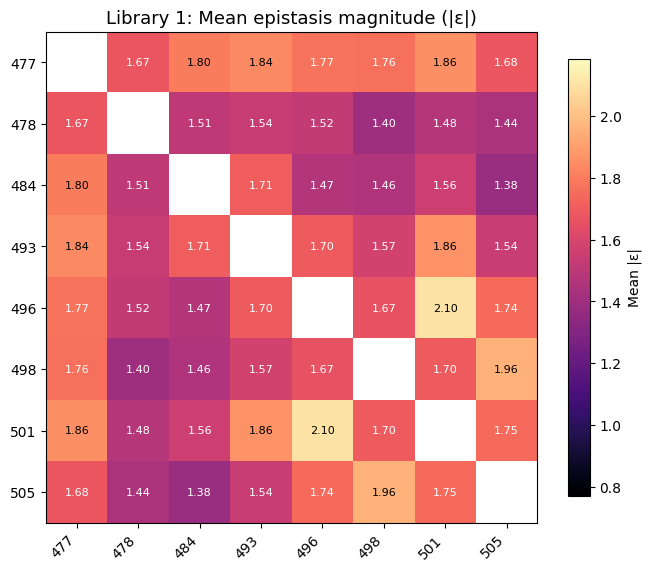

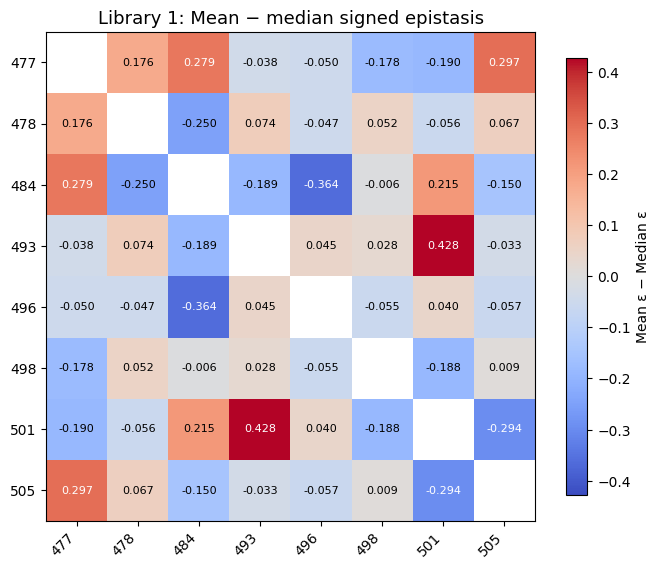

...

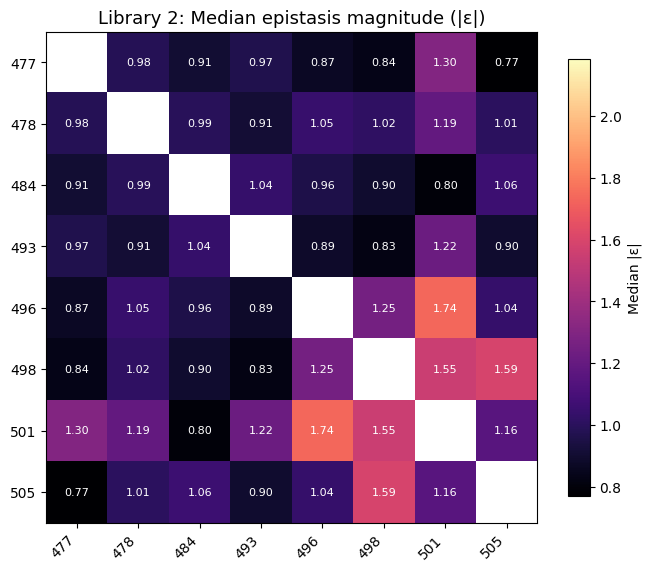

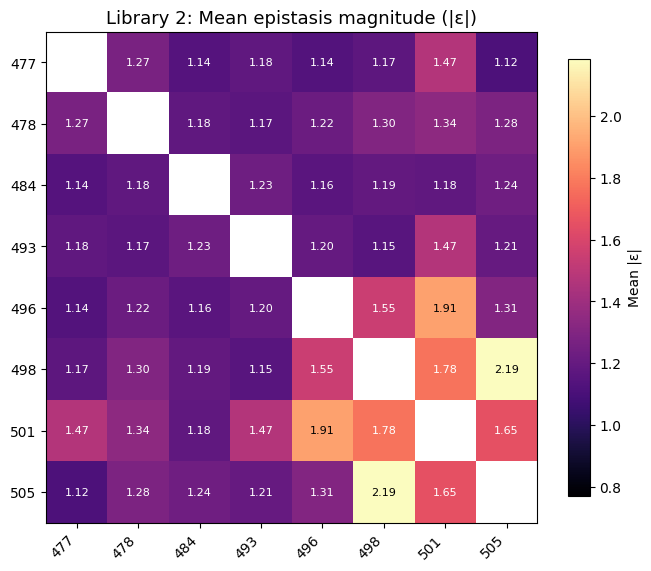

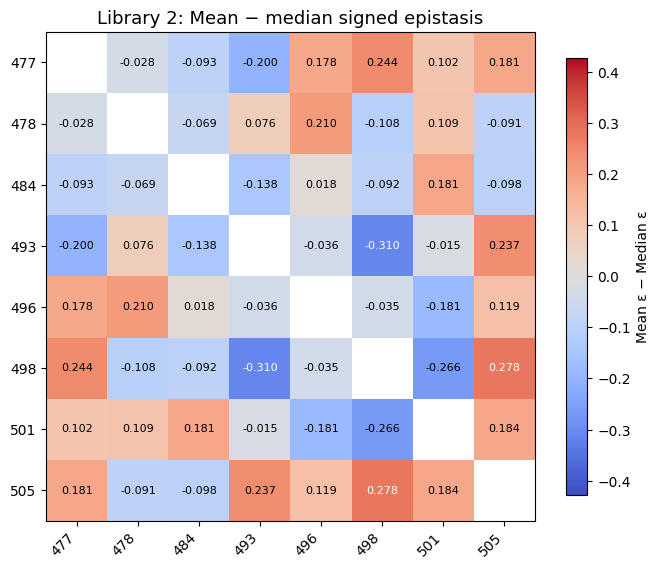

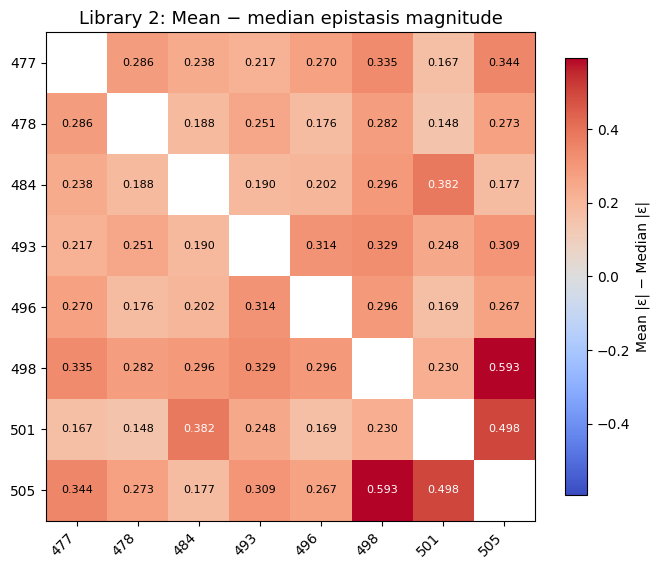

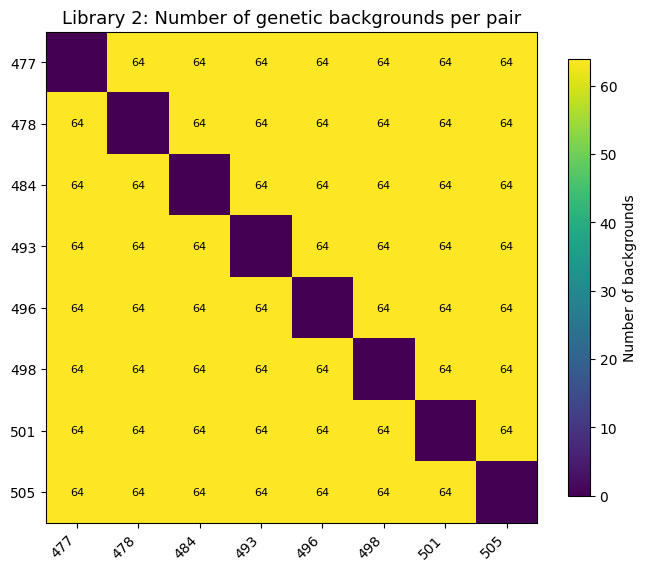

Merged Library 1 vs Library 2 pairwise epistasis summary:


,pair,n_backgrounds_lib1,median_epsilon_lib1,mean_epsilon_lib1,median_abs_epsilon_lib1,mean_abs_epsilon_lib1,fraction_positive_lib1,n_backgrounds_lib2,median_epsilon_lib2,mean_epsilon_lib2,median_abs_epsilon_lib2,mean_abs_epsilon_lib2,fraction_positive_lib2,abs_eps_diff_median
6,484-501,64,-0.183985,0.030775,1.501352,1.560959,0.468750,64,-0.382100,-0.201219,0.798250,1.180374,0.421875,0.703102
3,477-484,64,-0.816608,-0.537754,1.600681,1.799958,0.375000,64,0.121832,0.028475,0.905521,1.143079,0.515625,0.695160
8,477-496,64,0.349610,0.299587,1.486637,1.772158,0.531250,64,0.051967,0.229807,0.870290,1.140338,0.546875,0.616347
16,477-505,64,-0.017415,0.279549,1.282193,1.678265,0.500000,64,-0.246407,-0.065236,0.771565,1.115459,0.453125,0.510628
14,477-498,64,-0.325924,-0.504122,1.333022,1.760879,0.421875,64,-0.177762,0.065801,0.836302,1.171558,0.421875,0.496721
2,501-505,64,0.442812,0.148516,1.621686,1.745404,0.578125,64,0.612344,0.795885,1.155767,1.653775,0.625000,0.465919
11,477-478,64,0.116780,0.292380,1.432260,1.673945,0.562500,64,0.258686,0.231051,0.983046,1.268655,0.593750,0.449214
9,484-493,64,1.011203,0.822422,1.476596,1.708599,0.656250,64,0.867534,0.729439,1.040940,1.231176,0.734375,0.435656
13,477-493,64,0.525392,0.487628,1.399003,1.838291,0.546875,64,0.477161,0.276932,0.965752,1.182736,0.609375,0.433251
17,493-496,64,-0.911966,-0.866785,1.278616,1.698326,0.296875,64,-0.645916,-0.681673,0.885547,1.199562,0.328125,0.393069


In [58]:
import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ----------------------------
# 0) Input dataframe
# ----------------------------
df = exp_df.copy()

# ----------------------------
# 1) Identify mutation indicator columns and map them to residue labels
# ----------------------------
pos_cols = [c for c in df.columns if c.startswith("mut_pos_")]
if len(pos_cols) != 8:
    raise ValueError(f"Expected 8 mut_pos_* columns, found {len(pos_cols)}: {pos_cols}")

pos_cols = sorted(pos_cols, key=lambda x: int(x.split("_")[-1]))
site_labels = [477, 478, 484, 493, 496, 498, 501, 505]
label_map = {pos_cols[i]: site_labels[i] for i in range(8)}

# Force bits to int 0/1
for c in pos_cols:
    df[c] = df[c].astype(int)

# genotype tuple key: (b1,b2,...,b8)
df["geno_key"] = list(map(tuple, df[pos_cols].values))
WT = tuple([0] * 8)

# ----------------------------
# 2) Build per-genotype fitness columns per library
#    Fitness that matches your landscape: F_spec = log2FC(pos/pre) - log2FC(neg/pre)
# ----------------------------
required_cols = [
    "log2fc_pos_pre_lib1", "log2fc_neg_pre_lib1",
    "log2fc_pos_pre_lib2", "log2fc_neg_pre_lib2",
]
missing = [c for c in required_cols if c not in df.columns]
if missing:
    raise KeyError(f"Missing required columns: {missing}")

for lib in [1, 2]:
    df[f"F_spec_lib{lib}"] = (
        df[f"log2fc_pos_pre_lib{lib}"].astype(float)
        - df[f"log2fc_neg_pre_lib{lib}"].astype(float)
    )

# ----------------------------
# 3) Helper: compute pairwise epsilons across all backgrounds
#     and summarize with BOTH median and mean
# ----------------------------
def compute_pairwise_eps_stats(df, fitness_col, sites):
    """
    Returns:
      pair_table: per-pair stats including mean/median for signed and abs eps
      mats: dict of 8x8 matrices:
        - eps_median, eps_mean
        - abs_median, abs_mean
        - n_bg
        - frac_pos
    """
    f_map = dict(zip(df["geno_key"], df[fitness_col].astype(float)))

    mats = {
        "eps_median": pd.DataFrame(np.nan, index=sites, columns=sites),
        "eps_mean":   pd.DataFrame(np.nan, index=sites, columns=sites),
        "abs_median": pd.DataFrame(np.nan, index=sites, columns=sites),
        "abs_mean":   pd.DataFrame(np.nan, index=sites, columns=sites),
        "n_bg":       pd.DataFrame(0, index=sites, columns=sites, dtype=int),
        "frac_pos":   pd.DataFrame(np.nan, index=sites, columns=sites),
    }

    rows = []
    idxs = list(range(8))

    for i, j in itertools.combinations(idxs, 2):
        bg_idxs = [k for k in idxs if k not in (i, j)]
        eps_vals = []

        # Iterate all 2^6 backgrounds
        for bg_bits in itertools.product([0, 1], repeat=len(bg_idxs)):
            base = [0] * 8
            for k, bit in zip(bg_idxs, bg_bits):
                base[k] = bit

            g00 = tuple(base)
            g10 = list(base); g10[i] = 1; g10[j] = 0; g10 = tuple(g10)
            g01 = list(base); g01[i] = 0; g01[j] = 1; g01 = tuple(g01)
            g11 = list(base); g11[i] = 1; g11[j] = 1; g11 = tuple(g11)

            F00 = f_map.get(g00, np.nan)
            F10 = f_map.get(g10, np.nan)
            F01 = f_map.get(g01, np.nan)
            F11 = f_map.get(g11, np.nan)

            vals = np.array([F00, F10, F01, F11], dtype=float)
            if not np.all(np.isfinite(vals)):
                continue

            eps = F11 - F10 - F01 + F00
            eps_vals.append(eps)

        eps_vals = np.asarray(eps_vals, dtype=float)
        if eps_vals.size == 0:
            continue

        si = sites[i]
        sj = sites[j]

        med_eps  = float(np.median(eps_vals))
        mean_eps = float(np.mean(eps_vals))
        med_abs  = float(np.median(np.abs(eps_vals)))
        mean_abs = float(np.mean(np.abs(eps_vals)))
        frac_pos = float(np.mean(eps_vals > 0))
        n        = int(eps_vals.size)

        for key, val in [
            ("eps_median", med_eps),
            ("eps_mean", mean_eps),
            ("abs_median", med_abs),
            ("abs_mean", mean_abs),
            ("frac_pos", frac_pos),
        ]:
            mats[key].loc[si, sj] = val
            mats[key].loc[sj, si] = val

        mats["n_bg"].loc[si, sj] = n
        mats["n_bg"].loc[sj, si] = n

        rows.append({
            "pair": f"{si}-{sj}",
            "n_backgrounds": n,
            "median_epsilon": med_eps,
            "mean_epsilon": mean_eps,
            "median_abs_epsilon": med_abs,
            "mean_abs_epsilon": mean_abs,
            "fraction_positive": frac_pos
        })

    pair_table = pd.DataFrame(rows).sort_values("median_abs_epsilon", ascending=False)
    return pair_table, mats

# ----------------------------
# 4) Plot helpers
# ----------------------------
def symmetric_bounds(mat):
    vals = mat.values[np.isfinite(mat.values)]
    if vals.size == 0:
        return None, None
    m = float(np.max(np.abs(vals)))
    return -m, m

def shared_symmetric_bounds(*mats):
    vals = []
    for mat in mats:
        arr = mat.values.astype(float)
        vals.extend(arr[np.isfinite(arr)].ravel())
    if len(vals) == 0:
        return None, None
    m = float(np.max(np.abs(vals)))
    return -m, m

def shared_positive_bounds(*mats):
    vals = []
    for mat in mats:
        arr = mat.values.astype(float)
        vals.extend(arr[np.isfinite(arr)].ravel())
    if len(vals) == 0:
        return None, None
    return float(np.min(vals)), float(np.max(vals))

def plot_heatmap_annot(
    mat,
    title,
    cmap="coolwarm",
    vmin=None,
    vmax=None,
    cbar_label=None,
    fmt="{:.2f}",
    diag_blank=True,
    figsize=(6.8, 5.8)
):
    fig, ax = plt.subplots(figsize=figsize)
    data = mat.values.astype(float)

    # Draw heatmap
    im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)

    # Axis labels
    ax.set_title(title, fontsize=13)
    ax.set_xticks(range(len(mat.columns)))
    ax.set_yticks(range(len(mat.index)))
    ax.set_xticklabels(mat.columns, rotation=45, ha="right")
    ax.set_yticklabels(mat.index)

    # Determine normalization for automatic text color
    if vmin is None:
        vmin = np.nanmin(data)
    if vmax is None:
        vmax = np.nanmax(data)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    # Annotate cells with adaptive text color
    for r in range(data.shape[0]):
        for c in range(data.shape[1]):
            val = data[r, c]
            if not np.isfinite(val):
                continue
            if diag_blank and r == c:
                continue

            rgba = im.cmap(norm(val))
            r_col, g_col, b_col, _ = rgba
            luminance = 0.299 * r_col + 0.587 * g_col + 0.114 * b_col
            text_color = "black" if luminance > 0.6 else "white"

            ax.text(
                c, r,
                fmt.format(val),
                ha="center",
                va="center",
                fontsize=8,
                color=text_color
            )

    # Colorbar
    cbar = fig.colorbar(im, ax=ax, shrink=0.85)
    if cbar_label:
        cbar.set_label(cbar_label)

    plt.tight_layout()
    plt.show()

# ----------------------------
# 5) Run for each library
# ----------------------------
sites = site_labels

pair_lib1, mats1 = compute_pairwise_eps_stats(df, "F_spec_lib1", sites)
pair_lib2, mats2 = compute_pairwise_eps_stats(df, "F_spec_lib2", sites)

print("Library 1 pairwise epistasis summary:")
display(pair_lib1)

print("Library 2 pairwise epistasis summary:")
display(pair_lib2)

# ----------------------------
# 6) Precompute difference matrices
# ----------------------------
diff_eps1 = mats1["eps_mean"] - mats1["eps_median"]
diff_abs1 = mats1["abs_mean"] - mats1["abs_median"]

diff_eps2 = mats2["eps_mean"] - mats2["eps_median"]
diff_abs2 = mats2["abs_mean"] - mats2["abs_median"]

# ----------------------------
# 7) Shared normalization across like heatmaps
# ----------------------------

# Signed epistasis: all 4 share the same symmetric range
signed_vmin, signed_vmax = shared_symmetric_bounds(
    mats1["eps_median"], mats1["eps_mean"],
    mats2["eps_median"], mats2["eps_mean"]
)

# Magnitude epistasis: all 4 share the same positive range
mag_vmin, mag_vmax = shared_positive_bounds(
    mats1["abs_median"], mats1["abs_mean"],
    mats2["abs_median"], mats2["abs_mean"]
)

# Signed difference maps: shared symmetric range
diff_signed_vmin, diff_signed_vmax = shared_symmetric_bounds(diff_eps1, diff_eps2)

# Magnitude difference maps: shared symmetric range
diff_mag_vmin, diff_mag_vmax = shared_symmetric_bounds(diff_abs1, diff_abs2)

# ----------------------------
# 8) Plot: Library 1
# ----------------------------
plot_heatmap_annot(
    mats1["eps_median"],
    "Library 1: Median signed epistasis (ε)",
    cmap="coolwarm",
    vmin=signed_vmin, vmax=signed_vmax,
    cbar_label="Median ε",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    mats1["eps_mean"],
    "Library 1: Mean signed epistasis (ε)",
    cmap="coolwarm",
    vmin=signed_vmin, vmax=signed_vmax,
    cbar_label="Mean ε",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    mats1["abs_median"],
    "Library 1: Median epistasis magnitude (|ε|)",
    cmap="magma",
    vmin=mag_vmin, vmax=mag_vmax,
    cbar_label="Median |ε|",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    mats1["abs_mean"],
    "Library 1: Mean epistasis magnitude (|ε|)",
    cmap="magma",
    vmin=mag_vmin, vmax=mag_vmax,
    cbar_label="Mean |ε|",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    diff_eps1,
    "Library 1: Mean − median signed epistasis",
    cmap="coolwarm",
    vmin=diff_signed_vmin, vmax=diff_signed_vmax,
    cbar_label="Mean ε − Median ε",
    fmt="{:.3f}"
)

plot_heatmap_annot(
    diff_abs1,
    "Library 1: Mean − median epistasis magnitude",
    cmap="coolwarm",
    vmin=diff_mag_vmin, vmax=diff_mag_vmax,
    cbar_label="Mean |ε| − Median |ε|",
    fmt="{:.3f}"
)

plot_heatmap_annot(
    mats1["n_bg"].astype(float),
    "Library 1: Number of genetic backgrounds per pair",
    cmap="viridis",
    vmin=0,
    vmax=64,
    cbar_label="Number of backgrounds",
    fmt="{:.0f}"
)

# ----------------------------
# 9) Plot: Library 2
# ----------------------------
plot_heatmap_annot(
    mats2["eps_median"],
    "Library 2: Median signed epistasis (ε)",
    cmap="coolwarm",
    vmin=signed_vmin, vmax=signed_vmax,
    cbar_label="Median ε",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    mats2["eps_mean"],
    "Library 2: Mean signed epistasis (ε)",
    cmap="coolwarm",
    vmin=signed_vmin, vmax=signed_vmax,
    cbar_label="Mean ε",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    mats2["abs_median"],
    "Library 2: Median epistasis magnitude (|ε|)",
    cmap="magma",
    vmin=mag_vmin, vmax=mag_vmax,
    cbar_label="Median |ε|",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    mats2["abs_mean"],
    "Library 2: Mean epistasis magnitude (|ε|)",
    cmap="magma",
    vmin=mag_vmin, vmax=mag_vmax,
    cbar_label="Mean |ε|",
    fmt="{:.2f}"
)

plot_heatmap_annot(
    diff_eps2,
    "Library 2: Mean − median signed epistasis",
    cmap="coolwarm",
    vmin=diff_signed_vmin, vmax=diff_signed_vmax,
    cbar_label="Mean ε − Median ε",
    fmt="{:.3f}"
)

plot_heatmap_annot(
    diff_abs2,
    "Library 2: Mean − median epistasis magnitude",
    cmap="coolwarm",
    vmin=diff_mag_vmin, vmax=diff_mag_vmax,
    cbar_label="Mean |ε| − Median |ε|",
    fmt="{:.3f}"
)

plot_heatmap_annot(
    mats2["n_bg"].astype(float),
    "Library 2: Number of genetic backgrounds per pair",
    cmap="viridis",
    vmin=0,
    vmax=64,
    cbar_label="Number of backgrounds",
    fmt="{:.0f}"
)

# ----------------------------
# 10) Library-vs-library merged pair table
# ----------------------------
merged_pairs = pair_lib1.merge(pair_lib2, on="pair", suffixes=("_lib1", "_lib2"))
merged_pairs["abs_eps_diff_median"] = np.abs(
    merged_pairs["median_abs_epsilon_lib1"] - merged_pairs["median_abs_epsilon_lib2"]
)

print("Merged Library 1 vs Library 2 pairwise epistasis summary:")
display(merged_pairs.sort_values("abs_eps_diff_median", ascending=False))

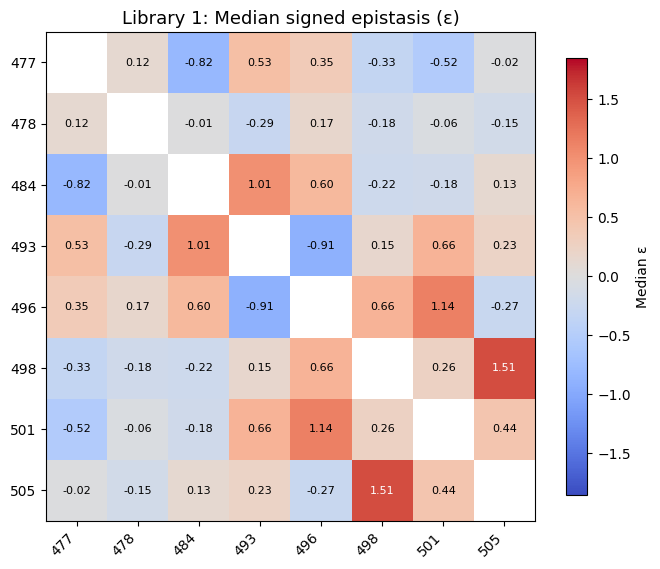

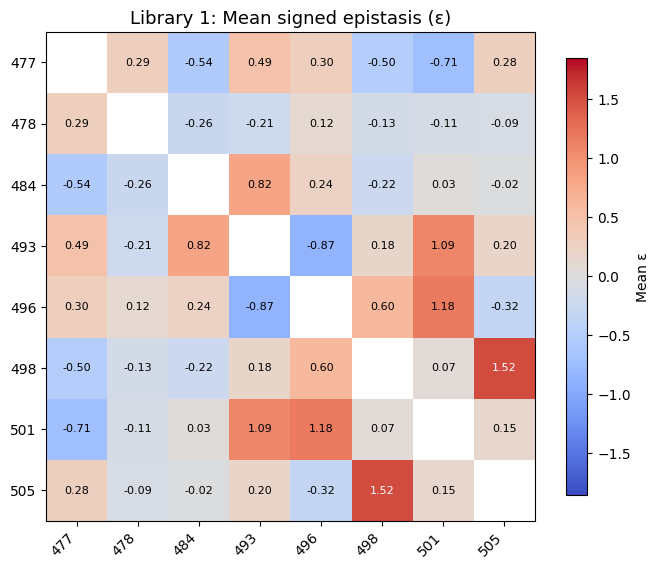

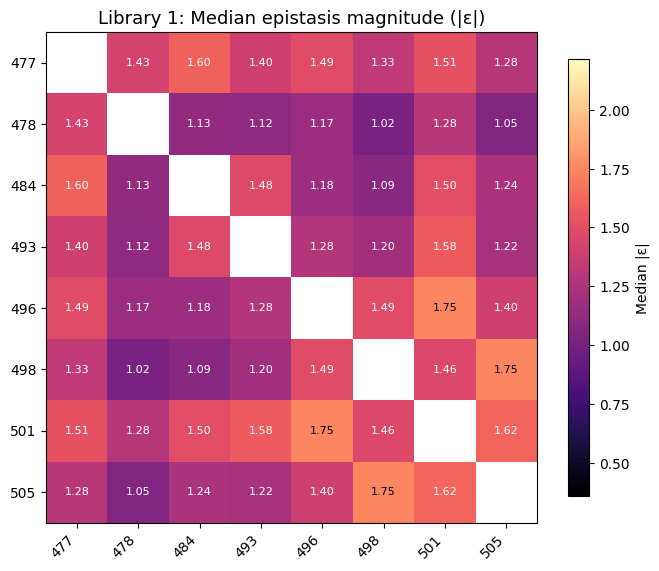

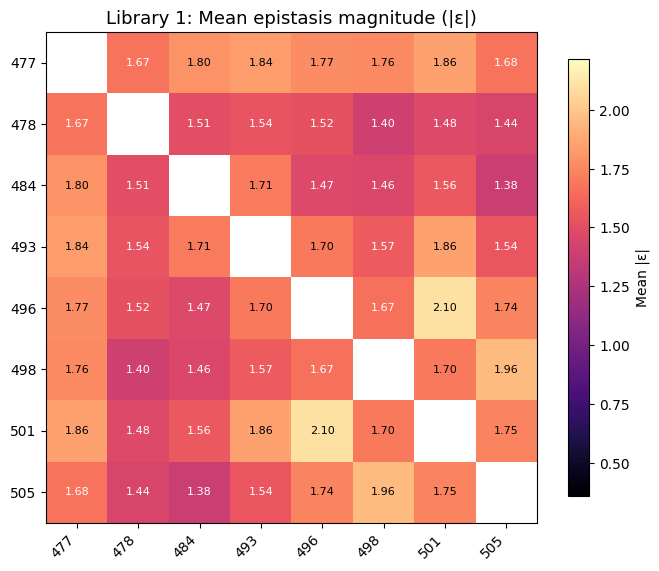

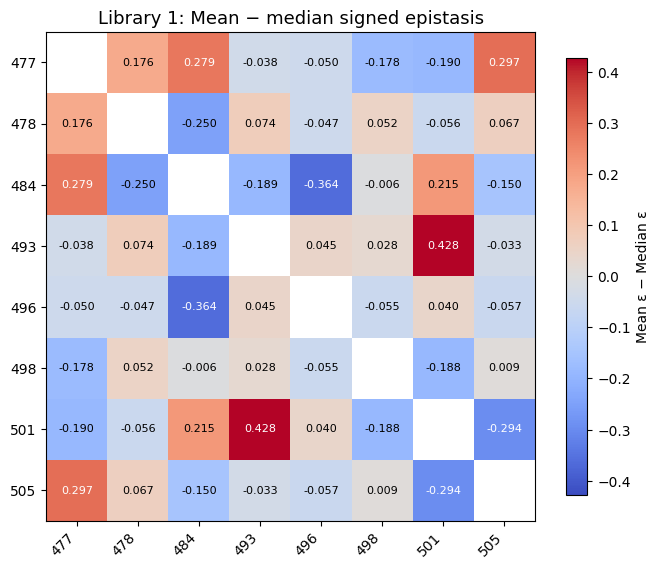

...

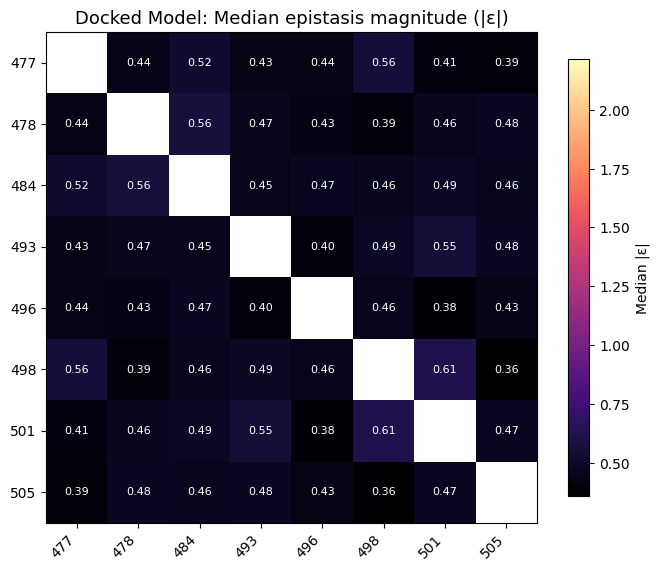

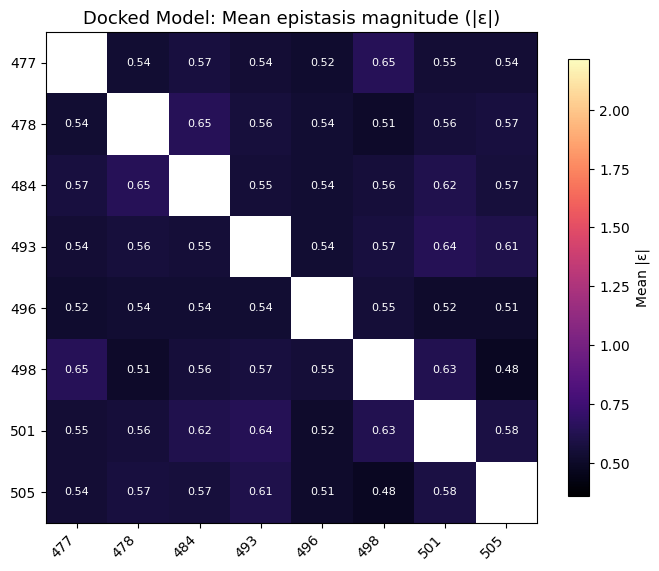

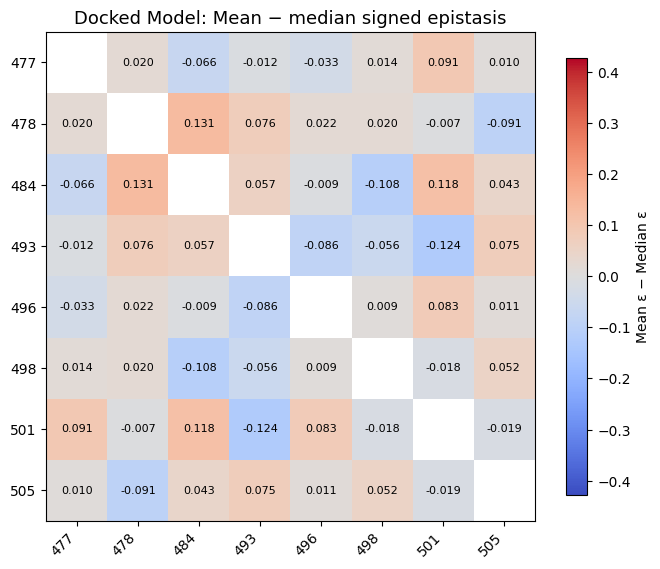

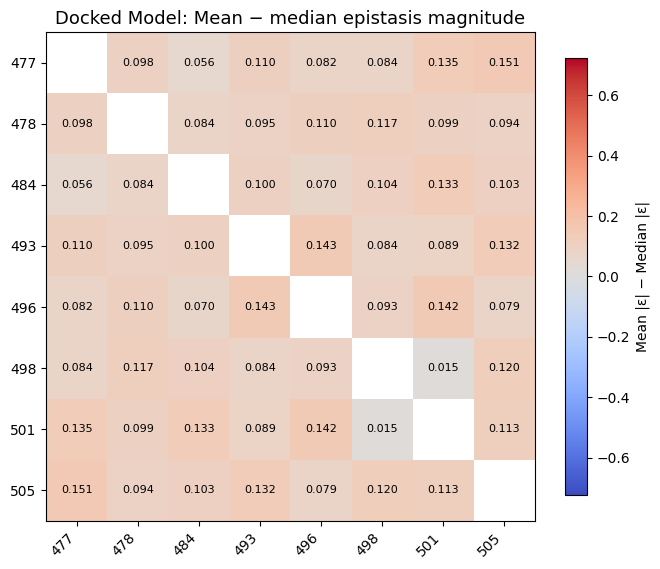

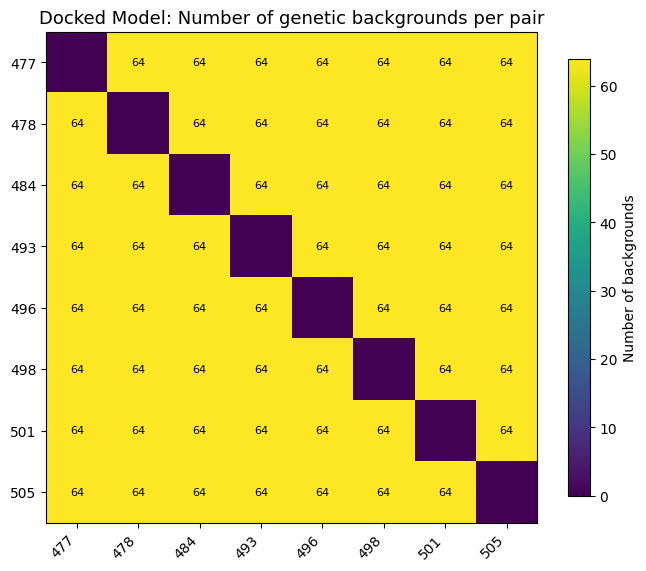

Merged pairwise epistasis summary across libraries:


,pair,n_backgrounds_lib1,median_epsilon_lib1,mean_epsilon_lib1,median_abs_epsilon_lib1,mean_abs_epsilon_lib1,fraction_positive_lib1,n_backgrounds_lib2,median_epsilon_lib2,mean_epsilon_lib2,...,fraction_positive_lib2,n_backgrounds_lib3,median_epsilon_lib3,mean_epsilon_lib3,median_abs_epsilon_lib3,mean_abs_epsilon_lib3,fraction_positive_lib3,abs_eps_diff_median_lib1_vs_lib2,abs_eps_diff_median_lib1_vs_lib3,abs_eps_diff_median_lib2_vs_lib3
0,477-478,64,0.116780,0.292380,1.432260,1.673945,0.562500,64,0.258686,0.231051,...,0.593750,64,-0.185693,-0.260946,1.195721,1.597669,0.468750,0.449214,0.236539,0.212675
1,477-484,64,-0.816608,-0.537754,1.600681,1.799958,0.375000,64,0.121832,0.028475,...,0.515625,64,0.305185,0.347297,1.602112,1.827113,0.578125,0.695160,0.001431,0.696591
2,477-493,64,0.525392,0.487628,1.399003,1.838291,0.546875,64,0.477161,0.276932,...,0.609375,64,-0.149652,0.030715,1.812255,1.912695,0.500000,0.433251,0.413253,0.846503
3,477-496,64,0.349610,0.299587,1.486637,1.772158,0.531250,64,0.051967,0.229807,...,0.546875,64,-0.474436,-0.085328,1.575263,1.759816,0.406250,0.616347,0.088626,0.704973
4,477-498,64,-0.325924,-0.504122,1.333022,1.760879,0.421875,64,-0.177762,0.065801,...,0.421875,64,-0.187678,-0.314574,1.672845,1.776900,0.484375,0.496721,0.339823,0.836543
5,477-501,64,-0.521578,-0.711128,1.514277,1.855114,0.406250,64,-0.992196,-0.890646,...,0.281250,64,-0.372626,-0.269067,1.201431,1.752809,0.359375,0.209304,0.312846,0.103542
6,477-505,64,-0.017415,0.279549,1.282193,1.678265,0.500000,64,-0.246407,-0.065236,...,0.453125,64,-0.019442,-0.014489,1.319351,1.828734,0.484375,0.510628,0.037157,0.547785
7,478-484,64,-0.006187,-0.256298,1.129766,1.506558,0.484375,64,-0.420494,-0.489366,...,0.390625,64,-0.195331,0.144731,1.415132,1.916313,0.484375,0.136355,0.285366,0.421722
8,478-493,64,-0.286059,-0.211704,1.121093,1.536390,0.421875,64,-0.349123,-0.273035,...,0.359375,64,-0.318159,-0.310130,1.343778,1.856495,0.453125,0.206703,0.222685,0.429389
9,478-496,64,0.170176,0.123036,1.170306,1.524508,0.531250,64,-0.218834,-0.008885,...,0.421875,64,0.369621,0.241821,1.631606,1.970784,0.562500,0.124043,0.461300,0.585343


Merged pairwise epistasis summary across libraries + docked model:


,pair,n_backgrounds_lib1,median_epsilon_lib1,mean_epsilon_lib1,median_abs_epsilon_lib1,mean_abs_epsilon_lib1,fraction_positive_lib1,n_backgrounds_lib2,median_epsilon_lib2,mean_epsilon_lib2,...,abs_eps_diff_median_lib2_vs_lib3,n_backgrounds_model,median_epsilon_model,mean_epsilon_model,median_abs_epsilon_model,mean_abs_epsilon_model,fraction_positive_model,abs_eps_diff_median_lib1_vs_model,abs_eps_diff_median_lib2_vs_model,abs_eps_diff_median_lib3_vs_model
0,477-478,64,0.116780,0.292380,1.432260,1.673945,0.562500,64,0.258686,0.231051,...,0.212675,64,-0.165772,-0.145312,0.439701,0.538163,0.421875,0.992559,0.543344,0.756019
1,477-484,64,-0.816608,-0.537754,1.600681,1.799958,0.375000,64,0.121832,0.028475,...,0.696591,64,0.067342,0.001562,0.518570,0.574594,0.562500,1.082110,0.386951,1.083542
2,477-493,64,0.525392,0.487628,1.399003,1.838291,0.546875,64,0.477161,0.276932,...,0.846503,64,-0.055318,-0.067188,0.434941,0.544579,0.468750,0.964061,0.530811,1.377314
3,477-496,64,0.349610,0.299587,1.486637,1.772158,0.531250,64,0.051967,0.229807,...,0.704973,64,-0.084450,-0.117187,0.437396,0.519060,0.421875,1.049241,0.432894,1.137867
4,477-498,64,-0.325924,-0.504122,1.333022,1.760879,0.421875,64,-0.177762,0.065801,...,0.836543,64,-0.393525,-0.379687,0.561066,0.645097,0.265625,0.771957,0.275236,1.111779
5,477-501,64,-0.521578,-0.711128,1.514277,1.855114,0.406250,64,-0.992196,-0.890646,...,0.103542,64,-0.092184,-0.001563,0.411430,0.546893,0.484375,1.102847,0.893543,0.790001
6,477-505,64,-0.017415,0.279549,1.282193,1.678265,0.500000,64,-0.246407,-0.065236,...,0.547785,64,-0.286213,-0.276562,0.393156,0.544300,0.296875,0.889037,0.378409,0.926195
7,478-484,64,-0.006187,-0.256298,1.129766,1.506558,0.484375,64,-0.420494,-0.489366,...,0.421722,64,-0.210780,-0.079687,0.562075,0.645604,0.437500,0.567690,0.431335,0.853057
8,478-493,64,-0.286059,-0.211704,1.121093,1.536390,0.421875,64,-0.349123,-0.273035,...,0.429389,64,0.156676,0.232813,0.466746,0.562185,0.593750,0.654347,0.447644,0.877032
9,478-496,64,0.170176,0.123036,1.170306,1.524508,0.531250,64,-0.218834,-0.008885,...,0.585343,64,-0.307980,-0.285937,0.426167,0.536560,0.296875,0.744139,0.620095,1.205439


In [506]:
# ----------------------------
# 7) Shared normalization across all libraries + docked model
# ----------------------------

# assume these already exist:
# mats_model
# diff_eps_model
# diff_abs_model
# pair_model

all_keys = list(libs) + ["model"]

all_mats = {**mats_by_lib, "model": mats_model}
all_diff_eps = {**diff_eps_by_lib, "model": diff_eps_model}
all_diff_abs = {**diff_abs_by_lib, "model": diff_abs_model}
all_pair_tables = {**pair_tables, "model": pair_model}

signed_vmin, signed_vmax = shared_symmetric_bounds(
    *[all_mats[k]["eps_median"] for k in all_keys],
    *[all_mats[k]["eps_mean"] for k in all_keys]
)

mag_vmin, mag_vmax = shared_positive_bounds(
    *[all_mats[k]["abs_median"] for k in all_keys],
    *[all_mats[k]["abs_mean"] for k in all_keys]
)

diff_signed_vmin, diff_signed_vmax = shared_symmetric_bounds(
    *[all_diff_eps[k] for k in all_keys]
)

diff_mag_vmin, diff_mag_vmax = shared_symmetric_bounds(
    *[all_diff_abs[k] for k in all_keys]
)

# ----------------------------
# 8) Plot all heatmaps for each library + docked model
# ----------------------------
for key in all_keys:
    mats = all_mats[key]
    diff_eps = all_diff_eps[key]
    diff_abs = all_diff_abs[key]

    if key == "model":
        prefix = "Docked Model"
    else:
        prefix = f"Library {key}"

    plot_heatmap_annot(
        mats["eps_median"],
        f"{prefix}: Median signed epistasis (ε)",
        cmap="coolwarm",
        vmin=signed_vmin, vmax=signed_vmax,
        cbar_label="Median ε",
        fmt="{:.2f}"
    )

    plot_heatmap_annot(
        mats["eps_mean"],
        f"{prefix}: Mean signed epistasis (ε)",
        cmap="coolwarm",
        vmin=signed_vmin, vmax=signed_vmax,
        cbar_label="Mean ε",
        fmt="{:.2f}"
    )

    plot_heatmap_annot(
        mats["abs_median"],
        f"{prefix}: Median epistasis magnitude (|ε|)",
        cmap="magma",
        vmin=mag_vmin, vmax=mag_vmax,
        cbar_label="Median |ε|",
        fmt="{:.2f}"
    )

    plot_heatmap_annot(
        mats["abs_mean"],
        f"{prefix}: Mean epistasis magnitude (|ε|)",
        cmap="magma",
        vmin=mag_vmin, vmax=mag_vmax,
        cbar_label="Mean |ε|",
        fmt="{:.2f}"
    )

    plot_heatmap_annot(
        diff_eps,
        f"{prefix}: Mean − median signed epistasis",
        cmap="coolwarm",
        vmin=diff_signed_vmin, vmax=diff_signed_vmax,
        cbar_label="Mean ε − Median ε",
        fmt="{:.3f}"
    )

    plot_heatmap_annot(
        diff_abs,
        f"{prefix}: Mean − median epistasis magnitude",
        cmap="coolwarm",
        vmin=diff_mag_vmin, vmax=diff_mag_vmax,
        cbar_label="Mean |ε| − Median |ε|",
        fmt="{:.3f}"
    )

    plot_heatmap_annot(
        mats["n_bg"].astype(float),
        f"{prefix}: Number of genetic backgrounds per pair",
        cmap="viridis",
        vmin=0,
        vmax=64,
        cbar_label="Number of backgrounds",
        fmt="{:.0f}"
    )

# ----------------------------
# 9) Build merged pairwise summary across libraries only
# ----------------------------
merged_pairs = None
for lib in libs:
    tbl = pair_tables[lib].copy().add_suffix(f"_lib{lib}")
    tbl = tbl.rename(columns={f"pair_lib{lib}": "pair"})
    if merged_pairs is None:
        merged_pairs = tbl
    else:
        merged_pairs = merged_pairs.merge(tbl, on="pair", how="outer")

# Add pairwise between-library differences for median_abs_epsilon
for i, lib_a in enumerate(libs):
    for lib_b in libs[i+1:]:
        col_a = f"median_abs_epsilon_lib{lib_a}"
        col_b = f"median_abs_epsilon_lib{lib_b}"
        if col_a in merged_pairs.columns and col_b in merged_pairs.columns:
            merged_pairs[f"abs_eps_diff_median_lib{lib_a}_vs_lib{lib_b}"] = np.abs(
                merged_pairs[col_a] - merged_pairs[col_b]
            )

print("Merged pairwise epistasis summary across libraries:")
display(merged_pairs)

# ----------------------------
# 10) Optional: merge model into the comparison table
# ----------------------------
pair_model_renamed = pair_model.copy().add_suffix("_model").rename(columns={"pair_model": "pair"})
merged_pairs_with_model = merged_pairs.merge(pair_model_renamed, on="pair", how="left")

for lib in libs:
    col_lib = f"median_abs_epsilon_lib{lib}"
    col_model = "median_abs_epsilon_model"
    if col_lib in merged_pairs_with_model.columns and col_model in merged_pairs_with_model.columns:
        merged_pairs_with_model[f"abs_eps_diff_median_lib{lib}_vs_model"] = np.abs(
            merged_pairs_with_model[col_lib] - merged_pairs_with_model[col_model]
        )

print("Merged pairwise epistasis summary across libraries + docked model:")
display(merged_pairs_with_model)

In [515]:
import numpy as np
import pandas as pd
from itertools import combinations
from scipy.stats import pearsonr, spearmanr, mannwhitneyu

df = merged_pairs_with_model.copy()

# ----------------------------
# Helper: correlation calc
# ----------------------------
def compute_corr(x, y):
    mask = np.isfinite(x) & np.isfinite(y)
    if mask.sum() < 3:
        return np.nan, np.nan, np.nan, np.nan
    
    r, p_r = pearsonr(x[mask], y[mask])
    rho, p_rho = spearmanr(x[mask], y[mask])
    return r, p_r, rho, p_rho

# ----------------------------
# 1) CORRELATIONS
# ----------------------------
libs = ["lib1", "lib2", "lib3"]

results_corr = []

# library vs library
for a, b in combinations(libs, 2):
    # signed ε
    r, p_r, rho, p_rho = compute_corr(
        df[f"median_epsilon_{a}"],
        df[f"median_epsilon_{b}"]
    )
    results_corr.append({
        "comparison": f"{a} vs {b}",
        "metric": "median ε",
        "pearson_r": r,
        "pearson_p": p_r,
        "spearman_rho": rho,
        "spearman_p": p_rho
    })

    # magnitude
    r, p_r, rho, p_rho = compute_corr(
        df[f"median_abs_epsilon_{a}"],
        df[f"median_abs_epsilon_{b}"]
    )
    results_corr.append({
        "comparison": f"{a} vs {b}",
        "metric": "median |ε|",
        "pearson_r": r,
        "pearson_p": p_r,
        "spearman_rho": rho,
        "spearman_p": p_rho
    })

# library vs model
for lib in libs:
    r, p_r, rho, p_rho = compute_corr(
        df[f"median_epsilon_{lib}"],
        df["median_epsilon_model"]
    )
    results_corr.append({
        "comparison": f"{lib} vs model",
        "metric": "median ε",
        "pearson_r": r,
        "pearson_p": p_r,
        "spearman_rho": rho,
        "spearman_p": p_rho
    })

    r, p_r, rho, p_rho = compute_corr(
        df[f"median_abs_epsilon_{lib}"],
        df["median_abs_epsilon_model"]
    )
    results_corr.append({
        "comparison": f"{lib} vs model",
        "metric": "median |ε|",
        "pearson_r": r,
        "pearson_p": p_r,
        "spearman_rho": rho,
        "spearman_p": p_rho
    })

corr_df = pd.DataFrame(results_corr)
print("\n=== CORRELATIONS ===")
display(corr_df)

# ----------------------------
# 2) DISTRIBUTION COMPARISON (|ε|)
# ----------------------------
results_dist = []

for lib in libs:
    x = df[f"median_abs_epsilon_{lib}"].values
    y = df["median_abs_epsilon_model"].values

    mask = np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]

    u, p = mannwhitneyu(x, y, alternative="two-sided")

    results_dist.append({
        "comparison": f"{lib} vs model",
        "median_|ε|_lib": np.median(x),
        "median_|ε|_model": np.median(y),
        "mean_|ε|_lib": np.mean(x),
        "mean_|ε|_model": np.mean(y),
        "U_stat": u,
        "p_value": p
    })

dist_df = pd.DataFrame(results_dist)
print("\n=== DISTRIBUTION COMPARISON (|ε|) ===")
display(dist_df)

# ----------------------------
# 3) EFFECT SIZE (absolute differences)
# ----------------------------
results_effect = []

for lib in libs:
    diff = np.abs(
        df[f"median_abs_epsilon_{lib}"] - df["median_abs_epsilon_model"]
    )

    results_effect.append({
        "comparison": f"{lib} vs model",
        "median_abs_difference": np.median(diff),
        "mean_abs_difference": np.mean(diff)
    })

effect_df = pd.DataFrame(results_effect)
print("\n=== EFFECT SIZE ===")
display(effect_df)


=== CORRELATIONS ===


,comparison,metric,pearson_r,pearson_p,spearman_rho,spearman_p
0,lib1 vs lib2,median ε,0.801408,2.982714e-07,0.740011,0.000007
1,lib1 vs lib2,median |ε|,0.576330,1.328046e-03,0.404488,0.032764
2,lib1 vs lib3,median ε,0.261588,1.787418e-01,0.244116,0.210609
3,lib1 vs lib3,median |ε|,0.163272,4.064507e-01,0.139026,0.480466
4,lib2 vs lib3,median ε,0.513312,5.212810e-03,0.482759,0.009268
5,lib2 vs lib3,median |ε|,0.189063,3.352759e-01,0.175698,0.371159
6,lib1 vs model,median ε,0.185675,3.441662e-01,0.163656,0.405331
7,lib1 vs model,median |ε|,-0.099882,6.130704e-01,-0.093596,0.635695
8,lib2 vs model,median ε,0.331131,8.520764e-02,0.297756,0.123832
9,lib2 vs model,median |ε|,-0.123014,5.328724e-01,-0.193213,0.324576



=== DISTRIBUTION COMPARISON (|ε|) ===


,comparison,median_|ε|_lib,median_|ε|_model,mean_|ε|_lib,mean_|ε|_model,U_stat,p_value
0,lib1 vs model,1.366013,0.459629,1.359033,0.46165,784.0,1.404101e-10
1,lib2 vs model,1.001081,0.459629,1.061588,0.46165,784.0,1.404101e-10
2,lib3 vs model,1.636147,0.459629,1.607784,0.46165,784.0,1.404101e-10



=== EFFECT SIZE ===


,comparison,median_abs_difference,mean_abs_difference
0,lib1 vs model,0.885468,0.897383
1,lib2 vs model,0.537078,0.599938
2,lib3 vs model,1.159627,1.146133


/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/335134596.py:87: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 1])


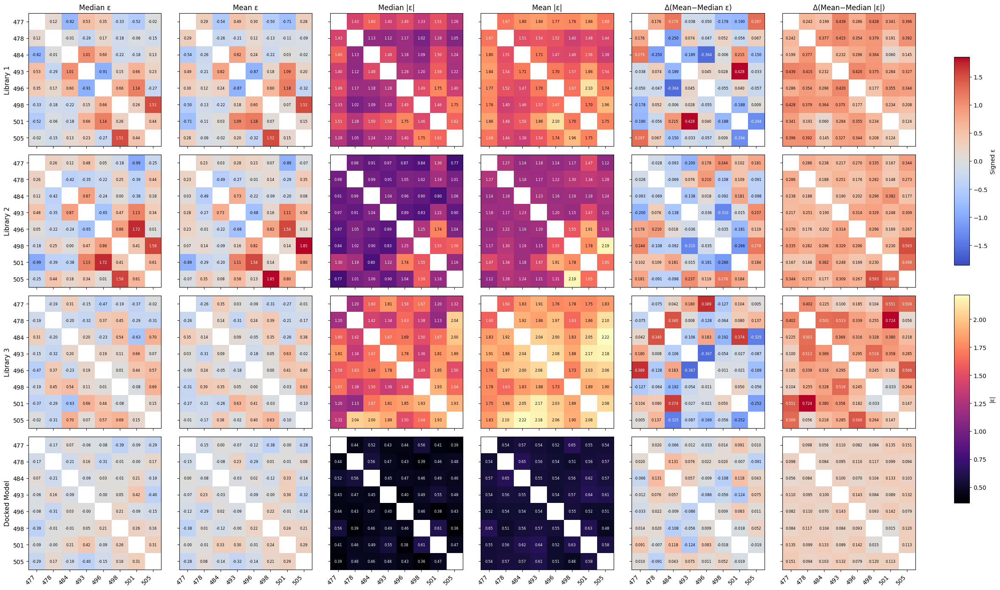

In [507]:
# ----------------------------
# 8) Grid plot: all libraries + model
# ----------------------------

plot_keys = list(libs) + ["model"]
n_rows = len(plot_keys)
n_cols = 6

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3.5*n_rows))

for r, key in enumerate(plot_keys):
    mats = all_mats[key]
    diff_eps = all_diff_eps[key]
    diff_abs = all_diff_abs[key]

    if key == "model":
        prefix = "Docked Model"
    else:
        prefix = f"Library {key}"

    row_data = [
        (mats["eps_median"], "Median ε", "coolwarm", signed_vmin, signed_vmax, "{:.2f}"),
        (mats["eps_mean"],   "Mean ε",   "coolwarm", signed_vmin, signed_vmax, "{:.2f}"),
        (mats["abs_median"], "Median |ε|", "magma",   mag_vmin,   mag_vmax,   "{:.2f}"),
        (mats["abs_mean"],   "Mean |ε|",   "magma",   mag_vmin,   mag_vmax,   "{:.2f}"),
        (diff_eps,           "Δ(Mean−Median ε)", "coolwarm", diff_signed_vmin, diff_signed_vmax, "{:.3f}"),
        (diff_abs,           "Δ(Mean−Median |ε|)", "coolwarm", diff_mag_vmin, diff_mag_vmax, "{:.3f}")
    ]

    for c, (mat, title, cmap, vmin, vmax, fmt) in enumerate(row_data):
        ax = axes[r, c] if n_rows > 1 else axes[c]

        data = mat.values.astype(float)
        im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)

        ax.set_xticks(range(len(mat.columns)))
        ax.set_yticks(range(len(mat.index)))

        if r == n_rows - 1:
            ax.set_xticklabels(mat.columns, rotation=45, ha="right")
        else:
            ax.set_xticklabels([])

        if c == 0:
            ax.set_yticklabels(mat.index)
            ax.set_ylabel(prefix, fontsize=11)
        else:
            ax.set_yticklabels([])

        # Titles only on top row
        if r == 0:
            ax.set_title(title, fontsize=12)

        # Annotate
        norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                val = data[i, j]
                if not np.isfinite(val) or i == j:
                    continue

                rgba = plt.get_cmap(cmap)(norm(val))
                lum = 0.299*rgba[0] + 0.587*rgba[1] + 0.114*rgba[2]
                color = "black" if lum > 0.6 else "white"

                ax.text(j, i, fmt.format(val), ha="center", va="center", fontsize=6, color=color)

# ----------------------------
# Colorbars (one per column group)
# ----------------------------
fig.subplots_adjust(right=0.92, wspace=0.25, hspace=0.3)

# Signed ε colorbar
cbar_ax1 = fig.add_axes([0.94, 0.55, 0.015, 0.35])
fig.colorbar(
    plt.cm.ScalarMappable(norm=mcolors.Normalize(vmin=signed_vmin, vmax=signed_vmax), cmap="coolwarm"),
    cax=cbar_ax1
).set_label("Signed ε")

# |ε| colorbar
cbar_ax2 = fig.add_axes([0.94, 0.15, 0.015, 0.35])
fig.colorbar(
    plt.cm.ScalarMappable(norm=mcolors.Normalize(vmin=mag_vmin, vmax=mag_vmax), cmap="magma"),
    cax=cbar_ax2
).set_label("|ε|")

plt.tight_layout(rect=[0, 0, 0.92, 1])
plt.show()

/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/3146890316.py:90: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 1])


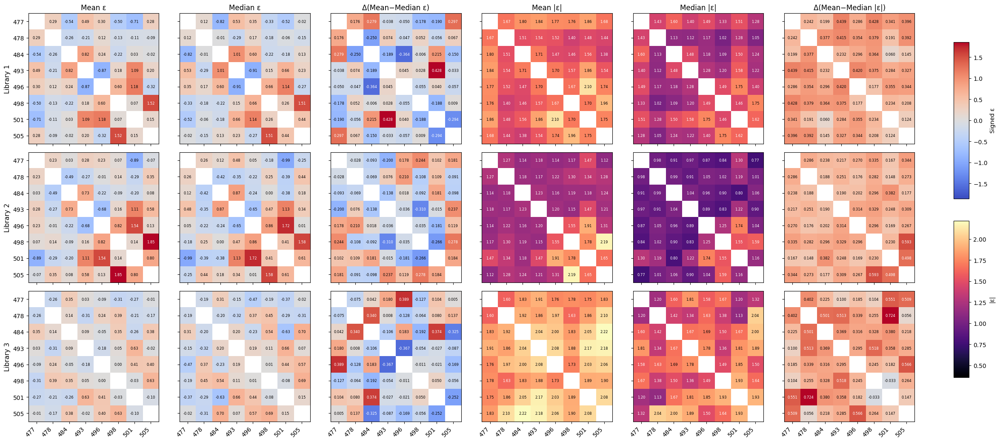

In [514]:
# ----------------------------
# 8) Grid plot: libraries only
# ----------------------------

plot_keys = list(libs)   # removes model
n_rows = len(plot_keys)
n_cols = 6

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3.5*n_rows))

for r, key in enumerate(plot_keys):
    mats = all_mats[key]
    diff_eps = all_diff_eps[key]
    diff_abs = all_diff_abs[key]

    prefix = f"Library {key}"

    row_data = [
        (mats["eps_mean"],   "Mean ε",                  "coolwarm", signed_vmin,       signed_vmax,       "{:.2f}"),
        (mats["eps_median"], "Median ε",                "coolwarm", signed_vmin,       signed_vmax,       "{:.2f}"),
        (diff_eps,           "Δ(Mean−Median ε)",        "coolwarm", diff_signed_vmin,  diff_signed_vmax,  "{:.3f}"),
        (mats["abs_mean"],   "Mean |ε|",                "magma",    mag_vmin,          mag_vmax,          "{:.2f}"),
        (mats["abs_median"], "Median |ε|",              "magma",    mag_vmin,          mag_vmax,          "{:.2f}"),
        (diff_abs,           "Δ(Mean−Median |ε|)",      "coolwarm", diff_mag_vmin,     diff_mag_vmax,     "{:.3f}")
    ]

    for c, (mat, title, cmap, vmin, vmax, fmt) in enumerate(row_data):
        ax = axes[r, c] if n_rows > 1 else axes[c]

        data = mat.values.astype(float)
        im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)

        ax.set_xticks(range(len(mat.columns)))
        ax.set_yticks(range(len(mat.index)))

        if r == n_rows - 1:
            ax.set_xticklabels(mat.columns, rotation=45, ha="right")
        else:
            ax.set_xticklabels([])

        if c == 0:
            ax.set_yticklabels(mat.index)
            ax.set_ylabel(prefix, fontsize=11)
        else:
            ax.set_yticklabels([])

        # Titles only on top row
        if r == 0:
            ax.set_title(title, fontsize=12)

        # Annotate
        norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                val = data[i, j]
                if not np.isfinite(val) or i == j:
                    continue

                rgba = plt.get_cmap(cmap)(norm(val))
                lum = 0.299 * rgba[0] + 0.587 * rgba[1] + 0.114 * rgba[2]
                color = "black" if lum > 0.6 else "white"

                ax.text(j, i, fmt.format(val), ha="center", va="center", fontsize=6, color=color)

# ----------------------------
# Colorbars
# ----------------------------
fig.subplots_adjust(right=0.92, wspace=0.25, hspace=0.3)

# Signed ε colorbar
cbar_ax1 = fig.add_axes([0.94, 0.55, 0.015, 0.35])
fig.colorbar(
    plt.cm.ScalarMappable(
        norm=mcolors.Normalize(vmin=signed_vmin, vmax=signed_vmax),
        cmap="coolwarm"
    ),
    cax=cbar_ax1
).set_label("Signed ε")

# |ε| colorbar
cbar_ax2 = fig.add_axes([0.94, 0.15, 0.015, 0.35])
fig.colorbar(
    plt.cm.ScalarMappable(
        norm=mcolors.Normalize(vmin=mag_vmin, vmax=mag_vmax),
        cmap="magma"
    ),
    cax=cbar_ax2
).set_label("|ε|")

plt.tight_layout(rect=[0, 0, 0.92, 1])
plt.show()

/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/3538930280.py:83: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.90, 0.96])


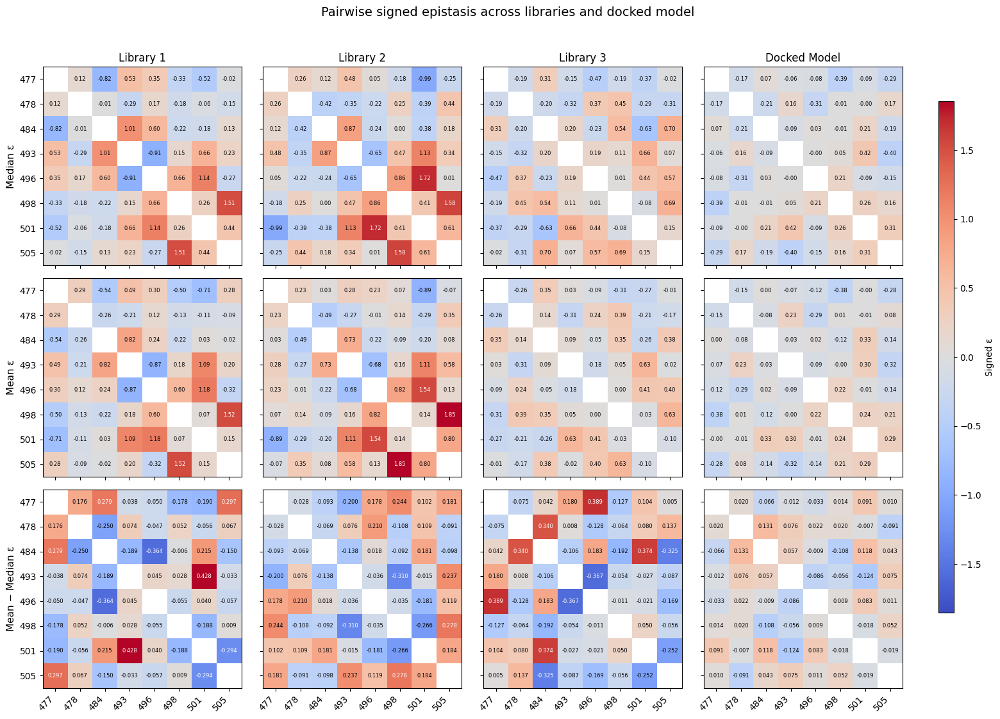

/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/3538930280.py:178: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.90, 0.96])


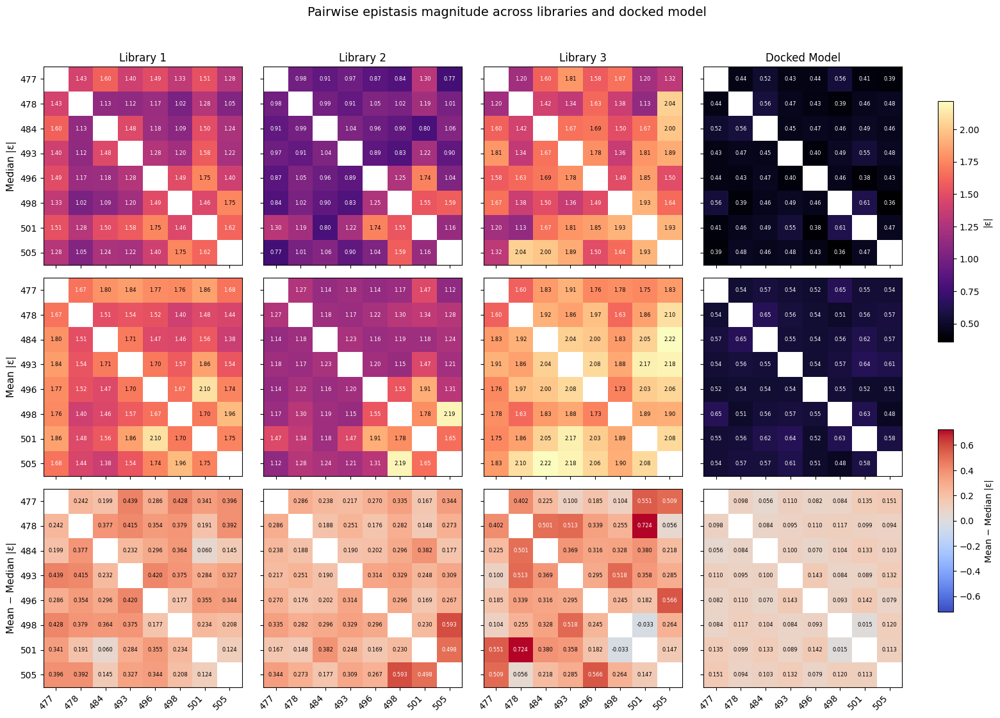

In [510]:
# ----------------------------
# 8A) Grid plot: signed epistasis
#     rows = Median / Mean / Mean−Median
#     cols = Library 1 / Library 2 / Library 3 / Docked Model
# ----------------------------

plot_keys = list(libs) + ["model"]
n_cols = len(plot_keys)
n_rows = 3  # median, mean, mean-median

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.0 * n_cols, 3.8 * n_rows))

row_specs_signed = [
    ("eps_median", "Median ε", signed_vmin, signed_vmax, "{:.2f}"),
    ("eps_mean", "Mean ε", signed_vmin, signed_vmax, "{:.2f}"),
    ("diff_eps", "Mean − Median ε", diff_signed_vmin, diff_signed_vmax, "{:.3f}")
]

for c, key in enumerate(plot_keys):
    mats = all_mats[key]
    diff_eps = all_diff_eps[key]

    if key == "model":
        col_label = "Docked Model"
    else:
        col_label = f"Library {key}"

    col_data = {
        "eps_median": mats["eps_median"],
        "eps_mean": mats["eps_mean"],
        "diff_eps": diff_eps
    }

    for r, (field, row_label, vmin, vmax, fmt) in enumerate(row_specs_signed):
        ax = axes[r, c]
        mat = col_data[field]
        data = mat.values.astype(float)

        im = ax.imshow(data, cmap="coolwarm", vmin=vmin, vmax=vmax)

        ax.set_xticks(range(len(mat.columns)))
        ax.set_yticks(range(len(mat.index)))

        if r == n_rows - 1:
            ax.set_xticklabels(mat.columns, rotation=45, ha="right")
        else:
            ax.set_xticklabels([])

        if c == 0:
            ax.set_yticklabels(mat.index)
            ax.set_ylabel(row_label, fontsize=11)
        else:
            ax.set_yticklabels([])

        if r == 0:
            ax.set_title(col_label, fontsize=12)

        norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                val = data[i, j]
                if not np.isfinite(val) or i == j:
                    continue

                rgba = plt.get_cmap("coolwarm")(norm(val))
                lum = 0.299 * rgba[0] + 0.587 * rgba[1] + 0.114 * rgba[2]
                color = "black" if lum > 0.6 else "white"

                ax.text(j, i, fmt.format(val), ha="center", va="center", fontsize=6, color=color)

# colorbar for signed ε
fig.subplots_adjust(right=0.90, wspace=0.20, hspace=0.20)
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.70])
fig.colorbar(
    plt.cm.ScalarMappable(
        norm=mcolors.Normalize(vmin=signed_vmin, vmax=signed_vmax),
        cmap="coolwarm"
    ),
    cax=cbar_ax
).set_label("Signed ε")

fig.suptitle("Pairwise signed epistasis across libraries and docked model", fontsize=14, y=0.98)
plt.tight_layout(rect=[0, 0, 0.90, 0.96])
plt.show()


# ----------------------------
# 8B) Grid plot: epistasis magnitude
#     rows = Median / Mean / Mean−Median
#     cols = Library 1 / Library 2 / Library 3 / Docked Model
# ----------------------------

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.0 * n_cols, 3.8 * n_rows))

row_specs_mag = [
    ("abs_median", "Median |ε|", mag_vmin, mag_vmax, "{:.2f}"),
    ("abs_mean", "Mean |ε|", mag_vmin, mag_vmax, "{:.2f}"),
    ("diff_abs", "Mean − Median |ε|", diff_mag_vmin, diff_mag_vmax, "{:.3f}")
]

for c, key in enumerate(plot_keys):
    mats = all_mats[key]
    diff_abs = all_diff_abs[key]

    if key == "model":
        col_label = "Docked Model"
    else:
        col_label = f"Library {key}"

    col_data = {
        "abs_median": mats["abs_median"],
        "abs_mean": mats["abs_mean"],
        "diff_abs": diff_abs
    }

    for r, (field, row_label, vmin, vmax, fmt) in enumerate(row_specs_mag):
        ax = axes[r, c]
        mat = col_data[field]
        data = mat.values.astype(float)

        cmap = "magma" if field != "diff_abs" else "coolwarm"
        im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)

        ax.set_xticks(range(len(mat.columns)))
        ax.set_yticks(range(len(mat.index)))

        if r == n_rows - 1:
            ax.set_xticklabels(mat.columns, rotation=45, ha="right")
        else:
            ax.set_xticklabels([])

        if c == 0:
            ax.set_yticklabels(mat.index)
            ax.set_ylabel(row_label, fontsize=11)
        else:
            ax.set_yticklabels([])

        if r == 0:
            ax.set_title(col_label, fontsize=12)

        norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                val = data[i, j]
                if not np.isfinite(val) or i == j:
                    continue

                rgba = plt.get_cmap(cmap)(norm(val))
                lum = 0.299 * rgba[0] + 0.587 * rgba[1] + 0.114 * rgba[2]
                color = "black" if lum > 0.6 else "white"

                ax.text(j, i, fmt.format(val), ha="center", va="center", fontsize=6, color=color)

# two colorbars for magnitude figure
fig.subplots_adjust(right=0.90, wspace=0.20, hspace=0.20)

# |ε| colorbar
cbar_ax1 = fig.add_axes([0.92, 0.52, 0.015, 0.33])
fig.colorbar(
    plt.cm.ScalarMappable(
        norm=mcolors.Normalize(vmin=mag_vmin, vmax=mag_vmax),
        cmap="magma"
    ),
    cax=cbar_ax1
).set_label("|ε|")

# mean-median |ε| colorbar
cbar_ax2 = fig.add_axes([0.92, 0.15, 0.015, 0.25])
fig.colorbar(
    plt.cm.ScalarMappable(
        norm=mcolors.Normalize(vmin=diff_mag_vmin, vmax=diff_mag_vmax),
        cmap="coolwarm"
    ),
    cax=cbar_ax2
).set_label("Mean − Median |ε|")

fig.suptitle("Pairwise epistasis magnitude across libraries and docked model", fontsize=14, y=0.98)
plt.tight_layout(rect=[0, 0, 0.90, 0.96])
plt.show()

/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/2752812526.py:83: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.90, 0.96])


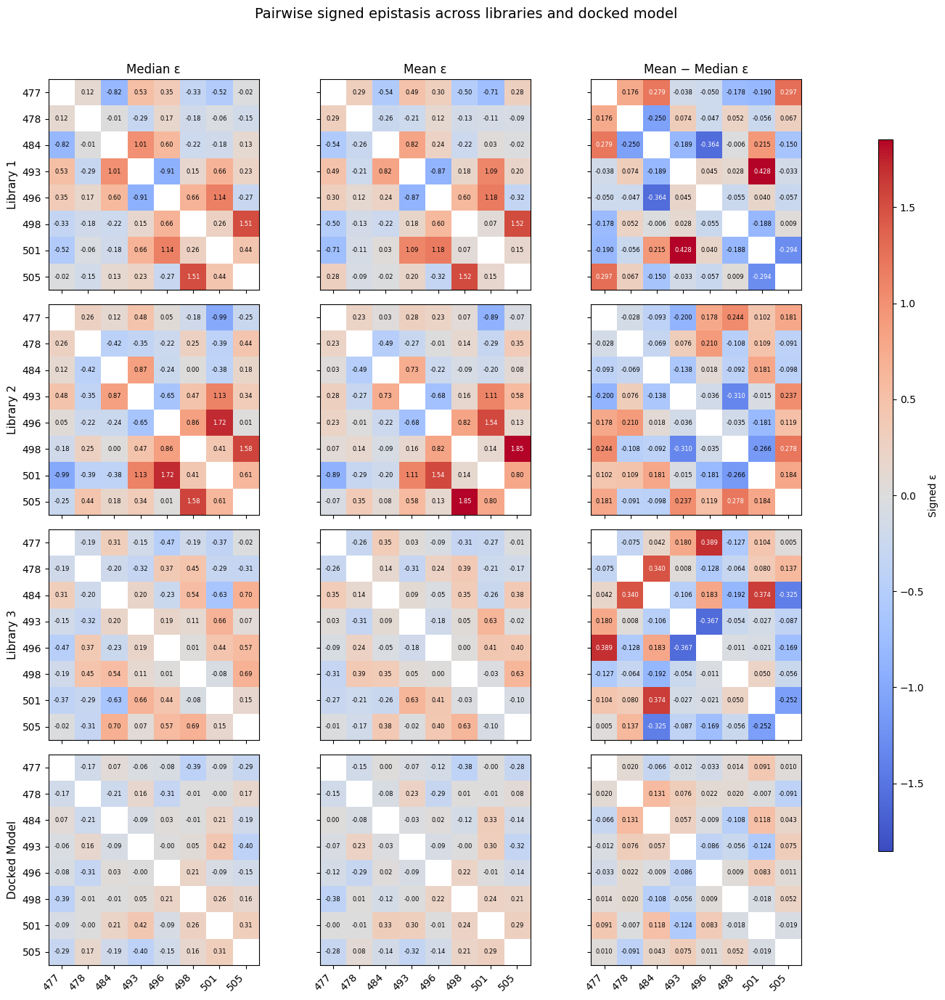

/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/2752812526.py:176: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.90, 0.96])


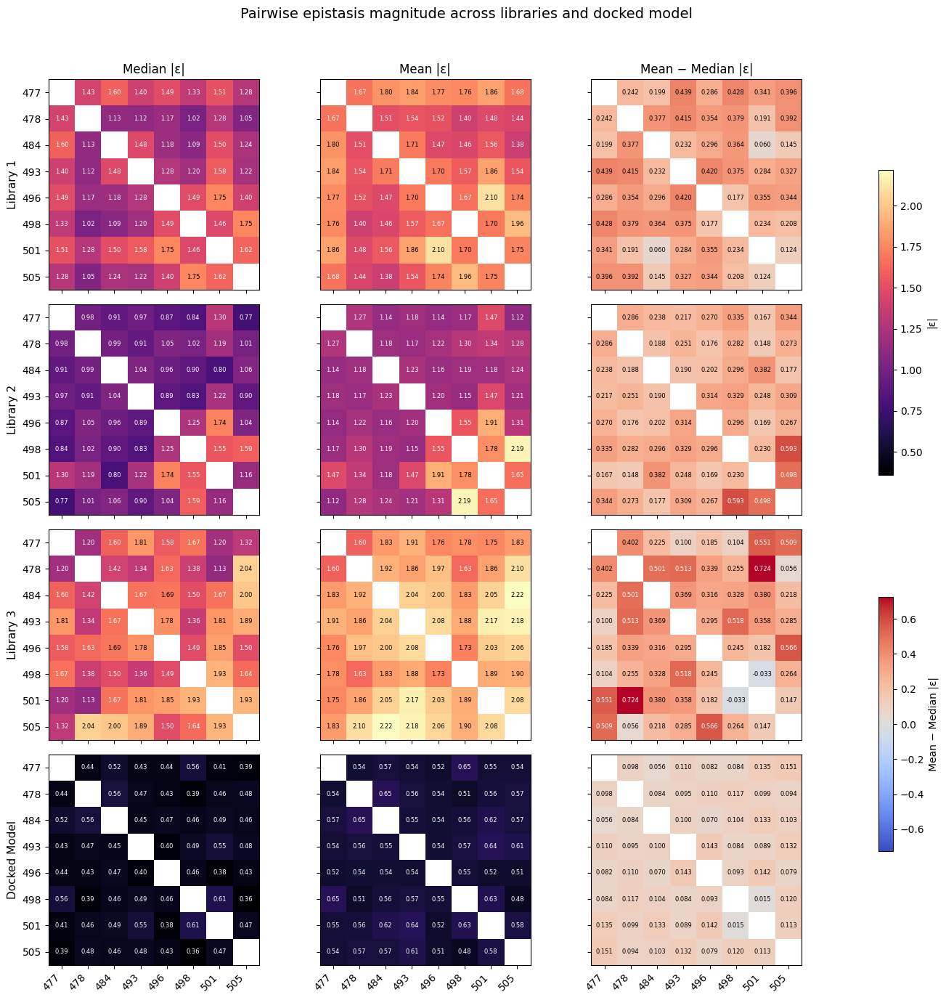

In [511]:
# ----------------------------
# SIGNED EPISTASIS (rows = datasets, cols = stats)
# ----------------------------

plot_keys = list(libs) + ["model"]
n_rows = len(plot_keys)
n_cols = 3  # median, mean, mean-median

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.5 * n_cols, 3.5 * n_rows))

col_specs = [
    ("eps_median", "Median ε", signed_vmin, signed_vmax, "{:.2f}"),
    ("eps_mean", "Mean ε", signed_vmin, signed_vmax, "{:.2f}"),
    ("diff_eps", "Mean − Median ε", diff_signed_vmin, diff_signed_vmax, "{:.3f}")
]

for r, key in enumerate(plot_keys):
    mats = all_mats[key]
    diff_eps = all_diff_eps[key]

    if key == "model":
        row_label = "Docked Model"
    else:
        row_label = f"Library {key}"

    row_data = {
        "eps_median": mats["eps_median"],
        "eps_mean": mats["eps_mean"],
        "diff_eps": diff_eps
    }

    for c, (field, title, vmin, vmax, fmt) in enumerate(col_specs):
        ax = axes[r, c] if n_rows > 1 else axes[c]
        mat = row_data[field]
        data = mat.values.astype(float)

        im = ax.imshow(data, cmap="coolwarm", vmin=vmin, vmax=vmax)

        ax.set_xticks(range(len(mat.columns)))
        ax.set_yticks(range(len(mat.index)))

        if r == n_rows - 1:
            ax.set_xticklabels(mat.columns, rotation=45, ha="right")
        else:
            ax.set_xticklabels([])

        if c == 0:
            ax.set_yticklabels(mat.index)
            ax.set_ylabel(row_label, fontsize=11)
        else:
            ax.set_yticklabels([])

        if r == 0:
            ax.set_title(title, fontsize=12)

        norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                val = data[i, j]
                if not np.isfinite(val) or i == j:
                    continue

                rgba = plt.get_cmap("coolwarm")(norm(val))
                lum = 0.299 * rgba[0] + 0.587 * rgba[1] + 0.114 * rgba[2]
                color = "black" if lum > 0.6 else "white"

                ax.text(j, i, fmt.format(val), ha="center", va="center", fontsize=6, color=color)

# Colorbar
fig.subplots_adjust(right=0.90, wspace=0.25, hspace=0.25)
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])

fig.colorbar(
    plt.cm.ScalarMappable(
        norm=mcolors.Normalize(vmin=signed_vmin, vmax=signed_vmax),
        cmap="coolwarm"
    ),
    cax=cbar_ax
).set_label("Signed ε")

fig.suptitle("Pairwise signed epistasis across libraries and docked model", fontsize=14, y=0.98)
plt.tight_layout(rect=[0, 0, 0.90, 0.96])
plt.show()

# ----------------------------
# MAGNITUDE EPISTASIS (rows = datasets, cols = stats)
# ----------------------------

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.5 * n_cols, 3.5 * n_rows))

col_specs = [
    ("abs_median", "Median |ε|", mag_vmin, mag_vmax, "{:.2f}"),
    ("abs_mean", "Mean |ε|", mag_vmin, mag_vmax, "{:.2f}"),
    ("diff_abs", "Mean − Median |ε|", diff_mag_vmin, diff_mag_vmax, "{:.3f}")
]

for r, key in enumerate(plot_keys):
    mats = all_mats[key]
    diff_abs = all_diff_abs[key]

    if key == "model":
        row_label = "Docked Model"
    else:
        row_label = f"Library {key}"

    row_data = {
        "abs_median": mats["abs_median"],
        "abs_mean": mats["abs_mean"],
        "diff_abs": diff_abs
    }

    for c, (field, title, vmin, vmax, fmt) in enumerate(col_specs):
        ax = axes[r, c] if n_rows > 1 else axes[c]
        mat = row_data[field]
        data = mat.values.astype(float)

        cmap = "magma" if field != "diff_abs" else "coolwarm"
        im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)

        ax.set_xticks(range(len(mat.columns)))
        ax.set_yticks(range(len(mat.index)))

        if r == n_rows - 1:
            ax.set_xticklabels(mat.columns, rotation=45, ha="right")
        else:
            ax.set_xticklabels([])

        if c == 0:
            ax.set_yticklabels(mat.index)
            ax.set_ylabel(row_label, fontsize=11)
        else:
            ax.set_yticklabels([])

        if r == 0:
            ax.set_title(title, fontsize=12)

        norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                val = data[i, j]
                if not np.isfinite(val) or i == j:
                    continue

                rgba = plt.get_cmap(cmap)(norm(val))
                lum = 0.299 * rgba[0] + 0.587 * rgba[1] + 0.114 * rgba[2]
                color = "black" if lum > 0.6 else "white"

                ax.text(j, i, fmt.format(val), ha="center", va="center", fontsize=6, color=color)

# Colorbars
fig.subplots_adjust(right=0.90, wspace=0.25, hspace=0.25)

# |ε| colorbar
cbar_ax1 = fig.add_axes([0.92, 0.52, 0.015, 0.30])
fig.colorbar(
    plt.cm.ScalarMappable(
        norm=mcolors.Normalize(vmin=mag_vmin, vmax=mag_vmax),
        cmap="magma"
    ),
    cax=cbar_ax1
).set_label("|ε|")

# diff colorbar
cbar_ax2 = fig.add_axes([0.92, 0.15, 0.015, 0.25])
fig.colorbar(
    plt.cm.ScalarMappable(
        norm=mcolors.Normalize(vmin=diff_mag_vmin, vmax=diff_mag_vmax),
        cmap="coolwarm"
    ),
    cax=cbar_ax2
).set_label("Mean − Median |ε|")

fig.suptitle("Pairwise epistasis magnitude across libraries and docked model", fontsize=14, y=0.98)
plt.tight_layout(rect=[0, 0, 0.90, 0.96])
plt.show()

In [413]:
import pandas as pd
import numpy as np

# Start from the trusted genotype-level landscape table
src = wo_landscape.copy()

# Keep only the columns we need from the long table
needed = ["library_id", "wo", "log2fc_pos_pre", "log2fc_neg_pre", "ddelta"]
missing = [c for c in needed if c not in src.columns]
if missing:
    raise KeyError(f"wo_landscape is missing required columns: {missing}")

src = src[needed].copy()

# Pivot to wide format so each genotype has lib-specific columns
wide = src.pivot_table(
    index="wo",
    columns="library_id",
    values=["log2fc_pos_pre", "log2fc_neg_pre", "ddelta"],
    aggfunc="first"
)

# Flatten MultiIndex columns into names like log2fc_pos_pre_lib1
wide.columns = [f"{metric}_lib{lib}" for metric, lib in wide.columns]
wide = wide.reset_index()

# Build mut_pos_* columns from the W/O genotype string
site_labels = [477, 478, 484, 493, 496, 498, 501, 505]

if wide["wo"].str.len().nunique() != 1 or wide["wo"].str.len().iloc[0] != 8:
    raise ValueError("Expected all W/O genotype strings to have length 8.")

for i, site in enumerate(site_labels):
    wide[f"mut_pos_{site}"] = wide["wo"].str[i].map({"W": 0, "O": 1})

# Count how many libraries are present for each genotype
pos_cols = [c for c in wide.columns if c.startswith("log2fc_pos_pre_lib")]
wide["n_libs"] = wide[pos_cols].notna().sum(axis=1)

# Add mean columns across available libraries
neg_cols = [c for c in wide.columns if c.startswith("log2fc_neg_pre_lib")]
ddelta_cols = [c for c in wide.columns if c.startswith("ddelta_lib")]

wide["mean_log2fc_pos_pre"] = wide[pos_cols].mean(axis=1, skipna=True)
wide["mean_log2fc_neg_pre"] = wide[neg_cols].mean(axis=1, skipna=True)
wide["delta_log2fc_pos_minus_neg"] = wide["mean_log2fc_pos_pre"] - wide["mean_log2fc_neg_pre"]

# Arrange columns in a more familiar order
mut_cols = [f"mut_pos_{s}" for s in site_labels]
ordered_cols = (
    ["wo"] +
    mut_cols +
    ["n_libs", "mean_log2fc_pos_pre", "mean_log2fc_neg_pre", "delta_log2fc_pos_minus_neg"] +
    sorted([c for c in wide.columns if c.startswith("log2fc_pos_pre_lib")], key=lambda x: int(x.split("lib")[-1])) +
    sorted([c for c in wide.columns if c.startswith("log2fc_neg_pre_lib")], key=lambda x: int(x.split("lib")[-1])) +
    sorted([c for c in wide.columns if c.startswith("ddelta_lib")], key=lambda x: int(x.split("lib")[-1]))
)

exp_df = wide[ordered_cols].copy()

print("Rebuilt exp_df shape:", exp_df.shape)
print("exp_df columns:")
print(exp_df.columns.tolist())

display(exp_df.head())

Rebuilt exp_df shape: (256, 22)
exp_df columns:
['wo', 'mut_pos_477', 'mut_pos_478', 'mut_pos_484', 'mut_pos_493', 'mut_pos_496', 'mut_pos_498', 'mut_pos_501', 'mut_pos_505', 'n_libs', 'mean_log2fc_pos_pre', 'mean_log2fc_neg_pre', 'delta_log2fc_pos_minus_neg', 'log2fc_pos_pre_lib1', 'log2fc_pos_pre_lib2', 'log2fc_pos_pre_lib3', 'log2fc_neg_pre_lib1', 'log2fc_neg_pre_lib2', 'log2fc_neg_pre_lib3', 'ddelta_lib1', 'ddelta_lib2', 'ddelta_lib3']


,wo,mut_pos_477,mut_pos_478,mut_pos_484,mut_pos_493,mut_pos_496,mut_pos_498,mut_pos_501,mut_pos_505,n_libs,...,delta_log2fc_pos_minus_neg,log2fc_pos_pre_lib1,log2fc_pos_pre_lib2,log2fc_pos_pre_lib3,log2fc_neg_pre_lib1,log2fc_neg_pre_lib2,log2fc_neg_pre_lib3,ddelta_lib1,ddelta_lib2,ddelta_lib3
0,OOOOOOOO,1,1,1,1,1,1,1,1,3,...,0.933946,1.401357,1.682163,1.449201,0.870073,0.651608,0.209201,0.531285,1.030555,1.239999
1,OOOOOOOW,1,1,1,1,1,1,1,0,3,...,-0.061622,-0.398696,1.040854,-0.191209,-0.414820,-0.207908,1.258542,0.016124,1.248762,-1.449751
2,OOOOOOWO,1,1,1,1,1,1,0,1,3,...,0.199437,-1.018301,-0.427438,0.265352,0.306112,-0.299295,-1.785516,-1.324413,-0.128143,2.050867
3,OOOOOOWW,1,1,1,1,1,1,0,0,3,...,-2.744229,-4.807749,-2.918952,-0.955748,-0.565828,0.325583,-0.209516,-4.241921,-3.244534,-0.746232
4,OOOOOWOO,1,1,1,1,1,0,1,1,3,...,0.318693,-0.450684,-0.092783,1.075548,0.553312,-1.031135,0.053825,-1.003995,0.938353,1.021723


Detected libraries: [1, 2, 3]
Library 1 pairwise epistasis summary:


,pair,n_backgrounds,median_epsilon,mean_epsilon,median_abs_epsilon,mean_abs_epsilon,fraction_positive
23,496-501,64,1.141585,1.181702,1.749877,2.104788,0.656250
26,498-505,64,1.511955,1.521319,1.747468,1.955484,0.781250
27,501-505,64,0.442812,0.148516,1.621686,1.745404,0.578125
1,477-484,64,-0.816608,-0.537754,1.600681,1.799958,0.375000
20,493-501,64,0.660671,1.088364,1.577600,1.861245,0.625000
5,477-501,64,-0.521578,-0.711128,1.514277,1.855114,0.406250
16,484-501,64,-0.183985,0.030775,1.501352,1.560959,0.468750
22,496-498,64,0.659510,0.604502,1.488006,1.665350,0.625000
3,477-496,64,0.349610,0.299587,1.486637,1.772158,0.531250
13,484-493,64,1.011203,0.822422,1.476596,1.708599,0.656250


Library 2 pairwise epistasis summary:


,pair,n_backgrounds,median_epsilon,mean_epsilon,median_abs_epsilon,mean_abs_epsilon,fraction_positive
23,496-501,64,1.718910,1.538156,1.736052,1.905030,0.828125
26,498-505,64,1.575175,1.853388,1.592348,2.185386,0.812500
25,498-501,64,0.407158,0.141240,1.545216,1.775332,0.609375
5,477-501,64,-0.992196,-0.890646,1.304973,1.471840,0.281250
22,496-498,64,0.859369,0.824575,1.253690,1.549227,0.609375
20,493-501,64,1.129008,1.114327,1.220724,1.468825,0.843750
11,478-501,64,-0.394387,-0.285874,1.194445,1.342808,0.406250
27,501-505,64,0.612344,0.795885,1.155767,1.653775,0.625000
17,484-505,64,0.180492,0.082083,1.063169,1.240632,0.546875
9,478-496,64,-0.218834,-0.008885,1.046263,1.222512,0.421875


Library 3 pairwise epistasis summary:


,pair,n_backgrounds,median_epsilon,mean_epsilon,median_abs_epsilon,mean_abs_epsilon,fraction_positive
12,478-505,64,-0.307331,-0.170150,2.038958,2.095176,0.468750
17,484-505,64,0.704308,0.379800,1.998964,2.217436,0.640625
27,501-505,64,0.151804,-0.099740,1.931580,2.078263,0.546875
25,498-501,64,-0.080216,-0.030047,1.926927,1.894297,0.437500
21,493-505,64,0.070629,-0.015915,1.894472,2.179112,0.515625
23,496-501,64,0.435146,0.414115,1.846424,2.028205,0.578125
2,477-493,64,-0.149652,0.030715,1.812255,1.912695,0.500000
20,493-501,64,0.661116,0.633901,1.808078,2.166509,0.625000
18,493-496,64,0.192198,-0.175280,1.782539,2.077799,0.546875
14,484-496,64,-0.232935,-0.050277,1.688147,2.003945,0.484375


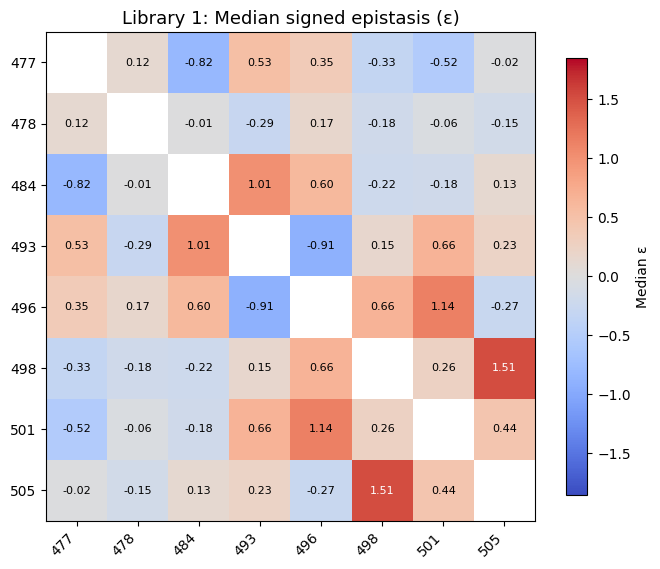

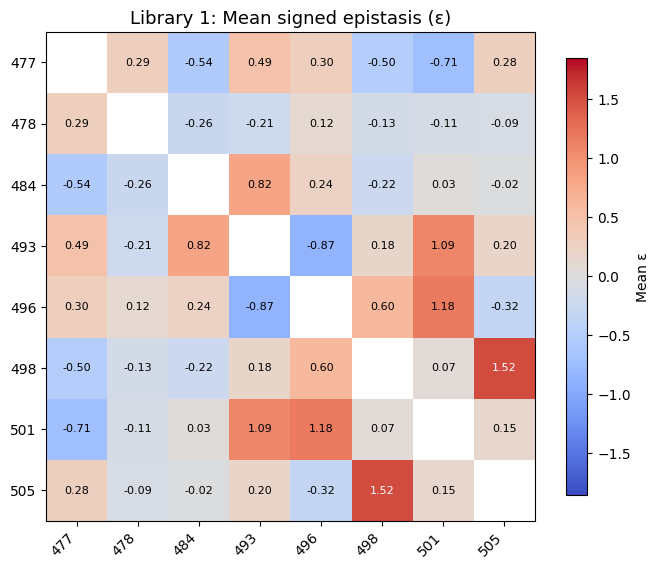

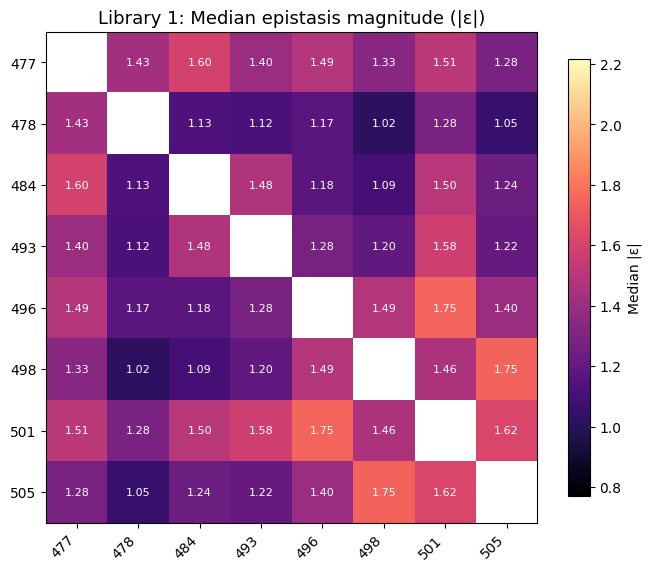

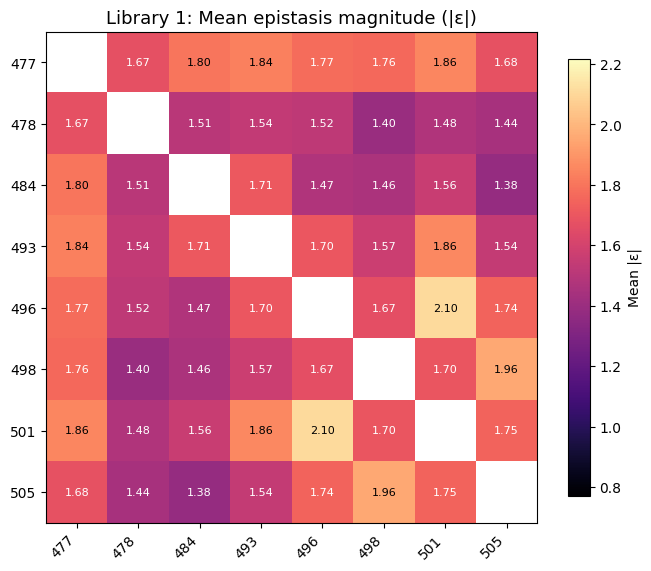

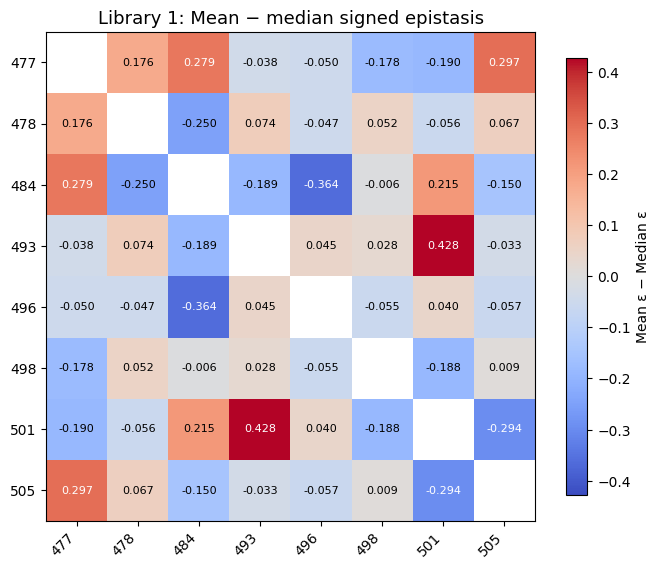

...

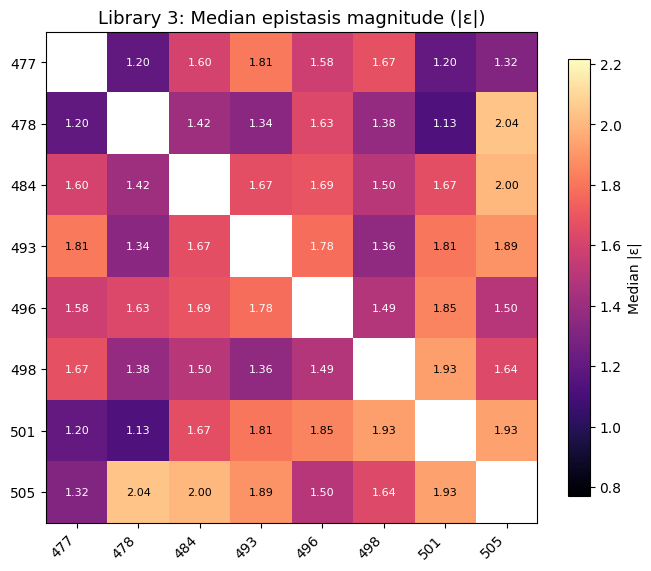

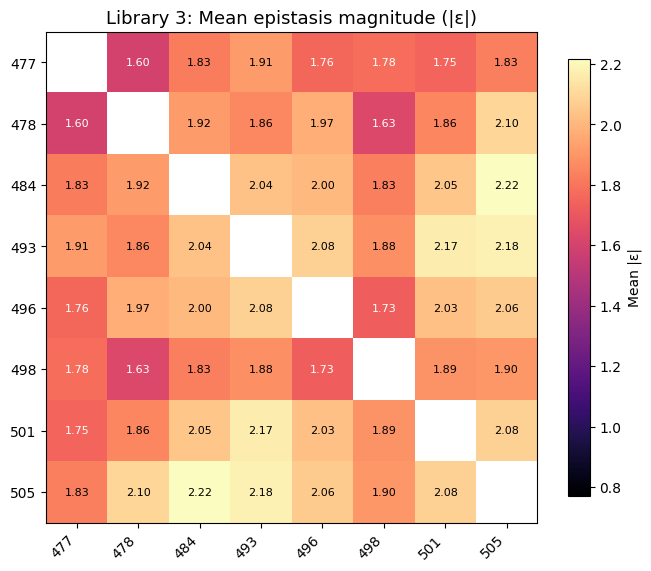

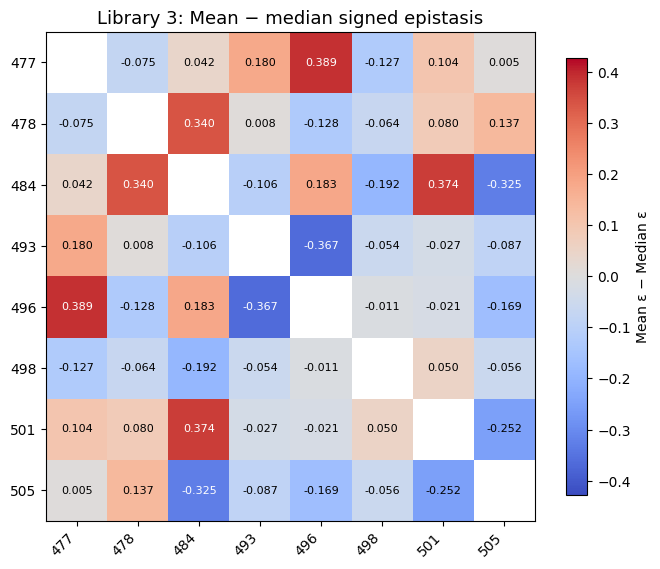

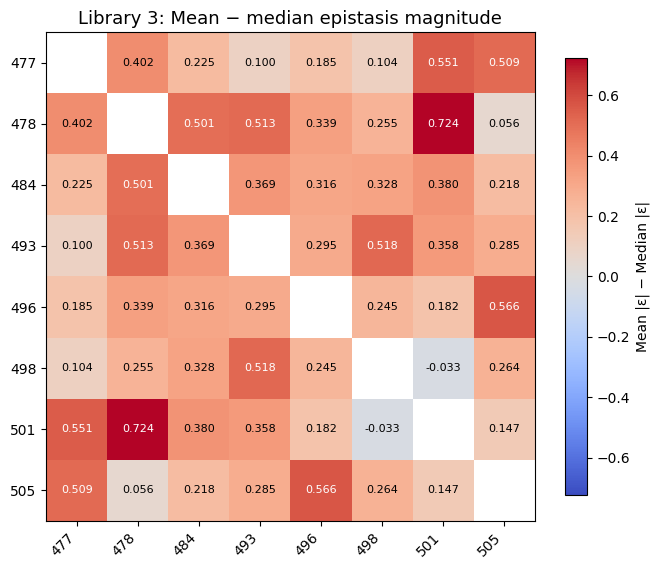

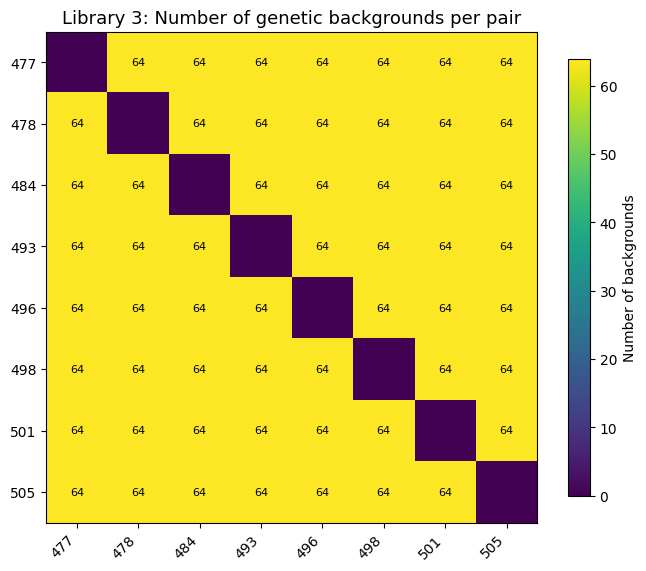

Merged pairwise epistasis summary across libraries:


,pair,n_backgrounds_lib1,median_epsilon_lib1,mean_epsilon_lib1,median_abs_epsilon_lib1,mean_abs_epsilon_lib1,fraction_positive_lib1,n_backgrounds_lib2,median_epsilon_lib2,mean_epsilon_lib2,...,fraction_positive_lib2,n_backgrounds_lib3,median_epsilon_lib3,mean_epsilon_lib3,median_abs_epsilon_lib3,mean_abs_epsilon_lib3,fraction_positive_lib3,abs_eps_diff_median_lib1_vs_lib2,abs_eps_diff_median_lib1_vs_lib3,abs_eps_diff_median_lib2_vs_lib3
0,477-478,64,0.116780,0.292380,1.432260,1.673945,0.562500,64,0.258686,0.231051,...,0.593750,64,-0.185693,-0.260946,1.195721,1.597669,0.468750,0.449214,0.236539,0.212675
1,477-484,64,-0.816608,-0.537754,1.600681,1.799958,0.375000,64,0.121832,0.028475,...,0.515625,64,0.305185,0.347297,1.602112,1.827113,0.578125,0.695160,0.001431,0.696591
2,477-493,64,0.525392,0.487628,1.399003,1.838291,0.546875,64,0.477161,0.276932,...,0.609375,64,-0.149652,0.030715,1.812255,1.912695,0.500000,0.433251,0.413253,0.846503
3,477-496,64,0.349610,0.299587,1.486637,1.772158,0.531250,64,0.051967,0.229807,...,0.546875,64,-0.474436,-0.085328,1.575263,1.759816,0.406250,0.616347,0.088626,0.704973
4,477-498,64,-0.325924,-0.504122,1.333022,1.760879,0.421875,64,-0.177762,0.065801,...,0.421875,64,-0.187678,-0.314574,1.672845,1.776900,0.484375,0.496721,0.339823,0.836543
5,477-501,64,-0.521578,-0.711128,1.514277,1.855114,0.406250,64,-0.992196,-0.890646,...,0.281250,64,-0.372626,-0.269067,1.201431,1.752809,0.359375,0.209304,0.312846,0.103542
6,477-505,64,-0.017415,0.279549,1.282193,1.678265,0.500000,64,-0.246407,-0.065236,...,0.453125,64,-0.019442,-0.014489,1.319351,1.828734,0.484375,0.510628,0.037157,0.547785
7,478-484,64,-0.006187,-0.256298,1.129766,1.506558,0.484375,64,-0.420494,-0.489366,...,0.390625,64,-0.195331,0.144731,1.415132,1.916313,0.484375,0.136355,0.285366,0.421722
8,478-493,64,-0.286059,-0.211704,1.121093,1.536390,0.421875,64,-0.349123,-0.273035,...,0.359375,64,-0.318159,-0.310130,1.343778,1.856495,0.453125,0.206703,0.222685,0.429389
9,478-496,64,0.170176,0.123036,1.170306,1.524508,0.531250,64,-0.218834,-0.008885,...,0.421875,64,0.369621,0.241821,1.631606,1.970784,0.562500,0.124043,0.461300,0.585343


In [414]:
import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import re

# ----------------------------
# 0) Input dataframe
# ----------------------------
df = exp_df.copy()

# ----------------------------
# 1) Identify mutation indicator columns and map them to residue labels
# ----------------------------
pos_cols = [c for c in df.columns if c.startswith("mut_pos_")]
if len(pos_cols) != 8:
    raise ValueError(f"Expected 8 mut_pos_* columns, found {len(pos_cols)}: {pos_cols}")

pos_cols = sorted(pos_cols, key=lambda x: int(x.split("_")[-1]))
site_labels = [477, 478, 484, 493, 496, 498, 501, 505]
label_map = {pos_cols[i]: site_labels[i] for i in range(8)}

# Force bits to int 0/1
for c in pos_cols:
    df[c] = df[c].astype(int)

# genotype tuple key: (b1,b2,...,b8)
df["geno_key"] = list(map(tuple, df[pos_cols].values))
WT = tuple([0] * 8)

# ----------------------------
# 2) Detect available libraries dynamically and build per-library fitness
#    Fitness that matches your landscape:
#    F_spec = log2FC(pos/pre) - log2FC(neg/pre)
# ----------------------------
pos_pat = re.compile(r"^log2fc_pos_pre_lib(\d+)$")
neg_pat = re.compile(r"^log2fc_neg_pre_lib(\d+)$")

pos_libs = {int(pos_pat.match(c).group(1)) for c in df.columns if pos_pat.match(c)}
neg_libs = {int(neg_pat.match(c).group(1)) for c in df.columns if neg_pat.match(c)}

libs = sorted(pos_libs & neg_libs)
if not libs:
    raise KeyError("No matching lib-specific log2fc_pos_pre_libX / log2fc_neg_pre_libX columns found.")

print("Detected libraries:", libs)

for lib in libs:
    df[f"F_spec_lib{lib}"] = (
        df[f"log2fc_pos_pre_lib{lib}"].astype(float)
        - df[f"log2fc_neg_pre_lib{lib}"].astype(float)
    )

# ----------------------------
# 3) Helper: compute pairwise epsilons across all backgrounds
#     and summarize with BOTH median and mean
# ----------------------------
def compute_pairwise_eps_stats(df, fitness_col, sites):
    """
    Returns:
      pair_table: per-pair stats including mean/median for signed and abs eps
      mats: dict of 8x8 matrices:
        - eps_median, eps_mean
        - abs_median, abs_mean
        - n_bg
        - frac_pos
    """
    f_map = dict(zip(df["geno_key"], df[fitness_col].astype(float)))

    mats = {
        "eps_median": pd.DataFrame(np.nan, index=sites, columns=sites),
        "eps_mean":   pd.DataFrame(np.nan, index=sites, columns=sites),
        "abs_median": pd.DataFrame(np.nan, index=sites, columns=sites),
        "abs_mean":   pd.DataFrame(np.nan, index=sites, columns=sites),
        "n_bg":       pd.DataFrame(0, index=sites, columns=sites, dtype=int),
        "frac_pos":   pd.DataFrame(np.nan, index=sites, columns=sites),
    }

    rows = []
    idxs = list(range(8))

    for i, j in itertools.combinations(idxs, 2):
        bg_idxs = [k for k in idxs if k not in (i, j)]
        eps_vals = []

        # Iterate all 2^6 backgrounds
        for bg_bits in itertools.product([0, 1], repeat=len(bg_idxs)):
            base = [0] * 8
            for k, bit in zip(bg_idxs, bg_bits):
                base[k] = bit

            g00 = tuple(base)
            g10 = list(base); g10[i] = 1; g10[j] = 0; g10 = tuple(g10)
            g01 = list(base); g01[i] = 0; g01[j] = 1; g01 = tuple(g01)
            g11 = list(base); g11[i] = 1; g11[j] = 1; g11 = tuple(g11)

            F00 = f_map.get(g00, np.nan)
            F10 = f_map.get(g10, np.nan)
            F01 = f_map.get(g01, np.nan)
            F11 = f_map.get(g11, np.nan)

            vals = np.array([F00, F10, F01, F11], dtype=float)
            if not np.all(np.isfinite(vals)):
                continue

            eps = F11 - F10 - F01 + F00
            eps_vals.append(eps)

        eps_vals = np.asarray(eps_vals, dtype=float)
        if eps_vals.size == 0:
            continue

        si = sites[i]
        sj = sites[j]

        med_eps  = float(np.median(eps_vals))
        mean_eps = float(np.mean(eps_vals))
        med_abs  = float(np.median(np.abs(eps_vals)))
        mean_abs = float(np.mean(np.abs(eps_vals)))
        frac_pos = float(np.mean(eps_vals > 0))
        n        = int(eps_vals.size)

        for key, val in [
            ("eps_median", med_eps),
            ("eps_mean", mean_eps),
            ("abs_median", med_abs),
            ("abs_mean", mean_abs),
            ("frac_pos", frac_pos),
        ]:
            mats[key].loc[si, sj] = val
            mats[key].loc[sj, si] = val

        mats["n_bg"].loc[si, sj] = n
        mats["n_bg"].loc[sj, si] = n

        rows.append({
            "pair": f"{si}-{sj}",
            "n_backgrounds": n,
            "median_epsilon": med_eps,
            "mean_epsilon": mean_eps,
            "median_abs_epsilon": med_abs,
            "mean_abs_epsilon": mean_abs,
            "fraction_positive": frac_pos
        })

    pair_table = pd.DataFrame(rows).sort_values("median_abs_epsilon", ascending=False)
    return pair_table, mats

# ----------------------------
# 4) Plot helpers
# ----------------------------
def shared_symmetric_bounds(*mats):
    vals = []
    for mat in mats:
        arr = mat.values.astype(float)
        vals.extend(arr[np.isfinite(arr)].ravel())
    if len(vals) == 0:
        return None, None
    m = float(np.max(np.abs(vals)))
    return -m, m

def shared_positive_bounds(*mats):
    vals = []
    for mat in mats:
        arr = mat.values.astype(float)
        vals.extend(arr[np.isfinite(arr)].ravel())
    if len(vals) == 0:
        return None, None
    return float(np.min(vals)), float(np.max(vals))

def plot_heatmap_annot(
    mat,
    title,
    cmap="coolwarm",
    vmin=None,
    vmax=None,
    cbar_label=None,
    fmt="{:.2f}",
    diag_blank=True,
    figsize=(6.8, 5.8)
):
    fig, ax = plt.subplots(figsize=figsize)
    data = mat.values.astype(float)

    im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)

    ax.set_title(title, fontsize=13)
    ax.set_xticks(range(len(mat.columns)))
    ax.set_yticks(range(len(mat.index)))
    ax.set_xticklabels(mat.columns, rotation=45, ha="right")
    ax.set_yticklabels(mat.index)

    if vmin is None:
        vmin = np.nanmin(data)
    if vmax is None:
        vmax = np.nanmax(data)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    for r in range(data.shape[0]):
        for c in range(data.shape[1]):
            val = data[r, c]
            if not np.isfinite(val):
                continue
            if diag_blank and r == c:
                continue

            rgba = im.cmap(norm(val))
            r_col, g_col, b_col, _ = rgba
            luminance = 0.299 * r_col + 0.587 * g_col + 0.114 * b_col
            text_color = "black" if luminance > 0.6 else "white"

            ax.text(
                c, r,
                fmt.format(val),
                ha="center",
                va="center",
                fontsize=8,
                color=text_color
            )

    cbar = fig.colorbar(im, ax=ax, shrink=0.85)
    if cbar_label:
        cbar.set_label(cbar_label)

    plt.tight_layout()
    plt.show()

# ----------------------------
# 5) Run for each available library
# ----------------------------
sites = site_labels

pair_tables = {}
mats_by_lib = {}

for lib in libs:
    pair_table, mats = compute_pairwise_eps_stats(df, f"F_spec_lib{lib}", sites)
    pair_tables[lib] = pair_table
    mats_by_lib[lib] = mats

    print(f"Library {lib} pairwise epistasis summary:")
    display(pair_table)

# ----------------------------
# 6) Precompute difference matrices per library
# ----------------------------
diff_eps_by_lib = {}
diff_abs_by_lib = {}

for lib in libs:
    diff_eps_by_lib[lib] = mats_by_lib[lib]["eps_mean"] - mats_by_lib[lib]["eps_median"]
    diff_abs_by_lib[lib] = mats_by_lib[lib]["abs_mean"] - mats_by_lib[lib]["abs_median"]

# ----------------------------
# 7) Shared normalization across all libraries
# ----------------------------
signed_vmin, signed_vmax = shared_symmetric_bounds(
    *[mats_by_lib[lib]["eps_median"] for lib in libs],
    *[mats_by_lib[lib]["eps_mean"] for lib in libs]
)

mag_vmin, mag_vmax = shared_positive_bounds(
    *[mats_by_lib[lib]["abs_median"] for lib in libs],
    *[mats_by_lib[lib]["abs_mean"] for lib in libs]
)

diff_signed_vmin, diff_signed_vmax = shared_symmetric_bounds(
    *[diff_eps_by_lib[lib] for lib in libs]
)

diff_mag_vmin, diff_mag_vmax = shared_symmetric_bounds(
    *[diff_abs_by_lib[lib] for lib in libs]
)

# ----------------------------
# 8) Plot all heatmaps for each library
# ----------------------------
for lib in libs:
    mats = mats_by_lib[lib]
    diff_eps = diff_eps_by_lib[lib]
    diff_abs = diff_abs_by_lib[lib]

    plot_heatmap_annot(
        mats["eps_median"],
        f"Library {lib}: Median signed epistasis (ε)",
        cmap="coolwarm",
        vmin=signed_vmin, vmax=signed_vmax,
        cbar_label="Median ε",
        fmt="{:.2f}"
    )

    plot_heatmap_annot(
        mats["eps_mean"],
        f"Library {lib}: Mean signed epistasis (ε)",
        cmap="coolwarm",
        vmin=signed_vmin, vmax=signed_vmax,
        cbar_label="Mean ε",
        fmt="{:.2f}"
    )

    plot_heatmap_annot(
        mats["abs_median"],
        f"Library {lib}: Median epistasis magnitude (|ε|)",
        cmap="magma",
        vmin=mag_vmin, vmax=mag_vmax,
        cbar_label="Median |ε|",
        fmt="{:.2f}"
    )

    plot_heatmap_annot(
        mats["abs_mean"],
        f"Library {lib}: Mean epistasis magnitude (|ε|)",
        cmap="magma",
        vmin=mag_vmin, vmax=mag_vmax,
        cbar_label="Mean |ε|",
        fmt="{:.2f}"
    )

    plot_heatmap_annot(
        diff_eps,
        f"Library {lib}: Mean − median signed epistasis",
        cmap="coolwarm",
        vmin=diff_signed_vmin, vmax=diff_signed_vmax,
        cbar_label="Mean ε − Median ε",
        fmt="{:.3f}"
    )

    plot_heatmap_annot(
        diff_abs,
        f"Library {lib}: Mean − median epistasis magnitude",
        cmap="coolwarm",
        vmin=diff_mag_vmin, vmax=diff_mag_vmax,
        cbar_label="Mean |ε| − Median |ε|",
        fmt="{:.3f}"
    )

    plot_heatmap_annot(
        mats["n_bg"].astype(float),
        f"Library {lib}: Number of genetic backgrounds per pair",
        cmap="viridis",
        vmin=0,
        vmax=64,
        cbar_label="Number of backgrounds",
        fmt="{:.0f}"
    )

# ----------------------------
# 9) Build merged pairwise summary across libraries
# ----------------------------
merged_pairs = None
for lib in libs:
    tbl = pair_tables[lib].copy().add_suffix(f"_lib{lib}")
    tbl = tbl.rename(columns={f"pair_lib{lib}": "pair"})
    if merged_pairs is None:
        merged_pairs = tbl
    else:
        merged_pairs = merged_pairs.merge(tbl, on="pair", how="outer")

# Add pairwise between-library differences for median_abs_epsilon
for i, lib_a in enumerate(libs):
    for lib_b in libs[i+1:]:
        col_a = f"median_abs_epsilon_lib{lib_a}"
        col_b = f"median_abs_epsilon_lib{lib_b}"
        if col_a in merged_pairs.columns and col_b in merged_pairs.columns:
            merged_pairs[f"abs_eps_diff_median_lib{lib_a}_vs_lib{lib_b}"] = np.abs(
                merged_pairs[col_a] - merged_pairs[col_b]
            )

print("Merged pairwise epistasis summary across libraries:")
display(merged_pairs)

In [497]:
[c for c in exp_df.columns if "lib3" in c.lower()]

['log2fc_pos_pre_lib3', 'log2fc_neg_pre_lib3', 'ddelta_lib3']

Detected libraries: [1, 2, 3]


,pair,n_bg_lib1,median_eps_lib1,mean_eps_lib1,median_abs_eps_lib1,mean_abs_eps_lib1,frac_pos_lib1,n_bg_lib2,median_eps_lib2,mean_eps_lib2,...,mean_abs_eps_lib3,frac_pos_lib3,avg_median_abs,range_median_abs,diff_median_abs_lib1_vs_lib2,diff_median_signed_lib1_vs_lib2,diff_median_abs_lib1_vs_lib3,diff_median_signed_lib1_vs_lib3,diff_median_abs_lib2_vs_lib3,diff_median_signed_lib2_vs_lib3
23,496-501,64,1.141585,1.181702,1.749877,2.104788,0.656250,64,1.718910,1.538156,...,2.028205,0.578125,1.777451,0.110372,0.013825,0.577325,0.096547,0.706438,0.110372,1.283763
26,498-505,64,1.511955,1.521319,1.747468,1.955484,0.781250,64,1.575175,1.853388,...,1.904862,0.625000,1.660168,0.155120,0.155120,0.063220,0.106780,0.824008,0.048340,0.887228
25,498-501,64,0.260357,0.072363,1.463040,1.697474,0.546875,64,0.407158,0.141240,...,1.894297,0.437500,1.645061,0.463886,0.082176,0.146800,0.463886,0.340574,0.381710,0.487374
27,501-505,64,0.442812,0.148516,1.621686,1.745404,0.578125,64,0.612344,0.795885,...,2.078263,0.546875,1.569678,0.775812,0.465919,0.169532,0.309893,0.291008,0.775812,0.460540
20,493-501,64,0.660671,1.088364,1.577600,1.861245,0.625000,64,1.129008,1.114327,...,2.166509,0.625000,1.535467,0.587354,0.356876,0.468338,0.230478,0.000445,0.587354,0.467893
17,484-505,64,0.129815,-0.020044,1.239157,1.384397,0.578125,64,0.180492,0.082083,...,2.217436,0.640625,1.433763,0.935795,0.175988,0.050677,0.759807,0.574493,0.935795,0.523816
22,496-498,64,0.659510,0.604502,1.488006,1.665350,0.625000,64,0.859369,0.824575,...,1.731562,0.515625,1.409344,0.234316,0.234316,0.199860,0.001668,0.648321,0.232647,0.848180
13,484-493,64,1.011203,0.822422,1.476596,1.708599,0.656250,64,0.867534,0.729439,...,2.036110,0.515625,1.395033,0.626626,0.435656,0.143668,0.190970,0.813367,0.626626,0.669699
2,477-493,64,0.525392,0.487628,1.399003,1.838291,0.546875,64,0.477161,0.276932,...,1.912695,0.500000,1.392337,0.846503,0.433251,0.048231,0.413253,0.675044,0.846503,0.626812
1,477-484,64,-0.816608,-0.537754,1.600681,1.799958,0.375000,64,0.121832,0.028475,...,1.827113,0.578125,1.369438,0.696591,0.695160,0.938440,0.001431,1.121794,0.696591,0.183354


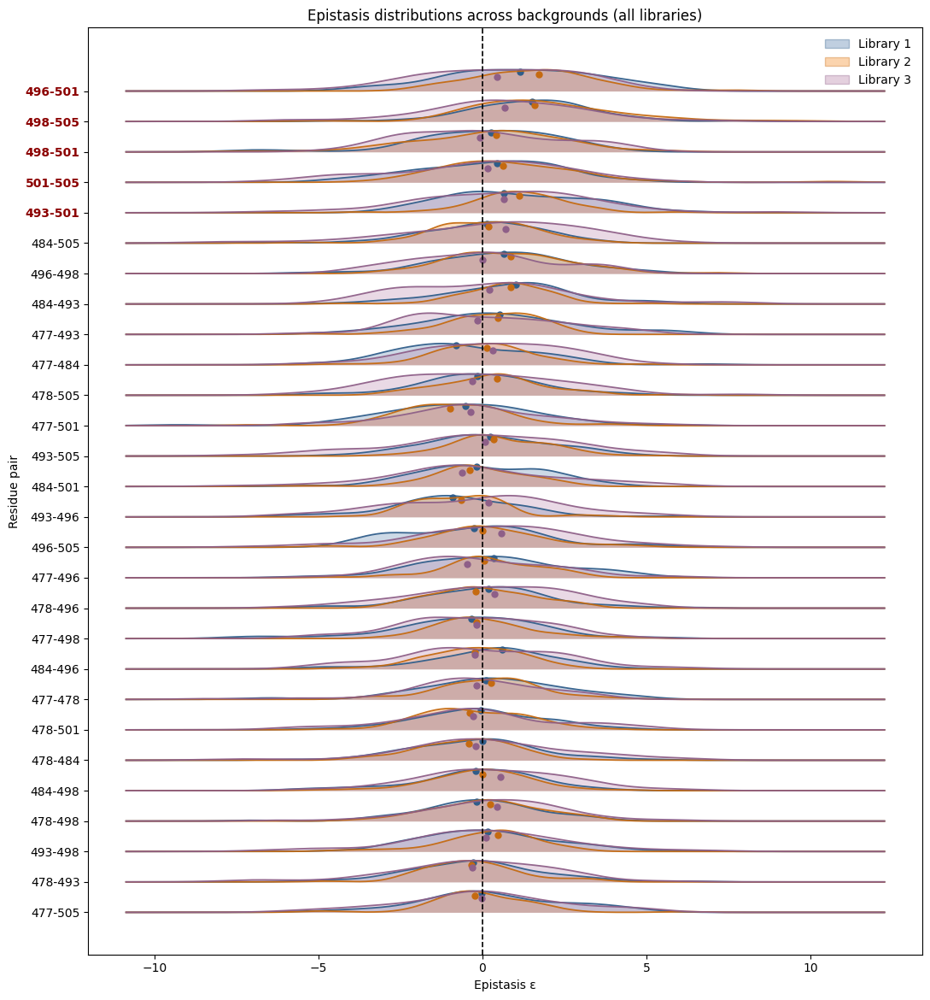

In [421]:
import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import re

# =========================================================
# Ridgeline plot of epistasis distributions across backgrounds
# NOW SUPPORTS ALL LIBRARIES (incl. lib3)
# =========================================================

df = exp_df.copy()

# ----------------------------
# 1) Identify mutation indicator columns
# ----------------------------
pos_cols = [c for c in df.columns if c.startswith("mut_pos_")]
pos_cols = sorted(pos_cols, key=lambda x: int(x.split("_")[-1]))
site_labels = [477, 478, 484, 493, 496, 498, 501, 505]

for c in pos_cols:
    df[c] = df[c].astype(int)

df["geno_key"] = list(map(tuple, df[pos_cols].values))

# ----------------------------
# 2) Detect libraries dynamically
# ----------------------------
pos_pat = re.compile(r"log2fc_pos_pre_lib(\d+)")
neg_pat = re.compile(r"log2fc_neg_pre_lib(\d+)")

pos_libs = {int(pos_pat.match(c).group(1)) for c in df.columns if pos_pat.match(c)}
neg_libs = {int(neg_pat.match(c).group(1)) for c in df.columns if neg_pat.match(c)}

libs = sorted(pos_libs & neg_libs)
print("Detected libraries:", libs)

# Build F_spec per library
for lib in libs:
    df[f"F_spec_lib{lib}"] = (
        df[f"log2fc_pos_pre_lib{lib}"].astype(float)
        - df[f"log2fc_neg_pre_lib{lib}"].astype(float)
    )

# ----------------------------
# 3) Collect epsilon distributions
# ----------------------------
def collect_eps(df, fitness_col):
    f_map = dict(zip(df["geno_key"], df[fitness_col].astype(float)))
    idxs = list(range(8))
    pair_to_eps = {}

    for i, j in itertools.combinations(idxs, 2):
        bg_idxs = [k for k in idxs if k not in (i, j)]
        eps_vals = []

        for bg_bits in itertools.product([0, 1], repeat=len(bg_idxs)):
            base = [0] * 8
            for k, bit in zip(bg_idxs, bg_bits):
                base[k] = bit

            g00 = tuple(base)
            g10 = list(base); g10[i] = 1; g10[j] = 0; g10 = tuple(g10)
            g01 = list(base); g01[i] = 0; g01[j] = 1; g01 = tuple(g01)
            g11 = list(base); g11[i] = 1; g11[j] = 1; g11 = tuple(g11)

            F00 = f_map.get(g00, np.nan)
            F10 = f_map.get(g10, np.nan)
            F01 = f_map.get(g01, np.nan)
            F11 = f_map.get(g11, np.nan)

            vals = np.array([F00, F10, F01, F11])
            if not np.all(np.isfinite(vals)):
                continue

            eps_vals.append(F11 - F10 - F01 + F00)

        pair = f"{site_labels[i]}-{site_labels[j]}"
        pair_to_eps[pair] = np.asarray(eps_vals)

    return pair_to_eps

# Compute for all libraries
eps_by_lib = {lib: collect_eps(df, f"F_spec_lib{lib}") for lib in libs}

# ----------------------------
# 4) Rank pairs by avg median |ε|
# ----------------------------
rows = []

for pair in eps_by_lib[libs[0]].keys():
    med_vals = []
    for lib in libs:
        vals = eps_by_lib[lib][pair]
        if vals.size > 0:
            med_vals.append(np.median(np.abs(vals)))

    rows.append({
        "pair": pair,
        "avg_median_abs": np.nanmean(med_vals)
    })

pair_df = pd.DataFrame(rows).sort_values("avg_median_abs", ascending=False)
pair_order = pair_df["pair"].tolist()
top_pairs = set(pair_df.head(5)["pair"])

display(pair_df)

# ----------------------------
# 5) KDE helper
# ----------------------------
def kde(x, grid):
    x = x[np.isfinite(x)]
    if len(x) == 0:
        return np.zeros_like(grid)

    bw = max(0.08, 0.9 * np.std(x) * len(x) ** (-1/5))
    diff = (grid[:, None] - x[None, :]) / bw
    dens = np.exp(-0.5 * diff**2).sum(axis=1)
    return dens / (len(x) * bw * np.sqrt(2*np.pi))

# ----------------------------
# 6) Common x-axis
# ----------------------------
all_eps = np.concatenate([
    np.concatenate([v for v in eps_by_lib[lib].values() if v.size > 0])
    for lib in libs
])

xmin, xmax = np.min(all_eps), np.max(all_eps)
xgrid = np.linspace(xmin - 0.1, xmax + 0.1, 500)

# ----------------------------
# 7) Ridgeline plot
# ----------------------------
fig, ax = plt.subplots(figsize=(11, max(8, 0.35 * len(pair_order) + 2)))

colors = ["tab:blue", "tab:orange", "tab:green"]

y_positions = np.arange(len(pair_order))[::-1]

for y, pair in zip(y_positions, pair_order):
    for idx, lib in enumerate(libs):
        vals = eps_by_lib[lib][pair]
        dens = kde(vals, xgrid)
        if np.max(dens) > 0:
            dens = dens / np.max(dens) * 0.7

        ax.fill_between(
            xgrid, y, y + dens,
            color=colors[idx],
            alpha=0.35
        )

        if vals.size > 0:
            ax.plot(
                np.median(vals),
                y + 0.65 - idx*0.1,
                marker="o",
                color=colors[idx],
                markersize=4
            )

# axis
ax.axvline(0, linestyle="--", color="black")
ax.set_yticks(y_positions)
ax.set_yticklabels(pair_order)

# highlight top
for tick in ax.get_yticklabels():
    if tick.get_text() in top_pairs:
        tick.set_color("darkred")
        tick.set_fontweight("bold")

ax.set_xlabel("Epistasis ε")
ax.set_ylabel("Residue pair")
ax.set_title("Epistasis distributions across backgrounds (all libraries)")

# legend
from matplotlib.patches import Patch
legend = [Patch(color=colors[i], label=f"Library {libs[i]}") for i in range(len(libs))]
ax.legend(handles=legend, frameon=False)

plt.tight_layout()
plt.show()

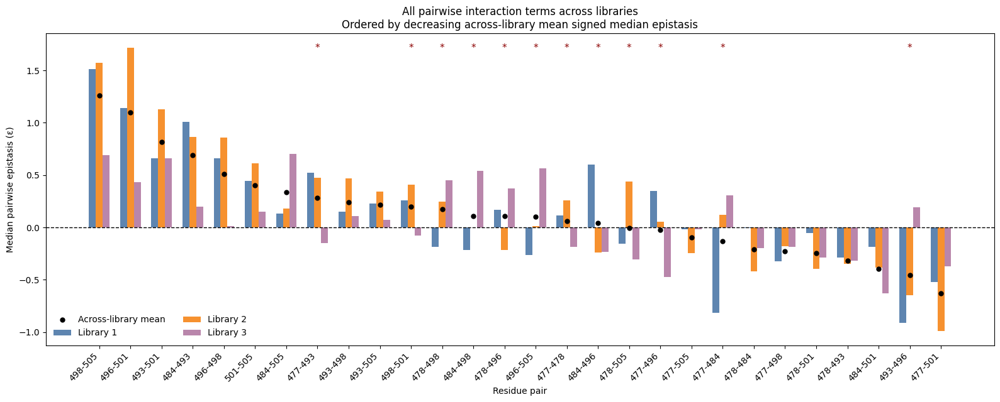

In [444]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ----------------------------------
# Multi-bar plot of ALL pairwise interactions
# ordered by decreasing across-library mean signed median epistasis
# ----------------------------------

plot_df = pair_summary_full.copy()

# Detect library columns dynamically
lib_cols = [c for c in plot_df.columns if c.startswith("median_eps_lib")]
lib_nums = sorted(int(c.split("lib")[-1]) for c in lib_cols)

# Compute across-library mean of signed median epistasis
mean_cols = [f"median_eps_lib{lib}" for lib in lib_nums]
plot_df["median_eps_mean_across_libs"] = plot_df[mean_cols].mean(axis=1, skipna=True)

# Order all pairs by decreasing across-library mean
plot_df = plot_df.sort_values("median_eps_mean_across_libs", ascending=False).copy()

# Sign consistency flag
def sign_consistency_from_row(row):
    vals = [row[f"median_eps_lib{lib}"] for lib in lib_nums if pd.notna(row[f"median_eps_lib{lib}"])]
    if len(vals) <= 1:
        return np.nan
    return int(len(set(np.sign(vals))) == 1)

plot_df["sign_consistency"] = plot_df.apply(sign_consistency_from_row, axis=1)

# Plot geometry
x = np.arange(len(plot_df))
width = 0.22 if len(lib_nums) >= 3 else 0.30
offsets = np.linspace(-(len(lib_nums)-1)/2, (len(lib_nums)-1)/2, len(lib_nums)) * width

color_map = {
    1: "#4C78A8",   # blue
    2: "#F58518",   # orange
    3: "#B279A2",   # purple
}

fig, ax = plt.subplots(figsize=(16, 6.5))

# Bars for each library
for i, lib in enumerate(lib_nums):
    col = f"median_eps_lib{lib}"
    ax.bar(
        x + offsets[i],
        plot_df[col].values,
        width=width,
        label=f"Library {lib}",
        color=color_map.get(lib, None),
        alpha=0.9
    )

# Across-library mean points
ax.plot(
    x,
    plot_df["median_eps_mean_across_libs"].values,
    marker="o",
    linestyle="None",
    color="black",
    markersize=5,
    label="Across-library mean"
)

# Zero line
ax.axhline(0, linestyle="--", color="black", linewidth=1)

# Mark sign-inconsistent pairs
ymin, ymax = ax.get_ylim()
for i, row in plot_df.reset_index(drop=True).iterrows():
    if row["sign_consistency"] == 0:
        ax.text(
            i,
            ymax * 0.95,
            "*",
            ha="center",
            va="top",
            fontsize=11,
            color="darkred"
        )

# Labels
ax.set_xticks(x)
ax.set_xticklabels(plot_df["pair"], rotation=45, ha="right")
ax.set_ylabel("Median pairwise epistasis (ε)")
ax.set_xlabel("Residue pair")
ax.set_title("All pairwise interaction terms across libraries\nOrdered by decreasing across-library mean signed median epistasis")

ax.legend(frameon=False, ncol=2)
plt.tight_layout()
plt.show()

In [447]:
import numpy as np
import pandas as pd

df = pair_summary_full.copy()

# compute mean epsilon across libraries
df["mean_eps"] = df[[
    "median_eps_lib1",
    "median_eps_lib2",
    "median_eps_lib3"
]].mean(axis=1)

# compute absolute magnitude
df["abs_mean"] = df["mean_eps"].abs()

# define bins manually
def assign_bin(x):
    if x < 0.3:
        return "low"
    elif x < 0.8:
        return "medium"
    else:
        return "high"

df["bin"] = df["abs_mean"].apply(assign_bin)

# check sign agreement
def sign_consistent(row):
    vals = [
        row["median_eps_lib1"],
        row["median_eps_lib2"],
        row["median_eps_lib3"]
    ]
    vals = [v for v in vals if not pd.isna(v)]

    if len(vals) < 2:
        return np.nan

    signs = [np.sign(v) for v in vals]
    return int(len(set(signs)) == 1)

df["sign_consistent"] = df.apply(sign_consistent, axis=1)

# summarize
summary = df.groupby("bin")["sign_consistent"].mean()
print(summary)

bin
high      1.000000
low       0.352941
medium    0.875000
Name: sign_consistent, dtype: float64


In [445]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr, spearmanr

df = pair_summary_full.copy()

libs = [1, 2, 3]

results = []

for i in range(len(libs)):
    for j in range(i+1, len(libs)):

        libA = libs[i]
        libB = libs[j]

        colA = f"median_eps_lib{libA}"
        colB = f"median_eps_lib{libB}"

        sub = df[[colA, colB]].dropna()

        x = sub[colA].values
        y = sub[colB].values

        # sign agreement
        sign_agreement = np.mean(np.sign(x) == np.sign(y))

        # correlations
        pearson_r, pearson_p = pearsonr(x, y)
        spearman_r, spearman_p = spearmanr(x, y)

        # magnitude difference
        mean_abs_diff = np.mean(np.abs(x - y))

        results.append({
            "comparison": f"Lib{libA} vs Lib{libB}",
            "sign_agreement_fraction": sign_agreement,
            "pearson_r": pearson_r,
            "spearman_r": spearman_r,
            "mean_abs_difference": mean_abs_diff
        })

agreement_df = pd.DataFrame(results)
display(agreement_df)

,comparison,sign_agreement_fraction,pearson_r,spearman_r,mean_abs_difference
0,Lib1 vs Lib2,0.750000,0.801408,0.740011,0.305596
1,Lib1 vs Lib3,0.642857,0.261588,0.244116,0.465052
2,Lib2 vs Lib3,0.750000,0.513312,0.482759,0.463885


Detected libraries in merged_pairs: [1, 2, 3]


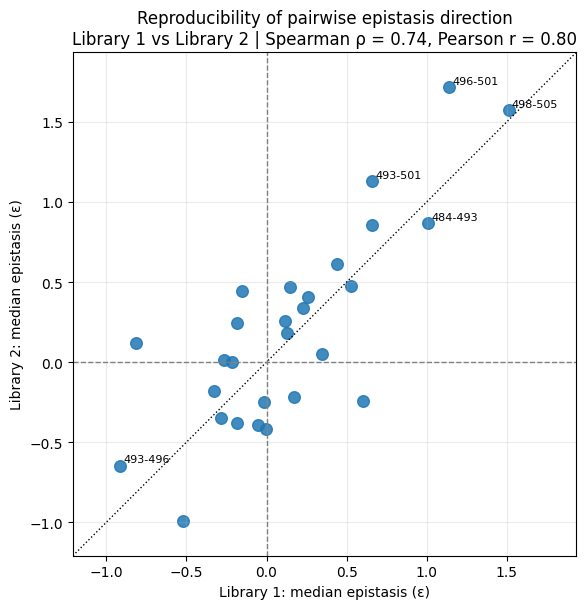

Library 1 vs Library 2
  Pearson r = 0.801 (p = 2.98e-07)
  Spearman rho = 0.740 (p = 6.77e-06)



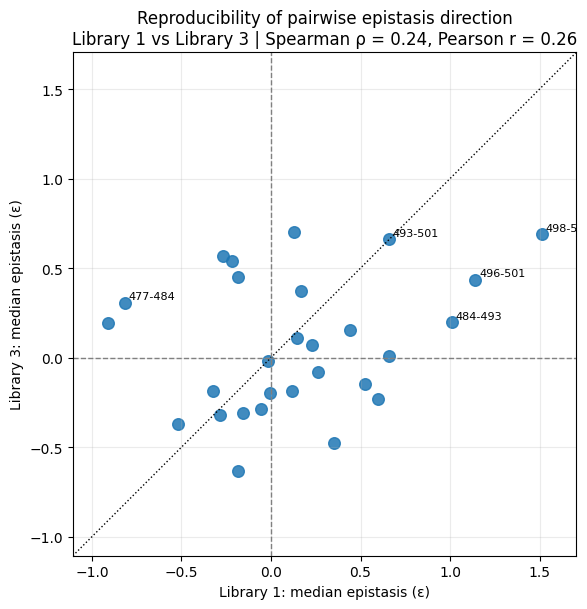

Library 1 vs Library 3
  Pearson r = 0.262 (p = 0.179)
  Spearman rho = 0.244 (p = 0.211)



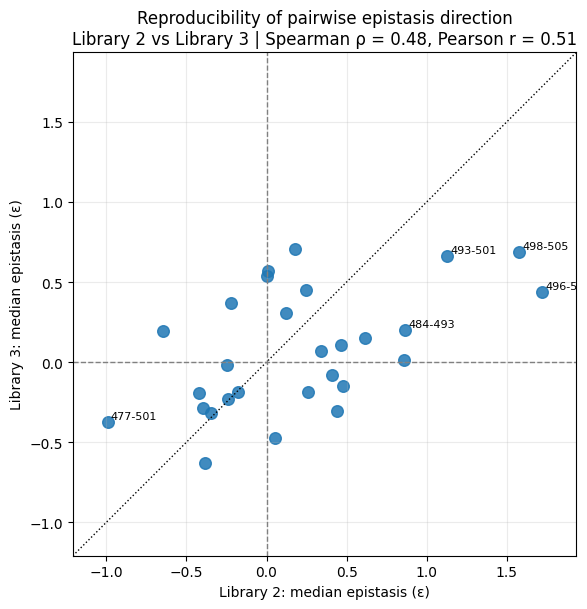

Library 2 vs Library 3
  Pearson r = 0.513 (p = 0.00521)
  Spearman rho = 0.483 (p = 0.00927)



In [422]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
import itertools

# ----------------------------------
# Signed epistasis scatter for all library pairs
# ----------------------------------

df_eps = merged_pairs.copy()

# Detect available libraries from merged_pairs columns
libs = sorted({
    int(col.split("_lib")[-1])
    for col in df_eps.columns
    if col.startswith("median_epsilon_lib")
})

print("Detected libraries in merged_pairs:", libs)

for lib_a, lib_b in itertools.combinations(libs, 2):
    xcol = f"median_epsilon_lib{lib_a}"
    ycol = f"median_epsilon_lib{lib_b}"

    if xcol not in df_eps.columns or ycol not in df_eps.columns:
        print(f"[skip] Missing columns for Library {lib_a} vs {lib_b}")
        continue

    plot_df = df_eps[["pair", xcol, ycol]].copy()
    plot_df = plot_df.replace([np.inf, -np.inf], np.nan).dropna()

    x = plot_df[xcol].astype(float)
    y = plot_df[ycol].astype(float)
    labels = plot_df["pair"]

    if len(plot_df) < 2:
        print(f"[skip] Not enough points for Library {lib_a} vs {lib_b}")
        continue

    pearson_r, pearson_p = pearsonr(x, y)
    spearman_rho, spearman_p = spearmanr(x, y)

    # axis limits
    lo = min(x.min(), y.min())
    hi = max(x.max(), y.max())
    span = hi - lo
    pad = 0.08 * span if span > 0 else 0.5
    lims = [lo - pad, hi + pad]

    plt.figure(figsize=(6.8, 6.2))

    plt.scatter(x, y, s=70, alpha=0.85)

    # identity line
    plt.plot(lims, lims, linestyle=":", color="black", linewidth=1)

    # zero lines
    plt.axhline(0, linestyle="--", color="gray", linewidth=1)
    plt.axvline(0, linestyle="--", color="gray", linewidth=1)

    # annotate strongest pairs by average |median ε|
    plot_df["abs_med_eps_avg"] = (
        np.abs(plot_df[xcol]) + np.abs(plot_df[ycol])
    ) / 2

    top_pairs = plot_df.sort_values("abs_med_eps_avg", ascending=False).head(5)

    for _, row in top_pairs.iterrows():
        plt.text(
            row[xcol] + 0.02,
            row[ycol] + 0.02,
            row["pair"],
            fontsize=8,
            clip_on=True
        )

    plt.xlim(lims)
    plt.ylim(lims)
    plt.gca().set_aspect("equal", adjustable="box")

    plt.xlabel(f"Library {lib_a}: median epistasis (ε)")
    plt.ylabel(f"Library {lib_b}: median epistasis (ε)")

    plt.title(
        f"Reproducibility of pairwise epistasis direction\n"
        f"Library {lib_a} vs Library {lib_b} | "
        f"Spearman ρ = {spearman_rho:.2f}, Pearson r = {pearson_r:.2f}"
    )

    plt.grid(alpha=0.25)
    plt.tight_layout()
    plt.show()

    print(f"Library {lib_a} vs Library {lib_b}")
    print(f"  Pearson r = {pearson_r:.3f} (p = {pearson_p:.3g})")
    print(f"  Spearman rho = {spearman_rho:.3f} (p = {spearman_p:.3g})")
    print()

Detected libraries: [1, 2, 3]


,order,n_terms,sumsq,fraction_of_nonconstant_variance,dataset
0,0,1,102.758695,0.151911,Library 1
1,1,8,265.603485,0.392649,Library 1
2,2,28,139.205380,0.205791,Library 1
3,3,56,105.222238,0.155553,Library 1
4,4,70,72.229893,0.106780,Library 1
5,5,56,57.297349,0.084704,Library 1
6,6,28,33.095829,0.048927,Library 1
7,7,8,3.099262,0.004582,Library 1
8,8,1,0.685779,0.001014,Library 1
9,0,1,41.876789,0.051737,Library 2


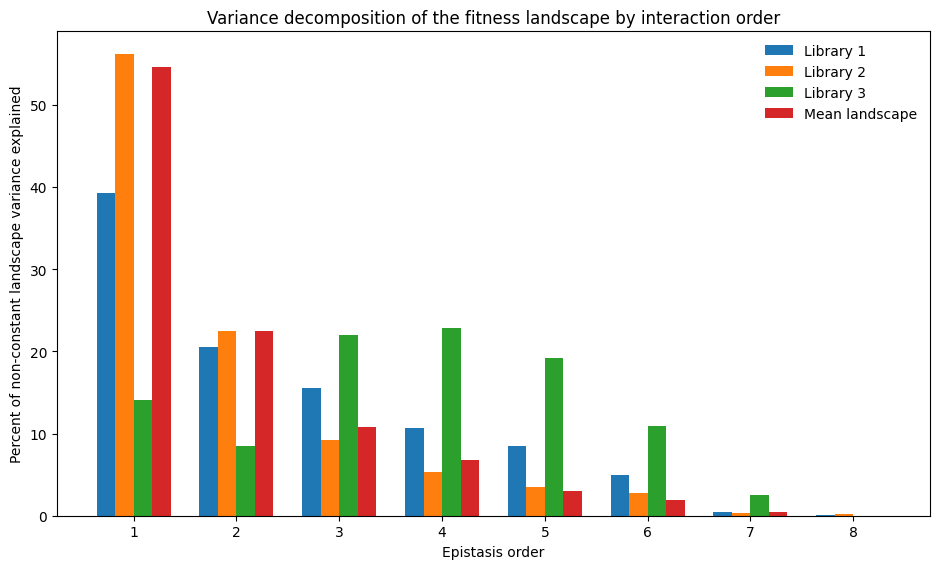

,order,n_terms,sumsq,fraction_of_nonconstant_variance,dataset,percent_variance,cumulative_percent
0,1,8,265.603485,0.392649,Library 1,39.264945,39.264945
1,2,28,139.205380,0.205791,Library 1,20.579141,59.844086
2,3,56,105.222238,0.155553,Library 1,15.555313,75.399399
3,4,70,72.229893,0.106780,Library 1,10.677958,86.077357
4,5,56,57.297349,0.084704,Library 1,8.470436,94.547792
5,6,28,33.095829,0.048927,Library 1,4.892654,99.440446
6,7,8,3.099262,0.004582,Library 1,0.458173,99.898619
7,8,1,0.685779,0.001014,Library 1,0.101381,100.000000
8,1,8,454.189340,0.561136,Library 2,56.113551,56.113551
9,2,28,182.023541,0.224884,Library 2,22.488390,78.601941


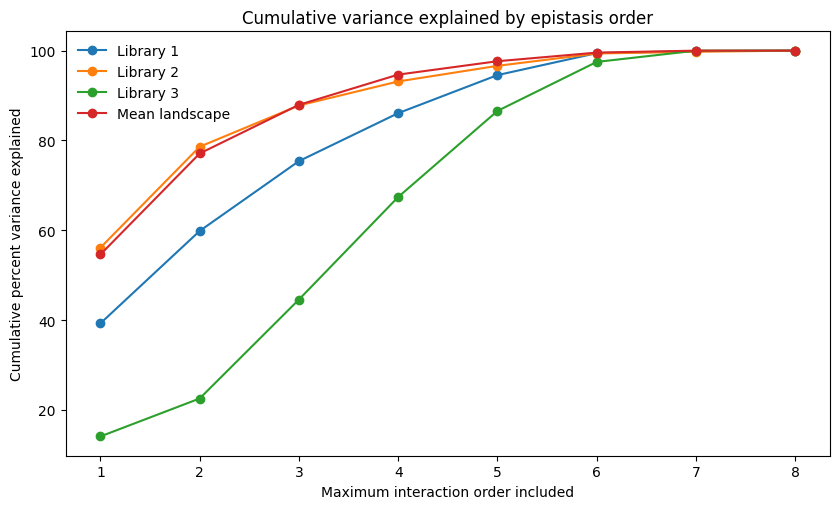

In [433]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re

# --------------------------------------------------
# 0) Input dataframe
# --------------------------------------------------
df = exp_df.copy()

# mutation columns in order
pos_cols = [c for c in df.columns if c.startswith("mut_pos_")]
pos_cols = sorted(pos_cols, key=lambda x: int(x.split("_")[-1]))
n_sites = len(pos_cols)

if n_sites != 8:
    raise ValueError(f"Expected 8 mut_pos_* columns, found {n_sites}")

# build genotype tuple
for c in pos_cols:
    df[c] = df[c].astype(int)
df["geno_key"] = list(map(tuple, df[pos_cols].values))

# --------------------------------------------------
# 1) Detect available libraries dynamically
# --------------------------------------------------
pos_pat = re.compile(r"^log2fc_pos_pre_lib(\d+)$")
neg_pat = re.compile(r"^log2fc_neg_pre_lib(\d+)$")

pos_libs = {int(pos_pat.match(c).group(1)) for c in df.columns if pos_pat.match(c)}
neg_libs = {int(neg_pat.match(c).group(1)) for c in df.columns if neg_pat.match(c)}

libs = sorted(pos_libs & neg_libs)
if not libs:
    raise KeyError("No matching lib-specific log2fc_pos_pre_libX / log2fc_neg_pre_libX columns found.")

print("Detected libraries:", libs)

# Build F_spec per library
for lib in libs:
    df[f"F_spec_lib{lib}"] = (
        df[f"log2fc_pos_pre_lib{lib}"].astype(float)
        - df[f"log2fc_neg_pre_lib{lib}"].astype(float)
    )

# Mean across all available libraries
f_spec_cols = [f"F_spec_lib{lib}" for lib in libs]
df["F_spec_mean"] = df[f_spec_cols].mean(axis=1)

# --------------------------------------------------
# 2) Fast Walsh-Hadamard transform
# --------------------------------------------------
def fwht(x):
    """
    In-place fast Walsh-Hadamard transform.
    Input length must be a power of 2.
    """
    x = np.asarray(x, dtype=float).copy()
    n = x.shape[0]
    h = 1
    while h < n:
        for i in range(0, n, h * 2):
            for j in range(i, i + h):
                a = x[j]
                b = x[j + h]
                x[j] = a + b
                x[j + h] = a - b
        h *= 2
    return x

# --------------------------------------------------
# 3) Build ordered fitness vector for all 256 genotypes
# --------------------------------------------------
def build_ordered_fitness(df, fitness_col, pos_cols):
    """
    Returns fitness vector ordered by binary genotype from 00000000 to 11111111.
    """
    f_map = dict(zip(df["geno_key"], df[fitness_col].astype(float)))

    ordered_genotypes = [
        tuple(int(b) for b in format(i, f"0{len(pos_cols)}b"))
        for i in range(2 ** len(pos_cols))
    ]
    y = np.array([f_map.get(g, np.nan) for g in ordered_genotypes], dtype=float)

    if not np.all(np.isfinite(y)):
        missing = np.sum(~np.isfinite(y))
        raise ValueError(f"{fitness_col}: missing or non-finite values for {missing} genotypes")

    return y, ordered_genotypes

# --------------------------------------------------
# 4) Decompose landscape into epistasis orders
# --------------------------------------------------
def epistasis_order_decomposition(y, n_sites):
    """
    Uses Walsh-Hadamard transform on full binary landscape.

    Returns:
      coeffs: transformed coefficients (orthonormal basis)
      order_df: dataframe with variance contribution by order
    """
    n = len(y)
    if n != 2 ** n_sites:
        raise ValueError("Length of y must be 2^n_sites")

    coeffs = fwht(y) / np.sqrt(n)

    # Hamming weight of each coefficient index = interaction order
    orders = np.array([bin(i).count("1") for i in range(n)])

    # Exclude intercept from variance accounting
    contrib = []
    total_nonzero = np.sum(coeffs[orders > 0] ** 2)

    for k in range(n_sites + 1):
        mask = (orders == k)
        ss = np.sum(coeffs[mask] ** 2)
        frac = np.nan if total_nonzero == 0 else (ss / total_nonzero)
        contrib.append({
            "order": k,
            "n_terms": int(np.sum(mask)),
            "sumsq": float(ss),
            "fraction_of_nonconstant_variance": float(frac) if np.isfinite(frac) else np.nan
        })

    order_df = pd.DataFrame(contrib)
    return coeffs, order_df

# --------------------------------------------------
# 5) Run decomposition for each library and mean
# --------------------------------------------------
results = {}

# individual libraries
for lib in libs:
    fitness_col = f"F_spec_lib{lib}"
    label = f"Library {lib}"
    y, ordered_genotypes = build_ordered_fitness(df, fitness_col, pos_cols)
    coeffs, order_df = epistasis_order_decomposition(y, n_sites)
    order_df["dataset"] = label
    results[label] = {
        "y": y,
        "coeffs": coeffs,
        "order_df": order_df
    }

# mean landscape
y, ordered_genotypes = build_ordered_fitness(df, "F_spec_mean", pos_cols)
coeffs, order_df = epistasis_order_decomposition(y, n_sites)
order_df["dataset"] = "Mean landscape"
results["Mean landscape"] = {
    "y": y,
    "coeffs": coeffs,
    "order_df": order_df
}

# combine tables
order_summary = pd.concat([results[k]["order_df"] for k in results], ignore_index=True)
display(order_summary)

# --------------------------------------------------
# 6) Plot percent variance explained by order
# --------------------------------------------------
plot_df = order_summary.copy()
plot_df["percent_variance"] = 100 * plot_df["fraction_of_nonconstant_variance"]

# usually most useful to exclude order 0 from the bar plot
plot_df_nonzero = plot_df[plot_df["order"] > 0].copy()

datasets = [f"Library {lib}" for lib in libs] + ["Mean landscape"]
orders = sorted(plot_df_nonzero["order"].unique())

x = np.arange(len(orders))
width = 0.18 if len(datasets) >= 4 else 0.25

fig, ax = plt.subplots(figsize=(9.5, 5.8))

# center bars around each order tick
offsets = np.linspace(-(len(datasets)-1)/2, (len(datasets)-1)/2, len(datasets)) * width

for i, ds in enumerate(datasets):
    sub = plot_df_nonzero[plot_df_nonzero["dataset"] == ds].sort_values("order")
    ax.bar(
        x + offsets[i],
        sub["percent_variance"].values,
        width=width,
        label=ds
    )

ax.set_xticks(x)
ax.set_xticklabels(orders)
ax.set_xlabel("Epistasis order")
ax.set_ylabel("Percent of non-constant landscape variance explained")
ax.set_title("Variance decomposition of the fitness landscape by interaction order")
ax.legend(frameon=False)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 7) Optional: cumulative variance explained up to each order
# --------------------------------------------------
cum_rows = []
for ds in datasets:
    sub = plot_df_nonzero[plot_df_nonzero["dataset"] == ds].sort_values("order").copy()
    sub["cumulative_percent"] = sub["percent_variance"].cumsum()
    cum_rows.append(sub)

cum_df = pd.concat(cum_rows, ignore_index=True)
display(cum_df)

fig, ax = plt.subplots(figsize=(8.5, 5.2))
for ds in datasets:
    sub = cum_df[cum_df["dataset"] == ds].sort_values("order")
    ax.plot(sub["order"], sub["cumulative_percent"], marker="o", label=ds)

ax.set_xticks(orders)
ax.set_xlabel("Maximum interaction order included")
ax.set_ylabel("Cumulative percent variance explained")
ax.set_title("Cumulative variance explained by epistasis order")
ax.legend(frameon=False)
plt.tight_layout()
plt.show()

In [440]:
import numpy as np
import pandas as pd

def decode_sites(index, sites):
    bits = format(index, f"0{len(sites)}b")
    return [sites[i] for i, b in enumerate(bits) if b == "1"]

def extract_all_third_order_terms(coeffs, sites):
    rows = []

    for i, c in enumerate(coeffs):
        if bin(i).count("1") != 3:
            continue

        residues = decode_sites(i, sites)
        rows.append({
            "index": i,
            "residues": residues,
            "triplet": "-".join(map(str, residues)),
            "coefficient": float(c),
            "abs_coeff": float(abs(c))
        })

    return pd.DataFrame(rows).sort_values("abs_coeff", ascending=False).reset_index(drop=True)

sites = site_labels

lib_result_keys = sorted(
    [k for k in results.keys() if k.startswith("Library ")],
    key=lambda x: int(x.split()[-1])
)

all3_by_dataset = {}

for key in lib_result_keys + ["Mean landscape"]:
    if key not in results:
        continue
    all3_by_dataset[key] = extract_all_third_order_terms(results[key]["coeffs"], sites)

merged_triplets_full = None

for key in lib_result_keys:
    lib_num = int(key.split()[-1])
    tmp = all3_by_dataset[key][["triplet", "coefficient"]].rename(
        columns={"coefficient": f"coeff_lib{lib_num}"}
    )

    if merged_triplets_full is None:
        merged_triplets_full = tmp
    else:
        merged_triplets_full = merged_triplets_full.merge(tmp, on="triplet", how="outer")

if "Mean landscape" in all3_by_dataset:
    merged_triplets_full = merged_triplets_full.merge(
        all3_by_dataset["Mean landscape"][["triplet", "coefficient"]].rename(
            columns={"coefficient": "coeff_mean"}
        ),
        on="triplet",
        how="outer"
    )

lib_coeff_cols = [c for c in merged_triplets_full.columns if c.startswith("coeff_lib")]

merged_triplets_full["abs_mean_coeff_across_libs"] = (
    merged_triplets_full[lib_coeff_cols].abs().mean(axis=1)
)

merged_triplets_full["n_libs_present"] = merged_triplets_full[lib_coeff_cols].notna().sum(axis=1)

merged_triplets_full["sign_consistency"] = merged_triplets_full[lib_coeff_cols].apply(
    lambda row: np.nan if row.dropna().empty else int(len(set(np.sign(row.dropna()))) == 1),
    axis=1
)

merged_triplets_full = merged_triplets_full.sort_values(
    ["n_libs_present", "abs_mean_coeff_across_libs"],
    ascending=[False, False]
).reset_index(drop=True)

display(merged_triplets_full.head(20))

,triplet,coeff_lib1,coeff_lib2,coeff_lib3,coeff_mean,abs_mean_coeff_across_libs,n_libs_present,sign_consistency
0,498-501-505,2.323647,5.407909,1.412705,3.048087,3.048087,3,1
1,496-498-501,3.289856,3.427263,1.169806,2.628975,2.628975,3,1
2,484-496-505,1.105873,1.125722,3.810006,2.013867,2.013867,3,1
3,493-496-498,-0.471585,0.677596,-3.803787,-1.199259,1.650989,3,0
4,478-484-501,-1.120043,-0.706444,3.101281,0.424931,1.642590,3,0
5,493-496-501,-2.445550,0.172282,2.187220,-0.028683,1.601684,3,0
6,477-493-498,2.162314,-1.327980,-1.314300,-0.159989,1.601531,3,0
7,478-496-498,1.590865,1.803307,1.118896,1.504356,1.504356,3,1
8,496-498-505,-1.120091,-2.040495,1.348214,-0.604124,1.502933,3,0
9,496-501-505,2.860961,-0.557140,0.990121,1.097981,1.469407,3,0


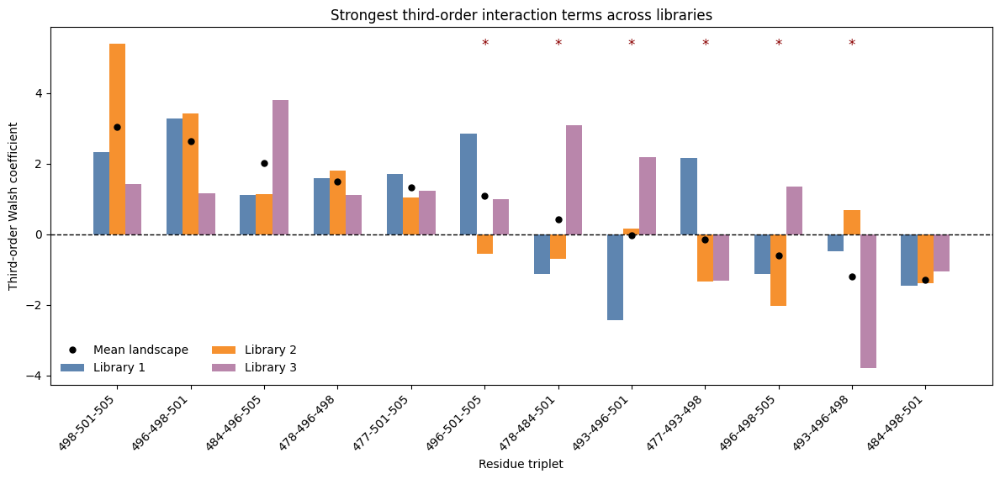

In [451]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ----------------------------------
# Multi-bar plot of top triplets across libraries
# ----------------------------------

plot_df = merged_triplets_full.copy()

# Keep triplets present in all libraries if possible
plot_df = plot_df[plot_df["n_libs_present"] >= 2].copy()

# Rank by average absolute coefficient across libraries
plot_df = plot_df.sort_values("abs_mean_coeff_across_libs", ascending=False).head(12).copy()

# ----------------------------------
# Compute mean coefficient (if not already present)
# ----------------------------------
lib_cols = [c for c in plot_df.columns if c.startswith("coeff_lib")]

plot_df["mean_coeff_across_libs"] = plot_df[lib_cols].mean(axis=1, skipna=True)

# ----------------------------------
# Filter + sort by SIGNED mean (not absolute)
# ----------------------------------
plot_df = plot_df[plot_df["n_libs_present"] >= 2].copy()

plot_df = plot_df.sort_values(
    "mean_coeff_across_libs",
    ascending=False
).head(12).copy()


# X positions
x = np.arange(len(plot_df))
width = 0.22 if len(lib_nums) >= 3 else 0.30
offsets = np.linspace(-(len(lib_nums)-1)/2, (len(lib_nums)-1)/2, len(lib_nums)) * width

# Colors
color_map = {
    1: "#4C78A8",   # blue
    2: "#F58518",   # orange
    3: "#B279A2",   # purple
}

fig, ax = plt.subplots(figsize=(12, 5.8))

# Plot bars for each library
for i, lib in enumerate(lib_nums):
    col = f"coeff_lib{lib}"
    ax.bar(
        x + offsets[i],
        plot_df[col].values,
        width=width,
        label=f"Library {lib}",
        color=color_map.get(lib, None),
        alpha=0.9
    )

# Optional: overlay mean landscape as black points if present
if "coeff_mean" in plot_df.columns:
    ax.plot(
        x,
        plot_df["coeff_mean"].values,
        marker="o",
        linestyle="None",
        color="black",
        markersize=5,
        label="Mean landscape"
    )

# Reference line at zero
ax.axhline(0, linestyle="--", color="black", linewidth=1)

# Labels
ax.set_xticks(x)
ax.set_xticklabels(plot_df["triplet"], rotation=45, ha="right")
ax.set_ylabel("Third-order Walsh coefficient")
ax.set_xlabel("Residue triplet")
ax.set_title("Strongest third-order interaction terms across libraries")

# Optional annotate consistency
for i, row in plot_df.reset_index(drop=True).iterrows():
    if row.get("sign_consistency", np.nan) == 0:
        ax.text(
            i,
            ax.get_ylim()[1] * 0.95,
            "*",
            ha="center",
            va="top",
            fontsize=12,
            color="darkred"
        )

ax.legend(frameon=False, ncol=2)
plt.tight_layout()
plt.show()

In [516]:
import numpy as np
import pandas as pd
import itertools

def compute_triplet_eps(df, fitness_col, sites, triplets):

    pos_cols = [c for c in df.columns if c.startswith("mut_pos_")]
    pos_cols = sorted(pos_cols, key=lambda x: int(x.split("_")[-1]))

    f_map = dict(zip(df["geno_key"], df[fitness_col].astype(float)))

    results = []

    for triplet in triplets:

        i,j,k = [sites.index(x) for x in triplet]

        bg_sites = [x for x in range(len(sites)) if x not in (i,j,k)]

        eps_vals = []

        for bg in itertools.product([0,1], repeat=len(bg_sites)):

            base = [0]*len(sites)

            for idx,val in zip(bg_sites,bg):
                base[idx] = val

            def genotype(a,b,c):

                g = base.copy()
                g[i] = a
                g[j] = b
                g[k] = c

                return tuple(g)

            F000 = f_map.get(genotype(0,0,0), np.nan)
            F100 = f_map.get(genotype(1,0,0), np.nan)
            F010 = f_map.get(genotype(0,1,0), np.nan)
            F001 = f_map.get(genotype(0,0,1), np.nan)
            F110 = f_map.get(genotype(1,1,0), np.nan)
            F101 = f_map.get(genotype(1,0,1), np.nan)
            F011 = f_map.get(genotype(0,1,1), np.nan)
            F111 = f_map.get(genotype(1,1,1), np.nan)

            vals = np.array([F000,F100,F010,F001,F110,F101,F011,F111])

            if not np.all(np.isfinite(vals)):
                continue

            eps = (
                F111
                - F110 - F101 - F011
                + F100 + F010 + F001
                - F000
            )

            eps_vals.append(eps)

        for e in eps_vals:
            results.append({
                "triplet": "-".join(map(str,triplet)),
                "epsilon": e
            })

    return pd.DataFrame(results)

In [517]:
# Select top triplets from mean landscape
top_triplets = top3_by_dataset["Mean landscape"].head(10)["residues"].tolist()

triplet_eps_list = []

for lib in lib_nums:
    tmp = compute_triplet_eps(
        df_trip,
        f"F_spec_lib{lib}",
        site_labels,
        top_triplets
    )
    tmp["library"] = f"Library {lib}"
    triplet_eps_list.append(tmp)

triplet_eps = pd.concat(triplet_eps_list, ignore_index=True)

display(triplet_eps.head())

,triplet,epsilon,library
0,498-501-505,-0.754150,Library 1
1,498-501-505,-5.536800,Library 1
2,498-501-505,-1.528185,Library 1
3,498-501-505,0.317941,Library 1
4,498-501-505,2.061116,Library 1


Detected libraries: [1, 2, 3]


,triplet,avg_median_abs
54,496-501-505,2.284695
55,498-501-505,2.214110
52,496-498-501,2.209381
32,478-496-505,2.152311
51,493-501-505,2.143340
2,477-478-496,2.131394
9,477-484-501,2.130244
24,478-484-501,2.121154
17,477-496-505,2.107193
31,478-496-501,2.102653


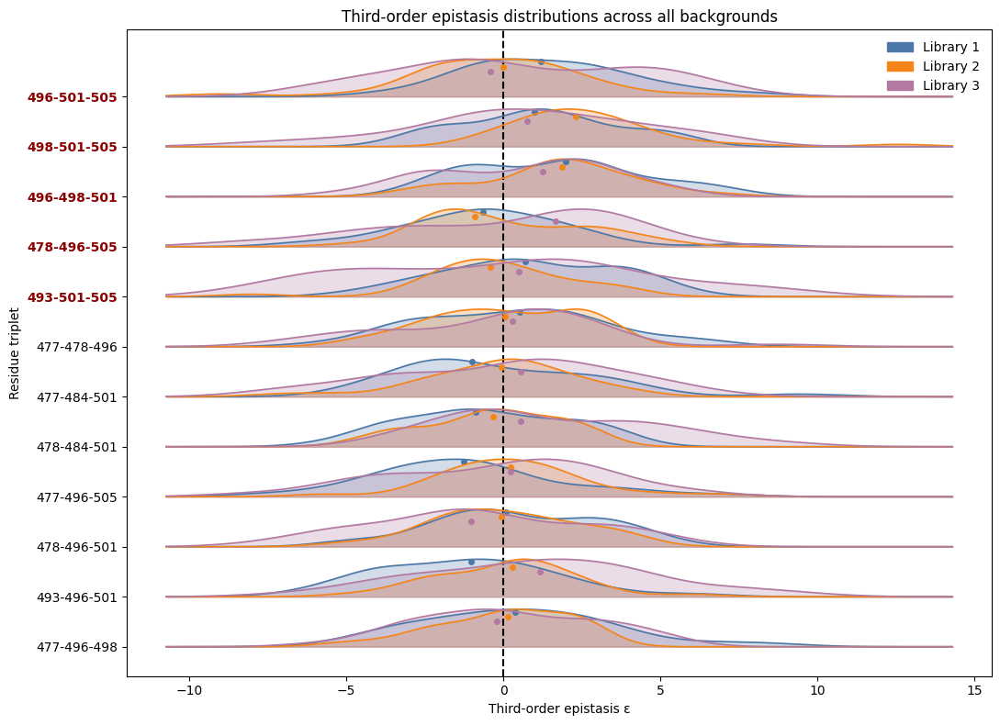

In [518]:
import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import re

# =========================================================
# Ridgeline plot of third-order epistasis distributions
# across backgrounds (ALL LIBRARIES)
# Walsh-consistent sign convention
# =========================================================

df = exp_df.copy()

# ----------------------------
# 1) Mutation columns
# ----------------------------
pos_cols = [c for c in df.columns if c.startswith("mut_pos_")]
pos_cols = sorted(pos_cols, key=lambda x: int(x.split("_")[-1]))

site_labels = [477, 478, 484, 493, 496, 498, 501, 505]

for c in pos_cols:
    df[c] = df[c].astype(int)

df["geno_key"] = list(map(tuple, df[pos_cols].values))

# ----------------------------
# 2) Detect libraries dynamically
# ----------------------------
pos_pat = re.compile(r"log2fc_pos_pre_lib(\d+)")
neg_pat = re.compile(r"log2fc_neg_pre_lib(\d+)")

pos_libs = {int(pos_pat.match(c).group(1)) for c in df.columns if pos_pat.match(c)}
neg_libs = {int(neg_pat.match(c).group(1)) for c in df.columns if neg_pat.match(c)}

libs = sorted(pos_libs & neg_libs)
print("Detected libraries:", libs)

# Build F_spec
for lib in libs:
    df[f"F_spec_lib{lib}"] = (
        df[f"log2fc_pos_pre_lib{lib}"].astype(float)
        - df[f"log2fc_neg_pre_lib{lib}"].astype(float)
    )

# ----------------------------
# 3) Collect triplet eps
# ----------------------------
def collect_triplet_eps(df, fitness_col):
    f_map = dict(zip(df["geno_key"], df[fitness_col].astype(float)))
    idxs = list(range(8))
    out = {}

    for i, j, k in itertools.combinations(idxs, 3):
        bg_idxs = [x for x in idxs if x not in (i, j, k)]
        vals = []

        for bg in itertools.product([0, 1], repeat=len(bg_idxs)):
            base = [0] * 8
            for idx, b in zip(bg_idxs, bg):
                base[idx] = b

            def g(a, b, c):
                gg = base.copy()
                gg[i] = a
                gg[j] = b
                gg[k] = c
                return tuple(gg)

            arr = np.array([
                f_map.get(g(0, 0, 0), np.nan),
                f_map.get(g(1, 0, 0), np.nan),
                f_map.get(g(0, 1, 0), np.nan),
                f_map.get(g(0, 0, 1), np.nan),
                f_map.get(g(1, 1, 0), np.nan),
                f_map.get(g(1, 0, 1), np.nan),
                f_map.get(g(0, 1, 1), np.nan),
                f_map.get(g(1, 1, 1), np.nan),
            ], dtype=float)

            if not np.all(np.isfinite(arr)):
                continue

            F000, F100, F010, F001, F110, F101, F011, F111 = arr

            # Walsh-consistent third-order sign convention
            eps = (
                F000
                - F100 - F010 - F001
                + F110 + F101 + F011
                - F111
            )

            vals.append(eps)

        name = f"{site_labels[i]}-{site_labels[j]}-{site_labels[k]}"
        out[name] = np.array(vals)

    return out

eps_by_lib = {lib: collect_triplet_eps(df, f"F_spec_lib{lib}") for lib in libs}

# ----------------------------
# 4) Ranking
# ----------------------------
rows = []
for triplet in eps_by_lib[libs[0]].keys():
    med_abs = []
    for lib in libs:
        v = eps_by_lib[lib][triplet]
        if v.size > 0:
            med_abs.append(np.median(np.abs(v)))

    rows.append({
        "triplet": triplet,
        "avg_median_abs": np.nanmean(med_abs)
    })

order_df = pd.DataFrame(rows).sort_values("avg_median_abs", ascending=False)

top_n_to_plot = 12
order_df = order_df.head(top_n_to_plot)

triplet_order = order_df["triplet"].tolist()
top_triplets = set(order_df.head(5)["triplet"])

display(order_df)

# ----------------------------
# 5) KDE
# ----------------------------
def kde(x, grid):
    x = x[np.isfinite(x)]
    if len(x) == 0:
        return np.zeros_like(grid)

    bw = max(0.08, 0.9 * np.std(x) * len(x) ** (-1 / 5))
    diff = (grid[:, None] - x[None, :]) / bw
    dens = np.exp(-0.5 * diff**2).sum(axis=1)
    return dens / (len(x) * bw * np.sqrt(2 * np.pi))

# ----------------------------
# 6) Axis
# ----------------------------
all_vals = np.concatenate([
    np.concatenate([eps_by_lib[l][t] for t in triplet_order if eps_by_lib[l][t].size > 0])
    for l in libs
])

xmin, xmax = np.min(all_vals), np.max(all_vals)
pad = 0.08 * (xmax - xmin)
xgrid = np.linspace(xmin - pad, xmax + pad, 500)

# ----------------------------
# 7) Plot
# ----------------------------
colors = {
    1: "#4C78A8",
    2: "#F58518",
    3: "#B279A2"
}

fig, ax = plt.subplots(figsize=(11, max(8, 0.42 * len(triplet_order) + 2)))

ax.axvline(0, linestyle="--", color="black")

y_positions = np.arange(len(triplet_order))[::-1]

for y, t in zip(y_positions, triplet_order):
    for idx, lib in enumerate(libs):
        vals = eps_by_lib[lib][t]
        dens = kde(vals, xgrid)

        if np.max(dens) > 0:
            dens = dens / np.max(dens) * 0.75

        ax.fill_between(
            xgrid, y, y + dens,
            color=colors[lib],
            alpha=0.25
        )

        ax.plot(
            xgrid, y + dens,
            color=colors[lib],
            linewidth=1.2
        )

        if vals.size > 0:
            ax.plot(
                np.median(vals),
                y + 0.7 - idx * 0.1,
                "o",
                color=colors[lib],
                markersize=4
            )

# labels
ax.set_yticks(y_positions)
ax.set_yticklabels(triplet_order)

for tick in ax.get_yticklabels():
    if tick.get_text() in top_triplets:
        tick.set_color("darkred")
        tick.set_fontweight("bold")

ax.set_xlabel("Third-order epistasis ε")
ax.set_ylabel("Residue triplet")
ax.set_title("Third-order epistasis distributions across all backgrounds")

legend = [Patch(color=colors[l], label=f"Library {l}") for l in libs]
ax.legend(handles=legend, frameon=False)

plt.tight_layout()
plt.show()

In [455]:
from collections import Counter

triplets = plot_df["triplet"]

residue_counter = Counter()

for t in triplets:
    residues = list(map(int, t.split("-")))
    residue_counter.update(residues)

print(residue_counter)

Counter({498: 7, 501: 7, 496: 7, 505: 5, 484: 3, 493: 3, 478: 2, 477: 2})


      pair  n_backgrounds_lib1  median_epsilon_lib1  mean_epsilon_lib1  \
0  477-478                  64             0.116780           0.292380   
1  477-484                  64            -0.816608          -0.537754   
2  477-493                  64             0.525392           0.487628   
3  477-496                  64             0.349610           0.299587   
4  477-498                  64            -0.325924          -0.504122   

   median_abs_epsilon_lib1  mean_abs_epsilon_lib1  fraction_positive_lib1  \
0                 1.432260               1.673945                0.562500   
1                 1.600681               1.799958                0.375000   
2                 1.399003               1.838291                0.546875   
3                 1.486637               1.772158                0.531250   
4                 1.333022               1.760879                0.421875   

   n_backgrounds_lib2  median_epsilon_lib2  mean_epsilon_lib2  ...  \
0                  64 

/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/1201836554.py:63: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["eps_bin", "agreement_category"])
/var/folders/9s/h3yngscs12n03bqp6pfrfkzr0000gn/T/ipykernel_95668/1201836554.py:80: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby("eps_bin")


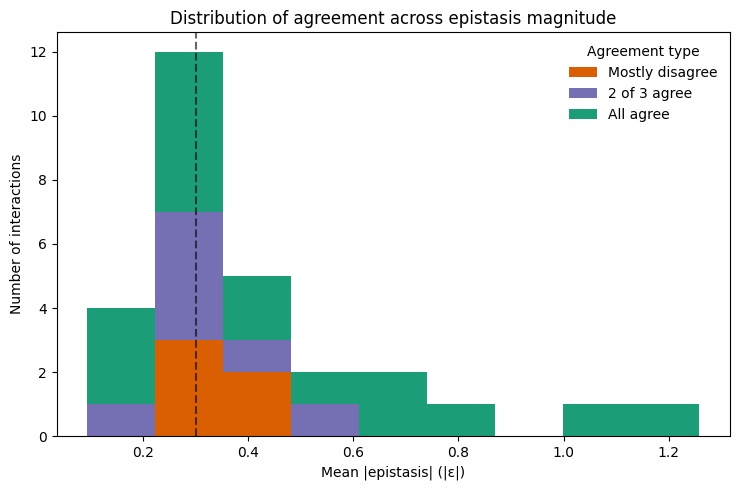

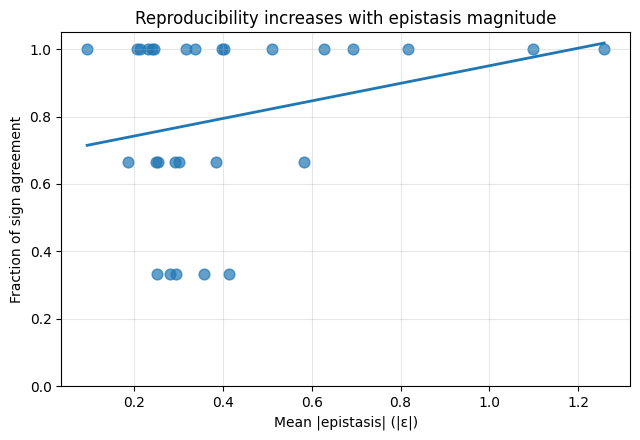

In [467]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

df = merged_pairs.copy()

# Columns for libraries
lib_cols = [c for c in df.columns if c.startswith("median_epsilon_lib")]

# Mean absolute effect size across available libraries
df["mean_abs_eps"] = df[lib_cols].abs().mean(axis=1)

# Function: fraction of agreeing signs (ignores NaNs)
def sign_agreement(row):
    vals = row.dropna()
    if len(vals) < 2:
        return np.nan
    signs = np.sign(vals)
    return np.mean(signs == signs.iloc[0])

df["sign_agreement"] = df[lib_cols].apply(sign_agreement, axis=1)

print(df.head())

# ----------------------------
# Convert discrete sign agreement to categories
# ----------------------------
def agreement_category(x):
    if pd.isna(x):
        return np.nan
    elif np.isclose(x, 1.0):
        return "All agree"
    elif np.isclose(x, 2/3):
        return "2 of 3 agree"
    elif np.isclose(x, 1/3):
        return "Mostly disagree"
    else:
        return "Other"

df["agreement_category"] = df["sign_agreement"].apply(agreement_category)

# ----------------------------
# Fixed-width bins across magnitude
# ----------------------------
n_bins = 7  # adjust if you want slightly more or fewer bins
bin_edges = np.linspace(df["mean_abs_eps"].min(), df["mean_abs_eps"].max(), n_bins + 1)

df["eps_bin"] = pd.cut(
    df["mean_abs_eps"],
    bins=bin_edges,
    include_lowest=True
)

# Make readable bin labels
bin_labels = []
for interval in df["eps_bin"].cat.categories:
    bin_labels.append(f"{interval.left:.2f}–{interval.right:.2f}")

# ----------------------------
# Aggregate counts by magnitude bin and agreement category
# ----------------------------
summary_counts = (
    df.groupby(["eps_bin", "agreement_category"])
      .size()
      .unstack(fill_value=0)
)

# Ensure consistent column order
desired_cols = ["Mostly disagree", "2 of 3 agree", "All agree"]
for c in desired_cols:
    if c not in summary_counts.columns:
        summary_counts[c] = 0
summary_counts = summary_counts[desired_cols]

# Add readable labels as index
summary_counts.index = bin_labels

# Simple summary table
bin_summary = (
    df.groupby("eps_bin")
      .agg(
          count=("pair", "count"),
          mean_eps=("mean_abs_eps", "mean")
      )
      .reset_index()
)
bin_summary["bin_label"] = bin_labels

print(bin_summary)
print(summary_counts)
print(summary_counts.sum(axis=1))

# ----------------------------
# Main figure: stacked count bar plot
# ----------------------------
plt.figure(figsize=(7.5, 5))

# Separate data by category
cats = {
    "Mostly disagree": df[df["agreement_category"] == "Mostly disagree"]["mean_abs_eps"],
    "2 of 3 agree": df[df["agreement_category"] == "2 of 3 agree"]["mean_abs_eps"],
    "All agree": df[df["agreement_category"] == "All agree"]["mean_abs_eps"],
}

# Common bins (important)
bins = np.linspace(df["mean_abs_eps"].min(), df["mean_abs_eps"].max(), 10)

plt.hist(
    list(cats.values()),
    bins=bins,
    stacked=True,
    label=list(cats.keys()),
    color=["#d95f02", "#7570b3", "#1b9e77"]
)

plt.xlabel("Mean |epistasis| (|ε|)")
plt.ylabel("Number of interactions")
plt.title("Distribution of agreement across epistasis magnitude")
plt.axvline(0.3, linestyle="--", color="black", alpha=0.6)

plt.legend(title="Agreement type", frameon=False)
plt.tight_layout()
plt.show()

# ----------------------------
# Optional secondary figure: continuous scatter + trend line
# ----------------------------
plt.figure(figsize=(6.5, 4.5))

plt.scatter(
    df["mean_abs_eps"],
    df["sign_agreement"],
    alpha=0.7,
    s=60
)

# Fit simple trend line
z = np.polyfit(df["mean_abs_eps"], df["sign_agreement"], 1)
p = np.poly1d(z)

x_vals = np.linspace(df["mean_abs_eps"].min(), df["mean_abs_eps"].max(), 100)
plt.plot(x_vals, p(x_vals), linewidth=2)

plt.xlabel("Mean |epistasis| (|ε|)")
plt.ylabel("Fraction of sign agreement")
plt.title("Reproducibility increases with epistasis magnitude")

plt.ylim(0, 1.05)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [473]:
lib_cols = [c for c in df.columns if c.startswith("median_epsilon_lib")]

df["mean_eps"] = df[lib_cols].mean(axis=1)
df["std_eps"] = df[lib_cols].std(axis=1)

df["robustness_score"] = np.abs(df["mean_eps"]) / (df["std_eps"] + 1e-6)

top_pairs = df.sort_values("robustness_score", ascending=False)

top_pairs

,pair,n_backgrounds_lib1,median_epsilon_lib1,mean_epsilon_lib1,median_abs_epsilon_lib1,mean_abs_epsilon_lib1,fraction_positive_lib1,n_backgrounds_lib2,median_epsilon_lib2,mean_epsilon_lib2,...,abs_eps_diff_median_lib1_vs_lib2,abs_eps_diff_median_lib1_vs_lib3,abs_eps_diff_median_lib2_vs_lib3,mean_abs_eps,sign_agreement,agreement_category,eps_bin,mean_eps,std_eps,robustness_score
8,478-493,64,-0.286059,-0.211704,1.121093,1.536390,0.421875,64,-0.349123,-0.273035,...,0.206703,0.222685,0.429389,0.317780,1.000000,All agree,"(0.261, 0.427]",-0.317780,0.031534,10.077214
20,493-501,64,0.660671,1.088364,1.577600,1.861245,0.625000,64,1.129008,1.114327,...,0.356876,0.230478,0.587354,0.816932,1.000000,All agree,"(0.76, 0.926]",0.816932,0.270267,3.022677
4,477-498,64,-0.325924,-0.504122,1.333022,1.760879,0.421875,64,-0.177762,0.065801,...,0.496721,0.339823,0.836543,0.230455,1.000000,All agree,"(0.0934, 0.261]",-0.230455,0.082828,2.782298
26,498-505,64,1.511955,1.521319,1.747468,1.955484,0.781250,64,1.575175,1.853388,...,0.155120,0.106780,0.048340,1.258359,1.000000,All agree,"(1.092, 1.258]",1.258359,0.495002,2.542126
5,477-501,64,-0.521578,-0.711128,1.514277,1.855114,0.406250,64,-0.992196,-0.890646,...,0.209304,0.312846,0.103542,0.628800,1.000000,All agree,"(0.593, 0.76]",-0.628800,0.323402,1.944322
16,484-501,64,-0.183985,0.030775,1.501352,1.560959,0.468750,64,-0.382100,-0.201219,...,0.703102,0.165543,0.868645,0.398719,1.000000,All agree,"(0.261, 0.427]",-0.398719,0.223508,1.783906
27,501-505,64,0.442812,0.148516,1.621686,1.745404,0.578125,64,0.612344,0.795885,...,0.465919,0.309893,0.775812,0.402320,1.000000,All agree,"(0.261, 0.427]",0.402320,0.232925,1.727245
23,496-501,64,1.141585,1.181702,1.749877,2.104788,0.656250,64,1.718910,1.538156,...,0.013825,0.096547,0.110372,1.098547,1.000000,All agree,"(1.092, 1.258]",1.098547,0.642963,1.708567
13,484-493,64,1.011203,0.822422,1.476596,1.708599,0.656250,64,0.867534,0.729439,...,0.435656,0.190970,0.626626,0.692191,1.000000,All agree,"(0.593, 0.76]",0.692191,0.434109,1.594506
21,493-505,64,0.229972,0.197154,1.215922,1.542911,0.531250,64,0.340272,0.576899,...,0.318193,0.678550,0.996744,0.213624,1.000000,All agree,"(0.0934, 0.261]",0.213624,0.135562,1.575825


Top robust pairs:


,pair,mean_eps,std_eps,robustness_score,sign_agreement,agreement_category,mean_abs_eps
0,478-493,-0.317780,0.031534,10.077214,1.0,All agree,0.317780
1,493-501,0.816932,0.270267,3.022677,1.0,All agree,0.816932
2,477-498,-0.230455,0.082828,2.782298,1.0,All agree,0.230455
3,498-505,1.258359,0.495002,2.542126,1.0,All agree,1.258359
4,477-501,-0.628800,0.323402,1.944322,1.0,All agree,0.628800
5,484-501,-0.398719,0.223508,1.783906,1.0,All agree,0.398719



Residue recurrence among top robust pairs:


,residue,count_in_top_pairs
0,501,3
1,477,2
2,493,2
3,498,2
4,478,1
5,484,1
6,505,1



Top set vs rest:


,group,n_pairs,mean_abs_eps_avg,std_eps_avg,robustness_score_avg,fraction_all_agree,fraction_mostly_disagree
0,Top robust pairs,6,0.608507,0.237757,3.692091,1.000000,0.000000
1,Remaining pairs,22,0.358824,0.349113,0.798965,0.454545,0.227273


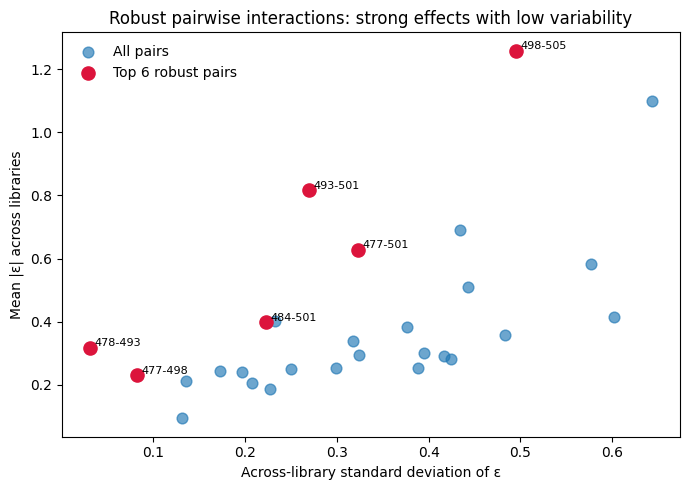

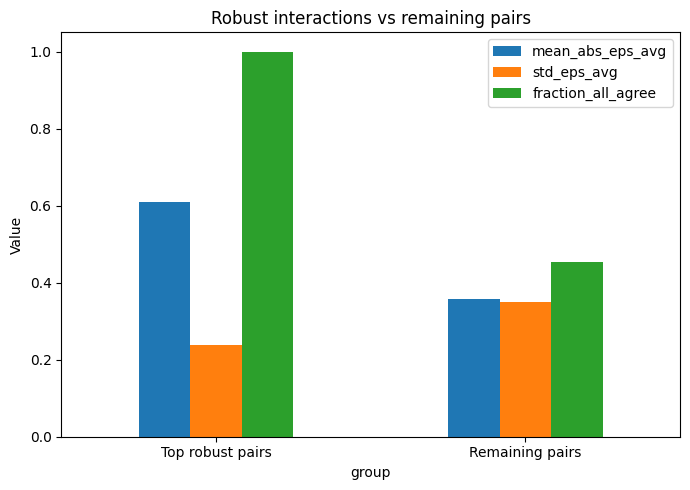


Full ranked list of pairwise interactions:


,pair,mean_eps,mean_abs_eps,std_eps,robustness_score,sign_agreement,agreement_category
0,478-493,-0.317780,0.317780,0.031534,10.077214,1.000000,All agree
1,493-501,0.816932,0.816932,0.270267,3.022677,1.000000,All agree
2,477-498,-0.230455,0.230455,0.082828,2.782298,1.000000,All agree
3,498-505,1.258359,1.258359,0.495002,2.542126,1.000000,All agree
4,477-501,-0.628800,0.628800,0.323402,1.944322,1.000000,All agree
5,484-501,-0.398719,0.398719,0.223508,1.783906,1.000000,All agree
6,501-505,0.402320,0.402320,0.232925,1.727245,1.000000,All agree
7,496-501,1.098547,1.098547,0.642963,1.708567,1.000000,All agree
8,484-493,0.692191,0.692191,0.434109,1.594506,1.000000,All agree
9,493-505,0.213624,0.213624,0.135562,1.575825,1.000000,All agree


In [482]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# --------------------------------------------------
# Interpret robust pairwise interactions
# --------------------------------------------------

df = top_pairs.copy()

# Safety: sort by robustness if not already sorted
df = df.sort_values("robustness_score", ascending=False).reset_index(drop=True)

# --------------------------------------------------
# 1) Define robust top set
# --------------------------------------------------
top_k = 6
robust_pairs = df.head(top_k).copy()
rest_pairs = df.iloc[top_k:].copy()

print("Top robust pairs:")
display(
    robust_pairs[
        [
            "pair",
            "mean_eps",
            "std_eps",
            "robustness_score",
            "sign_agreement",
            "agreement_category",
            "mean_abs_eps"
        ]
    ]
)

# --------------------------------------------------
# 2) Residue recurrence in robust set
# --------------------------------------------------
residue_counter = Counter()

for p in robust_pairs["pair"]:
    residues = list(map(int, p.split("-")))
    residue_counter.update(residues)

residue_df = (
    pd.DataFrame(
        [{"residue": int(k), "count_in_top_pairs": int(v)} for k, v in residue_counter.items()]
    )
    .sort_values(["count_in_top_pairs", "residue"], ascending=[False, True])
    .reset_index(drop=True)
)

print("\nResidue recurrence among top robust pairs:")
display(residue_df)

# --------------------------------------------------
# 3) Compare top set vs rest
# --------------------------------------------------
comparison_df = pd.DataFrame({
    "group": ["Top robust pairs", "Remaining pairs"],
    "n_pairs": [len(robust_pairs), len(rest_pairs)],
    "mean_abs_eps_avg": [
        robust_pairs["mean_abs_eps"].mean(),
        rest_pairs["mean_abs_eps"].mean()
    ],
    "std_eps_avg": [
        robust_pairs["std_eps"].mean(),
        rest_pairs["std_eps"].mean()
    ],
    "robustness_score_avg": [
        robust_pairs["robustness_score"].mean(),
        rest_pairs["robustness_score"].mean()
    ],
    "fraction_all_agree": [
        np.mean(np.isclose(robust_pairs["sign_agreement"], 1.0)),
        np.mean(np.isclose(rest_pairs["sign_agreement"], 1.0))
    ],
    "fraction_mostly_disagree": [
        np.mean(np.isclose(robust_pairs["sign_agreement"], 1/3)),
        np.mean(np.isclose(rest_pairs["sign_agreement"], 1/3))
    ]
})

print("\nTop set vs rest:")
display(comparison_df)

# --------------------------------------------------
# 4) Simple figure: mean effect size vs variability
# --------------------------------------------------
plt.figure(figsize=(7, 5))

# all pairs
plt.scatter(
    df["std_eps"],
    df["mean_abs_eps"],
    alpha=0.65,
    s=60,
    label="All pairs"
)

# highlight top robust pairs
plt.scatter(
    robust_pairs["std_eps"],
    robust_pairs["mean_abs_eps"],
    color="crimson",
    s=90,
    label=f"Top {top_k} robust pairs"
)

# annotate highlighted pairs
for _, row in robust_pairs.iterrows():
    plt.text(
        row["std_eps"] + 0.005,
        row["mean_abs_eps"] + 0.005,
        row["pair"],
        fontsize=8
    )

plt.xlabel("Across-library standard deviation of ε")
plt.ylabel("Mean |ε| across libraries")
plt.title("Robust pairwise interactions: strong effects with low variability")
plt.legend(frameon=False)
plt.tight_layout()
plt.show()

comparison_df.set_index("group")[[
    "mean_abs_eps_avg",
    "std_eps_avg",
    "fraction_all_agree"
]].plot(kind="bar", figsize=(7,5))

plt.ylabel("Value")
plt.title("Robust interactions vs remaining pairs")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 5) Optional export tables
# --------------------------------------------------
# robust_pairs.to_csv("robust_top_pairs.csv", index=False)
# residue_df.to_csv("robust_top_pair_residue_recurrence.csv", index=False)
# comparison_df.to_csv("robust_pairs_vs_rest_summary.csv", index=False)

# --------------------------------------------------
# 6) Full ranked table of all pairwise interactions
# --------------------------------------------------

full_ranked_pairs = (
    df.sort_values(
        ["robustness_score", "mean_abs_eps"],
        ascending=[False, False]
    )
    .reset_index(drop=True)
)

print("\nFull ranked list of pairwise interactions:")
display(
    full_ranked_pairs[
        [
            "pair",
            "mean_eps",
            "mean_abs_eps",
            "std_eps",
            "robustness_score",
            "sign_agreement",
            "agreement_category"
        ]
    ]
)

# Optional: add rank column
full_ranked_pairs["rank"] = np.arange(1, len(full_ranked_pairs) + 1)

# Reorder columns with rank first
full_ranked_pairs = full_ranked_pairs[
    [
        "rank",
        "pair",
        "mean_eps",
        "mean_abs_eps",
        "std_eps",
        "robustness_score",
        "sign_agreement",
        "agreement_category"
    ]
]

# Export (strongly recommended)
full_ranked_pairs.to_csv("all_pairwise_interactions_ranked.csv", index=False)

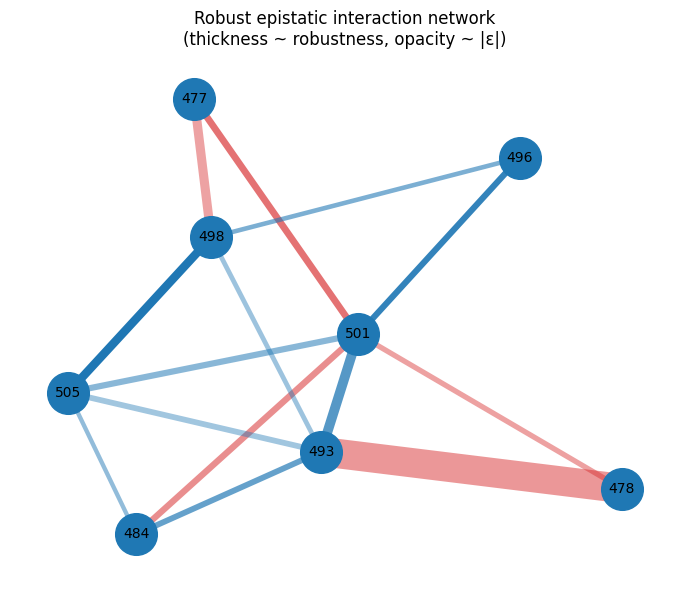

In [481]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.Graph()

# ----------------------------
# Add nodes
# ----------------------------
residues = sorted(set(int(x) for p in df["pair"] for x in p.split("-")))
G.add_nodes_from(residues)

# ----------------------------
# Add edges
# ----------------------------
threshold = 1.0
edges_df = df[df["robustness_score"] >= threshold]

for _, row in edges_df.iterrows():
    r1, r2 = map(int, row["pair"].split("-"))
    
    G.add_edge(
        r1,
        r2,
        magnitude=row["mean_abs_eps"],
        robustness=row["robustness_score"],
        sign=row["mean_eps"]
    )

# ----------------------------
# Layout (purely aesthetic now)
# ----------------------------
pos = nx.spring_layout(G, seed=42)

edges = G.edges(data=True)

# ----------------------------
# Normalize magnitude → opacity
# ----------------------------
max_mag = max(d["magnitude"] for _, _, d in edges)

edge_colors = []
edge_widths = []

for _, _, d in edges:
    # color
    base_color = "#1f77b4" if d["sign"] > 0 else "#d62728"
    
    # normalize opacity (0.3 → 1 range)
    alpha = 0.3 + 0.7 * (d["magnitude"] / max_mag)
    
    edge_colors.append((*plt.matplotlib.colors.to_rgb(base_color), alpha))
    
    # thickness = robustness
    edge_widths.append(1 + 2 * d["robustness"])

# ----------------------------
# Draw
# ----------------------------
plt.figure(figsize=(7,6))

nx.draw_networkx_nodes(G, pos, node_size=900)
nx.draw_networkx_labels(G, pos, font_size=10)

nx.draw_networkx_edges(
    G,
    pos,
    edge_color=edge_colors,
    width=edge_widths
)

plt.title("Robust epistatic interaction network\n(thickness ~ robustness, opacity ~ |ε|)")
plt.axis("off")
plt.tight_layout()
plt.show()

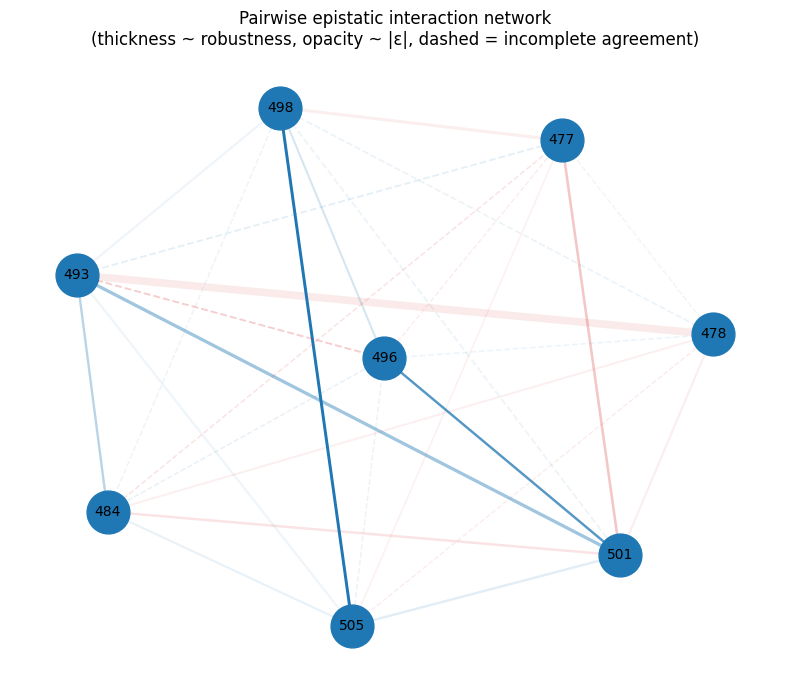

In [483]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# ----------------------------------
# Build graph using ALL pairwise interactions
# ----------------------------------
G = nx.Graph()

# Add nodes
residues = sorted(set(int(x) for p in df["pair"] for x in p.split("-")))
G.add_nodes_from(residues)

# Add all edges
for _, row in df.iterrows():
    r1, r2 = map(int, row["pair"].split("-"))

    G.add_edge(
        r1,
        r2,
        magnitude=row["mean_abs_eps"],
        robustness=row["robustness_score"],
        sign=row["mean_eps"],
        sign_agreement=row["sign_agreement"],
        agreement_category=row["agreement_category"]
    )

# ----------------------------------
# Layout: purely aesthetic
# ----------------------------------
pos = nx.spring_layout(G, seed=42)

edges = list(G.edges(data=True))

# ----------------------------------
# Normalize opacity and thickness
# ----------------------------------
magnitudes = np.array([d["magnitude"] for _, _, d in edges], dtype=float)
robustnesses = np.array([d["robustness"] for _, _, d in edges], dtype=float)

mag_min, mag_max = magnitudes.min(), magnitudes.max()
rob_min, rob_max = robustnesses.min(), robustnesses.max()

def scale_alpha(x, xmin, xmax, a_min=0.08, a_max=1.0, power=1.8):
    """Stronger fade for low-magnitude edges."""
    if xmax == xmin:
        return a_max
    z = (x - xmin) / (xmax - xmin)
    z = max(0.0, min(1.0, z))
    z = z ** power
    return a_min + (a_max - a_min) * z

def scale_width(x, xmin, xmax, w_min=1.0, w_max=5.5):
    if xmax == xmin:
        return (w_min + w_max) / 2
    z = (x - xmin) / (xmax - xmin)
    return w_min + (w_max - w_min) * z

# ----------------------------------
# Split edges by agreement
# ----------------------------------
solid_edges = []
solid_colors = []
solid_widths = []

dashed_edges = []
dashed_colors = []
dashed_widths = []

for u, v, d in edges:
    # blue = positive, red = negative
    base_color = "#1f77b4" if d["sign"] > 0 else "#d62728"
    rgb = mcolors.to_rgb(base_color)

    alpha = scale_alpha(d["magnitude"], mag_min, mag_max, a_min=0.06, a_max=1.0, power=2.0)
    width = scale_width(d["robustness"], rob_min, rob_max, w_min=1.0, w_max=5.5)

    rgba = (*rgb, alpha)

    if np.isclose(d["sign_agreement"], 1.0):
        solid_edges.append((u, v))
        solid_colors.append(rgba)
        solid_widths.append(width)
    else:
        dashed_edges.append((u, v))
        dashed_colors.append(rgba)
        dashed_widths.append(width)

# ----------------------------------
# Draw
# ----------------------------------
plt.figure(figsize=(8, 7))

nx.draw_networkx_nodes(
    G, pos,
    node_size=950
)

nx.draw_networkx_labels(
    G, pos,
    font_size=10
)

# Full-agreement edges: solid
nx.draw_networkx_edges(
    G, pos,
    edgelist=solid_edges,
    edge_color=solid_colors,
    width=solid_widths,
    style="solid"
)

# Partial/disagreeing edges: dashed
nx.draw_networkx_edges(
    G, pos,
    edgelist=dashed_edges,
    edge_color=dashed_colors,
    width=dashed_widths,
    style="dashed"
)

plt.title(
    "Pairwise epistatic interaction network\n"
    "(thickness ~ robustness, opacity ~ |ε|, dashed = incomplete agreement)"
)
plt.axis("off")
plt.tight_layout()
plt.show()